## Import dataset

In [1]:
import pandas as pd

# Importing the dataset
dataset = pd.read_csv('795813_1365687_bundle_archive/input_bcell.csv')

dataset.head()

,parent_protein_id,protein_seq,start_position,end_position,peptide_seq,chou_fasman,emini,kolaskar_tongaonkar,parker,isoelectric_point,aromaticity,hydrophobicity,stability,target
0,A2T3T0,MDVLYSLSKTLKDARDKIVEGTLYSNVSDLIQQFNQMIITMNGNEF...,161,165,SASFT,1.016,0.703,1.018,2.22,5.810364,0.103275,-0.143829,40.273300,1
1,F0V2I4,MTIHKVAINGFGRIGRLLFRNLLSSQGVQVVAVNDVVDIKVLTHLL...,251,255,LCLKI,0.770,0.179,1.199,-3.86,6.210876,0.065476,-0.036905,24.998512,1
2,O75508,MVATCLQVVGFVTSFVGWIGVIVTTSTNDWVVTCGYTIPTCRKLDE...,145,149,AHRET,0.852,3.427,0.960,4.28,8.223938,0.091787,0.879227,27.863333,1
3,O84462,MTNSISGYQPTVTTSTSSTTSASGASGSLGASSVSTTANATVTQTA...,152,156,SNYDD,1.410,2.548,0.936,6.32,4.237976,0.044776,-0.521393,30.765373,1
4,P00918,MSHHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKP...,85,89,DGTYR,1.214,1.908,0.937,4.64,6.867493,0.103846,-0.578846,21.684615,1


## Check columns

In [2]:
dataset.columns

Index(['parent_protein_id', 'protein_seq', 'start_position', 'end_position',
       'peptide_seq', 'chou_fasman', 'emini', 'kolaskar_tongaonkar', 'parker',
       'isoelectric_point', 'aromaticity', 'hydrophobicity', 'stability',
       'target'],
      dtype='object')

## Search for null values

In [3]:
dataset.isnull().sum()

parent_protein_id      0
protein_seq            0
start_position         0
end_position           0
peptide_seq            0
chou_fasman            0
emini                  0
kolaskar_tongaonkar    0
parker                 0
isoelectric_point      0
aromaticity            0
hydrophobicity         0
stability              0
target                 0
dtype: int64

## Search for categorical columns

In [4]:
for col in dataset.columns:
    x = dataset[col].unique()
    if len(x) < 20:
        print(f"{col}: {x}")

target: [1 0]


## Remove irrelevant features and get input data

In [5]:
X = dataset.drop(columns=['parent_protein_id', 'protein_seq', 'peptide_seq', 'target'])
X.head()

,start_position,end_position,chou_fasman,emini,kolaskar_tongaonkar,parker,isoelectric_point,aromaticity,hydrophobicity,stability
0,161,165,1.016,0.703,1.018,2.22,5.810364,0.103275,-0.143829,40.273300
1,251,255,0.770,0.179,1.199,-3.86,6.210876,0.065476,-0.036905,24.998512
2,145,149,0.852,3.427,0.960,4.28,8.223938,0.091787,0.879227,27.863333
3,152,156,1.410,2.548,0.936,6.32,4.237976,0.044776,-0.521393,30.765373
4,85,89,1.214,1.908,0.937,4.64,6.867493,0.103846,-0.578846,21.684615


## Get output data

In [6]:
y = dataset['target']
y.head()

0    1
1    1
2    1
3    1
4    1
Name: target, dtype: int64

## Apply feature scaling

In [7]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(X)

X

array([[-0.3863855 , -0.40451394,  0.17066955, ...,  1.06912809,
         0.66463514, -0.20564963],
       [-0.13195355, -0.15007612, -1.80099114, ..., -0.39782531,
         0.93560006, -1.12130643],
       [-0.43161785, -0.44974733, -1.14377091, ...,  0.62331337,
         3.25724616, -0.9495729 ],
       ...,
       [-0.3072289 , -0.29708464, -1.39223222, ..., -0.15555999,
        -0.7475483 ,  0.19010766],
       [ 3.33962909,  3.34985741,  0.59545824, ..., -1.21820059,
        -0.67131514, -0.8518031 ],
       [ 3.81456874,  3.824808  , -0.26213401, ..., -1.21820059,
        -0.67131514, -0.8518031 ]])

## Split data in training and test sets

In [8]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

## Prepare the ANN model structure

In [9]:
# Imports
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense

# Function that build the structure of the model
def build_classifier(optimizer):
    classifier = Sequential()
    classifier.add(Dense(units = 10, kernel_initializer = 'uniform', activation = 'relu', input_dim = 10))
    classifier.add(Dense(units = 50, kernel_initializer = 'uniform', activation = 'relu'))
    classifier.add(Dense(units = 30, kernel_initializer = 'uniform', activation = 'relu'))
    classifier.add(Dense(units = 20, kernel_initializer = 'uniform', activation = 'relu'))
    classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))
    classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

## Prepare grid search to search best hyperparameters for ANN 

### AND... train all ANN

In [10]:
# create the model
classifier = KerasClassifier(build_fn = build_classifier)

# define parameters (grid) for grid search
#   fit parameters: batch size, epochs
#   compile parameters: optimizer
parameters = {'batch_size': [10, 25, 50],
              'epochs': [100, 300, 500],
              'optimizer': ['adam', 'rmsprop', 'SGD']}

# define the gridsearch
    # cv = number of trainings to apply cross validation
grid_search = GridSearchCV(estimator = classifier,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 10)

# fit all gridsearch combinations
grid_search = grid_search.fit(X_train, y_train)

Epoch 1/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5718 - accuracy: 0.7257
Epoch 2/100
1166/1166 [==============================] - 3s 3ms/step - loss: 0.5563 - accuracy: 0.7257
Epoch 3/100
1166/1166 [==============================] - 3s 2ms/step - loss: 0.5535 - accuracy: 0.7257
Epoch 4/100
1166/1166 [==============================] - 3s 2ms/step - loss: 0.5519 - accuracy: 0.7305
Epoch 5/100
1166/1166 [==============================] - 3s 2ms/step - loss: 0.5514 - accuracy: 0.7329
Epoch 6/100
1166/1166 [==============================] - 3s 2ms/step - loss: 0.5505 - accuracy: 0.7320
Epoch 7/100
1166/1166 [==============================] - 3s 2ms/step - loss: 0.5493 - accuracy: 0.7347
Epoch 8/100
1166/1166 [==============================] - 3s 2ms/step - loss: 0.5482 - accuracy: 0.7379
Epoch 9/100
1166/1166 [==============================] - 3s 2ms/step - loss: 0.5481 - accuracy: 0.7399
Epoch 10/100
1166/1166 [==============================] - 3s 2ms/step - l

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4168 - accuracy: 0.8049
Epoch 80/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4160 - accuracy: 0.8078
Epoch 81/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4166 - accuracy: 0.8070
Epoch 82/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4143 - accuracy: 0.8100
Epoch 83/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4135 - accuracy: 0.8086
Epoch 84/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4100 - accuracy: 0.8116
Epoch 85/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4104 - accuracy: 0.8097
Epoch 86/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4108 - accuracy: 0.8103
Epoch 87/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4096 - accuracy: 0.8109
Epoch 88/100
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4304 - accuracy: 0.8043
Epoch 52/100
1166/1166 [==============================] - 1s 989us/step - loss: 0.4291 - accuracy: 0.8049
Epoch 53/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4257 - accuracy: 0.8075
Epoch 54/100
1166/1166 [==============================] - 1s 995us/step - loss: 0.4244 - accuracy: 0.8104
Epoch 55/100
1166/1166 [==============================] - 1s 993us/step - loss: 0.4240 - accuracy: 0.8115
Epoch 56/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.8119
Epoch 57/100
1166/1166 [==============================] - 1s 984us/step - loss: 0.4221 - accuracy: 0.8110
Epoch 58/100
1166/1166 [==============================] - 1s 996us/step - loss: 0.4207 - accuracy: 0.8090
Epoch 59/100
1166/1166 [==============================] - 1s 995us/step - loss: 0.4200 - accuracy: 0.8109
Epoch 60/100
1166/1166 [==============================] - 1s 999u

1166/1166 [==============================] - 1s 980us/step - loss: 0.4537 - accuracy: 0.7871
Epoch 30/100
1166/1166 [==============================] - 1s 983us/step - loss: 0.4508 - accuracy: 0.7871
Epoch 31/100
1166/1166 [==============================] - 1s 975us/step - loss: 0.4491 - accuracy: 0.7911
Epoch 32/100
1166/1166 [==============================] - 1s 976us/step - loss: 0.4480 - accuracy: 0.7896
Epoch 33/100
1166/1166 [==============================] - 1s 978us/step - loss: 0.4474 - accuracy: 0.7899
Epoch 34/100
1166/1166 [==============================] - 1s 992us/step - loss: 0.4457 - accuracy: 0.7934
Epoch 35/100
1166/1166 [==============================] - 1s 983us/step - loss: 0.4447 - accuracy: 0.7903
Epoch 36/100
1166/1166 [==============================] - 1s 972us/step - loss: 0.4403 - accuracy: 0.7924
Epoch 37/100
1166/1166 [==============================] - 1s 999us/step - loss: 0.4416 - accuracy: 0.7936
Epoch 38/100
1166/1166 [==============================] - 1

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5470 - accuracy: 0.7275
Epoch 7/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5445 - accuracy: 0.7320
Epoch 8/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5418 - accuracy: 0.7371
Epoch 9/100
1166/1166 [==============================] - 1s 973us/step - loss: 0.5388 - accuracy: 0.7367
Epoch 10/100
1166/1166 [==============================] - 1s 990us/step - loss: 0.5314 - accuracy: 0.7384
Epoch 11/100
1166/1166 [==============================] - 1s 979us/step - loss: 0.5275 - accuracy: 0.7392
Epoch 12/100
1166/1166 [==============================] - 1s 980us/step - loss: 0.5215 - accuracy: 0.7427
Epoch 13/100
1166/1166 [==============================] - 1s 996us/step - loss: 0.5175 - accuracy: 0.7443
Epoch 14/100
1166/1166 [==============================] - 1s 982us/step - loss: 0.5130 - accuracy: 0.7498
Epoch 15/100
1166/1166 [==============================] - 1s 980us/s

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3955 - accuracy: 0.8199
Epoch 85/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3919 - accuracy: 0.8215
Epoch 86/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3929 - accuracy: 0.8200
Epoch 87/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3936 - accuracy: 0.8182
Epoch 88/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3928 - accuracy: 0.8194
Epoch 89/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3913 - accuracy: 0.8207
Epoch 90/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3890 - accuracy: 0.8199
Epoch 91/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3877 - accuracy: 0.8243
Epoch 92/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3892 - accuracy: 0.8235
Epoch 93/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 63/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4025 - accuracy: 0.8140
Epoch 64/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4019 - accuracy: 0.8152
Epoch 65/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4005 - accuracy: 0.8154
Epoch 66/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4001 - accuracy: 0.8182
Epoch 67/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3980 - accuracy: 0.8155
Epoch 68/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3992 - accuracy: 0.8175
Epoch 69/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3974 - accuracy: 0.8196
Epoch 70/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3962 - accuracy: 0.8199
Epoch 71/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3963 - accuracy: 0.8194
Epoch 72/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 2s 1ms/step - loss: 0.4188 - accuracy: 0.8033
Epoch 42/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4182 - accuracy: 0.8049
Epoch 43/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4155 - accuracy: 0.8055
Epoch 44/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4150 - accuracy: 0.8091
Epoch 45/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4137 - accuracy: 0.8072
Epoch 46/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4123 - accuracy: 0.8091
Epoch 47/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4117 - accuracy: 0.8090
Epoch 48/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4080 - accuracy: 0.8100
Epoch 49/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4065 - accuracy: 0.8127
Epoch 50/100
1166/1166 [==============================] - 2s 1ms/step - loss:

Epoch 20/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4965 - accuracy: 0.7605
Epoch 21/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4918 - accuracy: 0.7628
Epoch 22/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4908 - accuracy: 0.7644
Epoch 23/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4873 - accuracy: 0.7674
Epoch 24/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4863 - accuracy: 0.7666
Epoch 25/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4852 - accuracy: 0.7695
Epoch 26/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4833 - accuracy: 0.7636
Epoch 27/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4807 - accuracy: 0.7719
Epoch 28/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4784 - accuracy: 0.7712
Epoch 29/100
1166/1166 [==============================] - 2s 1ms

1166/1166 [==============================] - 2s 1ms/step - loss: 0.4058 - accuracy: 0.8181
Epoch 99/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4049 - accuracy: 0.8180
Epoch 100/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4031 - accuracy: 0.8163
Epoch 1/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.5663 - accuracy: 0.7275
Epoch 2/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.5509 - accuracy: 0.7278
Epoch 3/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5479 - accuracy: 0.7278
Epoch 4/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5447 - accuracy: 0.7278
Epoch 5/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.5433 - accuracy: 0.7295
Epoch 6/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5405 - accuracy: 0.7314
Epoch 7/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.537

Epoch 77/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4272 - accuracy: 0.7861
Epoch 78/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4267 - accuracy: 0.7876
Epoch 79/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4244 - accuracy: 0.7880
Epoch 80/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4230 - accuracy: 0.7910
Epoch 81/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4238 - accuracy: 0.7900
Epoch 82/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4256 - accuracy: 0.7894
Epoch 83/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4230 - accuracy: 0.7885
Epoch 84/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4241 - accuracy: 0.7885
Epoch 85/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4221 - accuracy: 0.7922
Epoch 86/100
1166/1166 [==============================] - 2s 2ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.7972
Epoch 56/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4204 - accuracy: 0.7988
Epoch 57/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4193 - accuracy: 0.7995
Epoch 58/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4168 - accuracy: 0.7979
Epoch 59/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4183 - accuracy: 0.8011
Epoch 60/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4155 - accuracy: 0.8013
Epoch 61/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4152 - accuracy: 0.8005
Epoch 62/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4143 - accuracy: 0.7981
Epoch 63/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4143 - accuracy: 0.7996
Epoch 64/100
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4577 - accuracy: 0.7811
Epoch 34/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4552 - accuracy: 0.7844
Epoch 35/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4529 - accuracy: 0.7848
Epoch 36/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4509 - accuracy: 0.7852
Epoch 37/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7863
Epoch 38/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4464 - accuracy: 0.7891
Epoch 39/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4476 - accuracy: 0.7868
Epoch 40/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4434 - accuracy: 0.7917
Epoch 41/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4413 - accuracy: 0.7887
Epoch 42/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 12/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5464 - accuracy: 0.7382
Epoch 13/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5427 - accuracy: 0.7416
Epoch 14/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5414 - accuracy: 0.7421
Epoch 15/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5383 - accuracy: 0.7414
Epoch 16/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5356 - accuracy: 0.7426
Epoch 17/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5339 - accuracy: 0.7442
Epoch 18/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5298 - accuracy: 0.7472
Epoch 19/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5231 - accuracy: 0.7522
Epoch 20/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5183 - accuracy: 0.7511
Epoch 21/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3947 - accuracy: 0.8223
Epoch 91/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3939 - accuracy: 0.8166
Epoch 92/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3939 - accuracy: 0.8188
Epoch 93/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3922 - accuracy: 0.8205
Epoch 94/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3918 - accuracy: 0.8212
Epoch 95/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3899 - accuracy: 0.8224
Epoch 96/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3897 - accuracy: 0.8240
Epoch 97/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3918 - accuracy: 0.8212
Epoch 98/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3913 - accuracy: 0.8205
Epoch 99/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 69/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4077 - accuracy: 0.8067
Epoch 70/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4066 - accuracy: 0.8091
Epoch 71/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4050 - accuracy: 0.8049
Epoch 72/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4046 - accuracy: 0.8091
Epoch 73/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4045 - accuracy: 0.8089
Epoch 74/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4039 - accuracy: 0.8093
Epoch 75/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4018 - accuracy: 0.8132
Epoch 76/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3997 - accuracy: 0.8110
Epoch 77/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3987 - accuracy: 0.8106
Epoch 78/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - ETA: 0s - loss: 0.4222 - accuracy: 0.79 - 1s 1ms/step - loss: 0.4219 - accuracy: 0.7964
Epoch 48/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.7954
Epoch 49/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4192 - accuracy: 0.7977
Epoch 50/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4185 - accuracy: 0.8008
Epoch 51/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4166 - accuracy: 0.7991
Epoch 52/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4168 - accuracy: 0.7979
Epoch 53/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4147 - accuracy: 0.8011
Epoch 54/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4142 - accuracy: 0.7993
Epoch 55/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4108 - accuracy: 0.8029
Epoch 56/100
1166/1166 [===========

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4857 - accuracy: 0.7730
Epoch 26/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4830 - accuracy: 0.7722
Epoch 27/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4808 - accuracy: 0.7753
Epoch 28/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4779 - accuracy: 0.7753
Epoch 29/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4775 - accuracy: 0.7740
Epoch 30/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4758 - accuracy: 0.7729
Epoch 31/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4720 - accuracy: 0.7753
Epoch 32/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4715 - accuracy: 0.7799
Epoch 33/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4691 - accuracy: 0.7781
Epoch 34/100
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5541 - accuracy: 0.7255
Epoch 4/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5513 - accuracy: 0.7255
Epoch 5/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5493 - accuracy: 0.7308
Epoch 6/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5478 - accuracy: 0.7330
Epoch 7/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5461 - accuracy: 0.7371
Epoch 8/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5439 - accuracy: 0.7370
Epoch 9/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5414 - accuracy: 0.7403
Epoch 10/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5385 - accuracy: 0.7423
Epoch 11/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5349 - accuracy: 0.7387
Epoch 12/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.525

Epoch 82/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3872 - accuracy: 0.8241
Epoch 83/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3879 - accuracy: 0.8236
Epoch 84/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3855 - accuracy: 0.8248
Epoch 85/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3841 - accuracy: 0.8283
Epoch 86/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3840 - accuracy: 0.8290
Epoch 87/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3852 - accuracy: 0.8269
Epoch 88/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3832 - accuracy: 0.8307
Epoch 89/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3834 - accuracy: 0.8299
Epoch 90/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3808 - accuracy: 0.8309
Epoch 91/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3970 - accuracy: 0.8214
Epoch 61/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3954 - accuracy: 0.8222
Epoch 62/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3941 - accuracy: 0.8229
Epoch 63/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3950 - accuracy: 0.8210
Epoch 64/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3917 - accuracy: 0.8225
Epoch 65/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3904 - accuracy: 0.8248
Epoch 66/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3900 - accuracy: 0.8234
Epoch 67/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3880 - accuracy: 0.8298
Epoch 68/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3878 - accuracy: 0.8269
Epoch 69/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 39/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4470 - accuracy: 0.7813
Epoch 40/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4446 - accuracy: 0.7832
Epoch 41/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4439 - accuracy: 0.7825
Epoch 42/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4435 - accuracy: 0.7837
Epoch 43/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4423 - accuracy: 0.7852
Epoch 44/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4392 - accuracy: 0.7853
Epoch 45/100
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4364 - accuracy: 0.7877
Epoch 46/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4374 - accuracy: 0.7892
Epoch 47/100
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4345 - accuracy: 0.7898
Epoch 48/100
1166/1166 [==============================] - 2s 2ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4775 - accuracy: 0.7650
Epoch 18/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4727 - accuracy: 0.7650
Epoch 19/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4694 - accuracy: 0.7664
Epoch 20/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4660 - accuracy: 0.7676
Epoch 21/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4626 - accuracy: 0.7699
Epoch 22/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4594 - accuracy: 0.7725
Epoch 23/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4589 - accuracy: 0.7723
Epoch 24/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4555 - accuracy: 0.7715
Epoch 25/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4522 - accuracy: 0.7751
Epoch 26/100
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8303
Epoch 96/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3707 - accuracy: 0.8305
Epoch 97/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3688 - accuracy: 0.8317
Epoch 98/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3714 - accuracy: 0.8288
Epoch 99/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3708 - accuracy: 0.8284
Epoch 100/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3684 - accuracy: 0.8292
Epoch 1/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5678 - accuracy: 0.7258
Epoch 2/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5554 - accuracy: 0.7266
Epoch 3/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5525 - accuracy: 0.7266
Epoch 4/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.

Epoch 74/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4133 - accuracy: 0.8086
Epoch 75/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4124 - accuracy: 0.8096
Epoch 76/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4103 - accuracy: 0.8129
Epoch 77/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4073 - accuracy: 0.8130
Epoch 78/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4094 - accuracy: 0.8130
Epoch 79/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4052 - accuracy: 0.8173
Epoch 80/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4061 - accuracy: 0.8134
Epoch 81/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4033 - accuracy: 0.8163
Epoch 82/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4021 - accuracy: 0.8199
Epoch 83/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4322 - accuracy: 0.7953
Epoch 53/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4315 - accuracy: 0.7961
Epoch 54/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.7953
Epoch 55/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4276 - accuracy: 0.7994
Epoch 56/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7966
Epoch 57/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4265 - accuracy: 0.7987
Epoch 58/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4250 - accuracy: 0.8020
Epoch 59/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4248 - accuracy: 0.8017
Epoch 60/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.7993
Epoch 61/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 31/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7781
Epoch 32/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4544 - accuracy: 0.7800
Epoch 33/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4550 - accuracy: 0.7781
Epoch 34/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4534 - accuracy: 0.7787
Epoch 35/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4504 - accuracy: 0.7825
Epoch 36/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4500 - accuracy: 0.7825
Epoch 37/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4471 - accuracy: 0.7834
Epoch 38/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4471 - accuracy: 0.7820
Epoch 39/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4437 - accuracy: 0.7859
Epoch 40/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5085 - accuracy: 0.7426
Epoch 10/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4981 - accuracy: 0.7477
Epoch 11/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4895 - accuracy: 0.7523
Epoch 12/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4807 - accuracy: 0.7572
Epoch 13/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4764 - accuracy: 0.7583
Epoch 14/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4752 - accuracy: 0.7627
Epoch 15/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4713 - accuracy: 0.7587
Epoch 16/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4700 - accuracy: 0.7665
Epoch 17/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4691 - accuracy: 0.7618
Epoch 18/100
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3835 - accuracy: 0.8249
Epoch 88/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3809 - accuracy: 0.8226
Epoch 89/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3827 - accuracy: 0.8266
Epoch 90/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3811 - accuracy: 0.8261
Epoch 91/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3772 - accuracy: 0.8268
Epoch 92/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3786 - accuracy: 0.8269
Epoch 93/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3788 - accuracy: 0.8268
Epoch 94/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8287
Epoch 95/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3797 - accuracy: 0.8260
Epoch 96/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 66/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4303 - accuracy: 0.7962
Epoch 67/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4298 - accuracy: 0.7968
Epoch 68/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4296 - accuracy: 0.7975
Epoch 69/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4271 - accuracy: 0.7961
Epoch 70/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.7958
Epoch 71/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4252 - accuracy: 0.7975
Epoch 72/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4245 - accuracy: 0.7984
Epoch 73/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.7990
Epoch 74/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4203 - accuracy: 0.8023
Epoch 75/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.7892
Epoch 45/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4293 - accuracy: 0.7885
Epoch 46/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4267 - accuracy: 0.7904
Epoch 47/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4279 - accuracy: 0.7901
Epoch 48/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4246 - accuracy: 0.7962
Epoch 49/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4238 - accuracy: 0.7968
Epoch 50/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4217 - accuracy: 0.7976
Epoch 51/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4200 - accuracy: 0.8010
Epoch 52/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4186 - accuracy: 0.7990
Epoch 53/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 23/100
1166/1166 [==============================] - 1s 997us/step - loss: 0.4633 - accuracy: 0.7765
Epoch 24/100
1166/1166 [==============================] - 1s 995us/step - loss: 0.4609 - accuracy: 0.7764
Epoch 25/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4591 - accuracy: 0.7780
Epoch 26/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4583 - accuracy: 0.7795
Epoch 27/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4560 - accuracy: 0.7774
Epoch 28/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4554 - accuracy: 0.7822
Epoch 29/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4538 - accuracy: 0.7825
Epoch 30/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4535 - accuracy: 0.7813
Epoch 31/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4507 - accuracy: 0.7824
Epoch 32/100
1166/1166 [==============================] - 1s

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5669 - accuracy: 0.7277
Epoch 2/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5521 - accuracy: 0.7280
Epoch 3/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5484 - accuracy: 0.7280
Epoch 4/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5461 - accuracy: 0.7280
Epoch 5/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5441 - accuracy: 0.7280
Epoch 6/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5433 - accuracy: 0.7280
Epoch 7/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5412 - accuracy: 0.7282
Epoch 8/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5385 - accuracy: 0.7336
Epoch 9/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5344 - accuracy: 0.7365
Epoch 10/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5289 

Epoch 80/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3703 - accuracy: 0.8327
Epoch 81/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3684 - accuracy: 0.8321
Epoch 82/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3682 - accuracy: 0.8324
Epoch 83/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3662 - accuracy: 0.8336
Epoch 84/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3684 - accuracy: 0.8326
Epoch 85/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3662 - accuracy: 0.8337
Epoch 86/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3648 - accuracy: 0.8333
Epoch 87/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3659 - accuracy: 0.8339
Epoch 88/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3640 - accuracy: 0.8324
Epoch 89/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3866 - accuracy: 0.8251
Epoch 59/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3853 - accuracy: 0.8270
Epoch 60/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3851 - accuracy: 0.8243
Epoch 61/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3853 - accuracy: 0.8241
Epoch 62/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3832 - accuracy: 0.8256
Epoch 63/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3835 - accuracy: 0.8279
Epoch 64/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3828 - accuracy: 0.8242
Epoch 65/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3818 - accuracy: 0.8292
Epoch 66/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3802 - accuracy: 0.8282
Epoch 67/100
1166/1166 [==============================] - 1s 1ms/step - loss:

Epoch 37/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4385 - accuracy: 0.7898
Epoch 38/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4357 - accuracy: 0.7908
Epoch 39/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4354 - accuracy: 0.7943
Epoch 40/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4343 - accuracy: 0.7970
Epoch 41/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.7946
Epoch 42/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4322 - accuracy: 0.7958
Epoch 43/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4308 - accuracy: 0.7975
Epoch 44/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4301 - accuracy: 0.7978
Epoch 45/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4270 - accuracy: 0.7966
Epoch 46/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5463 - accuracy: 0.7405
Epoch 16/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5450 - accuracy: 0.7402
Epoch 17/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5425 - accuracy: 0.7420
Epoch 18/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5362 - accuracy: 0.7442
Epoch 19/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5243 - accuracy: 0.7497
Epoch 20/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5136 - accuracy: 0.7586
Epoch 21/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5062 - accuracy: 0.7617
Epoch 22/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4998 - accuracy: 0.7634
Epoch 23/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4888 - accuracy: 0.7671
Epoch 24/100
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3936 - accuracy: 0.8197
Epoch 94/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3949 - accuracy: 0.8190
Epoch 95/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3919 - accuracy: 0.8208
Epoch 96/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3936 - accuracy: 0.8192
Epoch 97/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3935 - accuracy: 0.8213
Epoch 98/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3928 - accuracy: 0.8187
Epoch 99/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3911 - accuracy: 0.8216
Epoch 100/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3917 - accuracy: 0.8251
Epoch 1/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5659 - accuracy: 0.7279
Epoch 2/100
1166/1166 [==============================] - 1s 1ms/step - loss: 

Epoch 72/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4032 - accuracy: 0.8123
Epoch 73/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4033 - accuracy: 0.8126
Epoch 74/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4009 - accuracy: 0.8141
Epoch 75/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4030 - accuracy: 0.8151
Epoch 76/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4008 - accuracy: 0.8130
Epoch 77/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4006 - accuracy: 0.8162
Epoch 78/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3980 - accuracy: 0.8165
Epoch 79/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3968 - accuracy: 0.8151
Epoch 80/100
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3964 - accuracy: 0.8165
Epoch 81/100
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4137 - accuracy: 0.8053
Epoch 51/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4111 - accuracy: 0.8043
Epoch 52/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4106 - accuracy: 0.8057
Epoch 53/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4082 - accuracy: 0.8072
Epoch 54/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4102 - accuracy: 0.8043
Epoch 55/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4058 - accuracy: 0.8085
Epoch 56/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4065 - accuracy: 0.8097
Epoch 57/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4053 - accuracy: 0.8057
Epoch 58/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4035 - accuracy: 0.8085
Epoch 59/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3578 - accuracy: 0.8351
Epoch 129/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3576 - accuracy: 0.8335
Epoch 130/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3562 - accuracy: 0.8344
Epoch 131/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3556 - accuracy: 0.8354
Epoch 132/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3544 - accuracy: 0.8352
Epoch 133/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3556 - accuracy: 0.8345
Epoch 134/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3556 - accuracy: 0.8333
Epoch 135/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3547 - accuracy: 0.8335
Epoch 136/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3541 - accuracy: 0.8354
Epoch 137/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3270 - accuracy: 0.8485
Epoch 207/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3298 - accuracy: 0.8489
Epoch 208/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3298 - accuracy: 0.8483
Epoch 209/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3268 - accuracy: 0.8501
Epoch 210/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3285 - accuracy: 0.8513
Epoch 211/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3272 - accuracy: 0.8507
Epoch 212/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3276 - accuracy: 0.8527
Epoch 213/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3246 - accuracy: 0.8516
Epoch 214/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3279 - accuracy: 0.8521
Epoch 215/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3139 - accuracy: 0.8573
Epoch 285/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3113 - accuracy: 0.8589
Epoch 286/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3109 - accuracy: 0.8581
Epoch 287/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3118 - accuracy: 0.8602
Epoch 288/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3149 - accuracy: 0.8575
Epoch 289/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3113 - accuracy: 0.8614
Epoch 290/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3106 - accuracy: 0.8576
Epoch 291/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3130 - accuracy: 0.8554
Epoch 292/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3109 - accuracy: 0.8608
Epoch 293/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.7971
Epoch 63/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4242 - accuracy: 0.7986
Epoch 64/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4240 - accuracy: 0.7988
Epoch 65/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4232 - accuracy: 0.7994
Epoch 66/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4195 - accuracy: 0.8051
Epoch 67/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4172 - accuracy: 0.8047
Epoch 68/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4184 - accuracy: 0.8019
Epoch 69/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4165 - accuracy: 0.8045
Epoch 70/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4139 - accuracy: 0.8055
Epoch 71/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3723 - accuracy: 0.8301
Epoch 141/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3728 - accuracy: 0.8302
Epoch 142/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3746 - accuracy: 0.8268
Epoch 143/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3727 - accuracy: 0.8252
Epoch 144/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3716 - accuracy: 0.8321
Epoch 145/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3713 - accuracy: 0.8308
Epoch 146/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3711 - accuracy: 0.8302
Epoch 147/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3739 - accuracy: 0.8297
Epoch 148/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3696 - accuracy: 0.8338
Epoch 149/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3551 - accuracy: 0.8364
Epoch 218/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3542 - accuracy: 0.8373
Epoch 219/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3539 - accuracy: 0.8382
Epoch 220/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3529 - accuracy: 0.8391
Epoch 221/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3531 - accuracy: 0.8382
Epoch 222/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3534 - accuracy: 0.8382
Epoch 223/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8402
Epoch 224/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3522 - accuracy: 0.8393
Epoch 225/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3511 - accuracy: 0.8412
Epoch 226/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3418 - accuracy: 0.8440
Epoch 295/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3430 - accuracy: 0.8417
Epoch 296/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3410 - accuracy: 0.8426
Epoch 297/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3406 - accuracy: 0.8457
Epoch 298/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8448
Epoch 299/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3419 - accuracy: 0.8443
Epoch 300/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3429 - accuracy: 0.8427
Epoch 1/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5669 - accuracy: 0.7271
Epoch 2/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5538 - accuracy: 0.7271
Epoch 3/300
1166/1166 [==============================] - 1s 1ms/step - lo

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4091 - accuracy: 0.8162
Epoch 73/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4067 - accuracy: 0.8194
Epoch 74/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4064 - accuracy: 0.8179
Epoch 75/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4049 - accuracy: 0.8171
Epoch 76/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4047 - accuracy: 0.8183
Epoch 77/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4015 - accuracy: 0.8191
Epoch 78/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4021 - accuracy: 0.8197
Epoch 79/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4049 - accuracy: 0.8193
Epoch 80/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4004 - accuracy: 0.8221
Epoch 81/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3666 - accuracy: 0.8424
Epoch 151/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8406
Epoch 152/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3648 - accuracy: 0.8419
Epoch 153/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3645 - accuracy: 0.8412
Epoch 154/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3624 - accuracy: 0.8400
Epoch 155/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8429
Epoch 156/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3627 - accuracy: 0.8424
Epoch 157/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3635 - accuracy: 0.8460
Epoch 158/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3626 - accuracy: 0.8413
Epoch 159/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3424 - accuracy: 0.8528
Epoch 228/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3450 - accuracy: 0.8515
Epoch 229/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3429 - accuracy: 0.8499
Epoch 230/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3423 - accuracy: 0.8497
Epoch 231/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3414 - accuracy: 0.8530
Epoch 232/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3424 - accuracy: 0.8515
Epoch 233/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3421 - accuracy: 0.8515
Epoch 234/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3398 - accuracy: 0.8523
Epoch 235/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3420 - accuracy: 0.8515
Epoch 236/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5390 - accuracy: 0.7307
Epoch 6/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.5343 - accuracy: 0.7398
Epoch 7/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5314 - accuracy: 0.7389
Epoch 8/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5262 - accuracy: 0.7386
Epoch 9/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5197 - accuracy: 0.7386
Epoch 10/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5114 - accuracy: 0.7465
Epoch 11/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5027 - accuracy: 0.7475
Epoch 12/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4975 - accuracy: 0.7504
Epoch 13/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4915 - accuracy: 0.7548
Epoch 14/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4243 - accuracy: 0.7934
Epoch 84/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4245 - accuracy: 0.7947
Epoch 85/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4238 - accuracy: 0.7971
Epoch 86/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4241 - accuracy: 0.7948
Epoch 87/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4230 - accuracy: 0.7979
Epoch 88/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4219 - accuracy: 0.8001
Epoch 89/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4218 - accuracy: 0.7964
Epoch 90/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4226 - accuracy: 0.7967
Epoch 91/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.8000
Epoch 92/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3617 - accuracy: 0.8386
Epoch 162/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3628 - accuracy: 0.8387
Epoch 163/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3613 - accuracy: 0.8386
Epoch 164/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3607 - accuracy: 0.8405
Epoch 165/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3633 - accuracy: 0.8373
Epoch 166/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3605 - accuracy: 0.8389
Epoch 167/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3605 - accuracy: 0.8407
Epoch 168/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3596 - accuracy: 0.8381
Epoch 169/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8381
Epoch 170/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3382 - accuracy: 0.8511
Epoch 240/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3388 - accuracy: 0.8503
Epoch 241/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3372 - accuracy: 0.8486
Epoch 242/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3344 - accuracy: 0.8509
Epoch 243/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3348 - accuracy: 0.8492
Epoch 244/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3373 - accuracy: 0.8503
Epoch 245/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3363 - accuracy: 0.8487
Epoch 246/300
1166/1166 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.85 - 1s 1ms/step - loss: 0.3343 - accuracy: 0.8516
Epoch 247/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3382 - accuracy: 0.8498
Epoch 248/300
1166/1166 [==

Epoch 17/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4813 - accuracy: 0.7701
Epoch 18/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4759 - accuracy: 0.7739
Epoch 19/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4730 - accuracy: 0.7745
Epoch 20/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4678 - accuracy: 0.7764
Epoch 21/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4678 - accuracy: 0.7793
Epoch 22/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4653 - accuracy: 0.7765
Epoch 23/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4611 - accuracy: 0.7791
Epoch 24/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4593 - accuracy: 0.7792
Epoch 25/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4584 - accuracy: 0.7816
Epoch 26/300
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3749 - accuracy: 0.8292
Epoch 96/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3724 - accuracy: 0.8279
Epoch 97/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3745 - accuracy: 0.8279
Epoch 98/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3698 - accuracy: 0.8305
Epoch 99/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3720 - accuracy: 0.8278
Epoch 100/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8311
Epoch 101/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3696 - accuracy: 0.8312
Epoch 102/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3709 - accuracy: 0.8297
Epoch 103/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3696 - accuracy: 0.8321
Epoch 104/300
1166/1166 [==============================] - 1s 1ms/step - 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3403 - accuracy: 0.8467
Epoch 174/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3401 - accuracy: 0.8467
Epoch 175/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3360 - accuracy: 0.8491
Epoch 176/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3368 - accuracy: 0.8472
Epoch 177/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3422 - accuracy: 0.8461
Epoch 178/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3377 - accuracy: 0.8479
Epoch 179/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3390 - accuracy: 0.8486
Epoch 180/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3374 - accuracy: 0.8487
Epoch 181/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3367 - accuracy: 0.8469
Epoch 182/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3170 - accuracy: 0.8596
Epoch 252/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3211 - accuracy: 0.8556
Epoch 253/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3226 - accuracy: 0.8545
Epoch 254/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3208 - accuracy: 0.8567
Epoch 255/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3175 - accuracy: 0.8573
Epoch 256/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3168 - accuracy: 0.8579
Epoch 257/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3174 - accuracy: 0.8598
Epoch 258/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3188 - accuracy: 0.8557
Epoch 259/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3213 - accuracy: 0.8578
Epoch 260/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4983 - accuracy: 0.7625
Epoch 30/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4963 - accuracy: 0.7586
Epoch 31/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4924 - accuracy: 0.7649
Epoch 32/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4917 - accuracy: 0.7656
Epoch 33/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4872 - accuracy: 0.7659
Epoch 34/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4844 - accuracy: 0.7732
Epoch 35/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4826 - accuracy: 0.7688
Epoch 36/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4800 - accuracy: 0.7715
Epoch 37/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4784 - accuracy: 0.7704
Epoch 38/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4090 - accuracy: 0.8050
Epoch 108/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4065 - accuracy: 0.8081
Epoch 109/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4062 - accuracy: 0.8090
Epoch 110/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4057 - accuracy: 0.8084
Epoch 111/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4064 - accuracy: 0.8108
Epoch 112/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4036 - accuracy: 0.8101
Epoch 113/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4058 - accuracy: 0.8091
Epoch 114/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4039 - accuracy: 0.8121
Epoch 115/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4037 - accuracy: 0.8086
Epoch 116/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3741 - accuracy: 0.8271
Epoch 186/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3742 - accuracy: 0.8283
Epoch 187/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3784 - accuracy: 0.8254
Epoch 188/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3748 - accuracy: 0.8266
Epoch 189/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3740 - accuracy: 0.8287
Epoch 190/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3728 - accuracy: 0.8279
Epoch 191/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3726 - accuracy: 0.8274
Epoch 192/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3720 - accuracy: 0.8295
Epoch 193/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3729 - accuracy: 0.8291
Epoch 194/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3552 - accuracy: 0.8367
Epoch 264/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8373
Epoch 265/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3555 - accuracy: 0.8352
Epoch 266/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3530 - accuracy: 0.8386
Epoch 267/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3559 - accuracy: 0.8360
Epoch 268/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3571 - accuracy: 0.8343
Epoch 269/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3533 - accuracy: 0.8388
Epoch 270/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3554 - accuracy: 0.8352
Epoch 271/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3551 - accuracy: 0.8385
Epoch 272/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4281 - accuracy: 0.7940
Epoch 42/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4255 - accuracy: 0.7989
Epoch 43/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4258 - accuracy: 0.7964
Epoch 44/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4213 - accuracy: 0.8001
Epoch 45/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4222 - accuracy: 0.7991
Epoch 46/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4213 - accuracy: 0.8015
Epoch 47/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4192 - accuracy: 0.8003
Epoch 48/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4183 - accuracy: 0.8002
Epoch 49/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4175 - accuracy: 0.8020
Epoch 50/300
1166/1166 [==============================] - 2s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3619 - accuracy: 0.8416
Epoch 120/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3636 - accuracy: 0.8374
Epoch 121/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3593 - accuracy: 0.8414
Epoch 122/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3624 - accuracy: 0.8380
Epoch 123/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3615 - accuracy: 0.8403
Epoch 124/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3610 - accuracy: 0.8373
Epoch 125/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3616 - accuracy: 0.8424
Epoch 126/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3607 - accuracy: 0.8403
Epoch 127/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3612 - accuracy: 0.8411
Epoch 128/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3381 - accuracy: 0.8510
Epoch 198/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3402 - accuracy: 0.8517
Epoch 199/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3391 - accuracy: 0.8522
Epoch 200/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3387 - accuracy: 0.8494
Epoch 201/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3370 - accuracy: 0.8515
Epoch 202/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3401 - accuracy: 0.8509
Epoch 203/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3351 - accuracy: 0.8527
Epoch 204/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3368 - accuracy: 0.8527
Epoch 205/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3381 - accuracy: 0.8529
Epoch 206/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3264 - accuracy: 0.8546
Epoch 275/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8566
Epoch 276/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3243 - accuracy: 0.8568
Epoch 277/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3257 - accuracy: 0.8569
Epoch 278/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3263 - accuracy: 0.8545
Epoch 279/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3255 - accuracy: 0.8560
Epoch 280/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3244 - accuracy: 0.8564
Epoch 281/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3253 - accuracy: 0.8570
Epoch 282/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3237 - accuracy: 0.8597
Epoch 283/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.7952
Epoch 53/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4250 - accuracy: 0.7969
Epoch 54/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4237 - accuracy: 0.7989
Epoch 55/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4230 - accuracy: 0.7981
Epoch 56/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4239 - accuracy: 0.7950
Epoch 57/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.7990
Epoch 58/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.7988
Epoch 59/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4202 - accuracy: 0.7983
Epoch 60/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.7973
Epoch 61/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 2s 1ms/step - loss: 0.3825 - accuracy: 0.8237
Epoch 131/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3823 - accuracy: 0.8224: 0s - loss: 0.3786 
Epoch 132/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3815 - accuracy: 0.8212
Epoch 133/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3808 - accuracy: 0.8203
Epoch 134/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3811 - accuracy: 0.8223
Epoch 135/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3808 - accuracy: 0.8254
Epoch 136/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3786 - accuracy: 0.8227
Epoch 137/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3811 - accuracy: 0.8200
Epoch 138/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3783 - accuracy: 0.8238
Epoch 139/300
1166/1166 [========================

Epoch 208/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3605 - accuracy: 0.8335
Epoch 209/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8327
Epoch 210/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3647 - accuracy: 0.8312
Epoch 211/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3616 - accuracy: 0.8324
Epoch 212/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3604 - accuracy: 0.8365
Epoch 213/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3624 - accuracy: 0.8340
Epoch 214/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3607 - accuracy: 0.8342
Epoch 215/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3613 - accuracy: 0.8325
Epoch 216/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3620 - accuracy: 0.8352
Epoch 217/300
1166/1166 [==============================

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3515 - accuracy: 0.8413
Epoch 287/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3486 - accuracy: 0.8418
Epoch 288/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3509 - accuracy: 0.8369
Epoch 289/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3504 - accuracy: 0.8404
Epoch 290/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3495 - accuracy: 0.8411
Epoch 291/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3527 - accuracy: 0.8400
Epoch 292/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3488 - accuracy: 0.8406
Epoch 293/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3507 - accuracy: 0.8414
Epoch 294/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3495 - accuracy: 0.8386
Epoch 295/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4110 - accuracy: 0.8079
Epoch 65/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4131 - accuracy: 0.8066
Epoch 66/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4107 - accuracy: 0.8093
Epoch 67/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4097 - accuracy: 0.8132
Epoch 68/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4082 - accuracy: 0.8113
Epoch 69/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4066 - accuracy: 0.8110
Epoch 70/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4068 - accuracy: 0.8111
Epoch 71/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4045 - accuracy: 0.8135
Epoch 72/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4059 - accuracy: 0.8117
Epoch 73/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3651 - accuracy: 0.8346
Epoch 143/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3627 - accuracy: 0.8348
Epoch 144/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3641 - accuracy: 0.8348
Epoch 145/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3632 - accuracy: 0.8370
Epoch 146/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3630 - accuracy: 0.8323
Epoch 147/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3616 - accuracy: 0.8360
Epoch 148/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3620 - accuracy: 0.8329
Epoch 149/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3617 - accuracy: 0.8375
Epoch 150/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3628 - accuracy: 0.8365
Epoch 151/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 916us/step - loss: 0.3416 - accuracy: 0.8438
Epoch 220/300
1166/1166 [==============================] - 1s 969us/step - loss: 0.3440 - accuracy: 0.8447
Epoch 221/300
1166/1166 [==============================] - 1s 948us/step - loss: 0.3423 - accuracy: 0.8475
Epoch 222/300
1166/1166 [==============================] - 1s 975us/step - loss: 0.3411 - accuracy: 0.8449
Epoch 223/300
1166/1166 [==============================] - 1s 959us/step - loss: 0.3425 - accuracy: 0.8448
Epoch 224/300
1166/1166 [==============================] - 1s 975us/step - loss: 0.3432 - accuracy: 0.8459
Epoch 225/300
1166/1166 [==============================] - 1s 937us/step - loss: 0.3427 - accuracy: 0.8461
Epoch 226/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3446 - accuracy: 0.8445
Epoch 227/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3415 - accuracy: 0.8477
Epoch 228/300
1166/1166 [==============================

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3286 - accuracy: 0.8522
Epoch 297/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3314 - accuracy: 0.8507
Epoch 298/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3321 - accuracy: 0.8491
Epoch 299/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3291 - accuracy: 0.8511
Epoch 300/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3310 - accuracy: 0.8500
Epoch 1/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5685 - accuracy: 0.7283
Epoch 2/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5550 - accuracy: 0.7283
Epoch 3/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5530 - accuracy: 0.7283
Epoch 4/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5504 - accuracy: 0.7283
Epoch 5/300
1166/1166 [==============================] - 1s 1ms/step - loss: 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3991 - accuracy: 0.8153
Epoch 75/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3988 - accuracy: 0.8194
Epoch 76/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3973 - accuracy: 0.8168
Epoch 77/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3974 - accuracy: 0.8161
Epoch 78/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3978 - accuracy: 0.8155
Epoch 79/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3975 - accuracy: 0.8147
Epoch 80/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3959 - accuracy: 0.8174
Epoch 81/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3939 - accuracy: 0.8180
Epoch 82/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3932 - accuracy: 0.8195
Epoch 83/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8432
Epoch 153/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3574 - accuracy: 0.8420
Epoch 154/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3573 - accuracy: 0.8411
Epoch 155/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3567 - accuracy: 0.8417
Epoch 156/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3557 - accuracy: 0.8431
Epoch 157/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3563 - accuracy: 0.8413
Epoch 158/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3561 - accuracy: 0.8413
Epoch 159/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3549 - accuracy: 0.8408
Epoch 160/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3560 - accuracy: 0.8449
Epoch 161/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3356 - accuracy: 0.8518
Epoch 231/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3345 - accuracy: 0.8529
Epoch 232/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3380 - accuracy: 0.8513
Epoch 233/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3353 - accuracy: 0.8524
Epoch 234/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3374 - accuracy: 0.8532
Epoch 235/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3365 - accuracy: 0.8514
Epoch 236/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3373 - accuracy: 0.8516
Epoch 237/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3332 - accuracy: 0.8520
Epoch 238/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3390 - accuracy: 0.8478
Epoch 239/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5496 - accuracy: 0.7332
Epoch 9/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5493 - accuracy: 0.7346
Epoch 10/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5484 - accuracy: 0.7359
Epoch 11/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5474 - accuracy: 0.7372
Epoch 12/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5459 - accuracy: 0.7394
Epoch 13/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5444 - accuracy: 0.7408
Epoch 14/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5417 - accuracy: 0.7392
Epoch 15/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5395 - accuracy: 0.7408
Epoch 16/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5368 - accuracy: 0.7407
Epoch 17/300
1166/1166 [==============================] - 1s 1ms/step - loss: 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4079 - accuracy: 0.8128
Epoch 87/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4080 - accuracy: 0.8125
Epoch 88/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4071 - accuracy: 0.8130
Epoch 89/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4051 - accuracy: 0.8140
Epoch 90/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4061 - accuracy: 0.8127
Epoch 91/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4041 - accuracy: 0.8179
Epoch 92/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4026 - accuracy: 0.8147
Epoch 93/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4023 - accuracy: 0.8145
Epoch 94/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4021 - accuracy: 0.8153
Epoch 95/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3720 - accuracy: 0.8339
Epoch 165/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3724 - accuracy: 0.8320
Epoch 166/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3710 - accuracy: 0.8349
Epoch 167/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3696 - accuracy: 0.8321
Epoch 168/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3700 - accuracy: 0.8331
Epoch 169/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3696 - accuracy: 0.8310
Epoch 170/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3702 - accuracy: 0.8355
Epoch 171/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3724 - accuracy: 0.8328
Epoch 172/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3693 - accuracy: 0.8320
Epoch 173/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3536 - accuracy: 0.8434
Epoch 242/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3560 - accuracy: 0.8432
Epoch 243/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3538 - accuracy: 0.8420
Epoch 244/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3536 - accuracy: 0.8418
Epoch 245/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3526 - accuracy: 0.8424
Epoch 246/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3538 - accuracy: 0.8402
Epoch 247/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3549 - accuracy: 0.8415
Epoch 248/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3515 - accuracy: 0.8437
Epoch 249/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3514 - accuracy: 0.8466
Epoch 250/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5111 - accuracy: 0.7583
Epoch 20/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5075 - accuracy: 0.7610
Epoch 21/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5048 - accuracy: 0.7602
Epoch 22/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5011 - accuracy: 0.7624
Epoch 23/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4976 - accuracy: 0.7638
Epoch 24/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4918 - accuracy: 0.7667
Epoch 25/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4869 - accuracy: 0.7674
Epoch 26/300
1166/1166 [==============================] - 1s 975us/step - loss: 0.4852 - accuracy: 0.7698
Epoch 27/300
1166/1166 [==============================] - 1s 975us/step - loss: 0.4785 - accuracy: 0.7723
Epoch 28/300
1166/1166 [==============================] - 1s 1ms/step - l

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3748 - accuracy: 0.8256
Epoch 98/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3736 - accuracy: 0.8274
Epoch 99/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3744 - accuracy: 0.8279
Epoch 100/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8292
Epoch 101/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3733 - accuracy: 0.8314
Epoch 102/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3713 - accuracy: 0.8297
Epoch 103/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3692 - accuracy: 0.8335
Epoch 104/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3702 - accuracy: 0.8314
Epoch 105/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3681 - accuracy: 0.8340
Epoch 106/300
1166/1166 [==============================] - 1s 1ms/step 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3347 - accuracy: 0.8524
Epoch 175/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3326 - accuracy: 0.8525
Epoch 176/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3327 - accuracy: 0.8523
Epoch 177/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3322 - accuracy: 0.8543
Epoch 178/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8561
Epoch 179/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3323 - accuracy: 0.8557
Epoch 180/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3331 - accuracy: 0.8531
Epoch 181/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3324 - accuracy: 0.8526
Epoch 182/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3321 - accuracy: 0.8528
Epoch 183/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3091 - accuracy: 0.8630
Epoch 253/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3092 - accuracy: 0.8641
Epoch 254/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3102 - accuracy: 0.8642
Epoch 255/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3101 - accuracy: 0.8656
Epoch 256/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3100 - accuracy: 0.8647
Epoch 257/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3102 - accuracy: 0.8660
Epoch 258/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3090 - accuracy: 0.8686
Epoch 259/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3073 - accuracy: 0.8665
Epoch 260/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3075 - accuracy: 0.8642
Epoch 261/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4927 - accuracy: 0.7624
Epoch 31/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4875 - accuracy: 0.7635
Epoch 32/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4828 - accuracy: 0.7660
Epoch 33/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4790 - accuracy: 0.7698
Epoch 34/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4771 - accuracy: 0.7688
Epoch 35/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4735 - accuracy: 0.7738
Epoch 36/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4704 - accuracy: 0.7693
Epoch 37/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4711 - accuracy: 0.7705
Epoch 38/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4681 - accuracy: 0.7709
Epoch 39/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3845 - accuracy: 0.8227
Epoch 109/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3827 - accuracy: 0.8294
Epoch 110/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3834 - accuracy: 0.8282
Epoch 111/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3798 - accuracy: 0.8318
Epoch 112/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3816 - accuracy: 0.8326
Epoch 113/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3799 - accuracy: 0.8311
Epoch 114/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3785 - accuracy: 0.8328
Epoch 115/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3787 - accuracy: 0.8314
Epoch 116/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3769 - accuracy: 0.8320
Epoch 117/300
1166/1166 [==============================] - 2s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3396 - accuracy: 0.8503
Epoch 187/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3413 - accuracy: 0.8491
Epoch 188/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3427 - accuracy: 0.8511
Epoch 189/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3397 - accuracy: 0.8521
Epoch 190/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3410 - accuracy: 0.8513
Epoch 191/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3409 - accuracy: 0.8514
Epoch 192/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3406 - accuracy: 0.8506
Epoch 193/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3384 - accuracy: 0.8534
Epoch 194/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3382 - accuracy: 0.8529
Epoch 195/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8627
Epoch 265/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3255 - accuracy: 0.8587
Epoch 266/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3223 - accuracy: 0.8624
Epoch 267/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8615
Epoch 268/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3197 - accuracy: 0.8635
Epoch 269/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3196 - accuracy: 0.8620
Epoch 270/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3209 - accuracy: 0.8595
Epoch 271/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3239 - accuracy: 0.8612
Epoch 272/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3173 - accuracy: 0.8655
Epoch 273/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5015 - accuracy: 0.7625
Epoch 43/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4978 - accuracy: 0.7621
Epoch 44/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4970 - accuracy: 0.7633
Epoch 45/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4959 - accuracy: 0.7636
Epoch 46/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4938 - accuracy: 0.7635
Epoch 47/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4921 - accuracy: 0.7627
Epoch 48/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4903 - accuracy: 0.7641
Epoch 49/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4894 - accuracy: 0.7642
Epoch 50/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4867 - accuracy: 0.7628
Epoch 51/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4085 - accuracy: 0.8068
Epoch 121/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4046 - accuracy: 0.8113
Epoch 122/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4060 - accuracy: 0.8126
Epoch 123/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4045 - accuracy: 0.8125
Epoch 124/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4040 - accuracy: 0.8128
Epoch 125/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4047 - accuracy: 0.8101
Epoch 126/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4037 - accuracy: 0.8130
Epoch 127/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4047 - accuracy: 0.8116
Epoch 128/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4029 - accuracy: 0.8145
Epoch 129/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8397
Epoch 198/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3624 - accuracy: 0.8379
Epoch 199/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3628 - accuracy: 0.8371
Epoch 200/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3646 - accuracy: 0.8364
Epoch 201/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3629 - accuracy: 0.8370
Epoch 202/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3628 - accuracy: 0.8385
Epoch 203/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3616 - accuracy: 0.8382
Epoch 204/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3631 - accuracy: 0.8346
Epoch 205/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3618 - accuracy: 0.8365
Epoch 206/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3439 - accuracy: 0.8473
Epoch 276/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8478
Epoch 277/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3414 - accuracy: 0.8496
Epoch 278/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3422 - accuracy: 0.8503
Epoch 279/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3412 - accuracy: 0.8499
Epoch 280/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3416 - accuracy: 0.8498
Epoch 281/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3404 - accuracy: 0.8503
Epoch 282/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3408 - accuracy: 0.8493
Epoch 283/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3427 - accuracy: 0.8502
Epoch 284/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4239 - accuracy: 0.8017
Epoch 54/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4256 - accuracy: 0.8026
Epoch 55/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4220 - accuracy: 0.8005
Epoch 56/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4210 - accuracy: 0.8031
Epoch 57/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4197 - accuracy: 0.8035
Epoch 58/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4188 - accuracy: 0.8070
Epoch 59/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4192 - accuracy: 0.8044
Epoch 60/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4181 - accuracy: 0.8058
Epoch 61/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4188 - accuracy: 0.8073
Epoch 62/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3797 - accuracy: 0.8294
Epoch 132/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3807 - accuracy: 0.8283
Epoch 133/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3802 - accuracy: 0.8287
Epoch 134/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3788 - accuracy: 0.8285
Epoch 135/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3800 - accuracy: 0.8280
Epoch 136/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3788 - accuracy: 0.8294
Epoch 137/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3781 - accuracy: 0.8320
Epoch 138/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3769 - accuracy: 0.8344
Epoch 139/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3787 - accuracy: 0.8299
Epoch 140/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3541 - accuracy: 0.8480
Epoch 209/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3551 - accuracy: 0.8445
Epoch 210/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3533 - accuracy: 0.8458
Epoch 211/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3533 - accuracy: 0.8455
Epoch 212/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3527 - accuracy: 0.8470
Epoch 213/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3539 - accuracy: 0.8451
Epoch 214/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3544 - accuracy: 0.8431
Epoch 215/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3530 - accuracy: 0.8453
Epoch 216/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3525 - accuracy: 0.8475
Epoch 217/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3385 - accuracy: 0.8526
Epoch 287/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3377 - accuracy: 0.8536
Epoch 288/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3376 - accuracy: 0.8551
Epoch 289/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3395 - accuracy: 0.8545
Epoch 290/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3372 - accuracy: 0.8535
Epoch 291/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3351 - accuracy: 0.8576
Epoch 292/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3340 - accuracy: 0.8567
Epoch 293/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3368 - accuracy: 0.8534
Epoch 294/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3364 - accuracy: 0.8557
Epoch 295/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3962 - accuracy: 0.8185
Epoch 65/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3950 - accuracy: 0.8191
Epoch 66/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3945 - accuracy: 0.8197
Epoch 67/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3927 - accuracy: 0.8210
Epoch 68/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3911 - accuracy: 0.8195
Epoch 69/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3911 - accuracy: 0.8240
Epoch 70/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3887 - accuracy: 0.8231
Epoch 71/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3892 - accuracy: 0.8210
Epoch 72/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3908 - accuracy: 0.8170
Epoch 73/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3452 - accuracy: 0.8472
Epoch 143/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3452 - accuracy: 0.8476
Epoch 144/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3445 - accuracy: 0.8430
Epoch 145/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3428 - accuracy: 0.8476
Epoch 146/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3441 - accuracy: 0.8489
Epoch 147/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3414 - accuracy: 0.8461
Epoch 148/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3419 - accuracy: 0.8454
Epoch 149/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3423 - accuracy: 0.8456
Epoch 150/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3457 - accuracy: 0.8459
Epoch 151/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3231 - accuracy: 0.8574
Epoch 220/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3214 - accuracy: 0.8581
Epoch 221/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3200 - accuracy: 0.8578
Epoch 222/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3220 - accuracy: 0.8573
Epoch 223/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3222 - accuracy: 0.8593
Epoch 224/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3208 - accuracy: 0.8571
Epoch 225/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3198 - accuracy: 0.8595
Epoch 226/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3189 - accuracy: 0.8603
Epoch 227/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3210 - accuracy: 0.8597
Epoch 228/300
1166/1166 [==============================] - 2s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3057 - accuracy: 0.8630
Epoch 297/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3052 - accuracy: 0.8648
Epoch 298/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3080 - accuracy: 0.8630
Epoch 299/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3058 - accuracy: 0.8669
Epoch 300/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3070 - accuracy: 0.8644
Epoch 1/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5644 - accuracy: 0.7299
Epoch 2/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5508 - accuracy: 0.7299
Epoch 3/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5489 - accuracy: 0.7299
Epoch 4/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5473 - accuracy: 0.7299
Epoch 5/300
1166/1166 [==============================] - 1s 1ms/step - loss: 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3944 - accuracy: 0.8125
Epoch 75/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3946 - accuracy: 0.8116
Epoch 76/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3942 - accuracy: 0.8109
Epoch 77/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3937 - accuracy: 0.8124
Epoch 78/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3918 - accuracy: 0.8109
Epoch 79/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3939 - accuracy: 0.8102
Epoch 80/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3918 - accuracy: 0.8137
Epoch 81/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3908 - accuracy: 0.8137
Epoch 82/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3907 - accuracy: 0.8152
Epoch 83/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8327
Epoch 153/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3560 - accuracy: 0.8323
Epoch 154/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3575 - accuracy: 0.8313
Epoch 155/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3582 - accuracy: 0.8315
Epoch 156/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3566 - accuracy: 0.8320
Epoch 157/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8304
Epoch 158/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3545 - accuracy: 0.8337
Epoch 159/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3549 - accuracy: 0.8321
Epoch 160/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3555 - accuracy: 0.8328
Epoch 161/300
1166/1166 [==============================] - 1s 1ms/ste

Epoch 230/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3413 - accuracy: 0.8374
Epoch 231/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3393 - accuracy: 0.8418
Epoch 232/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3385 - accuracy: 0.8397
Epoch 233/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3400 - accuracy: 0.8401
Epoch 234/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3397 - accuracy: 0.8391
Epoch 235/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3376 - accuracy: 0.8419
Epoch 236/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3371 - accuracy: 0.8429
Epoch 237/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3396 - accuracy: 0.8419
Epoch 238/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3413 - accuracy: 0.8403
Epoch 239/300
1166/1166 [==============================

1166/1166 [==============================] - 2s 1ms/step - loss: 0.5338 - accuracy: 0.7429
Epoch 9/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5294 - accuracy: 0.7480
Epoch 10/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5260 - accuracy: 0.7517
Epoch 11/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5236 - accuracy: 0.7503
Epoch 12/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5207 - accuracy: 0.7535
Epoch 13/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5189 - accuracy: 0.7548
Epoch 14/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5161 - accuracy: 0.7575
Epoch 15/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5145 - accuracy: 0.7599
Epoch 16/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5146 - accuracy: 0.7590
Epoch 17/300
1166/1166 [==============================] - 1s 1ms/step - loss: 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4084 - accuracy: 0.8050
Epoch 86/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4068 - accuracy: 0.8052
Epoch 87/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4054 - accuracy: 0.8072
Epoch 88/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4068 - accuracy: 0.8096
Epoch 89/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4051 - accuracy: 0.8073
Epoch 90/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4043 - accuracy: 0.8061
Epoch 91/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4033 - accuracy: 0.8078
Epoch 92/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4039 - accuracy: 0.8079
Epoch 93/300
1166/1166 [==============================] - 2s 1ms/step - loss: 0.4006 - accuracy: 0.8116
Epoch 94/300
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 906us/step - loss: 0.3568 - accuracy: 0.8347
Epoch 163/300
1166/1166 [==============================] - 1s 898us/step - loss: 0.3560 - accuracy: 0.8356
Epoch 164/300
1166/1166 [==============================] - 1s 913us/step - loss: 0.3567 - accuracy: 0.8370
Epoch 165/300
1166/1166 [==============================] - 1s 925us/step - loss: 0.3556 - accuracy: 0.8357
Epoch 166/300
1166/1166 [==============================] - 1s 911us/step - loss: 0.3537 - accuracy: 0.8358
Epoch 167/300
1166/1166 [==============================] - 1s 925us/step - loss: 0.3533 - accuracy: 0.8372
Epoch 168/300
1166/1166 [==============================] - 1s 911us/step - loss: 0.3550 - accuracy: 0.8341
Epoch 169/300
1166/1166 [==============================] - 1s 938us/step - loss: 0.3543 - accuracy: 0.8345
Epoch 170/300
1166/1166 [==============================] - 1s 911us/step - loss: 0.3541 - accuracy: 0.8372
Epoch 171/300
1166/1166 [==========================

1166/1166 [==============================] - 1s 938us/step - loss: 0.3319 - accuracy: 0.8477
Epoch 239/300
1166/1166 [==============================] - 1s 911us/step - loss: 0.3325 - accuracy: 0.8462
Epoch 240/300
1166/1166 [==============================] - 1s 933us/step - loss: 0.3339 - accuracy: 0.8471
Epoch 241/300
1166/1166 [==============================] - 1s 943us/step - loss: 0.3310 - accuracy: 0.8466
Epoch 242/300
1166/1166 [==============================] - 1s 898us/step - loss: 0.3335 - accuracy: 0.8464
Epoch 243/300
1166/1166 [==============================] - 1s 925us/step - loss: 0.3312 - accuracy: 0.8485
Epoch 244/300
1166/1166 [==============================] - 1s 925us/step - loss: 0.3319 - accuracy: 0.8475
Epoch 245/300
1166/1166 [==============================] - 1s 938us/step - loss: 0.3320 - accuracy: 0.8463
Epoch 246/300
1166/1166 [==============================] - 1s 898us/step - loss: 0.3311 - accuracy: 0.8469
Epoch 247/300
1166/1166 [==========================

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5183 - accuracy: 0.7497
Epoch 16/300
1166/1166 [==============================] - 1s 995us/step - loss: 0.5138 - accuracy: 0.7498
Epoch 17/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5114 - accuracy: 0.7511
Epoch 18/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5089 - accuracy: 0.7521
Epoch 19/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5075 - accuracy: 0.7586
Epoch 20/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5058 - accuracy: 0.7585
Epoch 21/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5036 - accuracy: 0.7614
Epoch 22/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5001 - accuracy: 0.7625
Epoch 23/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4968 - accuracy: 0.7617
Epoch 24/300
1166/1166 [==============================] - 1s 999us/step - l

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4084 - accuracy: 0.8109
Epoch 94/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4069 - accuracy: 0.8131
Epoch 95/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4068 - accuracy: 0.8097
Epoch 96/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4083 - accuracy: 0.8131
Epoch 97/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4072 - accuracy: 0.8145
Epoch 98/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4057 - accuracy: 0.8105
Epoch 99/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4056 - accuracy: 0.8103
Epoch 100/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4070 - accuracy: 0.8108
Epoch 101/300
1166/1166 [==============================] - 1s 999us/step - loss: 0.4042 - accuracy: 0.8128
Epoch 102/300
1166/1166 [==============================] - 1s 1ms/step - 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3751 - accuracy: 0.8312
Epoch 171/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3711 - accuracy: 0.8339
Epoch 172/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8308
Epoch 173/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3722 - accuracy: 0.8309
Epoch 174/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3722 - accuracy: 0.8304
Epoch 175/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3706 - accuracy: 0.8319
Epoch 176/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3703 - accuracy: 0.8323
Epoch 177/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3698 - accuracy: 0.8322
Epoch 178/300
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3725 - accuracy: 0.8303
Epoch 179/300
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3526 - accuracy: 0.8435
Epoch 249/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3548 - accuracy: 0.8401
Epoch 250/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3512 - accuracy: 0.8437
Epoch 251/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3527 - accuracy: 0.8418
Epoch 252/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3495 - accuracy: 0.8455
Epoch 253/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3524 - accuracy: 0.8390
Epoch 254/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3473 - accuracy: 0.8433
Epoch 255/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3475 - accuracy: 0.8460
Epoch 256/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3542 - accuracy: 0.8411
Epoch 257/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4503 - accuracy: 0.7885
Epoch 27/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4474 - accuracy: 0.7884
Epoch 28/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4459 - accuracy: 0.7895: 0s - loss: 0.4445 - 
Epoch 29/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4461 - accuracy: 0.7926
Epoch 30/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4434 - accuracy: 0.7943
Epoch 31/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4409 - accuracy: 0.7949
Epoch 32/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4389 - accuracy: 0.7953
Epoch 33/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4359 - accuracy: 0.7979
Epoch 34/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4333 - accuracy: 0.8008
Epoch 35/300
1166/1166 [==============================]

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3595 - accuracy: 0.8409
Epoch 105/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3578 - accuracy: 0.8417
Epoch 106/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3581 - accuracy: 0.8418
Epoch 107/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3569 - accuracy: 0.8443
Epoch 108/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3573 - accuracy: 0.8443
Epoch 109/300
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3559 - accuracy: 0.8429
Epoch 110/300
1166/1166 [==============================] - 3s 3ms/step - loss: 0.3560 - accuracy: 0.8446
Epoch 111/300
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3561 - accuracy: 0.8447
Epoch 112/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3559 - accuracy: 0.8437
Epoch 113/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3220 - accuracy: 0.8629
Epoch 182/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3227 - accuracy: 0.8602
Epoch 183/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3261 - accuracy: 0.8601
Epoch 184/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3214 - accuracy: 0.8603
Epoch 185/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3212 - accuracy: 0.8611
Epoch 186/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3232 - accuracy: 0.8600
Epoch 187/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3209 - accuracy: 0.8621
Epoch 188/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3222 - accuracy: 0.8619
Epoch 189/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3213 - accuracy: 0.8597
Epoch 190/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3033 - accuracy: 0.8677
Epoch 260/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3034 - accuracy: 0.8706
Epoch 261/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3028 - accuracy: 0.8706
Epoch 262/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3022 - accuracy: 0.8697
Epoch 263/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3041 - accuracy: 0.8695
Epoch 264/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3023 - accuracy: 0.8715
Epoch 265/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3017 - accuracy: 0.8721
Epoch 266/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3048 - accuracy: 0.8698
Epoch 267/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3047 - accuracy: 0.8686
Epoch 268/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4592 - accuracy: 0.7813
Epoch 36/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4581 - accuracy: 0.7814
Epoch 37/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4543 - accuracy: 0.7806
Epoch 38/300
1166/1166 [==============================] - 3s 2ms/step - loss: 0.4528 - accuracy: 0.7793
Epoch 39/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4530 - accuracy: 0.7826
Epoch 40/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4504 - accuracy: 0.7837
Epoch 41/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4480 - accuracy: 0.7839
Epoch 42/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4461 - accuracy: 0.7879
Epoch 43/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4453 - accuracy: 0.7874
Epoch 44/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3910 - accuracy: 0.8218
Epoch 114/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3902 - accuracy: 0.8204
Epoch 115/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3880 - accuracy: 0.8223
Epoch 116/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3882 - accuracy: 0.8237
Epoch 117/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3871 - accuracy: 0.8219
Epoch 118/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3890 - accuracy: 0.8207
Epoch 119/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3874 - accuracy: 0.8234
Epoch 120/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3861 - accuracy: 0.8225
Epoch 121/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3878 - accuracy: 0.8243
Epoch 122/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3669 - accuracy: 0.8361
Epoch 192/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3656 - accuracy: 0.8376
Epoch 193/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3670 - accuracy: 0.8359
Epoch 194/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3663 - accuracy: 0.8315: 0s - loss: 0.3632 
Epoch 195/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3661 - accuracy: 0.8370
Epoch 196/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3671 - accuracy: 0.8359
Epoch 197/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3647 - accuracy: 0.8360
Epoch 198/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3631 - accuracy: 0.8372
Epoch 199/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3614 - accuracy: 0.8384
Epoch 200/300
1166/1166 [========================

1166/1166 [==============================] - 3s 2ms/step - loss: 0.3509 - accuracy: 0.8417
Epoch 269/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3470 - accuracy: 0.8417
Epoch 270/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3526 - accuracy: 0.8406
Epoch 271/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3505 - accuracy: 0.8413
Epoch 272/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3521 - accuracy: 0.8443
Epoch 273/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3485 - accuracy: 0.8462
Epoch 274/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3496 - accuracy: 0.8400
Epoch 275/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3486 - accuracy: 0.8418
Epoch 276/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3479 - accuracy: 0.8438
Epoch 277/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4240 - accuracy: 0.8005
Epoch 47/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4244 - accuracy: 0.7996
Epoch 48/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4210 - accuracy: 0.8025
Epoch 49/300
1166/1166 [==============================] - 3s 2ms/step - loss: 0.4199 - accuracy: 0.8060
Epoch 50/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4183 - accuracy: 0.8053
Epoch 51/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4169 - accuracy: 0.8048
Epoch 52/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4160 - accuracy: 0.8049
Epoch 53/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4153 - accuracy: 0.8065
Epoch 54/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4129 - accuracy: 0.8075
Epoch 55/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3590 - accuracy: 0.8394
Epoch 125/300
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3564 - accuracy: 0.8407
Epoch 126/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3559 - accuracy: 0.8414
Epoch 127/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3576 - accuracy: 0.8408
Epoch 128/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3561 - accuracy: 0.8401
Epoch 129/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3553 - accuracy: 0.8424
Epoch 130/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3563 - accuracy: 0.8429
Epoch 131/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3553 - accuracy: 0.8412
Epoch 132/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3557 - accuracy: 0.8414
Epoch 133/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3336 - accuracy: 0.8546
Epoch 203/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3349 - accuracy: 0.8497
Epoch 204/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3374 - accuracy: 0.8501
Epoch 205/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3334 - accuracy: 0.8513
Epoch 206/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3334 - accuracy: 0.8527
Epoch 207/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3327 - accuracy: 0.8516
Epoch 208/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3327 - accuracy: 0.8545
Epoch 209/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3306 - accuracy: 0.8551
Epoch 210/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3330 - accuracy: 0.8518
Epoch 211/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3240 - accuracy: 0.8593
Epoch 280/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3188 - accuracy: 0.8600
Epoch 281/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3218 - accuracy: 0.8613
Epoch 282/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3189 - accuracy: 0.8583
Epoch 283/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3179 - accuracy: 0.8599
Epoch 284/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3209 - accuracy: 0.8560
Epoch 285/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3189 - accuracy: 0.8606
Epoch 286/300
1166/1166 [==============================] - 3s 3ms/step - loss: 0.3197 - accuracy: 0.8616
Epoch 287/300
1166/1166 [==============================] - 3s 3ms/step - loss: 0.3209 - accuracy: 0.8601
Epoch 288/300
1166/1166 [==============================] - 3s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4457 - accuracy: 0.7915
Epoch 55/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4447 - accuracy: 0.7924
Epoch 56/300
1166/1166 [==============================] - ETA: 0s - loss: 0.4441 - accuracy: 0.78 - 2s 2ms/step - loss: 0.4442 - accuracy: 0.7898
Epoch 57/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4435 - accuracy: 0.7935
Epoch 58/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4417 - accuracy: 0.7946
Epoch 59/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4410 - accuracy: 0.7923
Epoch 60/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4407 - accuracy: 0.7936
Epoch 61/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4412 - accuracy: 0.7940
Epoch 62/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4377 - accuracy: 0.7958
Epoch 63/300
1166/1166 [===========

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3861 - accuracy: 0.8261
Epoch 133/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3890 - accuracy: 0.8248
Epoch 134/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3852 - accuracy: 0.8241
Epoch 135/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3871 - accuracy: 0.8243
Epoch 136/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3834 - accuracy: 0.8291
Epoch 137/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3835 - accuracy: 0.8262
Epoch 138/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3835 - accuracy: 0.8274
Epoch 139/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3825 - accuracy: 0.8271
Epoch 140/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3855 - accuracy: 0.8295
Epoch 141/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3542 - accuracy: 0.8399
Epoch 211/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3534 - accuracy: 0.8429
Epoch 212/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3524 - accuracy: 0.8424
Epoch 213/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3531 - accuracy: 0.8424
Epoch 214/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3526 - accuracy: 0.8421
Epoch 215/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3525 - accuracy: 0.8430
Epoch 216/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3507 - accuracy: 0.8436
Epoch 217/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3505 - accuracy: 0.8450
Epoch 218/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3527 - accuracy: 0.8430
Epoch 219/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3336 - accuracy: 0.8526
Epoch 289/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3292 - accuracy: 0.8540
Epoch 290/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3314 - accuracy: 0.8531
Epoch 291/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3334 - accuracy: 0.8533
Epoch 292/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3317 - accuracy: 0.8527
Epoch 293/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3302 - accuracy: 0.8543
Epoch 294/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3334 - accuracy: 0.8510
Epoch 295/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3334 - accuracy: 0.8537
Epoch 296/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3327 - accuracy: 0.8550
Epoch 297/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4311 - accuracy: 0.7948
Epoch 67/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4290 - accuracy: 0.7958
Epoch 68/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4286 - accuracy: 0.7986
Epoch 69/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4270 - accuracy: 0.8009
Epoch 70/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4269 - accuracy: 0.8004
Epoch 71/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4252 - accuracy: 0.8021
Epoch 72/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4245 - accuracy: 0.8031
Epoch 73/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4243 - accuracy: 0.8004
Epoch 74/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4217 - accuracy: 0.8042
Epoch 75/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3813 - accuracy: 0.8263
Epoch 145/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3789 - accuracy: 0.8273
Epoch 146/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3807 - accuracy: 0.8250
Epoch 147/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3786 - accuracy: 0.8268
Epoch 148/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3806 - accuracy: 0.8255
Epoch 149/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3770 - accuracy: 0.8273
Epoch 150/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3764 - accuracy: 0.8266
Epoch 151/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3763 - accuracy: 0.8291
Epoch 152/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3769 - accuracy: 0.8281
Epoch 153/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3521 - accuracy: 0.8444
Epoch 223/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3517 - accuracy: 0.8427
Epoch 224/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3499 - accuracy: 0.8425
Epoch 225/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3504 - accuracy: 0.8423
Epoch 226/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3498 - accuracy: 0.8415
Epoch 227/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3505 - accuracy: 0.8452
Epoch 228/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3487 - accuracy: 0.8416
Epoch 229/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3512 - accuracy: 0.8424
Epoch 230/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3484 - accuracy: 0.8436
Epoch 231/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3344 - accuracy: 0.8535
Epoch 1/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5678 - accuracy: 0.7250
Epoch 2/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5559 - accuracy: 0.7255
Epoch 3/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5537 - accuracy: 0.7255
Epoch 4/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5519 - accuracy: 0.7272
Epoch 5/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5507 - accuracy: 0.7336
Epoch 6/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5479 - accuracy: 0.7352
Epoch 7/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5438 - accuracy: 0.7398
Epoch 8/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5381 - accuracy: 0.7442
Epoch 9/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5328 -

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3967 - accuracy: 0.8231
Epoch 79/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3962 - accuracy: 0.8225
Epoch 80/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3939 - accuracy: 0.8219
Epoch 81/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3947 - accuracy: 0.8211
Epoch 82/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3916 - accuracy: 0.8218
Epoch 83/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3920 - accuracy: 0.8243
Epoch 84/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3895 - accuracy: 0.8237
Epoch 85/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3919 - accuracy: 0.8238
Epoch 86/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3897 - accuracy: 0.8260
Epoch 87/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 3s 2ms/step - loss: 0.3576 - accuracy: 0.8416
Epoch 157/300
1166/1166 [==============================] - 3s 3ms/step - loss: 0.3580 - accuracy: 0.8402
Epoch 158/300
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3547 - accuracy: 0.8426
Epoch 159/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3535 - accuracy: 0.8431
Epoch 160/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3547 - accuracy: 0.8424
Epoch 161/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3544 - accuracy: 0.8438
Epoch 162/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3556 - accuracy: 0.8420: 0s - loss: 0
Epoch 163/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3562 - accuracy: 0.8419
Epoch 164/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3551 - accuracy: 0.8432
Epoch 165/300
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3358 - accuracy: 0.8503
Epoch 235/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3356 - accuracy: 0.8539
Epoch 236/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3340 - accuracy: 0.8557
Epoch 237/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3309 - accuracy: 0.8560
Epoch 238/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3346 - accuracy: 0.8551
Epoch 239/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3320 - accuracy: 0.8523
Epoch 240/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3351 - accuracy: 0.8544
Epoch 241/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3345 - accuracy: 0.8554
Epoch 242/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3312 - accuracy: 0.8556
Epoch 243/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.5394 - accuracy: 0.7415: 0s - loss: 0.5395 - 
Epoch 12/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5336 - accuracy: 0.7435
Epoch 13/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5289 - accuracy: 0.7477
Epoch 14/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5206 - accuracy: 0.7512
Epoch 15/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5116 - accuracy: 0.7511
Epoch 16/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5005 - accuracy: 0.7553
Epoch 17/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4939 - accuracy: 0.7543
Epoch 18/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4878 - accuracy: 0.7628
Epoch 19/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4850 - accuracy: 0.7595
Epoch 20/300
1166/1166 [==============================]

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3981 - accuracy: 0.8158
Epoch 90/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3980 - accuracy: 0.8122
Epoch 91/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3975 - accuracy: 0.8133
Epoch 92/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3953 - accuracy: 0.8182
Epoch 93/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3935 - accuracy: 0.8178
Epoch 94/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3957 - accuracy: 0.8150
Epoch 95/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3936 - accuracy: 0.8181
Epoch 96/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3933 - accuracy: 0.8191
Epoch 97/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3941 - accuracy: 0.8165
Epoch 98/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3617 - accuracy: 0.8375
Epoch 168/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3596 - accuracy: 0.8382
Epoch 169/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3597 - accuracy: 0.8382
Epoch 170/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3615 - accuracy: 0.8351
Epoch 171/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3591 - accuracy: 0.8390
Epoch 172/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3618 - accuracy: 0.8373
Epoch 173/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3597 - accuracy: 0.8393
Epoch 174/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3585 - accuracy: 0.8406
Epoch 175/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3567 - accuracy: 0.8383
Epoch 176/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3425 - accuracy: 0.8475
Epoch 245/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3410 - accuracy: 0.8475
Epoch 246/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3427 - accuracy: 0.8458
Epoch 247/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3435 - accuracy: 0.8478
Epoch 248/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3428 - accuracy: 0.8485
Epoch 249/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3427 - accuracy: 0.8455
Epoch 250/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3386 - accuracy: 0.8483
Epoch 251/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3399 - accuracy: 0.8482
Epoch 252/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3404 - accuracy: 0.8473
Epoch 253/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.5028 - accuracy: 0.7551
Epoch 22/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4972 - accuracy: 0.7587
Epoch 23/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4925 - accuracy: 0.7587
Epoch 24/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4900 - accuracy: 0.7615
Epoch 25/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4878 - accuracy: 0.7593
Epoch 26/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4855 - accuracy: 0.7591
Epoch 27/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4826 - accuracy: 0.7603
Epoch 28/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4797 - accuracy: 0.7609
Epoch 29/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4799 - accuracy: 0.7634
Epoch 30/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4196 - accuracy: 0.8031
Epoch 100/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4168 - accuracy: 0.8061
Epoch 101/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4180 - accuracy: 0.8024
Epoch 102/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4153 - accuracy: 0.8067
Epoch 103/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4159 - accuracy: 0.8061
Epoch 104/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4145 - accuracy: 0.8039
Epoch 105/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4163 - accuracy: 0.8050
Epoch 106/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4154 - accuracy: 0.8066
Epoch 107/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4177 - accuracy: 0.8031
Epoch 108/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3856 - accuracy: 0.8267
Epoch 178/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3857 - accuracy: 0.8281
Epoch 179/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3844 - accuracy: 0.8266
Epoch 180/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3836 - accuracy: 0.8277
Epoch 181/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3873 - accuracy: 0.8231
Epoch 182/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3840 - accuracy: 0.8268
Epoch 183/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3838 - accuracy: 0.8267
Epoch 184/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3835 - accuracy: 0.8299
Epoch 185/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3820 - accuracy: 0.8287
Epoch 186/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3674 - accuracy: 0.8364
Epoch 256/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3671 - accuracy: 0.8383
Epoch 257/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3655 - accuracy: 0.8374
Epoch 258/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3673 - accuracy: 0.8371
Epoch 259/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3663 - accuracy: 0.8382
Epoch 260/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3637 - accuracy: 0.8380
Epoch 261/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3648 - accuracy: 0.8370
Epoch 262/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3660 - accuracy: 0.8361
Epoch 263/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3682 - accuracy: 0.8371
Epoch 264/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4651 - accuracy: 0.7728
Epoch 34/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4615 - accuracy: 0.7775
Epoch 35/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4591 - accuracy: 0.7808
Epoch 36/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4571 - accuracy: 0.7815
Epoch 37/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4563 - accuracy: 0.7801
Epoch 38/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4545 - accuracy: 0.7826
Epoch 39/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4509 - accuracy: 0.7853
Epoch 40/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4516 - accuracy: 0.7837
Epoch 41/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4491 - accuracy: 0.7894
Epoch 42/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3801 - accuracy: 0.8286
Epoch 112/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3784 - accuracy: 0.8280
Epoch 113/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3808 - accuracy: 0.8299
Epoch 114/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3795 - accuracy: 0.8301
Epoch 115/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3780 - accuracy: 0.8308
Epoch 116/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3789 - accuracy: 0.8323
Epoch 117/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3779 - accuracy: 0.8320
Epoch 118/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3770 - accuracy: 0.8320
Epoch 119/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3756 - accuracy: 0.8315
Epoch 120/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3474 - accuracy: 0.8491
Epoch 189/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3480 - accuracy: 0.8455
Epoch 190/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3484 - accuracy: 0.8468
Epoch 191/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3459 - accuracy: 0.8474
Epoch 192/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3465 - accuracy: 0.8472
Epoch 193/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3453 - accuracy: 0.8491
Epoch 194/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3468 - accuracy: 0.8459
Epoch 195/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3475 - accuracy: 0.8478
Epoch 196/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3487 - accuracy: 0.8485
Epoch 197/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3308 - accuracy: 0.8549
Epoch 266/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3274 - accuracy: 0.8545
Epoch 267/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3286 - accuracy: 0.8557
Epoch 268/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3268 - accuracy: 0.8580
Epoch 269/300
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3292 - accuracy: 0.8529
Epoch 270/300
1166/1166 [==============================] - 3s 3ms/step - loss: 0.3306 - accuracy: 0.8547
Epoch 271/300
1166/1166 [==============================] - 3s 3ms/step - loss: 0.3295 - accuracy: 0.8551
Epoch 272/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3277 - accuracy: 0.8581
Epoch 273/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3279 - accuracy: 0.8569
Epoch 274/300
1166/1166 [==============================] - 3s 2ms/ste

1166/1166 [==============================] - 3s 2ms/step - loss: 0.4371 - accuracy: 0.7887
Epoch 44/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4357 - accuracy: 0.7915
Epoch 45/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4346 - accuracy: 0.7929
Epoch 46/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4343 - accuracy: 0.7929
Epoch 47/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4321 - accuracy: 0.7923
Epoch 48/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4303 - accuracy: 0.7935
Epoch 49/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4293 - accuracy: 0.7951
Epoch 50/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4274 - accuracy: 0.7970
Epoch 51/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4264 - accuracy: 0.7958
Epoch 52/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3842 - accuracy: 0.8193
Epoch 122/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3824 - accuracy: 0.8234
Epoch 123/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3835 - accuracy: 0.8219
Epoch 124/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3803 - accuracy: 0.8257
Epoch 125/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3819 - accuracy: 0.8232
Epoch 126/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3809 - accuracy: 0.8222
Epoch 127/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3815 - accuracy: 0.8256
Epoch 128/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3795 - accuracy: 0.8253
Epoch 129/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3784 - accuracy: 0.8255
Epoch 130/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3571 - accuracy: 0.8383
Epoch 199/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3571 - accuracy: 0.8376
Epoch 200/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3550 - accuracy: 0.8442
Epoch 201/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3567 - accuracy: 0.8377
Epoch 202/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3569 - accuracy: 0.8411
Epoch 203/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3555 - accuracy: 0.8403
Epoch 204/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3531 - accuracy: 0.8417
Epoch 205/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3552 - accuracy: 0.8384
Epoch 206/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3552 - accuracy: 0.8423
Epoch 207/300
1166/1166 [==============================] - 2s 2ms/ste

Epoch 275/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3372 - accuracy: 0.8540
Epoch 276/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3378 - accuracy: 0.8522
Epoch 277/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3337 - accuracy: 0.8528
Epoch 278/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8521
Epoch 279/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3368 - accuracy: 0.8506
Epoch 280/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3351 - accuracy: 0.8535
Epoch 281/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3350 - accuracy: 0.8516
Epoch 282/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3366 - accuracy: 0.8506
Epoch 283/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3372 - accuracy: 0.8482
Epoch 284/300
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4280 - accuracy: 0.7903
Epoch 54/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4256 - accuracy: 0.7952
Epoch 55/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4275 - accuracy: 0.7927
Epoch 56/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4259 - accuracy: 0.7939
Epoch 57/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4243 - accuracy: 0.7933
Epoch 58/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4237 - accuracy: 0.7923
Epoch 59/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4211 - accuracy: 0.7962
Epoch 60/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4208 - accuracy: 0.7996
Epoch 61/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4209 - accuracy: 0.7978
Epoch 62/300
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3685 - accuracy: 0.8319
Epoch 132/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3698 - accuracy: 0.8311
Epoch 133/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3692 - accuracy: 0.8331
Epoch 134/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3684 - accuracy: 0.8319
Epoch 135/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3699 - accuracy: 0.8338
Epoch 136/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3675 - accuracy: 0.8347
Epoch 137/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3674 - accuracy: 0.8347
Epoch 138/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3685 - accuracy: 0.8332
Epoch 139/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3666 - accuracy: 0.8351
Epoch 140/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3456 - accuracy: 0.8456
Epoch 210/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3427 - accuracy: 0.8471
Epoch 211/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3456 - accuracy: 0.8500
Epoch 212/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3433 - accuracy: 0.8470
Epoch 213/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3433 - accuracy: 0.8492
Epoch 214/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3426 - accuracy: 0.8476
Epoch 215/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3433 - accuracy: 0.8487
Epoch 216/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3433 - accuracy: 0.8495
Epoch 217/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3428 - accuracy: 0.8485
Epoch 218/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3279 - accuracy: 0.8558
Epoch 287/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3291 - accuracy: 0.8540
Epoch 288/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3283 - accuracy: 0.8561
Epoch 289/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3278 - accuracy: 0.8552
Epoch 290/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3292 - accuracy: 0.8546
Epoch 291/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3271 - accuracy: 0.8569
Epoch 292/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3256 - accuracy: 0.8548
Epoch 293/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3256 - accuracy: 0.8558
Epoch 294/300
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3285 - accuracy: 0.8543
Epoch 295/300
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4109 - accuracy: 0.8113
Epoch 65/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4091 - accuracy: 0.8115
Epoch 66/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4066 - accuracy: 0.8118
Epoch 67/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4063 - accuracy: 0.8130
Epoch 68/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4045 - accuracy: 0.8134
Epoch 69/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4038 - accuracy: 0.8154
Epoch 70/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4047 - accuracy: 0.8147
Epoch 71/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4015 - accuracy: 0.8162
Epoch 72/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4015 - accuracy: 0.8161
Epoch 73/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3638 - accuracy: 0.8368
Epoch 143/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3635 - accuracy: 0.8389
Epoch 144/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3618 - accuracy: 0.8379
Epoch 145/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3604 - accuracy: 0.8370
Epoch 146/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3616 - accuracy: 0.8398
Epoch 147/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3628 - accuracy: 0.8376
Epoch 148/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3609 - accuracy: 0.8392
Epoch 149/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3620 - accuracy: 0.8398
Epoch 150/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3614 - accuracy: 0.8392
Epoch 151/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3386 - accuracy: 0.8500
Epoch 221/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3382 - accuracy: 0.8518
Epoch 222/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3392 - accuracy: 0.8507
Epoch 223/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3385 - accuracy: 0.8533
Epoch 224/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3392 - accuracy: 0.8511
Epoch 225/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3354 - accuracy: 0.8510
Epoch 226/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3361 - accuracy: 0.8503
Epoch 227/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3374 - accuracy: 0.8507
Epoch 228/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3373 - accuracy: 0.8531
Epoch 229/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3269 - accuracy: 0.8569
Epoch 298/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3257 - accuracy: 0.8573
Epoch 299/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3237 - accuracy: 0.8568
Epoch 300/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3247 - accuracy: 0.8587
Epoch 301/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3246 - accuracy: 0.8563
Epoch 302/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3262 - accuracy: 0.8585
Epoch 303/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3246 - accuracy: 0.8603
Epoch 304/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3224 - accuracy: 0.8582
Epoch 305/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3234 - accuracy: 0.8599
Epoch 306/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3132 - accuracy: 0.8623
Epoch 375/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3154 - accuracy: 0.8605
Epoch 376/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3118 - accuracy: 0.8636
Epoch 377/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3138 - accuracy: 0.8614
Epoch 378/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3137 - accuracy: 0.8600
Epoch 379/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3101 - accuracy: 0.8623
Epoch 380/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3137 - accuracy: 0.8630
Epoch 381/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3128 - accuracy: 0.8613
Epoch 382/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3107 - accuracy: 0.8656
Epoch 383/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3051 - accuracy: 0.8665
Epoch 452/500
1166/1166 [==============================] - ETA: 0s - loss: 0.3062 - accuracy: 0.86 - 2s 2ms/step - loss: 0.3064 - accuracy: 0.8666
Epoch 453/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3061 - accuracy: 0.8667
Epoch 454/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3037 - accuracy: 0.8669
Epoch 455/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3023 - accuracy: 0.8663
Epoch 456/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3043 - accuracy: 0.8694
Epoch 457/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3009 - accuracy: 0.8692
Epoch 458/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3040 - accuracy: 0.8659
Epoch 459/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3058 - accuracy: 0.8678
Epoch 460/500
1166/1166 [==

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4584 - accuracy: 0.7779
Epoch 30/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4567 - accuracy: 0.7753
Epoch 31/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4545 - accuracy: 0.7801
Epoch 32/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4528 - accuracy: 0.7801
Epoch 33/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4522 - accuracy: 0.7807
Epoch 34/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4504 - accuracy: 0.7814
Epoch 35/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4491 - accuracy: 0.7823
Epoch 36/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4471 - accuracy: 0.7815
Epoch 37/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4484 - accuracy: 0.7828
Epoch 38/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3957 - accuracy: 0.8118
Epoch 108/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3970 - accuracy: 0.8095
Epoch 109/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3952 - accuracy: 0.8094
Epoch 110/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3938 - accuracy: 0.8116
Epoch 111/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3948 - accuracy: 0.8075
Epoch 112/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3915 - accuracy: 0.8109
Epoch 113/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3948 - accuracy: 0.8109
Epoch 114/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3948 - accuracy: 0.8115
Epoch 115/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3929 - accuracy: 0.8113
Epoch 116/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3683 - accuracy: 0.8267
Epoch 185/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3666 - accuracy: 0.8291
Epoch 186/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3682 - accuracy: 0.8263
Epoch 187/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3691 - accuracy: 0.8255
Epoch 188/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3690 - accuracy: 0.8250
Epoch 189/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3686 - accuracy: 0.8306
Epoch 190/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3701 - accuracy: 0.8261
Epoch 191/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3660 - accuracy: 0.8277
Epoch 192/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3669 - accuracy: 0.8279
Epoch 193/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3519 - accuracy: 0.8402
Epoch 262/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3503 - accuracy: 0.8395
Epoch 263/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3517 - accuracy: 0.8372
Epoch 264/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3537 - accuracy: 0.8350
Epoch 265/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3512 - accuracy: 0.8370
Epoch 266/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3498 - accuracy: 0.8372
Epoch 267/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3507 - accuracy: 0.8382
Epoch 268/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3528 - accuracy: 0.8396
Epoch 269/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3493 - accuracy: 0.8380
Epoch 270/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3421 - accuracy: 0.8438
Epoch 339/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3420 - accuracy: 0.8445
Epoch 340/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3401 - accuracy: 0.8447
Epoch 341/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3390 - accuracy: 0.8457
Epoch 342/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3408 - accuracy: 0.8427
Epoch 343/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3427 - accuracy: 0.8424
Epoch 344/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3404 - accuracy: 0.8431
Epoch 345/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3365 - accuracy: 0.8478
Epoch 346/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3397 - accuracy: 0.8438
Epoch 347/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3327 - accuracy: 0.8507
Epoch 416/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3310 - accuracy: 0.8500
Epoch 417/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3329 - accuracy: 0.8474
Epoch 418/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3306 - accuracy: 0.8497
Epoch 419/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3341 - accuracy: 0.8452
Epoch 420/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3317 - accuracy: 0.8479
Epoch 421/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3311 - accuracy: 0.8482
Epoch 422/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3315 - accuracy: 0.8496
Epoch 423/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3305 - accuracy: 0.8496
Epoch 424/500
1166/1166 [==============================] - 2s 2ms/ste

Epoch 493/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3267 - accuracy: 0.8518
Epoch 494/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3269 - accuracy: 0.8510
Epoch 495/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3246 - accuracy: 0.8527
Epoch 496/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3260 - accuracy: 0.8518
Epoch 497/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3241 - accuracy: 0.8528
Epoch 498/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3228 - accuracy: 0.8519
Epoch 499/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3275 - accuracy: 0.8505
Epoch 500/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3247 - accuracy: 0.8508
Epoch 1/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5674 - accuracy: 0.7270
Epoch 2/500
1166/1166 [==============================] - 

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4124 - accuracy: 0.8088
Epoch 72/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4100 - accuracy: 0.8075
Epoch 73/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4103 - accuracy: 0.8049
Epoch 74/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4093 - accuracy: 0.8067
Epoch 75/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4063 - accuracy: 0.8100
Epoch 76/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4071 - accuracy: 0.8087
Epoch 77/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4046 - accuracy: 0.8063
Epoch 78/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4052 - accuracy: 0.8112
Epoch 79/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4040 - accuracy: 0.8108
Epoch 80/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3632 - accuracy: 0.8359
Epoch 149/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3630 - accuracy: 0.8363
Epoch 150/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3618 - accuracy: 0.8355
Epoch 151/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3647 - accuracy: 0.8323
Epoch 152/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3607 - accuracy: 0.8351
Epoch 153/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3613 - accuracy: 0.8327
Epoch 154/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3609 - accuracy: 0.8350
Epoch 155/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3596 - accuracy: 0.8367
Epoch 156/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3598 - accuracy: 0.8391
Epoch 157/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3428 - accuracy: 0.8452
Epoch 226/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3423 - accuracy: 0.8466
Epoch 227/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3394 - accuracy: 0.8498
Epoch 228/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3393 - accuracy: 0.8476
Epoch 229/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3402 - accuracy: 0.8472
Epoch 230/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3431 - accuracy: 0.8454
Epoch 231/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3430 - accuracy: 0.8472
Epoch 232/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3365 - accuracy: 0.8507
Epoch 233/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3410 - accuracy: 0.8479
Epoch 234/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3272 - accuracy: 0.8530
Epoch 303/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3279 - accuracy: 0.8518
Epoch 304/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3283 - accuracy: 0.8532
Epoch 305/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3288 - accuracy: 0.8523
Epoch 306/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3276 - accuracy: 0.8528
Epoch 307/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3284 - accuracy: 0.8533
Epoch 308/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3276 - accuracy: 0.8491
Epoch 309/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3250 - accuracy: 0.8536
Epoch 310/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3271 - accuracy: 0.8529
Epoch 311/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3195 - accuracy: 0.8569
Epoch 380/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3194 - accuracy: 0.8565
Epoch 381/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3195 - accuracy: 0.8549
Epoch 382/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3156 - accuracy: 0.8583
Epoch 383/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3191 - accuracy: 0.8543
Epoch 384/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3178 - accuracy: 0.8555
Epoch 385/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3177 - accuracy: 0.8568
Epoch 386/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3184 - accuracy: 0.8560
Epoch 387/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3180 - accuracy: 0.8587
Epoch 388/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3136 - accuracy: 0.8607
Epoch 458/500
1166/1166 [==============================] - 1s 992us/step - loss: 0.3119 - accuracy: 0.8623
Epoch 459/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3129 - accuracy: 0.8588
Epoch 460/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3139 - accuracy: 0.8586
Epoch 461/500
1166/1166 [==============================] - 1s 949us/step - loss: 0.3139 - accuracy: 0.8604
Epoch 462/500
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3134 - accuracy: 0.8587
Epoch 463/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3095 - accuracy: 0.8596
Epoch 464/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3129 - accuracy: 0.8573
Epoch 465/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3107 - accuracy: 0.8609
Epoch 466/500
1166/1166 [==============================] - 1s 1ms

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4375 - accuracy: 0.7868
Epoch 36/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4348 - accuracy: 0.7872
Epoch 37/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4335 - accuracy: 0.7892
Epoch 38/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 0.7898
Epoch 39/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4286 - accuracy: 0.7908
Epoch 40/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4290 - accuracy: 0.7908
Epoch 41/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4264 - accuracy: 0.7924
Epoch 42/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4257 - accuracy: 0.7904
Epoch 43/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4239 - accuracy: 0.7962
Epoch 44/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3677 - accuracy: 0.8302
Epoch 114/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3647 - accuracy: 0.8284
Epoch 115/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3673 - accuracy: 0.8283
Epoch 116/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3649 - accuracy: 0.8269
Epoch 117/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3654 - accuracy: 0.8278
Epoch 118/500
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3621 - accuracy: 0.8292
Epoch 119/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8287
Epoch 120/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8299
Epoch 121/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3639 - accuracy: 0.8300
Epoch 122/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3369 - accuracy: 0.8455
Epoch 192/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3373 - accuracy: 0.8454
Epoch 193/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3350 - accuracy: 0.8467
Epoch 194/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3359 - accuracy: 0.8436
Epoch 195/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3352 - accuracy: 0.8466
Epoch 196/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3368 - accuracy: 0.8453
Epoch 197/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8479
Epoch 198/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3357 - accuracy: 0.8450
Epoch 199/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3354 - accuracy: 0.8467
Epoch 200/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8533
Epoch 270/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3183 - accuracy: 0.8536
Epoch 271/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3226 - accuracy: 0.8526
Epoch 272/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3195 - accuracy: 0.8543
Epoch 273/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3196 - accuracy: 0.8562
Epoch 274/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3166 - accuracy: 0.8566
Epoch 275/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3185 - accuracy: 0.8527
Epoch 276/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3212 - accuracy: 0.8555
Epoch 277/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3196 - accuracy: 0.8548
Epoch 278/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3063 - accuracy: 0.8609
Epoch 348/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3064 - accuracy: 0.8610
Epoch 349/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3073 - accuracy: 0.8617
Epoch 350/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3060 - accuracy: 0.8647
Epoch 351/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3041 - accuracy: 0.8635
Epoch 352/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3063 - accuracy: 0.8636
Epoch 353/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3042 - accuracy: 0.8618
Epoch 354/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3024 - accuracy: 0.8616
Epoch 355/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3050 - accuracy: 0.8650
Epoch 356/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2954 - accuracy: 0.8660
Epoch 426/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2950 - accuracy: 0.8655
Epoch 427/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2993 - accuracy: 0.8614
Epoch 428/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2943 - accuracy: 0.8693
Epoch 429/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2931 - accuracy: 0.8692
Epoch 430/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2971 - accuracy: 0.8672
Epoch 431/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2957 - accuracy: 0.8674
Epoch 432/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2938 - accuracy: 0.8673
Epoch 433/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2969 - accuracy: 0.8659
Epoch 434/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5517 - accuracy: 0.7261
Epoch 4/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5489 - accuracy: 0.7382
Epoch 5/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5437 - accuracy: 0.7435
Epoch 6/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5371 - accuracy: 0.7523
Epoch 7/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5309 - accuracy: 0.7526
Epoch 8/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5259 - accuracy: 0.7565
Epoch 9/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5236 - accuracy: 0.7583
Epoch 10/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5214 - accuracy: 0.7577
Epoch 11/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5188 - accuracy: 0.7592
Epoch 12/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.517

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3897 - accuracy: 0.8266
Epoch 82/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3909 - accuracy: 0.8255
Epoch 83/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3889 - accuracy: 0.8264
Epoch 84/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3891 - accuracy: 0.8266
Epoch 85/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3901 - accuracy: 0.8263
Epoch 86/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3872 - accuracy: 0.8265
Epoch 87/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3891 - accuracy: 0.8261
Epoch 88/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3858 - accuracy: 0.8306
Epoch 89/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3873 - accuracy: 0.8248
Epoch 90/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 898us/step - loss: 0.3558 - accuracy: 0.8444
Epoch 159/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3539 - accuracy: 0.8435
Epoch 160/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8442
Epoch 161/500
1166/1166 [==============================] - 1s 985us/step - loss: 0.3553 - accuracy: 0.8430
Epoch 162/500
1166/1166 [==============================] - 1s 975us/step - loss: 0.3541 - accuracy: 0.8448
Epoch 163/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3545 - accuracy: 0.8442
Epoch 164/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3538 - accuracy: 0.8430
Epoch 165/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3547 - accuracy: 0.8455
Epoch 166/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3532 - accuracy: 0.8446
Epoch 167/500
1166/1166 [==============================] - 1s 1

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3317 - accuracy: 0.8545
Epoch 237/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3332 - accuracy: 0.8531
Epoch 238/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3333 - accuracy: 0.8545
Epoch 239/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3341 - accuracy: 0.8555
Epoch 240/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3329 - accuracy: 0.8545
Epoch 241/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3322 - accuracy: 0.8570
Epoch 242/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3324 - accuracy: 0.8563
Epoch 243/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3326 - accuracy: 0.8551
Epoch 244/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3323 - accuracy: 0.8554
Epoch 245/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3194 - accuracy: 0.8632
Epoch 315/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3189 - accuracy: 0.8617
Epoch 316/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3178 - accuracy: 0.8607
Epoch 317/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3203 - accuracy: 0.8613
Epoch 318/500
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3191 - accuracy: 0.8618
Epoch 319/500
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3184 - accuracy: 0.8630
Epoch 320/500
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3173 - accuracy: 0.8626
Epoch 321/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3200 - accuracy: 0.8618
Epoch 322/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3196 - accuracy: 0.8624
Epoch 323/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3102 - accuracy: 0.8662
Epoch 392/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3100 - accuracy: 0.8666
Epoch 393/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3107 - accuracy: 0.8666
Epoch 394/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3119 - accuracy: 0.8640
Epoch 395/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3089 - accuracy: 0.8650
Epoch 396/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3114 - accuracy: 0.8612
Epoch 397/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3100 - accuracy: 0.8650
Epoch 398/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3085 - accuracy: 0.8648
Epoch 399/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3118 - accuracy: 0.8656
Epoch 400/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3055 - accuracy: 0.8660
Epoch 470/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3035 - accuracy: 0.8674
Epoch 471/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3024 - accuracy: 0.8684
Epoch 472/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3038 - accuracy: 0.8669
Epoch 473/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2996 - accuracy: 0.8721
Epoch 474/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3036 - accuracy: 0.8690
Epoch 475/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3026 - accuracy: 0.8695
Epoch 476/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3019 - accuracy: 0.8671
Epoch 477/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3012 - accuracy: 0.8693
Epoch 478/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4255 - accuracy: 0.7952
Epoch 48/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4237 - accuracy: 0.7925
Epoch 49/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4232 - accuracy: 0.7938
Epoch 50/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4235 - accuracy: 0.7964
Epoch 51/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4222 - accuracy: 0.7937
Epoch 52/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4207 - accuracy: 0.7947
Epoch 53/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4184 - accuracy: 0.7970
Epoch 54/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4179 - accuracy: 0.7991
Epoch 55/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4167 - accuracy: 0.8022
Epoch 56/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3678 - accuracy: 0.8383
Epoch 126/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3679 - accuracy: 0.8351
Epoch 127/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3675 - accuracy: 0.8367
Epoch 128/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3691 - accuracy: 0.8341
Epoch 129/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3660 - accuracy: 0.8374
Epoch 130/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3658 - accuracy: 0.8388
Epoch 131/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3654 - accuracy: 0.8374
Epoch 132/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3664 - accuracy: 0.8339
Epoch 133/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3648 - accuracy: 0.8370
Epoch 134/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3397 - accuracy: 0.8517
Epoch 204/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3403 - accuracy: 0.8510
Epoch 205/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3391 - accuracy: 0.8522
Epoch 206/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3417 - accuracy: 0.8497
Epoch 207/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3377 - accuracy: 0.8533
Epoch 208/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3393 - accuracy: 0.8507
Epoch 209/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3402 - accuracy: 0.8536
Epoch 210/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3389 - accuracy: 0.8527
Epoch 211/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3397 - accuracy: 0.8536
Epoch 212/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3217 - accuracy: 0.8611
Epoch 281/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3232 - accuracy: 0.8564
Epoch 282/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3231 - accuracy: 0.8607
Epoch 283/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3205 - accuracy: 0.8587
Epoch 284/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3229 - accuracy: 0.8586
Epoch 285/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3227 - accuracy: 0.8605
Epoch 286/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3215 - accuracy: 0.8602
Epoch 287/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3234 - accuracy: 0.8608
Epoch 288/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3221 - accuracy: 0.8581
Epoch 289/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3117 - accuracy: 0.8652
Epoch 359/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3108 - accuracy: 0.8647
Epoch 360/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3102 - accuracy: 0.8650
Epoch 361/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3101 - accuracy: 0.8672
Epoch 362/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3121 - accuracy: 0.8622
Epoch 363/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3083 - accuracy: 0.8650
Epoch 364/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3097 - accuracy: 0.8659
Epoch 365/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3110 - accuracy: 0.8649
Epoch 366/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3114 - accuracy: 0.8641
Epoch 367/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3032 - accuracy: 0.8677
Epoch 437/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2996 - accuracy: 0.8725
Epoch 438/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3009 - accuracy: 0.8722
Epoch 439/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3023 - accuracy: 0.8702
Epoch 440/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3008 - accuracy: 0.8705
Epoch 441/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3018 - accuracy: 0.8654
Epoch 442/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3001 - accuracy: 0.8708
Epoch 443/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2996 - accuracy: 0.8714
Epoch 444/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3026 - accuracy: 0.8682
Epoch 445/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4766 - accuracy: 0.7715
Epoch 14/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4720 - accuracy: 0.7720
Epoch 15/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4705 - accuracy: 0.7739
Epoch 16/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4661 - accuracy: 0.7757
Epoch 17/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4639 - accuracy: 0.7773
Epoch 18/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.4625 - accuracy: 0.7762: 0s - loss: 0.4618 - ac
Epoch 19/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.4593 - accuracy: 0.7798
Epoch 20/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4574 - accuracy: 0.7791
Epoch 21/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4554 - accuracy: 0.7811
Epoch 22/500
1166/1166 [=============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3737 - accuracy: 0.8310
Epoch 91/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3729 - accuracy: 0.8281
Epoch 92/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3740 - accuracy: 0.8311
Epoch 93/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3719 - accuracy: 0.8319
Epoch 94/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3708 - accuracy: 0.8332
Epoch 95/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3706 - accuracy: 0.8313
Epoch 96/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3697 - accuracy: 0.8329
Epoch 97/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3693 - accuracy: 0.8372
Epoch 98/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3667 - accuracy: 0.8344
Epoch 99/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3422 - accuracy: 0.8463
Epoch 168/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3418 - accuracy: 0.8484
Epoch 169/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3419 - accuracy: 0.8491
Epoch 170/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3427 - accuracy: 0.8482
Epoch 171/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3419 - accuracy: 0.8487
Epoch 172/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3398 - accuracy: 0.8469
Epoch 173/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3384 - accuracy: 0.8498
Epoch 174/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3392 - accuracy: 0.8505
Epoch 175/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3378 - accuracy: 0.8505
Epoch 176/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3240 - accuracy: 0.8559
Epoch 245/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3224 - accuracy: 0.8585
Epoch 246/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3253 - accuracy: 0.8542
Epoch 247/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3247 - accuracy: 0.8587
Epoch 248/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3236 - accuracy: 0.8577
Epoch 249/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3239 - accuracy: 0.8571
Epoch 250/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3234 - accuracy: 0.8583
Epoch 251/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3225 - accuracy: 0.8561
Epoch 252/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3221 - accuracy: 0.8563
Epoch 253/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3125 - accuracy: 0.8634
Epoch 323/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3118 - accuracy: 0.8631
Epoch 324/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3119 - accuracy: 0.8641
Epoch 325/500
1166/1166 [==============================] - ETA: 0s - loss: 0.3089 - accuracy: 0.86 - 2s 2ms/step - loss: 0.3088 - accuracy: 0.8636
Epoch 326/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3069 - accuracy: 0.8653
Epoch 327/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3064 - accuracy: 0.8662
Epoch 328/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3077 - accuracy: 0.8649
Epoch 329/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3116 - accuracy: 0.8630
Epoch 330/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3091 - accuracy: 0.8626
Epoch 331/500
1166/1166 [==

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3035 - accuracy: 0.8677
Epoch 400/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2989 - accuracy: 0.8697
Epoch 401/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3009 - accuracy: 0.8674
Epoch 402/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3004 - accuracy: 0.8670
Epoch 403/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2985 - accuracy: 0.8698
Epoch 404/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3013 - accuracy: 0.8685
Epoch 405/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2979 - accuracy: 0.8684
Epoch 406/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3014 - accuracy: 0.8669
Epoch 407/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3001 - accuracy: 0.8685
Epoch 408/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.2964 - accuracy: 0.8701
Epoch 477/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2947 - accuracy: 0.8672
Epoch 478/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2930 - accuracy: 0.8733
Epoch 479/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2947 - accuracy: 0.8702
Epoch 480/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2956 - accuracy: 0.8700
Epoch 481/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2922 - accuracy: 0.8708
Epoch 482/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2926 - accuracy: 0.8716
Epoch 483/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2926 - accuracy: 0.8710
Epoch 484/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2941 - accuracy: 0.8708
Epoch 485/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4292 - accuracy: 0.7947
Epoch 55/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4287 - accuracy: 0.7925
Epoch 56/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4277 - accuracy: 0.7934
Epoch 57/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4268 - accuracy: 0.7939
Epoch 58/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4268 - accuracy: 0.7925
Epoch 59/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4239 - accuracy: 0.7946
Epoch 60/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4238 - accuracy: 0.7951: 0s - loss: 0.4214 
Epoch 61/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4214 - accuracy: 0.7953
Epoch 62/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4214 - accuracy: 0.7929
Epoch 63/500
1166/1166 [==============================] -

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3671 - accuracy: 0.8283
Epoch 133/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3678 - accuracy: 0.8294
Epoch 134/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3644 - accuracy: 0.8314
Epoch 135/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3682 - accuracy: 0.8285
Epoch 136/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3666 - accuracy: 0.8299
Epoch 137/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3649 - accuracy: 0.8335
Epoch 138/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3651 - accuracy: 0.8305
Epoch 139/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3643 - accuracy: 0.8316
Epoch 140/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3644 - accuracy: 0.8309
Epoch 141/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3384 - accuracy: 0.8440
Epoch 210/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3400 - accuracy: 0.8457
Epoch 211/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3386 - accuracy: 0.8433
Epoch 212/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3384 - accuracy: 0.8443
Epoch 213/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3394 - accuracy: 0.8450
Epoch 214/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3372 - accuracy: 0.8453
Epoch 215/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3367 - accuracy: 0.8434
Epoch 216/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3368 - accuracy: 0.8485
Epoch 217/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8463
Epoch 218/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3214 - accuracy: 0.8485
Epoch 288/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3229 - accuracy: 0.8471
Epoch 289/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3225 - accuracy: 0.8480
Epoch 290/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3204 - accuracy: 0.8521
Epoch 291/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3208 - accuracy: 0.8491
Epoch 292/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3230 - accuracy: 0.8505
Epoch 293/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3207 - accuracy: 0.8537
Epoch 294/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3225 - accuracy: 0.8494
Epoch 295/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3201 - accuracy: 0.8544
Epoch 296/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3086 - accuracy: 0.8586
Epoch 366/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3073 - accuracy: 0.8600
Epoch 367/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3062 - accuracy: 0.8596
Epoch 368/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3085 - accuracy: 0.8593
Epoch 369/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3083 - accuracy: 0.8581
Epoch 370/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3048 - accuracy: 0.8630
Epoch 371/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3075 - accuracy: 0.8627
Epoch 372/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3072 - accuracy: 0.8618
Epoch 373/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3082 - accuracy: 0.8597
Epoch 374/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3039 - accuracy: 0.8598
Epoch 443/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2969 - accuracy: 0.8655
Epoch 444/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2994 - accuracy: 0.8622
Epoch 445/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3003 - accuracy: 0.8650
Epoch 446/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2969 - accuracy: 0.8653
Epoch 447/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3017 - accuracy: 0.8649
Epoch 448/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2986 - accuracy: 0.8612
Epoch 449/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2972 - accuracy: 0.8636
Epoch 450/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2988 - accuracy: 0.8635
Epoch 451/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4595 - accuracy: 0.7780
Epoch 20/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4589 - accuracy: 0.7757
Epoch 21/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4568 - accuracy: 0.7784
Epoch 22/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4543 - accuracy: 0.7813
Epoch 23/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4545 - accuracy: 0.7813
Epoch 24/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4543 - accuracy: 0.7800
Epoch 25/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4526 - accuracy: 0.7793
Epoch 26/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4503 - accuracy: 0.7828
Epoch 27/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4484 - accuracy: 0.7835
Epoch 28/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3761 - accuracy: 0.8320
Epoch 98/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3751 - accuracy: 0.8355
Epoch 99/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3755 - accuracy: 0.8362
Epoch 100/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3747 - accuracy: 0.8317
Epoch 101/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3744 - accuracy: 0.8346
Epoch 102/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3752 - accuracy: 0.8345
Epoch 103/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3735 - accuracy: 0.8369
Epoch 104/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3737 - accuracy: 0.8346
Epoch 105/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3727 - accuracy: 0.8383
Epoch 106/500
1166/1166 [==============================] - 2s 2ms/step 

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3513 - accuracy: 0.8480
Epoch 175/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3514 - accuracy: 0.8441
Epoch 176/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3508 - accuracy: 0.8447
Epoch 177/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3505 - accuracy: 0.8455
Epoch 178/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3507 - accuracy: 0.8464
Epoch 179/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3500 - accuracy: 0.8480
Epoch 180/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3513 - accuracy: 0.8473
Epoch 181/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3495 - accuracy: 0.8461
Epoch 182/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3501 - accuracy: 0.8449
Epoch 183/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3373 - accuracy: 0.8542
Epoch 252/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3327 - accuracy: 0.8546
Epoch 253/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3366 - accuracy: 0.8550
Epoch 254/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3352 - accuracy: 0.8523
Epoch 255/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3328 - accuracy: 0.8557
Epoch 256/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3354 - accuracy: 0.8519
Epoch 257/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3345 - accuracy: 0.8540
Epoch 258/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3324 - accuracy: 0.8541
Epoch 259/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3354 - accuracy: 0.8518: 0s - loss: 0.3408 
Epoch 260/500
1166/1166 [========================

Epoch 329/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3225 - accuracy: 0.8584
Epoch 330/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3229 - accuracy: 0.8569
Epoch 331/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3211 - accuracy: 0.8597
Epoch 332/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3252 - accuracy: 0.8566
Epoch 333/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3214 - accuracy: 0.8545
Epoch 334/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3246 - accuracy: 0.8559
Epoch 335/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3221 - accuracy: 0.8594
Epoch 336/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3221 - accuracy: 0.8570
Epoch 337/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3218 - accuracy: 0.8573
Epoch 338/500
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3184 - accuracy: 0.8584
Epoch 407/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3155 - accuracy: 0.8606
Epoch 408/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3157 - accuracy: 0.8590
Epoch 409/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3127 - accuracy: 0.8577
Epoch 410/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3172 - accuracy: 0.8614
Epoch 411/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3151 - accuracy: 0.8599
Epoch 412/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3157 - accuracy: 0.8587
Epoch 413/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3131 - accuracy: 0.8598
Epoch 414/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3167 - accuracy: 0.8586
Epoch 415/500
1166/1166 [==============================] - 3s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3077 - accuracy: 0.8628
Epoch 484/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3082 - accuracy: 0.8638
Epoch 485/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3078 - accuracy: 0.8622
Epoch 486/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3087 - accuracy: 0.8610
Epoch 487/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3071 - accuracy: 0.8642
Epoch 488/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3082 - accuracy: 0.8601
Epoch 489/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3074 - accuracy: 0.8612
Epoch 490/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3094 - accuracy: 0.8624
Epoch 491/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3080 - accuracy: 0.8608
Epoch 492/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4134 - accuracy: 0.8070
Epoch 62/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4108 - accuracy: 0.8089
Epoch 63/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4086 - accuracy: 0.8093
Epoch 64/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4094 - accuracy: 0.8121
Epoch 65/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4081 - accuracy: 0.8108
Epoch 66/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4090 - accuracy: 0.8065
Epoch 67/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4072 - accuracy: 0.8106
Epoch 68/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4066 - accuracy: 0.8086
Epoch 69/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4060 - accuracy: 0.8109
Epoch 70/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3726 - accuracy: 0.8271
Epoch 139/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3702 - accuracy: 0.8255
Epoch 140/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3702 - accuracy: 0.8298
Epoch 141/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3715 - accuracy: 0.8264
Epoch 142/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3711 - accuracy: 0.8320
Epoch 143/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3692 - accuracy: 0.8281
Epoch 144/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3697 - accuracy: 0.8304
Epoch 145/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3712 - accuracy: 0.8307
Epoch 146/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3682 - accuracy: 0.8307
Epoch 147/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3529 - accuracy: 0.8367
Epoch 217/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3505 - accuracy: 0.8393
Epoch 218/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3522 - accuracy: 0.8346
Epoch 219/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3512 - accuracy: 0.8391
Epoch 220/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3508 - accuracy: 0.8392
Epoch 221/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3495 - accuracy: 0.8409
Epoch 222/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3519 - accuracy: 0.8386
Epoch 223/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3501 - accuracy: 0.8410
Epoch 224/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3522 - accuracy: 0.8397
Epoch 225/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3394 - accuracy: 0.8441
Epoch 295/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3375 - accuracy: 0.8464
Epoch 296/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3392 - accuracy: 0.8464
Epoch 297/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8455
Epoch 298/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3387 - accuracy: 0.8477
Epoch 299/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3370 - accuracy: 0.8491
Epoch 300/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3368 - accuracy: 0.8484
Epoch 301/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3369 - accuracy: 0.8467
Epoch 302/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3368 - accuracy: 0.8450
Epoch 303/500
1166/1166 [==============================] - 2s 2ms/ste

Epoch 371/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3274 - accuracy: 0.8490
Epoch 372/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3302 - accuracy: 0.8497
Epoch 373/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3286 - accuracy: 0.8498
Epoch 374/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3291 - accuracy: 0.8522
Epoch 375/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3280 - accuracy: 0.8508
Epoch 376/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3266 - accuracy: 0.8491
Epoch 377/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3275 - accuracy: 0.8534
Epoch 378/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3288 - accuracy: 0.8492
Epoch 379/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3265 - accuracy: 0.8487
Epoch 380/500
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3201 - accuracy: 0.8521
Epoch 450/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3182 - accuracy: 0.8534
Epoch 451/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3196 - accuracy: 0.8524
Epoch 452/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3214 - accuracy: 0.8546
Epoch 453/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3180 - accuracy: 0.8571
Epoch 454/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3208 - accuracy: 0.8544
Epoch 455/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3186 - accuracy: 0.8552
Epoch 456/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3222 - accuracy: 0.8530
Epoch 457/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3192 - accuracy: 0.8528
Epoch 458/500
1166/1166 [==============================] - 2s 2ms/ste

Epoch 27/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4559 - accuracy: 0.7860
Epoch 28/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4558 - accuracy: 0.7873
Epoch 29/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4545 - accuracy: 0.7884
Epoch 30/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4510 - accuracy: 0.7904
Epoch 31/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4502 - accuracy: 0.7898
Epoch 32/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4486 - accuracy: 0.7882
Epoch 33/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4460 - accuracy: 0.7910
Epoch 34/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4458 - accuracy: 0.7914
Epoch 35/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4437 - accuracy: 0.7940
Epoch 36/500
1166/1166 [==============================] - 2s 2ms

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3746 - accuracy: 0.8366
Epoch 106/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3757 - accuracy: 0.8341
Epoch 107/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3737 - accuracy: 0.8371
Epoch 108/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3726 - accuracy: 0.8374
Epoch 109/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3725 - accuracy: 0.8370
Epoch 110/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3719 - accuracy: 0.8372
Epoch 111/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3715 - accuracy: 0.8363
Epoch 112/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3706 - accuracy: 0.8365
Epoch 113/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3709 - accuracy: 0.8358
Epoch 114/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3399 - accuracy: 0.8531
Epoch 184/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3424 - accuracy: 0.8506
Epoch 185/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3380 - accuracy: 0.8521
Epoch 186/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3398 - accuracy: 0.8539
Epoch 187/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3395 - accuracy: 0.8509
Epoch 188/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3374 - accuracy: 0.8524
Epoch 189/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3394 - accuracy: 0.8501: 0s - loss: 0.3395 - accuracy: 
Epoch 190/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3369 - accuracy: 0.8530
Epoch 191/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3401 - accuracy: 0.8525
Epoch 192/500
1166/1166 [============

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3256 - accuracy: 0.8600
Epoch 261/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3251 - accuracy: 0.8580
Epoch 262/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3229 - accuracy: 0.8613
Epoch 263/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3242 - accuracy: 0.8581
Epoch 264/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3228 - accuracy: 0.8589
Epoch 265/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3224 - accuracy: 0.8588
Epoch 266/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3214 - accuracy: 0.8601
Epoch 267/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3228 - accuracy: 0.8602
Epoch 268/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3251 - accuracy: 0.8583
Epoch 269/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3125 - accuracy: 0.8647
Epoch 339/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3124 - accuracy: 0.8625
Epoch 340/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3141 - accuracy: 0.8642
Epoch 341/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3143 - accuracy: 0.8630
Epoch 342/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3097 - accuracy: 0.8674
Epoch 343/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3128 - accuracy: 0.8668
Epoch 344/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3087 - accuracy: 0.8665
Epoch 345/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3109 - accuracy: 0.8653
Epoch 346/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3118 - accuracy: 0.8649
Epoch 347/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3030 - accuracy: 0.8672
Epoch 416/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3015 - accuracy: 0.8672
Epoch 417/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3037 - accuracy: 0.8665
Epoch 418/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3037 - accuracy: 0.8664
Epoch 419/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3016 - accuracy: 0.8671
Epoch 420/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3014 - accuracy: 0.8703
Epoch 421/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3029 - accuracy: 0.8669: 0s - loss: 0.3012 - accu
Epoch 422/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3036 - accuracy: 0.8664
Epoch 423/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3041 - accuracy: 0.8678
Epoch 424/500
1166/1166 [==================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.2963 - accuracy: 0.8704
Epoch 493/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2940 - accuracy: 0.8702
Epoch 494/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2944 - accuracy: 0.8721
Epoch 495/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2952 - accuracy: 0.8713
Epoch 496/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2941 - accuracy: 0.8719
Epoch 497/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2933 - accuracy: 0.8710
Epoch 498/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2926 - accuracy: 0.8732
Epoch 499/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2933 - accuracy: 0.8743
Epoch 500/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2931 - accuracy: 0.8711
Epoch 1/500
1166/1166 [==============================] - 2s 2ms/step 

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3950 - accuracy: 0.8144
Epoch 71/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3943 - accuracy: 0.8189
Epoch 72/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3942 - accuracy: 0.8161
Epoch 73/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3930 - accuracy: 0.8159
Epoch 74/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3943 - accuracy: 0.8164
Epoch 75/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3924 - accuracy: 0.8189
Epoch 76/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3918 - accuracy: 0.8139
Epoch 77/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3891 - accuracy: 0.8194
Epoch 78/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3908 - accuracy: 0.8180
Epoch 79/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3556 - accuracy: 0.8389
Epoch 149/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3567 - accuracy: 0.8356
Epoch 150/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3557 - accuracy: 0.8396
Epoch 151/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3566 - accuracy: 0.8384
Epoch 152/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3556 - accuracy: 0.8370
Epoch 153/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3559 - accuracy: 0.8386
Epoch 154/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3547 - accuracy: 0.8374
Epoch 155/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3550 - accuracy: 0.8393
Epoch 156/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3551 - accuracy: 0.8378
Epoch 157/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3377 - accuracy: 0.8458
Epoch 227/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3352 - accuracy: 0.8459
Epoch 228/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8405
Epoch 229/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8435
Epoch 230/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3340 - accuracy: 0.8439
Epoch 231/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3393 - accuracy: 0.8474
Epoch 232/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3351 - accuracy: 0.8471
Epoch 233/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8447
Epoch 234/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3362 - accuracy: 0.8432
Epoch 235/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3235 - accuracy: 0.8482
Epoch 305/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3235 - accuracy: 0.8501
Epoch 306/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3249 - accuracy: 0.8484
Epoch 307/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3235 - accuracy: 0.8500
Epoch 308/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3216 - accuracy: 0.8527
Epoch 309/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3198 - accuracy: 0.8533
Epoch 310/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3206 - accuracy: 0.8523
Epoch 311/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3216 - accuracy: 0.8520
Epoch 312/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3210 - accuracy: 0.8521
Epoch 313/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3151 - accuracy: 0.8559
Epoch 383/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3152 - accuracy: 0.8550
Epoch 384/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3171 - accuracy: 0.8527
Epoch 385/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3130 - accuracy: 0.8549
Epoch 386/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3111 - accuracy: 0.8538
Epoch 387/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3152 - accuracy: 0.8558
Epoch 388/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3137 - accuracy: 0.8580
Epoch 389/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3161 - accuracy: 0.8537
Epoch 390/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3140 - accuracy: 0.8563
Epoch 391/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3086 - accuracy: 0.8594
Epoch 460/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3065 - accuracy: 0.8595
Epoch 461/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3078 - accuracy: 0.8586
Epoch 462/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3063 - accuracy: 0.8575
Epoch 463/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3071 - accuracy: 0.8568
Epoch 464/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3075 - accuracy: 0.8575
Epoch 465/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3075 - accuracy: 0.8557
Epoch 466/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3054 - accuracy: 0.8595
Epoch 467/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3057 - accuracy: 0.8608
Epoch 468/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4292 - accuracy: 0.7937
Epoch 38/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4295 - accuracy: 0.7981
Epoch 39/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4267 - accuracy: 0.7996
Epoch 40/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4262 - accuracy: 0.8002
Epoch 41/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4259 - accuracy: 0.7993
Epoch 42/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4226 - accuracy: 0.8008
Epoch 43/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4218 - accuracy: 0.8045
Epoch 44/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4194 - accuracy: 0.8013
Epoch 45/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4177 - accuracy: 0.8030: 0s - loss: 0.4161 - accuracy: 0.80
Epoch 46/500
1166/1166 [=================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3491 - accuracy: 0.8418
Epoch 116/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3454 - accuracy: 0.8440
Epoch 117/500
1166/1166 [==============================] - 3s 2ms/step - loss: 0.3470 - accuracy: 0.8442
Epoch 118/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3465 - accuracy: 0.8473
Epoch 119/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3467 - accuracy: 0.8470
Epoch 120/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3442 - accuracy: 0.8464: 0s - loss: 0.3454 
Epoch 121/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3450 - accuracy: 0.8447
Epoch 122/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3439 - accuracy: 0.8442
Epoch 123/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3454 - accuracy: 0.8479
Epoch 124/500
1166/1166 [========================

Epoch 193/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3217 - accuracy: 0.8557
Epoch 194/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3212 - accuracy: 0.8551
Epoch 195/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3229 - accuracy: 0.8554
Epoch 196/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3208 - accuracy: 0.8563
Epoch 197/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3186 - accuracy: 0.8583
Epoch 198/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3236 - accuracy: 0.8564
Epoch 199/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3207 - accuracy: 0.8563
Epoch 200/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3222 - accuracy: 0.8551
Epoch 201/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3206 - accuracy: 0.8546
Epoch 202/500
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3106 - accuracy: 0.8594: 0s - loss: 0
Epoch 271/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3081 - accuracy: 0.8585
Epoch 272/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3110 - accuracy: 0.8594
Epoch 273/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3107 - accuracy: 0.8584
Epoch 274/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3099 - accuracy: 0.8591
Epoch 275/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3097 - accuracy: 0.8626
Epoch 276/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3107 - accuracy: 0.8600
Epoch 277/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3095 - accuracy: 0.8630
Epoch 278/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3077 - accuracy: 0.8617
Epoch 279/500
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.2996 - accuracy: 0.8647
Epoch 349/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2983 - accuracy: 0.8656
Epoch 350/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3019 - accuracy: 0.8636: 0s - loss: 0.3023 - accuracy
Epoch 351/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3007 - accuracy: 0.8661
Epoch 352/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3019 - accuracy: 0.8636
Epoch 353/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3015 - accuracy: 0.8636: 0s - loss: 0.3005 - accu
Epoch 354/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2990 - accuracy: 0.8667
Epoch 355/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3011 - accuracy: 0.8630
Epoch 356/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3004 - accuracy: 0.8630
Epoch 357/500

1166/1166 [==============================] - 2s 2ms/step - loss: 0.2930 - accuracy: 0.8657
Epoch 426/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2938 - accuracy: 0.8668
Epoch 427/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2919 - accuracy: 0.8701
Epoch 428/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2919 - accuracy: 0.8675
Epoch 429/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2906 - accuracy: 0.8677
Epoch 430/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2920 - accuracy: 0.8669
Epoch 431/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2916 - accuracy: 0.8686
Epoch 432/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2926 - accuracy: 0.8680
Epoch 433/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2906 - accuracy: 0.8693
Epoch 434/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.5548 - accuracy: 0.7275
Epoch 3/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5530 - accuracy: 0.7275
Epoch 4/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5502 - accuracy: 0.7275
Epoch 5/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5495 - accuracy: 0.7298
Epoch 6/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5472 - accuracy: 0.7342
Epoch 7/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5440 - accuracy: 0.7367
Epoch 8/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5344 - accuracy: 0.7392
Epoch 9/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5246 - accuracy: 0.7414
Epoch 10/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5169 - accuracy: 0.7491
Epoch 11/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5118

Epoch 81/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4030 - accuracy: 0.8143
Epoch 82/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4018 - accuracy: 0.8136
Epoch 83/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4017 - accuracy: 0.8146
Epoch 84/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4027 - accuracy: 0.8141
Epoch 85/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3996 - accuracy: 0.8149
Epoch 86/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3995 - accuracy: 0.8170
Epoch 87/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4003 - accuracy: 0.8188
Epoch 88/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3994 - accuracy: 0.8162
Epoch 89/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3969 - accuracy: 0.8185
Epoch 90/500
1166/1166 [==============================] - 2s 2ms

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3596 - accuracy: 0.8394
Epoch 160/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3596 - accuracy: 0.8361
Epoch 161/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3571 - accuracy: 0.8390
Epoch 162/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3609 - accuracy: 0.8358
Epoch 163/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3583 - accuracy: 0.8393
Epoch 164/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3582 - accuracy: 0.8389
Epoch 165/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3562 - accuracy: 0.8406
Epoch 166/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3552 - accuracy: 0.8414
Epoch 167/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3558 - accuracy: 0.8380
Epoch 168/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3373 - accuracy: 0.8485
Epoch 238/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3356 - accuracy: 0.8491
Epoch 239/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3338 - accuracy: 0.8493
Epoch 240/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3342 - accuracy: 0.8486
Epoch 241/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3350 - accuracy: 0.8471
Epoch 242/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3330 - accuracy: 0.8512
Epoch 243/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3348 - accuracy: 0.8466
Epoch 244/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3303 - accuracy: 0.8503
Epoch 245/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3353 - accuracy: 0.8455
Epoch 246/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3177 - accuracy: 0.8565
Epoch 316/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3198 - accuracy: 0.8578
Epoch 317/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3190 - accuracy: 0.8559
Epoch 318/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3207 - accuracy: 0.8561
Epoch 319/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3193 - accuracy: 0.8594
Epoch 320/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3178 - accuracy: 0.8568
Epoch 321/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3178 - accuracy: 0.8557
Epoch 322/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3228 - accuracy: 0.8527
Epoch 323/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3167 - accuracy: 0.8545
Epoch 324/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3070 - accuracy: 0.8624
Epoch 393/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3106 - accuracy: 0.8621
Epoch 394/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3111 - accuracy: 0.8644
Epoch 395/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3100 - accuracy: 0.8610
Epoch 396/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3118 - accuracy: 0.8603
Epoch 397/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3062 - accuracy: 0.8618
Epoch 398/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3126 - accuracy: 0.8599
Epoch 399/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3059 - accuracy: 0.8637: 0s
Epoch 400/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3064 - accuracy: 0.8623
Epoch 401/500
1166/1166 [==============================] - 2s 2ms

Epoch 470/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3016 - accuracy: 0.8637
Epoch 471/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3019 - accuracy: 0.8663
Epoch 472/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3010 - accuracy: 0.8639
Epoch 473/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3033 - accuracy: 0.8633
Epoch 474/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3021 - accuracy: 0.8644
Epoch 475/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2989 - accuracy: 0.8663
Epoch 476/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3018 - accuracy: 0.8631
Epoch 477/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2998 - accuracy: 0.8654
Epoch 478/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2980 - accuracy: 0.8676
Epoch 479/500
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4344 - accuracy: 0.7946
Epoch 49/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4333 - accuracy: 0.7941
Epoch 50/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4330 - accuracy: 0.7945
Epoch 51/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4309 - accuracy: 0.7970
Epoch 52/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4286 - accuracy: 0.7970
Epoch 53/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4285 - accuracy: 0.7966
Epoch 54/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4264 - accuracy: 0.7970
Epoch 55/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4269 - accuracy: 0.7978
Epoch 56/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4250 - accuracy: 0.7985
Epoch 57/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3841 - accuracy: 0.8250
Epoch 127/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3810 - accuracy: 0.8284
Epoch 128/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3814 - accuracy: 0.8258
Epoch 129/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3796 - accuracy: 0.8251
Epoch 130/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3789 - accuracy: 0.8265
Epoch 131/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3799 - accuracy: 0.8241
Epoch 132/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3804 - accuracy: 0.8307
Epoch 133/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3779 - accuracy: 0.8267
Epoch 134/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3776 - accuracy: 0.8280
Epoch 135/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3542 - accuracy: 0.8414
Epoch 205/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3558 - accuracy: 0.8380
Epoch 206/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3562 - accuracy: 0.8360
Epoch 207/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3562 - accuracy: 0.8370
Epoch 208/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3548 - accuracy: 0.8356
Epoch 209/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3547 - accuracy: 0.8390
Epoch 210/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3562 - accuracy: 0.8394
Epoch 211/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3566 - accuracy: 0.8377
Epoch 212/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3554 - accuracy: 0.8397
Epoch 213/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3466 - accuracy: 0.8432
Epoch 283/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3417 - accuracy: 0.8470
Epoch 284/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3433 - accuracy: 0.8446
Epoch 285/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3426 - accuracy: 0.8433
Epoch 286/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3414 - accuracy: 0.8466
Epoch 287/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3422 - accuracy: 0.8458
Epoch 288/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3436 - accuracy: 0.8448
Epoch 289/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3427 - accuracy: 0.8469
Epoch 290/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3404 - accuracy: 0.8476
Epoch 291/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3343 - accuracy: 0.8478
Epoch 360/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3353 - accuracy: 0.8485
Epoch 361/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3343 - accuracy: 0.8490
Epoch 362/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3337 - accuracy: 0.8502
Epoch 363/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3344 - accuracy: 0.8468
Epoch 364/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3350 - accuracy: 0.8482
Epoch 365/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3331 - accuracy: 0.8487
Epoch 366/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3337 - accuracy: 0.8498
Epoch 367/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3311 - accuracy: 0.8502
Epoch 368/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3242 - accuracy: 0.8542
Epoch 437/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3276 - accuracy: 0.8546
Epoch 438/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3274 - accuracy: 0.8542
Epoch 439/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3267 - accuracy: 0.8538
Epoch 440/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3231 - accuracy: 0.8545
Epoch 441/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3229 - accuracy: 0.8553
Epoch 442/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3247 - accuracy: 0.8520
Epoch 443/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3236 - accuracy: 0.8556
Epoch 444/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3247 - accuracy: 0.8555
Epoch 445/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.5046 - accuracy: 0.7563
Epoch 15/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4968 - accuracy: 0.7557
Epoch 16/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4936 - accuracy: 0.7572
Epoch 17/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4876 - accuracy: 0.7621
Epoch 18/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4873 - accuracy: 0.7613
Epoch 19/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4844 - accuracy: 0.7650
Epoch 20/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4822 - accuracy: 0.7643
Epoch 21/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4818 - accuracy: 0.7662
Epoch 22/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4799 - accuracy: 0.7662
Epoch 23/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4056 - accuracy: 0.8097: 0s -
Epoch 93/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4052 - accuracy: 0.8091
Epoch 94/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4045 - accuracy: 0.8089
Epoch 95/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4062 - accuracy: 0.8095
Epoch 96/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4036 - accuracy: 0.8069
Epoch 97/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4043 - accuracy: 0.8089
Epoch 98/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4008 - accuracy: 0.8119
Epoch 99/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4008 - accuracy: 0.8105
Epoch 100/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4029 - accuracy: 0.8101
Epoch 101/500
1166/1166 [==============================] - 2s 2ms/step

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3745 - accuracy: 0.8252
Epoch 171/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3757 - accuracy: 0.8251
Epoch 172/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3722 - accuracy: 0.8248
Epoch 173/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3739 - accuracy: 0.8268
Epoch 174/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3728 - accuracy: 0.8257
Epoch 175/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3740 - accuracy: 0.8274
Epoch 176/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3727 - accuracy: 0.8255
Epoch 177/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3717 - accuracy: 0.8263
Epoch 178/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3746 - accuracy: 0.8280
Epoch 179/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3585 - accuracy: 0.8343
Epoch 249/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3605 - accuracy: 0.8316
Epoch 250/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3571 - accuracy: 0.8345
Epoch 251/500
1166/1166 [==============================] - ETA: 0s - loss: 0.3618 - accuracy: 0.83 - 2s 2ms/step - loss: 0.3618 - accuracy: 0.8330
Epoch 252/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3601 - accuracy: 0.8315
Epoch 253/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3604 - accuracy: 0.8324
Epoch 254/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3595 - accuracy: 0.8314
Epoch 255/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3584 - accuracy: 0.8320
Epoch 256/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3583 - accuracy: 0.8329
Epoch 257/500
1166/1166 [==

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3524 - accuracy: 0.8358
Epoch 326/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3516 - accuracy: 0.8379
Epoch 327/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3500 - accuracy: 0.8379
Epoch 328/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3491 - accuracy: 0.8359
Epoch 329/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3502 - accuracy: 0.8393
Epoch 330/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3516 - accuracy: 0.8391
Epoch 331/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3493 - accuracy: 0.8360
Epoch 332/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3501 - accuracy: 0.8365
Epoch 333/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3521 - accuracy: 0.8364
Epoch 334/500
1166/1166 [==============================] - 2s 2ms/ste

Epoch 403/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3442 - accuracy: 0.8420
Epoch 404/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3444 - accuracy: 0.8411
Epoch 405/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3431 - accuracy: 0.8441
Epoch 406/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3427 - accuracy: 0.8407
Epoch 407/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3430 - accuracy: 0.8437: 
Epoch 408/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3411 - accuracy: 0.8417
Epoch 409/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3447 - accuracy: 0.8427
Epoch 410/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3408 - accuracy: 0.8442
Epoch 411/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3433 - accuracy: 0.8416
Epoch 412/500
1166/1166 [============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3393 - accuracy: 0.8448
Epoch 482/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3375 - accuracy: 0.8461
Epoch 483/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3377 - accuracy: 0.8457
Epoch 484/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3396 - accuracy: 0.8436
Epoch 485/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3361 - accuracy: 0.8450
Epoch 486/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3380 - accuracy: 0.8455
Epoch 487/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3407 - accuracy: 0.8438
Epoch 488/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3353 - accuracy: 0.8460
Epoch 489/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3401 - accuracy: 0.8433
Epoch 490/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4103 - accuracy: 0.8103
Epoch 60/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4105 - accuracy: 0.8124
Epoch 61/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4095 - accuracy: 0.8113
Epoch 62/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4075 - accuracy: 0.8159
Epoch 63/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4067 - accuracy: 0.8139
Epoch 64/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4066 - accuracy: 0.8132
Epoch 65/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4062 - accuracy: 0.8145
Epoch 66/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4041 - accuracy: 0.8135
Epoch 67/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4004 - accuracy: 0.8191
Epoch 68/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3562 - accuracy: 0.8439
Epoch 138/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3576 - accuracy: 0.8439
Epoch 139/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3540 - accuracy: 0.8458
Epoch 140/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3529 - accuracy: 0.8484
Epoch 141/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3541 - accuracy: 0.8476
Epoch 142/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3514 - accuracy: 0.8476
Epoch 143/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3525 - accuracy: 0.8497
Epoch 144/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3536 - accuracy: 0.8471
Epoch 145/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3517 - accuracy: 0.8487
Epoch 146/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3372 - accuracy: 0.8552
Epoch 215/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3408 - accuracy: 0.8539
Epoch 216/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8556
Epoch 217/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3396 - accuracy: 0.8559
Epoch 218/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3379 - accuracy: 0.8521
Epoch 219/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3374 - accuracy: 0.8548
Epoch 220/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3378 - accuracy: 0.8553
Epoch 221/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3362 - accuracy: 0.8555
Epoch 222/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3361 - accuracy: 0.8559
Epoch 223/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3305 - accuracy: 0.8577
Epoch 292/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3276 - accuracy: 0.8620
Epoch 293/500
1166/1166 [==============================] - ETA: 0s - loss: 0.3294 - accuracy: 0.85 - 2s 2ms/step - loss: 0.3293 - accuracy: 0.8570
Epoch 294/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3292 - accuracy: 0.8610
Epoch 295/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3272 - accuracy: 0.8606
Epoch 296/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3292 - accuracy: 0.8593
Epoch 297/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3295 - accuracy: 0.8574
Epoch 298/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3259 - accuracy: 0.8598
Epoch 299/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3285 - accuracy: 0.8598
Epoch 300/500
1166/1166 [==

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3207 - accuracy: 0.8633
Epoch 369/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3200 - accuracy: 0.8601
Epoch 370/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3212 - accuracy: 0.8630
Epoch 371/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3195 - accuracy: 0.8630
Epoch 372/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3161 - accuracy: 0.8648
Epoch 373/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3172 - accuracy: 0.8643
Epoch 374/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3211 - accuracy: 0.8625
Epoch 375/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3179 - accuracy: 0.8630
Epoch 376/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3179 - accuracy: 0.8636
Epoch 377/500
1166/1166 [==============================] - 2s 2ms/ste

Epoch 446/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3111 - accuracy: 0.8647
Epoch 447/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3121 - accuracy: 0.8652
Epoch 448/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3124 - accuracy: 0.8660
Epoch 449/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3118 - accuracy: 0.8666
Epoch 450/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3125 - accuracy: 0.8648
Epoch 451/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3095 - accuracy: 0.8652
Epoch 452/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3141 - accuracy: 0.8621
Epoch 453/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3105 - accuracy: 0.8663
Epoch 454/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3089 - accuracy: 0.8675
Epoch 455/500
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.5070 - accuracy: 0.7629
Epoch 25/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5082 - accuracy: 0.7637
Epoch 26/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5068 - accuracy: 0.7649
Epoch 27/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5056 - accuracy: 0.7644
Epoch 28/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5038 - accuracy: 0.7656
Epoch 29/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5038 - accuracy: 0.7669
Epoch 30/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5021 - accuracy: 0.7653
Epoch 31/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4999 - accuracy: 0.7655
Epoch 32/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4979 - accuracy: 0.7642
Epoch 33/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4055 - accuracy: 0.8190
Epoch 103/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4051 - accuracy: 0.8196
Epoch 104/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4049 - accuracy: 0.8206
Epoch 105/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4050 - accuracy: 0.8200
Epoch 106/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4073 - accuracy: 0.8188
Epoch 107/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4043 - accuracy: 0.8203
Epoch 108/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4037 - accuracy: 0.8214
Epoch 109/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4011 - accuracy: 0.8249
Epoch 110/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4021 - accuracy: 0.8226
Epoch 111/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 3s 2ms/step - loss: 0.3714 - accuracy: 0.8392
Epoch 180/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3734 - accuracy: 0.8385
Epoch 181/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3717 - accuracy: 0.8384
Epoch 182/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3707 - accuracy: 0.8370
Epoch 183/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3739 - accuracy: 0.8408
Epoch 184/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3708 - accuracy: 0.8399
Epoch 185/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3699 - accuracy: 0.8406
Epoch 186/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3703 - accuracy: 0.8400
Epoch 187/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3720 - accuracy: 0.8388
Epoch 188/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3535 - accuracy: 0.8469
Epoch 258/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3551 - accuracy: 0.8464
Epoch 259/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3549 - accuracy: 0.8479
Epoch 260/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3549 - accuracy: 0.8469
Epoch 261/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3533 - accuracy: 0.8491
Epoch 262/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3539 - accuracy: 0.8470
Epoch 263/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3505 - accuracy: 0.8480
Epoch 264/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3541 - accuracy: 0.8443
Epoch 265/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3531 - accuracy: 0.8464
Epoch 266/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3377 - accuracy: 0.8519
Epoch 335/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3398 - accuracy: 0.8517
Epoch 336/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3380 - accuracy: 0.8508
Epoch 337/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3392 - accuracy: 0.8520
Epoch 338/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3377 - accuracy: 0.8517
Epoch 339/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3374 - accuracy: 0.8539
Epoch 340/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3373 - accuracy: 0.8516
Epoch 341/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3371 - accuracy: 0.8533
Epoch 342/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3361 - accuracy: 0.8531
Epoch 343/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3272 - accuracy: 0.8580
Epoch 413/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3243 - accuracy: 0.8565
Epoch 414/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3266 - accuracy: 0.8574
Epoch 415/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3262 - accuracy: 0.8568
Epoch 416/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3256 - accuracy: 0.8579
Epoch 417/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3239 - accuracy: 0.8585
Epoch 418/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3233 - accuracy: 0.8595
Epoch 419/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3258 - accuracy: 0.8568
Epoch 420/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3293 - accuracy: 0.8552
Epoch 421/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3148 - accuracy: 0.8606
Epoch 491/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3151 - accuracy: 0.8593
Epoch 492/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3172 - accuracy: 0.8617
Epoch 493/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3173 - accuracy: 0.8610
Epoch 494/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3172 - accuracy: 0.8589
Epoch 495/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3158 - accuracy: 0.8606
Epoch 496/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3175 - accuracy: 0.8604
Epoch 497/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3147 - accuracy: 0.8619
Epoch 498/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3159 - accuracy: 0.8630
Epoch 499/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4142 - accuracy: 0.8072
Epoch 69/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4110 - accuracy: 0.8077: 0s - loss: 0.4110 - 
Epoch 70/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4092 - accuracy: 0.8092
Epoch 71/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4104 - accuracy: 0.8094
Epoch 72/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4086 - accuracy: 0.8105
Epoch 73/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4068 - accuracy: 0.8111
Epoch 74/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4058 - accuracy: 0.8123
Epoch 75/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4065 - accuracy: 0.8139
Epoch 76/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4063 - accuracy: 0.8135
Epoch 77/500
1166/1166 [==============================]

Epoch 146/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3586 - accuracy: 0.8431
Epoch 147/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3571 - accuracy: 0.8451
Epoch 148/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3557 - accuracy: 0.8452
Epoch 149/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3555 - accuracy: 0.8443
Epoch 150/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3560 - accuracy: 0.8419
Epoch 151/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3548 - accuracy: 0.8432
Epoch 152/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3549 - accuracy: 0.8407
Epoch 153/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3527 - accuracy: 0.8449
Epoch 154/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3540 - accuracy: 0.8464
Epoch 155/500
1166/1166 [==============================

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3324 - accuracy: 0.8536
Epoch 225/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3335 - accuracy: 0.8547
Epoch 226/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3332 - accuracy: 0.8563
Epoch 227/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3328 - accuracy: 0.8558
Epoch 228/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3341 - accuracy: 0.8563
Epoch 229/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3301 - accuracy: 0.8575
Epoch 230/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3319 - accuracy: 0.8558
Epoch 231/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3307 - accuracy: 0.8552
Epoch 232/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3331 - accuracy: 0.8571
Epoch 233/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3212 - accuracy: 0.8612
Epoch 302/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3188 - accuracy: 0.8600
Epoch 303/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3176 - accuracy: 0.8626
Epoch 304/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3173 - accuracy: 0.8602
Epoch 305/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3180 - accuracy: 0.8610
Epoch 306/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3155 - accuracy: 0.8639
Epoch 307/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3153 - accuracy: 0.8650
Epoch 308/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3165 - accuracy: 0.8616
Epoch 309/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3185 - accuracy: 0.8637
Epoch 310/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3057 - accuracy: 0.8688
Epoch 379/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3079 - accuracy: 0.8687
Epoch 380/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3069 - accuracy: 0.8653
Epoch 381/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3071 - accuracy: 0.8670
Epoch 382/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3062 - accuracy: 0.8675
Epoch 383/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3046 - accuracy: 0.8671
Epoch 384/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3073 - accuracy: 0.8667
Epoch 385/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3048 - accuracy: 0.8663
Epoch 386/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3096 - accuracy: 0.8671
Epoch 387/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3004 - accuracy: 0.8668
Epoch 456/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2977 - accuracy: 0.8723
Epoch 457/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2958 - accuracy: 0.8696: 0s - loss: 0.2969 - accuracy
Epoch 458/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2979 - accuracy: 0.8715
Epoch 459/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2958 - accuracy: 0.8692
Epoch 460/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2960 - accuracy: 0.8725
Epoch 461/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2985 - accuracy: 0.8714
Epoch 462/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2983 - accuracy: 0.8691
Epoch 463/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.2985 - accuracy: 0.8704
Epoch 464/500
1166/1166 [==============

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4498 - accuracy: 0.7841
Epoch 33/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4468 - accuracy: 0.7834
Epoch 34/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4460 - accuracy: 0.7870
Epoch 35/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4427 - accuracy: 0.7868
Epoch 36/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4424 - accuracy: 0.7891
Epoch 37/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4402 - accuracy: 0.7873
Epoch 38/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4381 - accuracy: 0.7917: 0s - los
Epoch 39/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4361 - accuracy: 0.7920
Epoch 40/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4367 - accuracy: 0.7905
Epoch 41/500
1166/1166 [==============================] - 2s 2ms/st

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3856 - accuracy: 0.8252
Epoch 111/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3843 - accuracy: 0.8274
Epoch 112/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3832 - accuracy: 0.8282
Epoch 113/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3836 - accuracy: 0.8293
Epoch 114/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3828 - accuracy: 0.8304
Epoch 115/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3833 - accuracy: 0.8292
Epoch 116/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3815 - accuracy: 0.8308
Epoch 117/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3835 - accuracy: 0.8300
Epoch 118/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3800 - accuracy: 0.8315
Epoch 119/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3499 - accuracy: 0.8500
Epoch 189/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3495 - accuracy: 0.8481
Epoch 190/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3496 - accuracy: 0.8496
Epoch 191/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3489 - accuracy: 0.8461
Epoch 192/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3502 - accuracy: 0.8469
Epoch 193/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3472 - accuracy: 0.8470
Epoch 194/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3488 - accuracy: 0.8498
Epoch 195/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3459 - accuracy: 0.8495
Epoch 196/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3468 - accuracy: 0.8488
Epoch 197/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3312 - accuracy: 0.8553
Epoch 267/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3313 - accuracy: 0.8569
Epoch 268/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3302 - accuracy: 0.8567
Epoch 269/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3298 - accuracy: 0.8567
Epoch 270/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3295 - accuracy: 0.8583
Epoch 271/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3313 - accuracy: 0.8564
Epoch 272/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3298 - accuracy: 0.8587
Epoch 273/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3304 - accuracy: 0.8569
Epoch 274/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3309 - accuracy: 0.8579
Epoch 275/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3192 - accuracy: 0.8598
Epoch 344/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3195 - accuracy: 0.8625
Epoch 345/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3205 - accuracy: 0.8600
Epoch 346/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3199 - accuracy: 0.8622
Epoch 347/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3185 - accuracy: 0.8621
Epoch 348/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3202 - accuracy: 0.8606
Epoch 349/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3191 - accuracy: 0.8616
Epoch 350/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3191 - accuracy: 0.8599
Epoch 351/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3206 - accuracy: 0.8582
Epoch 352/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3127 - accuracy: 0.8633
Epoch 421/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3119 - accuracy: 0.8664
Epoch 422/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3116 - accuracy: 0.8638
Epoch 423/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3132 - accuracy: 0.8635
Epoch 424/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3099 - accuracy: 0.8659
Epoch 425/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3137 - accuracy: 0.8631
Epoch 426/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3139 - accuracy: 0.8637
Epoch 427/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3108 - accuracy: 0.8656
Epoch 428/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3082 - accuracy: 0.8653
Epoch 429/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3054 - accuracy: 0.8667
Epoch 498/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3057 - accuracy: 0.8685
Epoch 499/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3034 - accuracy: 0.8668
Epoch 500/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3049 - accuracy: 0.8658
Epoch 1/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5682 - accuracy: 0.7257
Epoch 2/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5561 - accuracy: 0.7257
Epoch 3/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5539 - accuracy: 0.7255
Epoch 4/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5490 - accuracy: 0.7321
Epoch 5/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.5459 - accuracy: 0.7352
Epoch 6/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3976 - accuracy: 0.8147
Epoch 76/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3972 - accuracy: 0.8152
Epoch 77/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4000 - accuracy: 0.8147
Epoch 78/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3970 - accuracy: 0.8184
Epoch 79/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3969 - accuracy: 0.8193
Epoch 80/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3955 - accuracy: 0.8182
Epoch 81/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3970 - accuracy: 0.8141
Epoch 82/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3938 - accuracy: 0.8176
Epoch 83/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3941 - accuracy: 0.8170
Epoch 84/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3606 - accuracy: 0.8374
Epoch 154/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3583 - accuracy: 0.8387
Epoch 155/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3551 - accuracy: 0.8409
Epoch 156/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3573 - accuracy: 0.8404
Epoch 157/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3560 - accuracy: 0.8434
Epoch 158/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3549 - accuracy: 0.8427
Epoch 159/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3539 - accuracy: 0.8456
Epoch 160/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3566 - accuracy: 0.8400
Epoch 161/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3564 - accuracy: 0.8421
Epoch 162/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3406 - accuracy: 0.8497
Epoch 232/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3374 - accuracy: 0.8518
Epoch 233/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3393 - accuracy: 0.8488
Epoch 234/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3365 - accuracy: 0.8511
Epoch 235/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3363 - accuracy: 0.8500
Epoch 236/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3376 - accuracy: 0.8492
Epoch 237/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3371 - accuracy: 0.8515
Epoch 238/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3356 - accuracy: 0.8502
Epoch 239/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3385 - accuracy: 0.8495
Epoch 240/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3269 - accuracy: 0.8569
Epoch 310/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3266 - accuracy: 0.8575
Epoch 311/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3256 - accuracy: 0.8593
Epoch 312/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3257 - accuracy: 0.8561
Epoch 313/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3250 - accuracy: 0.8565
Epoch 314/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3254 - accuracy: 0.8599
Epoch 315/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3229 - accuracy: 0.8621
Epoch 316/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3254 - accuracy: 0.8592
Epoch 317/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3246 - accuracy: 0.8587
Epoch 318/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3186 - accuracy: 0.8604
Epoch 388/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3174 - accuracy: 0.8603
Epoch 389/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3172 - accuracy: 0.8623
Epoch 390/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3137 - accuracy: 0.8631
Epoch 391/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3164 - accuracy: 0.8619
Epoch 392/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3181 - accuracy: 0.8648
Epoch 393/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3163 - accuracy: 0.8612
Epoch 394/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3167 - accuracy: 0.8632
Epoch 395/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3133 - accuracy: 0.8652
Epoch 396/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3107 - accuracy: 0.8693
Epoch 466/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3061 - accuracy: 0.8660
Epoch 467/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3125 - accuracy: 0.8651
Epoch 468/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3065 - accuracy: 0.8673
Epoch 469/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3063 - accuracy: 0.8661
Epoch 470/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3096 - accuracy: 0.8679
Epoch 471/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3086 - accuracy: 0.8660
Epoch 472/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3056 - accuracy: 0.8664
Epoch 473/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3068 - accuracy: 0.8663
Epoch 474/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.4535 - accuracy: 0.7833
Epoch 44/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4536 - accuracy: 0.7836
Epoch 45/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4517 - accuracy: 0.7863
Epoch 46/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4497 - accuracy: 0.7845
Epoch 47/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4475 - accuracy: 0.7888
Epoch 48/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4465 - accuracy: 0.7902
Epoch 49/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4451 - accuracy: 0.7868
Epoch 50/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4445 - accuracy: 0.7871
Epoch 51/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.4444 - accuracy: 0.7892
Epoch 52/500
1166/1166 [==============================] - 2s 2ms/step - loss:

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3935 - accuracy: 0.8178
Epoch 122/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3917 - accuracy: 0.8172
Epoch 123/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3911 - accuracy: 0.8179
Epoch 124/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3902 - accuracy: 0.8170
Epoch 125/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3905 - accuracy: 0.8201
Epoch 126/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3905 - accuracy: 0.8189
Epoch 127/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3895 - accuracy: 0.8215
Epoch 128/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3896 - accuracy: 0.8219
Epoch 129/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3883 - accuracy: 0.8176
Epoch 130/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3652 - accuracy: 0.8345
Epoch 199/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3638 - accuracy: 0.8345
Epoch 200/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3637 - accuracy: 0.8368
Epoch 201/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3639 - accuracy: 0.8352
Epoch 202/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3647 - accuracy: 0.8359
Epoch 203/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3628 - accuracy: 0.8373
Epoch 204/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3623 - accuracy: 0.8346
Epoch 205/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3626 - accuracy: 0.8380
Epoch 206/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3620 - accuracy: 0.8349
Epoch 207/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3499 - accuracy: 0.8438
Epoch 276/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3462 - accuracy: 0.8428
Epoch 277/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3459 - accuracy: 0.8454
Epoch 278/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3466 - accuracy: 0.8467
Epoch 279/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3505 - accuracy: 0.8447
Epoch 280/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3451 - accuracy: 0.8467
Epoch 281/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3463 - accuracy: 0.8464: 0s - loss: 0.3451 - accuracy
Epoch 282/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3465 - accuracy: 0.8433
Epoch 283/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3454 - accuracy: 0.8459
Epoch 284/500
1166/1166 [==============

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3317 - accuracy: 0.8527
Epoch 353/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3326 - accuracy: 0.8529
Epoch 354/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3321 - accuracy: 0.8523
Epoch 355/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3327 - accuracy: 0.8537
Epoch 356/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3341 - accuracy: 0.8516
Epoch 357/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3326 - accuracy: 0.8533
Epoch 358/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3323 - accuracy: 0.8517
Epoch 359/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3325 - accuracy: 0.8518
Epoch 360/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3333 - accuracy: 0.8515
Epoch 361/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 2s 2ms/step - loss: 0.3251 - accuracy: 0.8572
Epoch 431/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3225 - accuracy: 0.8563
Epoch 432/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3241 - accuracy: 0.8562
Epoch 433/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3233 - accuracy: 0.8558
Epoch 434/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3249 - accuracy: 0.8563
Epoch 435/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3284 - accuracy: 0.8554
Epoch 436/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3240 - accuracy: 0.8570
Epoch 437/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3219 - accuracy: 0.8578
Epoch 438/500
1166/1166 [==============================] - 2s 2ms/step - loss: 0.3224 - accuracy: 0.8603
Epoch 439/500
1166/1166 [==============================] - 2s 2ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5343 - accuracy: 0.7400
Epoch 9/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5261 - accuracy: 0.7468
Epoch 10/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5192 - accuracy: 0.7437
Epoch 11/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5142 - accuracy: 0.7442
Epoch 12/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5104 - accuracy: 0.7507
Epoch 13/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5059 - accuracy: 0.7491
Epoch 14/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4962 - accuracy: 0.7557
Epoch 15/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4898 - accuracy: 0.7608
Epoch 16/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4814 - accuracy: 0.7675
Epoch 17/500
1166/1166 [==============================] - 1s 1ms/step - loss: 

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3853 - accuracy: 0.8267
Epoch 87/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3831 - accuracy: 0.8246
Epoch 88/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3824 - accuracy: 0.8262
Epoch 89/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3816 - accuracy: 0.8269
Epoch 90/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3813 - accuracy: 0.8273
Epoch 91/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3805 - accuracy: 0.8272
Epoch 92/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3791 - accuracy: 0.8292
Epoch 93/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3793 - accuracy: 0.8251
Epoch 94/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3781 - accuracy: 0.8290
Epoch 95/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3438 - accuracy: 0.8464
Epoch 164/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3433 - accuracy: 0.8478
Epoch 165/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3429 - accuracy: 0.8493
Epoch 166/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3432 - accuracy: 0.8466
Epoch 167/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3447 - accuracy: 0.8460
Epoch 168/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3443 - accuracy: 0.8477
Epoch 169/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3406 - accuracy: 0.8503
Epoch 170/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3444 - accuracy: 0.8480
Epoch 171/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3416 - accuracy: 0.8498
Epoch 172/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3245 - accuracy: 0.8580
Epoch 241/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3215 - accuracy: 0.8598
Epoch 242/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3222 - accuracy: 0.8572
Epoch 243/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3216 - accuracy: 0.8563
Epoch 244/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3213 - accuracy: 0.8569
Epoch 245/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8586
Epoch 246/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3231 - accuracy: 0.8593
Epoch 247/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3235 - accuracy: 0.8612
Epoch 248/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3206 - accuracy: 0.8599
Epoch 249/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3085 - accuracy: 0.8648
Epoch 319/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3100 - accuracy: 0.8654
Epoch 320/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3083 - accuracy: 0.8658
Epoch 321/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3129 - accuracy: 0.8633
Epoch 322/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3133 - accuracy: 0.8633
Epoch 323/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3138 - accuracy: 0.8679
Epoch 324/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3081 - accuracy: 0.8662
Epoch 325/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3142 - accuracy: 0.8645
Epoch 326/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3088 - accuracy: 0.8639
Epoch 327/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3007 - accuracy: 0.8690
Epoch 396/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3012 - accuracy: 0.8674
Epoch 397/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2994 - accuracy: 0.8698
Epoch 398/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3020 - accuracy: 0.8709
Epoch 399/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3009 - accuracy: 0.8697
Epoch 400/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3014 - accuracy: 0.8668
Epoch 401/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2996 - accuracy: 0.8666
Epoch 402/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3004 - accuracy: 0.8706
Epoch 403/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2986 - accuracy: 0.8703
Epoch 404/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2952 - accuracy: 0.8686
Epoch 474/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2970 - accuracy: 0.8698
Epoch 475/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2921 - accuracy: 0.8726
Epoch 476/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2923 - accuracy: 0.8733
Epoch 477/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2921 - accuracy: 0.8745
Epoch 478/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2936 - accuracy: 0.8724
Epoch 479/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2901 - accuracy: 0.8748
Epoch 480/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2969 - accuracy: 0.8703
Epoch 481/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2906 - accuracy: 0.8721
Epoch 482/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.7904
Epoch 52/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4274 - accuracy: 0.7884
Epoch 53/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.7912
Epoch 54/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4261 - accuracy: 0.7924
Epoch 55/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4266 - accuracy: 0.7908
Epoch 56/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.7939
Epoch 57/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4242 - accuracy: 0.7916
Epoch 58/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4213 - accuracy: 0.7941
Epoch 59/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4209 - accuracy: 0.7934
Epoch 60/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3772 - accuracy: 0.8238
Epoch 130/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3755 - accuracy: 0.8243
Epoch 131/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3783 - accuracy: 0.8223
Epoch 132/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3776 - accuracy: 0.8231
Epoch 133/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3750 - accuracy: 0.8239
Epoch 134/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3752 - accuracy: 0.8242
Epoch 135/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3751 - accuracy: 0.8250
Epoch 136/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3724 - accuracy: 0.8265
Epoch 137/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3754 - accuracy: 0.8243
Epoch 138/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3512 - accuracy: 0.8364
Epoch 208/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3501 - accuracy: 0.8388
Epoch 209/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3496 - accuracy: 0.8388
Epoch 210/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3513 - accuracy: 0.8374
Epoch 211/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3493 - accuracy: 0.8346
Epoch 212/500
1166/1166 [==============================] - 2s 1ms/step - loss: 0.3483 - accuracy: 0.8412
Epoch 213/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3482 - accuracy: 0.8395
Epoch 214/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3513 - accuracy: 0.8370
Epoch 215/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3485 - accuracy: 0.8403
Epoch 216/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3336 - accuracy: 0.8447
Epoch 285/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3334 - accuracy: 0.8473
Epoch 286/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3358 - accuracy: 0.8454
Epoch 287/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3329 - accuracy: 0.8467
Epoch 288/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3355 - accuracy: 0.8486
Epoch 289/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3321 - accuracy: 0.8437
Epoch 290/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3341 - accuracy: 0.8472
Epoch 291/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3345 - accuracy: 0.8470
Epoch 292/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3355 - accuracy: 0.8459
Epoch 293/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3311 - accuracy: 0.8460
Epoch 363/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3254 - accuracy: 0.8487
Epoch 364/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3249 - accuracy: 0.8463
Epoch 365/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3237 - accuracy: 0.8503
Epoch 366/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3263 - accuracy: 0.8452
Epoch 367/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3245 - accuracy: 0.8484
Epoch 368/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3247 - accuracy: 0.8502
Epoch 369/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3230 - accuracy: 0.8491
Epoch 370/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3253 - accuracy: 0.8471
Epoch 371/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3178 - accuracy: 0.8521
Epoch 441/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3159 - accuracy: 0.8533
Epoch 442/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3130 - accuracy: 0.8541
Epoch 443/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3174 - accuracy: 0.8515
Epoch 444/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3158 - accuracy: 0.8539
Epoch 445/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3142 - accuracy: 0.8527
Epoch 446/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3159 - accuracy: 0.8540
Epoch 447/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3136 - accuracy: 0.8524
Epoch 448/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3173 - accuracy: 0.8517
Epoch 449/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4731 - accuracy: 0.7776
Epoch 19/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4690 - accuracy: 0.7776
Epoch 20/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4642 - accuracy: 0.7818
Epoch 21/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4601 - accuracy: 0.7809
Epoch 22/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4567 - accuracy: 0.7833
Epoch 23/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4539 - accuracy: 0.7825
Epoch 24/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4486 - accuracy: 0.7844
Epoch 25/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4466 - accuracy: 0.7874
Epoch 26/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4441 - accuracy: 0.7909
Epoch 27/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3656 - accuracy: 0.8354
Epoch 97/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3659 - accuracy: 0.8356
Epoch 98/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3620 - accuracy: 0.8396
Epoch 99/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3641 - accuracy: 0.8364
Epoch 100/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3629 - accuracy: 0.8386
Epoch 101/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3613 - accuracy: 0.8371
Epoch 102/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3620 - accuracy: 0.8382
Epoch 103/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3614 - accuracy: 0.8398
Epoch 104/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3592 - accuracy: 0.8357
Epoch 105/500
1166/1166 [==============================] - 1s 1ms/step -

Epoch 174/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8533
Epoch 175/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8522
Epoch 176/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3295 - accuracy: 0.8554
Epoch 177/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3267 - accuracy: 0.8556
Epoch 178/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3275 - accuracy: 0.8542
Epoch 179/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8524
Epoch 180/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3274 - accuracy: 0.8529
Epoch 181/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3281 - accuracy: 0.8554
Epoch 182/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3261 - accuracy: 0.8522
Epoch 183/500
1166/1166 [==============================

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3102 - accuracy: 0.8612
Epoch 252/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3127 - accuracy: 0.8594
Epoch 253/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3107 - accuracy: 0.8609
Epoch 254/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3107 - accuracy: 0.8612
Epoch 255/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3078 - accuracy: 0.8607
Epoch 256/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3088 - accuracy: 0.8658
Epoch 257/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3085 - accuracy: 0.8608
Epoch 258/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3083 - accuracy: 0.8628
Epoch 259/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3122 - accuracy: 0.8616
Epoch 260/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2980 - accuracy: 0.8658
Epoch 330/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2991 - accuracy: 0.8677
Epoch 331/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2944 - accuracy: 0.8671
Epoch 332/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2962 - accuracy: 0.8664
Epoch 333/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2971 - accuracy: 0.8677
Epoch 334/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2965 - accuracy: 0.8708
Epoch 335/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2977 - accuracy: 0.8678
Epoch 336/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2947 - accuracy: 0.8673
Epoch 337/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2970 - accuracy: 0.8684
Epoch 338/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2866 - accuracy: 0.8728
Epoch 407/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2875 - accuracy: 0.8705
Epoch 408/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2890 - accuracy: 0.8688
Epoch 409/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2863 - accuracy: 0.8704
Epoch 410/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2882 - accuracy: 0.8730
Epoch 411/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2835 - accuracy: 0.8754
Epoch 412/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2866 - accuracy: 0.8707
Epoch 413/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2865 - accuracy: 0.8706
Epoch 414/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2849 - accuracy: 0.8721
Epoch 415/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2795 - accuracy: 0.8738
Epoch 485/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2824 - accuracy: 0.8730
Epoch 486/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2757 - accuracy: 0.8754
Epoch 487/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2770 - accuracy: 0.8761
Epoch 488/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2802 - accuracy: 0.8757
Epoch 489/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2817 - accuracy: 0.8733
Epoch 490/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2780 - accuracy: 0.8781
Epoch 491/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2767 - accuracy: 0.8754
Epoch 492/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2777 - accuracy: 0.8764
Epoch 493/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4224 - accuracy: 0.8016
Epoch 63/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4183 - accuracy: 0.8045
Epoch 64/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4205 - accuracy: 0.8043
Epoch 65/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4174 - accuracy: 0.8023
Epoch 66/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4195 - accuracy: 0.8022
Epoch 67/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4169 - accuracy: 0.8041
Epoch 68/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4164 - accuracy: 0.8032
Epoch 69/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4164 - accuracy: 0.8037
Epoch 70/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4124 - accuracy: 0.8076
Epoch 71/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3722 - accuracy: 0.8309
Epoch 141/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3715 - accuracy: 0.8334
Epoch 142/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3709 - accuracy: 0.8339
Epoch 143/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3719 - accuracy: 0.8354
Epoch 144/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3718 - accuracy: 0.8352: 0s - loss: 0.3715 - accuracy: 0.
Epoch 145/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3699 - accuracy: 0.8364
Epoch 146/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3686 - accuracy: 0.8357
Epoch 147/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3683 - accuracy: 0.8335
Epoch 148/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3701 - accuracy: 0.8352
Epoch 149/500
1166/1166 [==========

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3457 - accuracy: 0.8480
Epoch 218/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3465 - accuracy: 0.8476
Epoch 219/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3460 - accuracy: 0.8442
Epoch 220/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3443 - accuracy: 0.8475
Epoch 221/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3454 - accuracy: 0.8475
Epoch 222/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3464 - accuracy: 0.8466
Epoch 223/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3460 - accuracy: 0.8468
Epoch 224/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3441 - accuracy: 0.8494
Epoch 225/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3452 - accuracy: 0.8454
Epoch 226/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3298 - accuracy: 0.8532
Epoch 296/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3289 - accuracy: 0.8527
Epoch 297/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3307 - accuracy: 0.8538
Epoch 298/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3288 - accuracy: 0.8574
Epoch 299/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3294 - accuracy: 0.8549
Epoch 300/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3295 - accuracy: 0.8544
Epoch 301/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3290 - accuracy: 0.8541
Epoch 302/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3301 - accuracy: 0.8557
Epoch 303/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3278 - accuracy: 0.8549
Epoch 304/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3195 - accuracy: 0.8569
Epoch 373/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8567
Epoch 374/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3190 - accuracy: 0.8600
Epoch 375/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3203 - accuracy: 0.8576
Epoch 376/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3210 - accuracy: 0.8572
Epoch 377/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3208 - accuracy: 0.8569
Epoch 378/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3222 - accuracy: 0.8579
Epoch 379/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3189 - accuracy: 0.8565
Epoch 380/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3171 - accuracy: 0.8592
Epoch 381/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3117 - accuracy: 0.8605
Epoch 451/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3141 - accuracy: 0.8589
Epoch 452/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3121 - accuracy: 0.8615
Epoch 453/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3115 - accuracy: 0.8598
Epoch 454/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3087 - accuracy: 0.8622
Epoch 455/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3122 - accuracy: 0.8613
Epoch 456/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3129 - accuracy: 0.8605
Epoch 457/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3131 - accuracy: 0.8594
Epoch 458/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3126 - accuracy: 0.8659
Epoch 459/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4559 - accuracy: 0.7746
Epoch 29/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4568 - accuracy: 0.7762
Epoch 30/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4524 - accuracy: 0.7786
Epoch 31/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4531 - accuracy: 0.7796
Epoch 32/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4511 - accuracy: 0.7809
Epoch 33/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4482 - accuracy: 0.7821
Epoch 34/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4460 - accuracy: 0.7859
Epoch 35/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4449 - accuracy: 0.7861
Epoch 36/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4442 - accuracy: 0.7846
Epoch 37/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3697 - accuracy: 0.8337
Epoch 107/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3681 - accuracy: 0.8370
Epoch 108/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3682 - accuracy: 0.8360
Epoch 109/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3678 - accuracy: 0.8384
Epoch 110/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3677 - accuracy: 0.8339
Epoch 111/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3661 - accuracy: 0.8346
Epoch 112/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3658 - accuracy: 0.8339
Epoch 113/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3638 - accuracy: 0.8361
Epoch 114/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3654 - accuracy: 0.8358
Epoch 115/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3321 - accuracy: 0.8526
Epoch 185/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3328 - accuracy: 0.8540
Epoch 186/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3345 - accuracy: 0.8513
Epoch 187/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3322 - accuracy: 0.8531
Epoch 188/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8545
Epoch 189/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8550
Epoch 190/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8550
Epoch 191/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3345 - accuracy: 0.8524
Epoch 192/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3290 - accuracy: 0.8527
Epoch 193/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3156 - accuracy: 0.8648
Epoch 262/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3176 - accuracy: 0.8623
Epoch 263/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3188 - accuracy: 0.8617
Epoch 264/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3183 - accuracy: 0.8595
Epoch 265/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3158 - accuracy: 0.8600
Epoch 266/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8607
Epoch 267/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3141 - accuracy: 0.8614
Epoch 268/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3165 - accuracy: 0.8597
Epoch 269/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3142 - accuracy: 0.8609
Epoch 270/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3052 - accuracy: 0.8654
Epoch 340/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3044 - accuracy: 0.8655
Epoch 341/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3056 - accuracy: 0.8624
Epoch 342/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3059 - accuracy: 0.8672
Epoch 343/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3056 - accuracy: 0.8643
Epoch 344/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3063 - accuracy: 0.8653
Epoch 345/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3048 - accuracy: 0.8635
Epoch 346/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3029 - accuracy: 0.8654
Epoch 347/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3035 - accuracy: 0.8684
Epoch 348/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2965 - accuracy: 0.8694
Epoch 418/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2934 - accuracy: 0.8709
Epoch 419/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2954 - accuracy: 0.8727
Epoch 420/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2985 - accuracy: 0.8716
Epoch 421/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2961 - accuracy: 0.8708
Epoch 422/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2956 - accuracy: 0.8690
Epoch 423/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2967 - accuracy: 0.8702
Epoch 424/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2946 - accuracy: 0.8697
Epoch 425/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2967 - accuracy: 0.8697
Epoch 426/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2891 - accuracy: 0.8735
Epoch 495/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2904 - accuracy: 0.8735
Epoch 496/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2943 - accuracy: 0.8715
Epoch 497/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2934 - accuracy: 0.8705
Epoch 498/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2911 - accuracy: 0.8721
Epoch 499/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2906 - accuracy: 0.8727
Epoch 500/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2951 - accuracy: 0.8709
Epoch 1/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5687 - accuracy: 0.7271
Epoch 2/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5553 - accuracy: 0.7278
Epoch 3/500
1166/1166 [==============================] - 1s 1ms/step - lo

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3925 - accuracy: 0.8246
Epoch 73/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3906 - accuracy: 0.8248
Epoch 74/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3907 - accuracy: 0.8249
Epoch 75/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3899 - accuracy: 0.8231
Epoch 76/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3893 - accuracy: 0.8253
Epoch 77/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3901 - accuracy: 0.8240
Epoch 78/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3879 - accuracy: 0.8249
Epoch 79/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3873 - accuracy: 0.8251
Epoch 80/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3884 - accuracy: 0.8284
Epoch 81/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3532 - accuracy: 0.8442
Epoch 150/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3482 - accuracy: 0.8464
Epoch 151/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3505 - accuracy: 0.8448
Epoch 152/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3486 - accuracy: 0.8483
Epoch 153/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3503 - accuracy: 0.8478
Epoch 154/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3484 - accuracy: 0.8479
Epoch 155/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3500 - accuracy: 0.8452
Epoch 156/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3480 - accuracy: 0.8459
Epoch 157/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3482 - accuracy: 0.8487
Epoch 158/500
1166/1166 [==============================] - 2s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3301 - accuracy: 0.8545
Epoch 227/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3286 - accuracy: 0.8547
Epoch 228/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3298 - accuracy: 0.8534
Epoch 229/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3304 - accuracy: 0.8559
Epoch 230/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8555
Epoch 231/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3298 - accuracy: 0.8550
Epoch 232/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3291 - accuracy: 0.8563
Epoch 233/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3277 - accuracy: 0.8557
Epoch 234/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3291 - accuracy: 0.8559
Epoch 235/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3180 - accuracy: 0.8585
Epoch 305/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3194 - accuracy: 0.8611
Epoch 306/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3174 - accuracy: 0.8612
Epoch 307/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3190 - accuracy: 0.8598
Epoch 308/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3168 - accuracy: 0.8628
Epoch 309/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3198 - accuracy: 0.8610
Epoch 310/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3162 - accuracy: 0.8642
Epoch 311/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3196 - accuracy: 0.8615
Epoch 312/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3175 - accuracy: 0.8609
Epoch 313/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3097 - accuracy: 0.8663
Epoch 383/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3093 - accuracy: 0.8641
Epoch 384/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3064 - accuracy: 0.8661
Epoch 385/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3093 - accuracy: 0.8658
Epoch 386/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3099 - accuracy: 0.8654
Epoch 387/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3093 - accuracy: 0.8648
Epoch 388/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3103 - accuracy: 0.8622
Epoch 389/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3085 - accuracy: 0.8648
Epoch 390/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3095 - accuracy: 0.8664
Epoch 391/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3028 - accuracy: 0.8673
Epoch 461/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3023 - accuracy: 0.8683
Epoch 462/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3012 - accuracy: 0.8656
Epoch 463/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3075 - accuracy: 0.8652
Epoch 464/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3024 - accuracy: 0.8682
Epoch 465/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3032 - accuracy: 0.8693
Epoch 466/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3022 - accuracy: 0.8640
Epoch 467/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3005 - accuracy: 0.8680
Epoch 468/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3004 - accuracy: 0.8720
Epoch 469/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.4457 - accuracy: 0.7925
Epoch 38/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4441 - accuracy: 0.7938
Epoch 39/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4434 - accuracy: 0.7919
Epoch 40/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4424 - accuracy: 0.7927
Epoch 41/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4419 - accuracy: 0.7924
Epoch 42/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4419 - accuracy: 0.7919
Epoch 43/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4406 - accuracy: 0.7928
Epoch 44/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4392 - accuracy: 0.7958
Epoch 45/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.4386 - accuracy: 0.7944
Epoch 46/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3849 - accuracy: 0.8259
Epoch 116/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3832 - accuracy: 0.8277
Epoch 117/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3844 - accuracy: 0.8289
Epoch 118/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3839 - accuracy: 0.8272
Epoch 119/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3817 - accuracy: 0.8266
Epoch 120/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3816 - accuracy: 0.8280
Epoch 121/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3817 - accuracy: 0.8260
Epoch 122/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3806 - accuracy: 0.8298
Epoch 123/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3816 - accuracy: 0.8310
Epoch 124/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3574 - accuracy: 0.8379
Epoch 194/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3573 - accuracy: 0.8394
Epoch 195/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3594 - accuracy: 0.8347
Epoch 196/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3562 - accuracy: 0.8390
Epoch 197/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3558 - accuracy: 0.8392
Epoch 198/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8372
Epoch 199/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8404
Epoch 200/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3570 - accuracy: 0.8377
Epoch 201/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3561 - accuracy: 0.8406
Epoch 202/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3391 - accuracy: 0.8450
Epoch 271/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3376 - accuracy: 0.8478
Epoch 272/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3371 - accuracy: 0.8467
Epoch 273/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3378 - accuracy: 0.8485
Epoch 274/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3367 - accuracy: 0.8470
Epoch 275/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3397 - accuracy: 0.8464
Epoch 276/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3384 - accuracy: 0.8450
Epoch 277/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3364 - accuracy: 0.8511
Epoch 278/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3353 - accuracy: 0.8496
Epoch 279/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3291 - accuracy: 0.8522
Epoch 349/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3308 - accuracy: 0.8534
Epoch 350/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3270 - accuracy: 0.8539
Epoch 351/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3288 - accuracy: 0.8512
Epoch 352/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3269 - accuracy: 0.8540
Epoch 353/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3282 - accuracy: 0.8504
Epoch 354/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3245 - accuracy: 0.8528
Epoch 355/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3279 - accuracy: 0.8523
Epoch 356/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3265 - accuracy: 0.8535
Epoch 357/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3184 - accuracy: 0.8570
Epoch 426/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3185 - accuracy: 0.8599
Epoch 427/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3196 - accuracy: 0.8573
Epoch 428/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3178 - accuracy: 0.8591
Epoch 429/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3186 - accuracy: 0.8588
Epoch 430/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3198 - accuracy: 0.8568
Epoch 431/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3204 - accuracy: 0.8576
Epoch 432/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3180 - accuracy: 0.8573
Epoch 433/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3188 - accuracy: 0.8606
Epoch 434/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.5535 - accuracy: 0.7283
Epoch 3/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5520 - accuracy: 0.7288
Epoch 4/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5508 - accuracy: 0.7344
Epoch 5/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5487 - accuracy: 0.7361
Epoch 6/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5490 - accuracy: 0.7354
Epoch 7/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5476 - accuracy: 0.7399
Epoch 8/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5475 - accuracy: 0.7422
Epoch 9/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5465 - accuracy: 0.7432
Epoch 10/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5461 - accuracy: 0.7441
Epoch 11/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.5441

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3928 - accuracy: 0.8212
Epoch 81/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3913 - accuracy: 0.8234
Epoch 82/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3932 - accuracy: 0.8223
Epoch 83/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3889 - accuracy: 0.8245
Epoch 84/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3869 - accuracy: 0.8236
Epoch 85/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3873 - accuracy: 0.8228
Epoch 86/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3869 - accuracy: 0.8250
Epoch 87/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3870 - accuracy: 0.8248
Epoch 88/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3852 - accuracy: 0.8241
Epoch 89/500
1166/1166 [==============================] - 1s 1ms/step - loss:

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3496 - accuracy: 0.8464
Epoch 158/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3507 - accuracy: 0.8449
Epoch 159/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3492 - accuracy: 0.8456
Epoch 160/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3486 - accuracy: 0.8486
Epoch 161/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3498 - accuracy: 0.8426
Epoch 162/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3487 - accuracy: 0.8455
Epoch 163/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3451 - accuracy: 0.8452
Epoch 164/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3465 - accuracy: 0.8466
Epoch 165/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3471 - accuracy: 0.8452
Epoch 166/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3296 - accuracy: 0.8518
Epoch 236/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3315 - accuracy: 0.8513
Epoch 237/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3315 - accuracy: 0.8528
Epoch 238/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3323 - accuracy: 0.8550
Epoch 239/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3314 - accuracy: 0.8521
Epoch 240/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3322 - accuracy: 0.8485
Epoch 241/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8518
Epoch 242/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3311 - accuracy: 0.8527
Epoch 243/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3298 - accuracy: 0.8537
Epoch 244/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3194 - accuracy: 0.8585
Epoch 314/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3166 - accuracy: 0.8601
Epoch 315/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3219 - accuracy: 0.8575
Epoch 316/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3163 - accuracy: 0.8593
Epoch 317/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3175 - accuracy: 0.8612
Epoch 318/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3200 - accuracy: 0.8581
Epoch 319/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3181 - accuracy: 0.8600
Epoch 320/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3153 - accuracy: 0.8580
Epoch 321/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3166 - accuracy: 0.8614
Epoch 322/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.3082 - accuracy: 0.8641
Epoch 392/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3080 - accuracy: 0.8631
Epoch 393/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3077 - accuracy: 0.8650
Epoch 394/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3096 - accuracy: 0.8629
Epoch 395/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3058 - accuracy: 0.8645
Epoch 396/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3084 - accuracy: 0.8649
Epoch 397/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3071 - accuracy: 0.8640
Epoch 398/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3089 - accuracy: 0.8623
Epoch 399/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3061 - accuracy: 0.8670
Epoch 400/500
1166/1166 [==============================] - 1s 1ms/ste

1166/1166 [==============================] - 1s 1ms/step - loss: 0.2989 - accuracy: 0.8677
Epoch 469/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3016 - accuracy: 0.8702
Epoch 470/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3011 - accuracy: 0.8672
Epoch 471/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3027 - accuracy: 0.8675
Epoch 472/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2997 - accuracy: 0.8698
Epoch 473/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3008 - accuracy: 0.8677
Epoch 474/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3000 - accuracy: 0.8690
Epoch 475/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.2979 - accuracy: 0.8694
Epoch 476/500
1166/1166 [==============================] - 1s 1ms/step - loss: 0.3002 - accuracy: 0.8685
Epoch 477/500
1166/1166 [==============================] - 1s 1ms/ste

467/467 [==============================] - 1s 1ms/step - loss: 0.4543 - accuracy: 0.7878
Epoch 48/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4522 - accuracy: 0.7861
Epoch 49/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4509 - accuracy: 0.7899
Epoch 50/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7890
Epoch 51/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4499 - accuracy: 0.7899
Epoch 52/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4508 - accuracy: 0.7896
Epoch 53/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7897
Epoch 54/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4476 - accuracy: 0.7922
Epoch 55/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4456 - accuracy: 0.7942
Epoch 56/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4448 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4862 - accuracy: 0.7599
Epoch 28/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4834 - accuracy: 0.7644
Epoch 29/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4815 - accuracy: 0.7647
Epoch 30/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4775 - accuracy: 0.7647
Epoch 31/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4757 - accuracy: 0.7662
Epoch 32/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4724 - accuracy: 0.7725
Epoch 33/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4703 - accuracy: 0.7704
Epoch 34/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4663 - accuracy: 0.7725
Epoch 35/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4647 - accuracy: 0.7771
Epoch 36/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4622 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5474 - accuracy: 0.7337
Epoch 7/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5470 - accuracy: 0.7372
Epoch 8/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5460 - accuracy: 0.7356
Epoch 9/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5450 - accuracy: 0.7373
Epoch 10/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5441 - accuracy: 0.7371
Epoch 11/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5427 - accuracy: 0.7377
Epoch 12/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5421 - accuracy: 0.7347
Epoch 13/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5398 - accuracy: 0.7390
Epoch 14/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5372 - accuracy: 0.7403
Epoch 15/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5359 - accuracy: 0.7

467/467 [==============================] - 1s 1ms/step - loss: 0.4284 - accuracy: 0.7979
Epoch 87/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.8004
Epoch 88/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4250 - accuracy: 0.8002
Epoch 89/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4252 - accuracy: 0.8016
Epoch 90/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4249 - accuracy: 0.8001
Epoch 91/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4260 - accuracy: 0.8005
Epoch 92/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4222 - accuracy: 0.8066
Epoch 93/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4226 - accuracy: 0.8013
Epoch 94/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4209 - accuracy: 0.8028
Epoch 95/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4224 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4205 - accuracy: 0.8042
Epoch 67/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4189 - accuracy: 0.8050
Epoch 68/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4175 - accuracy: 0.8050
Epoch 69/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4185 - accuracy: 0.8079
Epoch 70/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4178 - accuracy: 0.8091
Epoch 71/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4143 - accuracy: 0.8073
Epoch 72/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4160 - accuracy: 0.8073
Epoch 73/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4154 - accuracy: 0.8070: 0s - loss: 0.4099 - accuracy
Epoch 74/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4152 - accuracy: 0.8093
Epoch 75/100
467/467 [==============================] - 1s 1ms/st

467/467 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7825
Epoch 47/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4479 - accuracy: 0.7843
Epoch 48/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4454 - accuracy: 0.7842
Epoch 49/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4453 - accuracy: 0.7861
Epoch 50/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4463 - accuracy: 0.7892
Epoch 51/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4454 - accuracy: 0.7847
Epoch 52/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4455 - accuracy: 0.7854
Epoch 53/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4445 - accuracy: 0.7862
Epoch 54/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4427 - accuracy: 0.7874
Epoch 55/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4429 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5228 - accuracy: 0.7583
Epoch 27/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5182 - accuracy: 0.7571
Epoch 28/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5128 - accuracy: 0.7589
Epoch 29/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5093 - accuracy: 0.7620
Epoch 30/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5060 - accuracy: 0.7612
Epoch 31/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5009 - accuracy: 0.7657
Epoch 32/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4996 - accuracy: 0.7649
Epoch 33/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4985 - accuracy: 0.7665
Epoch 34/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4949 - accuracy: 0.7682
Epoch 35/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4940 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5446 - accuracy: 0.7349
Epoch 7/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5440 - accuracy: 0.7384
Epoch 8/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5415 - accuracy: 0.7425
Epoch 9/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5388 - accuracy: 0.7400
Epoch 10/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5327 - accuracy: 0.7435
Epoch 11/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5273 - accuracy: 0.7466
Epoch 12/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5195 - accuracy: 0.7466
Epoch 13/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5117 - accuracy: 0.7468
Epoch 14/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5031 - accuracy: 0.7527
Epoch 15/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4978 - accuracy: 0.7

467/467 [==============================] - 1s 1ms/step - loss: 0.3884 - accuracy: 0.8252: 0s - loss: 0.3911 - accuracy: 0.
Epoch 87/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3847 - accuracy: 0.8247
Epoch 88/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3852 - accuracy: 0.8267
Epoch 89/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3857 - accuracy: 0.8258
Epoch 90/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3829 - accuracy: 0.8267
Epoch 91/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3809 - accuracy: 0.8300
Epoch 92/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3813 - accuracy: 0.8269
Epoch 93/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3793 - accuracy: 0.8312
Epoch 94/100
467/467 [==============================] - 1s 1ms/step - loss: 0.3781 - accuracy: 0.8311
Epoch 95/100
467/467 [==============================] - 1s 1m

467/467 [==============================] - 1s 1ms/step - loss: 0.4492 - accuracy: 0.7847
Epoch 67/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7819
Epoch 68/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4476 - accuracy: 0.7834: 0s - loss: 0.4606 - 
Epoch 69/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4488 - accuracy: 0.7828
Epoch 70/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4476 - accuracy: 0.7842
Epoch 71/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4490 - accuracy: 0.7848
Epoch 72/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4456 - accuracy: 0.7859
Epoch 73/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4444 - accuracy: 0.7868
Epoch 74/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4450 - accuracy: 0.7851
Epoch 75/100
467/467 [==============================] - 1s 1ms/step - los

Epoch 46/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4491 - accuracy: 0.7796
Epoch 47/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4457 - accuracy: 0.7837
Epoch 48/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4476 - accuracy: 0.7834
Epoch 49/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4462 - accuracy: 0.7828
Epoch 50/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4438 - accuracy: 0.7819
Epoch 51/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4429 - accuracy: 0.7825
Epoch 52/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4426 - accuracy: 0.7825
Epoch 53/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4417 - accuracy: 0.7835
Epoch 54/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7846
Epoch 55/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4387

467/467 [==============================] - 1s 1ms/step - loss: 0.4749 - accuracy: 0.7857
Epoch 27/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4710 - accuracy: 0.7852
Epoch 28/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4673 - accuracy: 0.7881
Epoch 29/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4654 - accuracy: 0.7888
Epoch 30/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4610 - accuracy: 0.7875
Epoch 31/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4604 - accuracy: 0.7871: 0s - loss: 0.4521 - accura
Epoch 32/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4564 - accuracy: 0.7895
Epoch 33/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4553 - accuracy: 0.7899
Epoch 34/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4569 - accuracy: 0.7864
Epoch 35/100
467/467 [==============================] - 1s 1ms/step

467/467 [==============================] - 1s 1ms/step - loss: 0.5478 - accuracy: 0.7347
Epoch 7/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5471 - accuracy: 0.7372
Epoch 8/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5465 - accuracy: 0.7369
Epoch 9/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5444 - accuracy: 0.7412
Epoch 10/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5444 - accuracy: 0.7394
Epoch 11/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5423 - accuracy: 0.7398
Epoch 12/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5410 - accuracy: 0.7407
Epoch 13/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5399 - accuracy: 0.7432
Epoch 14/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5380 - accuracy: 0.7442
Epoch 15/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5355 - accuracy: 0.7

467/467 [==============================] - 1s 1ms/step - loss: 0.4218 - accuracy: 0.8075
Epoch 86/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 0.8077
Epoch 87/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4224 - accuracy: 0.8049
Epoch 88/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4192 - accuracy: 0.8080
Epoch 89/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.8045
Epoch 90/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4200 - accuracy: 0.8078
Epoch 91/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4167 - accuracy: 0.8088
Epoch 92/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4180 - accuracy: 0.8069
Epoch 93/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4178 - accuracy: 0.8075
Epoch 94/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4167 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4207 - accuracy: 0.7984
Epoch 66/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4206 - accuracy: 0.7995
Epoch 67/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4187 - accuracy: 0.7986
Epoch 68/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4177 - accuracy: 0.8023
Epoch 69/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4162 - accuracy: 0.8013
Epoch 70/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4160 - accuracy: 0.8031
Epoch 71/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4137 - accuracy: 0.8053
Epoch 72/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4135 - accuracy: 0.8062
Epoch 73/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4122 - accuracy: 0.8056
Epoch 74/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4130 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4460 - accuracy: 0.7899
Epoch 43/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4425 - accuracy: 0.7930
Epoch 44/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4419 - accuracy: 0.7886
Epoch 45/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4415 - accuracy: 0.7924
Epoch 46/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4392 - accuracy: 0.7948
Epoch 47/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4357 - accuracy: 0.7974
Epoch 48/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4348 - accuracy: 0.7982
Epoch 49/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4328 - accuracy: 0.7982
Epoch 50/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4330 - accuracy: 0.7992
Epoch 51/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4337 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4883 - accuracy: 0.7568
Epoch 22/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4862 - accuracy: 0.7584
Epoch 23/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4834 - accuracy: 0.7585
Epoch 24/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4818 - accuracy: 0.7593
Epoch 25/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4815 - accuracy: 0.7617
Epoch 26/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4780 - accuracy: 0.7605
Epoch 27/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4760 - accuracy: 0.7600
Epoch 28/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4744 - accuracy: 0.7649
Epoch 29/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4737 - accuracy: 0.7642
Epoch 30/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4702 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5785 - accuracy: 0.7256
Epoch 2/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5576 - accuracy: 0.7255
Epoch 3/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5532 - accuracy: 0.7255
Epoch 4/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5521 - accuracy: 0.7255
Epoch 5/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5497 - accuracy: 0.7311
Epoch 6/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5467 - accuracy: 0.7365
Epoch 7/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5415 - accuracy: 0.7394
Epoch 8/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5354 - accuracy: 0.7390
Epoch 9/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5295 - accuracy: 0.7420
Epoch 10/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5230 - accuracy: 0.7450
E

467/467 [==============================] - 1s 1ms/step - loss: 0.4287 - accuracy: 0.7942
Epoch 82/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4270 - accuracy: 0.7944
Epoch 83/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4270 - accuracy: 0.7970
Epoch 84/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4259 - accuracy: 0.7983
Epoch 85/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4237 - accuracy: 0.7984
Epoch 86/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4241 - accuracy: 0.7986
Epoch 87/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4235 - accuracy: 0.7983
Epoch 88/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4218 - accuracy: 0.7974
Epoch 89/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4212 - accuracy: 0.7993
Epoch 90/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4203 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4180 - accuracy: 0.7995
Epoch 62/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4168 - accuracy: 0.8041
Epoch 63/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4167 - accuracy: 0.8039
Epoch 64/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4196 - accuracy: 0.7997
Epoch 65/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4138 - accuracy: 0.8042
Epoch 66/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4133 - accuracy: 0.8043
Epoch 67/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4130 - accuracy: 0.8020
Epoch 68/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4118 - accuracy: 0.8031
Epoch 69/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4121 - accuracy: 0.8065
Epoch 70/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4093 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4503 - accuracy: 0.7842
Epoch 42/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4503 - accuracy: 0.7869
Epoch 43/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4475 - accuracy: 0.7850
Epoch 44/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4468 - accuracy: 0.7861
Epoch 45/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4465 - accuracy: 0.7868
Epoch 46/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4461 - accuracy: 0.7877
Epoch 47/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4432 - accuracy: 0.7891
Epoch 48/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4433 - accuracy: 0.7866
Epoch 49/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4431 - accuracy: 0.7886
Epoch 50/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4426 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5459 - accuracy: 0.7382
Epoch 22/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5462 - accuracy: 0.7404
Epoch 23/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5461 - accuracy: 0.7399
Epoch 24/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5455 - accuracy: 0.7392
Epoch 25/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5456 - accuracy: 0.7401
Epoch 26/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5461 - accuracy: 0.7399
Epoch 27/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5449 - accuracy: 0.7396
Epoch 28/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5452 - accuracy: 0.7407
Epoch 29/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5446 - accuracy: 0.7421
Epoch 30/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5466 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5780 - accuracy: 0.7258
Epoch 2/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5543 - accuracy: 0.7266
Epoch 3/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5526 - accuracy: 0.7266
Epoch 4/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5503 - accuracy: 0.7266
Epoch 5/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5486 - accuracy: 0.7270
Epoch 6/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5468 - accuracy: 0.7326
Epoch 7/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5444 - accuracy: 0.7344
Epoch 8/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5432 - accuracy: 0.7381
Epoch 9/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5415 - accuracy: 0.7384
Epoch 10/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5409 - accuracy: 0.7397
E

467/467 [==============================] - 1s 1ms/step - loss: 0.4245 - accuracy: 0.8026
Epoch 81/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4255 - accuracy: 0.8031
Epoch 82/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4227 - accuracy: 0.8045
Epoch 83/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4241 - accuracy: 0.8047
Epoch 84/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4223 - accuracy: 0.8048
Epoch 85/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4219 - accuracy: 0.8049
Epoch 86/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4210 - accuracy: 0.8056
Epoch 87/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4200 - accuracy: 0.8060
Epoch 88/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4197 - accuracy: 0.8042
Epoch 89/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4192 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4262 - accuracy: 0.8008
Epoch 61/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4261 - accuracy: 0.7990
Epoch 62/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4241 - accuracy: 0.7990
Epoch 63/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4218 - accuracy: 0.8027
Epoch 64/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4213 - accuracy: 0.7998
Epoch 65/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4201 - accuracy: 0.8030
Epoch 66/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 0.8052
Epoch 67/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4194 - accuracy: 0.8022
Epoch 68/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4181 - accuracy: 0.8001
Epoch 69/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4621 - accuracy: 0.7811
Epoch 41/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4603 - accuracy: 0.7795
Epoch 42/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4571 - accuracy: 0.7822
Epoch 43/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4579 - accuracy: 0.7807
Epoch 44/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4573 - accuracy: 0.7815
Epoch 45/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4552 - accuracy: 0.7828
Epoch 46/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4540 - accuracy: 0.7818
Epoch 47/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4542 - accuracy: 0.7830
Epoch 48/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4519 - accuracy: 0.7862
Epoch 49/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4504 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5094 - accuracy: 0.7423
Epoch 21/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5073 - accuracy: 0.7414
Epoch 22/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5052 - accuracy: 0.7436
Epoch 23/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5038 - accuracy: 0.7459
Epoch 24/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4998 - accuracy: 0.7458
Epoch 25/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4992 - accuracy: 0.7475
Epoch 26/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4962 - accuracy: 0.7516
Epoch 27/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4935 - accuracy: 0.7539
Epoch 28/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4925 - accuracy: 0.7559
Epoch 29/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4906 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4192 - accuracy: 0.8023
Epoch 1/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5756 - accuracy: 0.7271
Epoch 2/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5546 - accuracy: 0.7271
Epoch 3/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5531 - accuracy: 0.7271
Epoch 4/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5498 - accuracy: 0.7271
Epoch 5/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5484 - accuracy: 0.7311
Epoch 6/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5479 - accuracy: 0.7343
Epoch 7/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5481 - accuracy: 0.7362
Epoch 8/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5467 - accuracy: 0.7366
Epoch 9/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5467 - accuracy: 0.7364
Ep

467/467 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.8075
Epoch 80/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4220 - accuracy: 0.8060
Epoch 81/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.8096
Epoch 82/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4186 - accuracy: 0.8102
Epoch 83/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4194 - accuracy: 0.8079
Epoch 84/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4173 - accuracy: 0.8094
Epoch 85/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4183 - accuracy: 0.8065
Epoch 86/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4167 - accuracy: 0.8091
Epoch 87/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4145 - accuracy: 0.8121
Epoch 88/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4130 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4552 - accuracy: 0.7840
Epoch 60/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4537 - accuracy: 0.7831
Epoch 61/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4507 - accuracy: 0.7846
Epoch 62/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4507 - accuracy: 0.7849
Epoch 63/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4499 - accuracy: 0.7848
Epoch 64/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4477 - accuracy: 0.7855
Epoch 65/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4465 - accuracy: 0.7877
Epoch 66/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4459 - accuracy: 0.7887
Epoch 67/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4440 - accuracy: 0.7862
Epoch 68/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4454 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4627 - accuracy: 0.7727
Epoch 40/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4608 - accuracy: 0.7738
Epoch 41/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4595 - accuracy: 0.7747
Epoch 42/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4589 - accuracy: 0.7761
Epoch 43/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4569 - accuracy: 0.7734
Epoch 44/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4558 - accuracy: 0.7782
Epoch 45/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4525 - accuracy: 0.7765
Epoch 46/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4533 - accuracy: 0.7782
Epoch 47/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4518 - accuracy: 0.7791
Epoch 48/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4501 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.5219 - accuracy: 0.7581
Epoch 20/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5173 - accuracy: 0.7595
Epoch 21/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5132 - accuracy: 0.7620
Epoch 22/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5092 - accuracy: 0.7619
Epoch 23/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5037 - accuracy: 0.7625
Epoch 24/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5006 - accuracy: 0.7641
Epoch 25/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4948 - accuracy: 0.7632
Epoch 26/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4916 - accuracy: 0.7689
Epoch 27/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4899 - accuracy: 0.7658
Epoch 28/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4884 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4205 - accuracy: 0.8025
Epoch 100/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 0.8039
Epoch 1/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5747 - accuracy: 0.7298
Epoch 2/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5521 - accuracy: 0.7299
Epoch 3/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5502 - accuracy: 0.7299
Epoch 4/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5481 - accuracy: 0.7299
Epoch 5/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5467 - accuracy: 0.7299
Epoch 6/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5453 - accuracy: 0.7299
Epoch 7/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5431 - accuracy: 0.7372
Epoch 8/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5437 - accuracy: 0.7407


467/467 [==============================] - 1s 1ms/step - loss: 0.4198 - accuracy: 0.8007
Epoch 80/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4200 - accuracy: 0.7971
Epoch 81/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4188 - accuracy: 0.7966
Epoch 82/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4178 - accuracy: 0.8034
Epoch 83/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4173 - accuracy: 0.8013
Epoch 84/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4158 - accuracy: 0.8025
Epoch 85/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4151 - accuracy: 0.7995
Epoch 86/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4140 - accuracy: 0.8049
Epoch 87/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4144 - accuracy: 0.8027
Epoch 88/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4160 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4485 - accuracy: 0.7789
Epoch 60/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4466 - accuracy: 0.7777
Epoch 61/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4472 - accuracy: 0.7799
Epoch 62/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4454 - accuracy: 0.7791
Epoch 63/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4460 - accuracy: 0.7795
Epoch 64/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4448 - accuracy: 0.7789
Epoch 65/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4447 - accuracy: 0.7848
Epoch 66/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4434 - accuracy: 0.7860
Epoch 67/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4410 - accuracy: 0.7823
Epoch 68/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4408 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4968 - accuracy: 0.7676
Epoch 39/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4918 - accuracy: 0.7691
Epoch 40/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4881 - accuracy: 0.7687
Epoch 41/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4841 - accuracy: 0.7714
Epoch 42/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4833 - accuracy: 0.7723
Epoch 43/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4799 - accuracy: 0.7717
Epoch 44/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4771 - accuracy: 0.7736
Epoch 45/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4756 - accuracy: 0.7751: 0s - loss: 0.4761 - accuracy: 0.77
Epoch 46/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4724 - accuracy: 0.7759
Epoch 47/100
467/467 [==============================] - 1s 

467/467 [==============================] - 1s 1ms/step - loss: 0.5207 - accuracy: 0.7403
Epoch 18/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5191 - accuracy: 0.7418
Epoch 19/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5174 - accuracy: 0.7420
Epoch 20/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5134 - accuracy: 0.7459
Epoch 21/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5125 - accuracy: 0.7457
Epoch 22/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5079 - accuracy: 0.7510
Epoch 23/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5047 - accuracy: 0.7537
Epoch 24/100
467/467 [==============================] - 1s 1ms/step - loss: 0.5004 - accuracy: 0.7529
Epoch 25/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4989 - accuracy: 0.7568
Epoch 26/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4952 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4160 - accuracy: 0.8007
Epoch 98/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4173 - accuracy: 0.8012
Epoch 99/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4154 - accuracy: 0.8025
Epoch 100/100
467/467 [==============================] - 1s 1ms/step - loss: 0.4150 - accuracy: 0.8013: 0s - loss: 0.4148 - accuracy: 0.80
Epoch 1/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5774 - accuracy: 0.7256
Epoch 2/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5549 - accuracy: 0.7257
Epoch 3/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5523 - accuracy: 0.7257
Epoch 4/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5500 - accuracy: 0.7296
Epoch 5/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5463 - accuracy: 0.7378
Epoch 6/300
467/467 [==============================] - 1s 1ms/s

467/467 [==============================] - 1s 1ms/step - loss: 0.4151 - accuracy: 0.8066
Epoch 78/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4129 - accuracy: 0.8089
Epoch 79/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4115 - accuracy: 0.8065
Epoch 80/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4131 - accuracy: 0.8090
Epoch 81/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4108 - accuracy: 0.8057
Epoch 82/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4098 - accuracy: 0.8109
Epoch 83/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4083 - accuracy: 0.8107
Epoch 84/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4065 - accuracy: 0.8124
Epoch 85/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4063 - accuracy: 0.8122
Epoch 86/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4059 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3664 - accuracy: 0.8353: 0s - loss: 0.3628 
Epoch 157/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3665 - accuracy: 0.8359
Epoch 158/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3670 - accuracy: 0.8344
Epoch 159/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3650 - accuracy: 0.8351
Epoch 160/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3659 - accuracy: 0.8363
Epoch 161/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3658 - accuracy: 0.8376
Epoch 162/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3652 - accuracy: 0.8386
Epoch 163/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3656 - accuracy: 0.8372
Epoch 164/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3657 - accuracy: 0.8328
Epoch 165/300
467/467 [==============================] - 1s 1ms/ste

467/467 [==============================] - 1s 1ms/step - loss: 0.3447 - accuracy: 0.8436
Epoch 236/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3453 - accuracy: 0.8470
Epoch 237/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3477 - accuracy: 0.8479
Epoch 238/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3474 - accuracy: 0.8452
Epoch 239/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3443 - accuracy: 0.8453
Epoch 240/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3451 - accuracy: 0.8482
Epoch 241/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3431 - accuracy: 0.8488
Epoch 242/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3459 - accuracy: 0.8457
Epoch 243/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3415 - accuracy: 0.8489
Epoch 244/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3435 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5404 - accuracy: 0.7390
Epoch 15/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5384 - accuracy: 0.7376
Epoch 16/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5369 - accuracy: 0.7362
Epoch 17/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5351 - accuracy: 0.7369
Epoch 18/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5305 - accuracy: 0.7344
Epoch 19/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5267 - accuracy: 0.7393
Epoch 20/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5238 - accuracy: 0.7334
Epoch 21/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5193 - accuracy: 0.7392
Epoch 22/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5151 - accuracy: 0.7408
Epoch 23/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5105 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4088 - accuracy: 0.8065
Epoch 94/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4093 - accuracy: 0.8072
Epoch 95/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4103 - accuracy: 0.8046
Epoch 96/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4074 - accuracy: 0.8091
Epoch 97/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4064 - accuracy: 0.8086
Epoch 98/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4056 - accuracy: 0.8110
Epoch 99/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4044 - accuracy: 0.8106
Epoch 100/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4033 - accuracy: 0.8106
Epoch 101/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4058 - accuracy: 0.8091
Epoch 102/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4027 - accurac

467/467 [==============================] - 1s 1ms/step - loss: 0.3773 - accuracy: 0.8249
Epoch 173/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3765 - accuracy: 0.8252
Epoch 174/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3757 - accuracy: 0.8258
Epoch 175/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3780 - accuracy: 0.8272
Epoch 176/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3760 - accuracy: 0.8274
Epoch 177/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3770 - accuracy: 0.8278
Epoch 178/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3750 - accuracy: 0.8273
Epoch 179/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8279
Epoch 180/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3746 - accuracy: 0.8306
Epoch 181/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3757 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3562 - accuracy: 0.8402
Epoch 252/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8386
Epoch 253/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3579 - accuracy: 0.8367
Epoch 254/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3567 - accuracy: 0.8388
Epoch 255/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3565 - accuracy: 0.8405
Epoch 256/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3571 - accuracy: 0.8378
Epoch 257/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3552 - accuracy: 0.8365
Epoch 258/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3590 - accuracy: 0.8373
Epoch 259/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3563 - accuracy: 0.8382
Epoch 260/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3573 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4727 - accuracy: 0.7663
Epoch 31/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4716 - accuracy: 0.7669
Epoch 32/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4676 - accuracy: 0.7716
Epoch 33/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4672 - accuracy: 0.7716
Epoch 34/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4648 - accuracy: 0.7707
Epoch 35/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4640 - accuracy: 0.7718
Epoch 36/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4634 - accuracy: 0.7728
Epoch 37/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4606 - accuracy: 0.7698
Epoch 38/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4584 - accuracy: 0.7728
Epoch 39/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4582 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4018 - accuracy: 0.8032
Epoch 111/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4020 - accuracy: 0.8026
Epoch 112/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4005 - accuracy: 0.8042
Epoch 113/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3990 - accuracy: 0.8069
Epoch 114/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3978 - accuracy: 0.8063
Epoch 115/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3997 - accuracy: 0.8029
Epoch 116/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3981 - accuracy: 0.8097
Epoch 117/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3971 - accuracy: 0.8091
Epoch 118/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3972 - accuracy: 0.8116
Epoch 119/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3963 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3644 - accuracy: 0.8285
Epoch 190/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3622 - accuracy: 0.8296
Epoch 191/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3623 - accuracy: 0.8319
Epoch 192/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3663 - accuracy: 0.8287
Epoch 193/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3632 - accuracy: 0.8314
Epoch 194/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3626 - accuracy: 0.8289
Epoch 195/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8290
Epoch 196/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3653 - accuracy: 0.8256
Epoch 197/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3616 - accuracy: 0.8303
Epoch 198/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3617 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3466 - accuracy: 0.8441
Epoch 269/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3482 - accuracy: 0.8432
Epoch 270/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3462 - accuracy: 0.8450
Epoch 271/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3490 - accuracy: 0.8397
Epoch 272/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3453 - accuracy: 0.8416
Epoch 273/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3444 - accuracy: 0.8400
Epoch 274/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3465 - accuracy: 0.8406
Epoch 275/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3468 - accuracy: 0.8426
Epoch 276/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3478 - accuracy: 0.8409
Epoch 277/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3456 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4479 - accuracy: 0.7932
Epoch 49/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4490 - accuracy: 0.7930
Epoch 50/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4478 - accuracy: 0.7903
Epoch 51/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4489 - accuracy: 0.7886
Epoch 52/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4466 - accuracy: 0.7914
Epoch 53/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4472 - accuracy: 0.7929
Epoch 54/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4449 - accuracy: 0.7927
Epoch 55/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4455 - accuracy: 0.7923
Epoch 56/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4481 - accuracy: 0.7921
Epoch 57/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4449 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4110 - accuracy: 0.8126
Epoch 129/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4110 - accuracy: 0.8148
Epoch 130/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4092 - accuracy: 0.8129
Epoch 131/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4097 - accuracy: 0.8150
Epoch 132/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4107 - accuracy: 0.8134
Epoch 133/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4079 - accuracy: 0.8128
Epoch 134/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4094 - accuracy: 0.8140
Epoch 135/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4066 - accuracy: 0.8142
Epoch 136/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4087 - accuracy: 0.8150
Epoch 137/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4056 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3859 - accuracy: 0.8215
Epoch 207/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3846 - accuracy: 0.8260
Epoch 208/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3837 - accuracy: 0.8219
Epoch 209/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3841 - accuracy: 0.8251
Epoch 210/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3846 - accuracy: 0.8228
Epoch 211/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3811 - accuracy: 0.8259: 0s - loss: 0.3699 
Epoch 212/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3834 - accuracy: 0.8262
Epoch 213/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3839 - accuracy: 0.8243
Epoch 214/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3810 - accuracy: 0.8262
Epoch 215/300
467/467 [==============================] - 1s 1ms/ste

467/467 [==============================] - 1s 1ms/step - loss: 0.3664 - accuracy: 0.8319
Epoch 286/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3665 - accuracy: 0.8328
Epoch 287/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3689 - accuracy: 0.8279
Epoch 288/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3691 - accuracy: 0.8335
Epoch 289/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3663 - accuracy: 0.8327
Epoch 290/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3667 - accuracy: 0.8325
Epoch 291/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3653 - accuracy: 0.8304
Epoch 292/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3668 - accuracy: 0.8313
Epoch 293/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3670 - accuracy: 0.8301
Epoch 294/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3652 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4403 - accuracy: 0.7889
Epoch 66/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4405 - accuracy: 0.7903
Epoch 67/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4392 - accuracy: 0.7919
Epoch 68/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4386 - accuracy: 0.7922
Epoch 69/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4367 - accuracy: 0.7934
Epoch 70/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4362 - accuracy: 0.7935
Epoch 71/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4369 - accuracy: 0.7935
Epoch 72/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4349 - accuracy: 0.7950
Epoch 73/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4353 - accuracy: 0.7933
Epoch 74/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4334 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3839 - accuracy: 0.8337
Epoch 145/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3848 - accuracy: 0.8376
Epoch 146/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3822 - accuracy: 0.8374
Epoch 147/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3818 - accuracy: 0.8364
Epoch 148/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3824 - accuracy: 0.8342
Epoch 149/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3797 - accuracy: 0.8349
Epoch 150/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3794 - accuracy: 0.8359
Epoch 151/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3814 - accuracy: 0.8367: 0s - loss: 0.3811 - accura
Epoch 152/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3787 - accuracy: 0.8354
Epoch 153/300
467/467 [==============================] - 1s

467/467 [==============================] - 1s 1ms/step - loss: 0.3528 - accuracy: 0.8509
Epoch 223/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3543 - accuracy: 0.8493
Epoch 224/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3533 - accuracy: 0.8464
Epoch 225/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3554 - accuracy: 0.8462
Epoch 226/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8461
Epoch 227/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3528 - accuracy: 0.8492
Epoch 228/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3511 - accuracy: 0.8501
Epoch 229/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3545 - accuracy: 0.8476
Epoch 230/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8468
Epoch 231/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3518 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5794 - accuracy: 0.7273
Epoch 2/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5548 - accuracy: 0.7280
Epoch 3/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5517 - accuracy: 0.7280
Epoch 4/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5506 - accuracy: 0.7280
Epoch 5/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5491 - accuracy: 0.7280
Epoch 6/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5484 - accuracy: 0.7293
Epoch 7/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5478 - accuracy: 0.7358
Epoch 8/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5469 - accuracy: 0.7368
Epoch 9/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5446 - accuracy: 0.7381
Epoch 10/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5441 - accuracy: 0.7390
E

467/467 [==============================] - 1s 1ms/step - loss: 0.4299 - accuracy: 0.7926
Epoch 82/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4311 - accuracy: 0.7938
Epoch 83/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4296 - accuracy: 0.7924
Epoch 84/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4284 - accuracy: 0.7965
Epoch 85/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7977
Epoch 86/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7958
Epoch 87/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.7983
Epoch 88/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.7964
Epoch 89/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.7996
Epoch 90/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4260 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3904 - accuracy: 0.8245
Epoch 161/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3903 - accuracy: 0.8276
Epoch 162/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3878 - accuracy: 0.8255
Epoch 163/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3886 - accuracy: 0.8271
Epoch 164/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3878 - accuracy: 0.8237
Epoch 165/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3874 - accuracy: 0.8256
Epoch 166/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3895 - accuracy: 0.8271
Epoch 167/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3856 - accuracy: 0.8296
Epoch 168/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3861 - accuracy: 0.8297
Epoch 169/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3865 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3641 - accuracy: 0.8392
Epoch 240/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3617 - accuracy: 0.8418
Epoch 241/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3619 - accuracy: 0.8403
Epoch 242/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8449
Epoch 243/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3598 - accuracy: 0.8410
Epoch 244/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3603 - accuracy: 0.8442
Epoch 245/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3593 - accuracy: 0.8402
Epoch 246/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3631 - accuracy: 0.8404
Epoch 247/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3611 - accuracy: 0.8426
Epoch 248/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4886 - accuracy: 0.7631
Epoch 19/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4838 - accuracy: 0.7614
Epoch 20/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4814 - accuracy: 0.7652
Epoch 21/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4774 - accuracy: 0.7710
Epoch 22/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4779 - accuracy: 0.7677
Epoch 23/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4751 - accuracy: 0.7673
Epoch 24/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4726 - accuracy: 0.7706
Epoch 25/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4710 - accuracy: 0.7717
Epoch 26/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4699 - accuracy: 0.7703
Epoch 27/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4690 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4108 - accuracy: 0.8102
Epoch 99/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4074 - accuracy: 0.8115
Epoch 100/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4082 - accuracy: 0.8106
Epoch 101/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4085 - accuracy: 0.8099
Epoch 102/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4074 - accuracy: 0.8122
Epoch 103/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4068 - accuracy: 0.8112
Epoch 104/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4073 - accuracy: 0.8125
Epoch 105/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4059 - accuracy: 0.8107
Epoch 106/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4055 - accuracy: 0.8112
Epoch 107/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4043 - ac

467/467 [==============================] - 1s 1ms/step - loss: 0.3684 - accuracy: 0.8349
Epoch 178/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3709 - accuracy: 0.8319
Epoch 179/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3665 - accuracy: 0.8378
Epoch 180/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3674 - accuracy: 0.8333
Epoch 181/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3672 - accuracy: 0.8362
Epoch 182/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3686 - accuracy: 0.8336
Epoch 183/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3680 - accuracy: 0.8361
Epoch 184/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3660 - accuracy: 0.8375
Epoch 185/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3673 - accuracy: 0.8336
Epoch 186/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3660 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3330 - accuracy: 0.8546
Epoch 257/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3368 - accuracy: 0.8539
Epoch 258/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3354 - accuracy: 0.8529
Epoch 259/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3346 - accuracy: 0.8514
Epoch 260/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3335 - accuracy: 0.8544
Epoch 261/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3337 - accuracy: 0.8539
Epoch 262/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3322 - accuracy: 0.8557
Epoch 263/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3308 - accuracy: 0.8556
Epoch 264/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3330 - accuracy: 0.8538
Epoch 265/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3316 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4694 - accuracy: 0.7700
Epoch 37/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4643 - accuracy: 0.7767
Epoch 38/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4659 - accuracy: 0.7737
Epoch 39/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4642 - accuracy: 0.7720
Epoch 40/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4626 - accuracy: 0.7750
Epoch 41/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4632 - accuracy: 0.7753
Epoch 42/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4618 - accuracy: 0.7729
Epoch 43/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4606 - accuracy: 0.7759
Epoch 44/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4608 - accuracy: 0.7745
Epoch 45/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4607 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4059 - accuracy: 0.8129
Epoch 116/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4051 - accuracy: 0.8173: 0s - loss: 0.4053 - accuracy: 
Epoch 117/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4048 - accuracy: 0.8154
Epoch 118/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4047 - accuracy: 0.8133
Epoch 119/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4048 - accuracy: 0.8134
Epoch 120/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4061 - accuracy: 0.8115
Epoch 121/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4045 - accuracy: 0.8146
Epoch 122/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4038 - accuracy: 0.8161
Epoch 123/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4014 - accuracy: 0.8158
Epoch 124/300
467/467 [==============================] 

467/467 [==============================] - 1s 1ms/step - loss: 0.3823 - accuracy: 0.8289
Epoch 195/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3791 - accuracy: 0.8306
Epoch 196/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3764 - accuracy: 0.8299
Epoch 197/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3762 - accuracy: 0.8327
Epoch 198/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3765 - accuracy: 0.8305
Epoch 199/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3797 - accuracy: 0.8285
Epoch 200/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3777 - accuracy: 0.8307
Epoch 201/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3766 - accuracy: 0.8304
Epoch 202/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8327
Epoch 203/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3735 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3565 - accuracy: 0.8425
Epoch 274/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3578 - accuracy: 0.8422
Epoch 275/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3588 - accuracy: 0.8411
Epoch 276/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3564 - accuracy: 0.8407
Epoch 277/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3538 - accuracy: 0.8454
Epoch 278/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3613 - accuracy: 0.8396
Epoch 279/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3563 - accuracy: 0.8446
Epoch 280/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3569 - accuracy: 0.8421
Epoch 281/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3562 - accuracy: 0.8440
Epoch 282/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3555 - a

Epoch 53/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4383 - accuracy: 0.7888
Epoch 54/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4369 - accuracy: 0.7927
Epoch 55/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4344 - accuracy: 0.7971
Epoch 56/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4353 - accuracy: 0.7937
Epoch 57/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4335 - accuracy: 0.7959
Epoch 58/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4321 - accuracy: 0.7993
Epoch 59/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4329 - accuracy: 0.7958
Epoch 60/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.7963
Epoch 61/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4295 - accuracy: 0.8008
Epoch 62/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4295

467/467 [==============================] - 1s 1ms/step - loss: 0.3887 - accuracy: 0.8285
Epoch 133/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3886 - accuracy: 0.8262
Epoch 134/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3884 - accuracy: 0.8292
Epoch 135/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3866 - accuracy: 0.8276
Epoch 136/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3856 - accuracy: 0.8277
Epoch 137/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3862 - accuracy: 0.8270
Epoch 138/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3882 - accuracy: 0.8267
Epoch 139/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3863 - accuracy: 0.8287
Epoch 140/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3851 - accuracy: 0.8260
Epoch 141/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3851 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3601 - accuracy: 0.8447
Epoch 212/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3596 - accuracy: 0.8425
Epoch 213/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3622 - accuracy: 0.8423
Epoch 214/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3591 - accuracy: 0.8409
Epoch 215/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3600 - accuracy: 0.8419
Epoch 216/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3592 - accuracy: 0.8425
Epoch 217/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3614 - accuracy: 0.8384
Epoch 218/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3597 - accuracy: 0.8430
Epoch 219/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3588 - accuracy: 0.8416
Epoch 220/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3588 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3458 - accuracy: 0.8492
Epoch 291/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3477 - accuracy: 0.8480
Epoch 292/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3468 - accuracy: 0.8487
Epoch 293/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3458 - accuracy: 0.8500
Epoch 294/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3463 - accuracy: 0.8475
Epoch 295/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3468 - accuracy: 0.8492
Epoch 296/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3469 - accuracy: 0.8493
Epoch 297/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3458 - accuracy: 0.8508
Epoch 298/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3457 - accuracy: 0.8500
Epoch 299/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3464 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4204 - accuracy: 0.8030
Epoch 71/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4171 - accuracy: 0.8026
Epoch 72/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4171 - accuracy: 0.8021
Epoch 73/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4149 - accuracy: 0.8043
Epoch 74/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4165 - accuracy: 0.8041
Epoch 75/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4155 - accuracy: 0.7996
Epoch 76/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4145 - accuracy: 0.8052
Epoch 77/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4136 - accuracy: 0.8025
Epoch 78/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4117 - accuracy: 0.8049
Epoch 79/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4117 - accuracy: 

Epoch 150/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3652 - accuracy: 0.8342
Epoch 151/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3667 - accuracy: 0.8310
Epoch 152/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3655 - accuracy: 0.8322
Epoch 153/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3647 - accuracy: 0.8342
Epoch 154/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3658 - accuracy: 0.8334
Epoch 155/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3644 - accuracy: 0.8350
Epoch 156/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8359
Epoch 157/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3642 - accuracy: 0.8343
Epoch 158/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8375
Epoch 159/300
467/467 [==============================] - 1s 1ms/step - lo

467/467 [==============================] - 1s 1ms/step - loss: 0.3435 - accuracy: 0.8440
Epoch 230/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3427 - accuracy: 0.8447
Epoch 231/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3421 - accuracy: 0.8448
Epoch 232/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3431 - accuracy: 0.8443
Epoch 233/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3406 - accuracy: 0.8451
Epoch 234/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3395 - accuracy: 0.8489
Epoch 235/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3397 - accuracy: 0.8454
Epoch 236/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3407 - accuracy: 0.8467
Epoch 237/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3434 - accuracy: 0.8431
Epoch 238/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3391 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5381 - accuracy: 0.7375
Epoch 9/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5357 - accuracy: 0.7401
Epoch 10/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5334 - accuracy: 0.7407
Epoch 11/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5294 - accuracy: 0.7405
Epoch 12/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5227 - accuracy: 0.7420
Epoch 13/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5195 - accuracy: 0.7415
Epoch 14/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5132 - accuracy: 0.7450
Epoch 15/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5097 - accuracy: 0.7468
Epoch 16/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5049 - accuracy: 0.7499
Epoch 17/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5042 - accuracy: 0

467/467 [==============================] - 1s 1ms/step - loss: 0.4206 - accuracy: 0.7885
Epoch 89/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4188 - accuracy: 0.7913
Epoch 90/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4207 - accuracy: 0.7886
Epoch 91/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4183 - accuracy: 0.7906
Epoch 92/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4184 - accuracy: 0.7899
Epoch 93/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4157 - accuracy: 0.7897
Epoch 94/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4166 - accuracy: 0.7898
Epoch 95/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4172 - accuracy: 0.7895
Epoch 96/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4181 - accuracy: 0.7898
Epoch 97/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4152 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3888 - accuracy: 0.8109
Epoch 168/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3904 - accuracy: 0.8104
Epoch 169/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3874 - accuracy: 0.8103
Epoch 170/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3888 - accuracy: 0.8095
Epoch 171/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3883 - accuracy: 0.8124
Epoch 172/300
467/467 [==============================] - ETA: 0s - loss: 0.3864 - accuracy: 0.81 - 1s 1ms/step - loss: 0.3864 - accuracy: 0.8114
Epoch 173/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3877 - accuracy: 0.8081
Epoch 174/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3876 - accuracy: 0.8105
Epoch 175/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3873 - accuracy: 0.8109
Epoch 176/300
467/467 [======================

467/467 [==============================] - 1s 1ms/step - loss: 0.3642 - accuracy: 0.8297
Epoch 247/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3631 - accuracy: 0.8305
Epoch 248/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3644 - accuracy: 0.8323
Epoch 249/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3631 - accuracy: 0.8314
Epoch 250/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3647 - accuracy: 0.8291
Epoch 251/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3628 - accuracy: 0.8308
Epoch 252/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3621 - accuracy: 0.8317
Epoch 253/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3625 - accuracy: 0.8321
Epoch 254/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3619 - accuracy: 0.8327
Epoch 255/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3607 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4980 - accuracy: 0.7619
Epoch 26/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4939 - accuracy: 0.7620
Epoch 27/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4943 - accuracy: 0.7618
Epoch 28/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4897 - accuracy: 0.7649
Epoch 29/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4881 - accuracy: 0.7656
Epoch 30/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4872 - accuracy: 0.7633
Epoch 31/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4852 - accuracy: 0.7679
Epoch 32/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4824 - accuracy: 0.7698
Epoch 33/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4831 - accuracy: 0.7680
Epoch 34/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4794 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4205 - accuracy: 0.7995
Epoch 106/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4206 - accuracy: 0.8015
Epoch 107/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4180 - accuracy: 0.8009
Epoch 108/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4171 - accuracy: 0.8066
Epoch 109/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 0.8055
Epoch 110/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4160 - accuracy: 0.8045
Epoch 111/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4149 - accuracy: 0.8054
Epoch 112/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4158 - accuracy: 0.8071
Epoch 113/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4161 - accuracy: 0.8053
Epoch 114/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4149 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3729 - accuracy: 0.8254
Epoch 185/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3729 - accuracy: 0.8276
Epoch 186/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3723 - accuracy: 0.8299
Epoch 187/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3714 - accuracy: 0.8304
Epoch 188/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8310
Epoch 189/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3714 - accuracy: 0.8267
Epoch 190/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3713 - accuracy: 0.8301
Epoch 191/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3688 - accuracy: 0.8309
Epoch 192/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8318
Epoch 193/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3724 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3535 - accuracy: 0.8366
Epoch 264/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3511 - accuracy: 0.8399
Epoch 265/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3527 - accuracy: 0.8389
Epoch 266/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3499 - accuracy: 0.8375: 0s - loss: 0.3464 - accura
Epoch 267/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3498 - accuracy: 0.8403
Epoch 268/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3511 - accuracy: 0.8400
Epoch 269/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3495 - accuracy: 0.8381
Epoch 270/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3495 - accuracy: 0.8426
Epoch 271/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3496 - accuracy: 0.8380
Epoch 272/300
467/467 [==============================] - 1s

467/467 [==============================] - 1s 1ms/step - loss: 0.5090 - accuracy: 0.7606
Epoch 43/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5054 - accuracy: 0.7612
Epoch 44/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5020 - accuracy: 0.7600
Epoch 45/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4979 - accuracy: 0.7619
Epoch 46/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4955 - accuracy: 0.7603
Epoch 47/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4909 - accuracy: 0.7630
Epoch 48/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4867 - accuracy: 0.7690
Epoch 49/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4824 - accuracy: 0.7690
Epoch 50/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4797 - accuracy: 0.7710
Epoch 51/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4770 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4057 - accuracy: 0.8071
Epoch 123/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4026 - accuracy: 0.8153
Epoch 124/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4027 - accuracy: 0.8140
Epoch 125/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4025 - accuracy: 0.8119
Epoch 126/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4042 - accuracy: 0.8134
Epoch 127/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4025 - accuracy: 0.8130
Epoch 128/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4005 - accuracy: 0.8143
Epoch 129/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4015 - accuracy: 0.8133
Epoch 130/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3996 - accuracy: 0.8164
Epoch 131/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3976 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3693 - accuracy: 0.8356
Epoch 201/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3676 - accuracy: 0.8383
Epoch 202/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3686 - accuracy: 0.8376
Epoch 203/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3691 - accuracy: 0.8363
Epoch 204/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3706 - accuracy: 0.8370
Epoch 205/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3688 - accuracy: 0.8396
Epoch 206/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3704 - accuracy: 0.8340
Epoch 207/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3679 - accuracy: 0.8391
Epoch 208/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3687 - accuracy: 0.8401
Epoch 209/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3678 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3491 - accuracy: 0.8465
Epoch 279/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3495 - accuracy: 0.8484
Epoch 280/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8465
Epoch 281/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3488 - accuracy: 0.8471
Epoch 282/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3493 - accuracy: 0.8493
Epoch 283/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3502 - accuracy: 0.8463
Epoch 284/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3500 - accuracy: 0.8466
Epoch 285/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3473 - accuracy: 0.8501
Epoch 286/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3478 - accuracy: 0.8471
Epoch 287/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3474 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4467 - accuracy: 0.7868
Epoch 59/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4443 - accuracy: 0.7867
Epoch 60/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4437 - accuracy: 0.7882
Epoch 61/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4436 - accuracy: 0.7887
Epoch 62/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4411 - accuracy: 0.7874
Epoch 63/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4430 - accuracy: 0.7879
Epoch 64/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4409 - accuracy: 0.7874
Epoch 65/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4418 - accuracy: 0.7883
Epoch 66/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4390 - accuracy: 0.7887
Epoch 67/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4375 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3952 - accuracy: 0.8162
Epoch 139/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3950 - accuracy: 0.8147
Epoch 140/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3952 - accuracy: 0.8167
Epoch 141/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3943 - accuracy: 0.8127
Epoch 142/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3949 - accuracy: 0.8156
Epoch 143/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3913 - accuracy: 0.8199
Epoch 144/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3926 - accuracy: 0.8198
Epoch 145/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3924 - accuracy: 0.8183
Epoch 146/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3921 - accuracy: 0.8197
Epoch 147/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3907 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3669 - accuracy: 0.8338
Epoch 218/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3664 - accuracy: 0.8334
Epoch 219/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3646 - accuracy: 0.8357
Epoch 220/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3626 - accuracy: 0.8382
Epoch 221/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3652 - accuracy: 0.8346
Epoch 222/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3647 - accuracy: 0.8351
Epoch 223/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3620 - accuracy: 0.8358
Epoch 224/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3610 - accuracy: 0.8376
Epoch 225/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3635 - accuracy: 0.8349
Epoch 226/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3637 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3494 - accuracy: 0.8434
Epoch 297/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3489 - accuracy: 0.8445
Epoch 298/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3467 - accuracy: 0.8468
Epoch 299/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3443 - accuracy: 0.8473
Epoch 300/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3446 - accuracy: 0.8485
Epoch 1/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5805 - accuracy: 0.7250
Epoch 2/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5574 - accuracy: 0.7255
Epoch 3/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5537 - accuracy: 0.7255
Epoch 4/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5519 - accuracy: 0.7255
Epoch 5/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5504 - accuracy: 0

Epoch 74/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7940
Epoch 75/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4285 - accuracy: 0.7952
Epoch 76/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7946
Epoch 77/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.7914
Epoch 78/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4269 - accuracy: 0.7913
Epoch 79/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4244 - accuracy: 0.7950
Epoch 80/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4234 - accuracy: 0.7926
Epoch 81/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4236 - accuracy: 0.7956
Epoch 82/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4252 - accuracy: 0.7925
Epoch 83/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4236

467/467 [==============================] - 1s 1ms/step - loss: 0.3796 - accuracy: 0.8191: 0s - loss: 0.3788 - ac
Epoch 154/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3766 - accuracy: 0.8187
Epoch 155/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3767 - accuracy: 0.8184
Epoch 156/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3773 - accuracy: 0.8210
Epoch 157/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3757 - accuracy: 0.8185
Epoch 158/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3777 - accuracy: 0.8212
Epoch 159/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8200
Epoch 160/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3762 - accuracy: 0.8192: 0s - loss: 0.3666 - accu
Epoch 161/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3748 - accuracy: 0.8190
Epoch 162/300
467/467 [==============

467/467 [==============================] - 1s 1ms/step - loss: 0.3543 - accuracy: 0.8329
Epoch 233/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3542 - accuracy: 0.8334
Epoch 234/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3536 - accuracy: 0.8355
Epoch 235/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3557 - accuracy: 0.8327
Epoch 236/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3548 - accuracy: 0.8332
Epoch 237/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3543 - accuracy: 0.8303
Epoch 238/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3533 - accuracy: 0.8346
Epoch 239/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3579 - accuracy: 0.8321
Epoch 240/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3536 - accuracy: 0.8324
Epoch 241/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3545 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5126 - accuracy: 0.7440
Epoch 12/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5084 - accuracy: 0.7436
Epoch 13/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5026 - accuracy: 0.7462
Epoch 14/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4965 - accuracy: 0.7497
Epoch 15/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4916 - accuracy: 0.7518
Epoch 16/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4888 - accuracy: 0.7541
Epoch 17/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4880 - accuracy: 0.7552
Epoch 18/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4835 - accuracy: 0.7577
Epoch 19/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4821 - accuracy: 0.7587
Epoch 20/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4806 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3931 - accuracy: 0.8225
Epoch 92/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3925 - accuracy: 0.8209
Epoch 93/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3941 - accuracy: 0.8234
Epoch 94/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3920 - accuracy: 0.8232
Epoch 95/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3916 - accuracy: 0.8257
Epoch 96/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3909 - accuracy: 0.8254
Epoch 97/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3890 - accuracy: 0.8241
Epoch 98/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3900 - accuracy: 0.8240
Epoch 99/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3883 - accuracy: 0.8272
Epoch 100/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3890 - accuracy:

467/467 [==============================] - 1s 1ms/step - loss: 0.3655 - accuracy: 0.8407
Epoch 171/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3657 - accuracy: 0.8402
Epoch 172/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3642 - accuracy: 0.8423
Epoch 173/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3637 - accuracy: 0.8432
Epoch 174/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3620 - accuracy: 0.8450
Epoch 175/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3619 - accuracy: 0.8449: 0s - loss: 0.3609 - accuracy: 
Epoch 176/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3618 - accuracy: 0.8443
Epoch 177/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3610 - accuracy: 0.8429
Epoch 178/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3606 - accuracy: 0.8432
Epoch 179/300
467/467 [==============================] 

467/467 [==============================] - 1s 1ms/step - loss: 0.3473 - accuracy: 0.8494
Epoch 250/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3474 - accuracy: 0.8485
Epoch 251/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3468 - accuracy: 0.8512
Epoch 252/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3479 - accuracy: 0.8503
Epoch 253/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3498 - accuracy: 0.8498
Epoch 254/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3479 - accuracy: 0.8506
Epoch 255/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3461 - accuracy: 0.8495
Epoch 256/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3460 - accuracy: 0.8515
Epoch 257/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3484 - accuracy: 0.8501
Epoch 258/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3475 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4773 - accuracy: 0.7736
Epoch 29/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4761 - accuracy: 0.7734
Epoch 30/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4748 - accuracy: 0.7735
Epoch 31/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4719 - accuracy: 0.7759
Epoch 32/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4710 - accuracy: 0.7765
Epoch 33/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4691 - accuracy: 0.7757
Epoch 34/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4690 - accuracy: 0.7766
Epoch 35/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4683 - accuracy: 0.7766
Epoch 36/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4662 - accuracy: 0.7795
Epoch 37/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4633 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4159 - accuracy: 0.8025
Epoch 108/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4164 - accuracy: 0.8033
Epoch 109/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4134 - accuracy: 0.8055
Epoch 110/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4140 - accuracy: 0.8037
Epoch 111/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4127 - accuracy: 0.8019
Epoch 112/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4119 - accuracy: 0.8043
Epoch 113/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4108 - accuracy: 0.8008
Epoch 114/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4108 - accuracy: 0.8082
Epoch 115/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4116 - accuracy: 0.8042
Epoch 116/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4097 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3758 - accuracy: 0.8314
Epoch 187/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3764 - accuracy: 0.8298
Epoch 188/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3751 - accuracy: 0.8315
Epoch 189/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3739 - accuracy: 0.8326
Epoch 190/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3753 - accuracy: 0.8318
Epoch 191/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3744 - accuracy: 0.8307
Epoch 192/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3732 - accuracy: 0.8314
Epoch 193/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3742 - accuracy: 0.8326
Epoch 194/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3753 - accuracy: 0.8309
Epoch 195/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3722 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3535 - accuracy: 0.8407
Epoch 266/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3536 - accuracy: 0.8417
Epoch 267/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3524 - accuracy: 0.8417
Epoch 268/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3555 - accuracy: 0.8419
Epoch 269/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3542 - accuracy: 0.8429
Epoch 270/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3531 - accuracy: 0.8413: 0s - loss: 0.3528 - accuracy: 0.84
Epoch 271/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3521 - accuracy: 0.8430
Epoch 272/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3507 - accuracy: 0.8434
Epoch 273/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3522 - accuracy: 0.8442
Epoch 274/300
467/467 [============================

467/467 [==============================] - 1s 1ms/step - loss: 0.4719 - accuracy: 0.7707
Epoch 45/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4706 - accuracy: 0.7683
Epoch 46/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4687 - accuracy: 0.7710
Epoch 47/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4693 - accuracy: 0.7712
Epoch 48/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4676 - accuracy: 0.7732
Epoch 49/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4640 - accuracy: 0.7711
Epoch 50/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4629 - accuracy: 0.7710
Epoch 51/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4630 - accuracy: 0.7728
Epoch 52/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4619 - accuracy: 0.7737
Epoch 53/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4592 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4063 - accuracy: 0.8097
Epoch 125/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4036 - accuracy: 0.8117
Epoch 126/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4082 - accuracy: 0.8097
Epoch 127/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4050 - accuracy: 0.8099
Epoch 128/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4048 - accuracy: 0.8095
Epoch 129/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4050 - accuracy: 0.8152
Epoch 130/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4054 - accuracy: 0.8110
Epoch 131/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4030 - accuracy: 0.8101
Epoch 132/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4041 - accuracy: 0.8119
Epoch 133/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4022 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3748 - accuracy: 0.8279
Epoch 204/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3735 - accuracy: 0.8323
Epoch 205/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3773 - accuracy: 0.8299
Epoch 206/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3734 - accuracy: 0.8303
Epoch 207/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3747 - accuracy: 0.8323
Epoch 208/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3726 - accuracy: 0.8300
Epoch 209/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3732 - accuracy: 0.8317
Epoch 210/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3753 - accuracy: 0.8300
Epoch 211/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3734 - accuracy: 0.8314
Epoch 212/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3710 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3542 - accuracy: 0.8378
Epoch 283/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3570 - accuracy: 0.8390
Epoch 284/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3554 - accuracy: 0.8378
Epoch 285/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3549 - accuracy: 0.8403
Epoch 286/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3551 - accuracy: 0.8382
Epoch 287/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3555 - accuracy: 0.8398
Epoch 288/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3559 - accuracy: 0.8371
Epoch 289/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3557 - accuracy: 0.8374
Epoch 290/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3545 - accuracy: 0.8404
Epoch 291/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3545 - a

Epoch 62/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4394 - accuracy: 0.7887
Epoch 63/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4409 - accuracy: 0.7869
Epoch 64/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4393 - accuracy: 0.7907
Epoch 65/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4396 - accuracy: 0.7900
Epoch 66/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4392 - accuracy: 0.7892
Epoch 67/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4376 - accuracy: 0.7883
Epoch 68/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4364 - accuracy: 0.7914
Epoch 69/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4376 - accuracy: 0.7928
Epoch 70/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4362 - accuracy: 0.7915
Epoch 71/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4348

467/467 [==============================] - 1s 1ms/step - loss: 0.3846 - accuracy: 0.8260
Epoch 142/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3840 - accuracy: 0.8250
Epoch 143/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3846 - accuracy: 0.8268
Epoch 144/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3830 - accuracy: 0.8262
Epoch 145/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3836 - accuracy: 0.8273
Epoch 146/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3826 - accuracy: 0.8290
Epoch 147/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3852 - accuracy: 0.8249
Epoch 148/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3831 - accuracy: 0.8262
Epoch 149/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3820 - accuracy: 0.8265
Epoch 150/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3808 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3534 - accuracy: 0.8468
Epoch 221/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3532 - accuracy: 0.8462
Epoch 222/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3522 - accuracy: 0.8461
Epoch 223/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3511 - accuracy: 0.8479
Epoch 224/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3493 - accuracy: 0.8472
Epoch 225/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3493 - accuracy: 0.8479
Epoch 226/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3514 - accuracy: 0.8464
Epoch 227/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3503 - accuracy: 0.8484
Epoch 228/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3473 - accuracy: 0.8513
Epoch 229/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3504 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3317 - accuracy: 0.8576
Epoch 300/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3328 - accuracy: 0.8549
Epoch 1/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5796 - accuracy: 0.7272
Epoch 2/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5547 - accuracy: 0.7283
Epoch 3/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5527 - accuracy: 0.7283
Epoch 4/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5510 - accuracy: 0.7283
Epoch 5/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5503 - accuracy: 0.7283
Epoch 6/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5489 - accuracy: 0.7303
Epoch 7/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5492 - accuracy: 0.7326
Epoch 8/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5485 - accuracy: 0.7328


467/467 [==============================] - 1s 1ms/step - loss: 0.4414 - accuracy: 0.7934
Epoch 80/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4395 - accuracy: 0.7929
Epoch 81/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4392 - accuracy: 0.7977
Epoch 82/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4379 - accuracy: 0.7947
Epoch 83/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4382 - accuracy: 0.7945
Epoch 84/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4383 - accuracy: 0.7941
Epoch 85/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4357 - accuracy: 0.7969
Epoch 86/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4364 - accuracy: 0.7976
Epoch 87/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4358 - accuracy: 0.7980
Epoch 88/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4336 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3952 - accuracy: 0.8201
Epoch 159/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3962 - accuracy: 0.8219
Epoch 160/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3941 - accuracy: 0.8213
Epoch 161/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3932 - accuracy: 0.8208
Epoch 162/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3950 - accuracy: 0.8216
Epoch 163/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3943 - accuracy: 0.8240
Epoch 164/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3927 - accuracy: 0.8211
Epoch 165/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3926 - accuracy: 0.8187
Epoch 166/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3918 - accuracy: 0.8224: 0s - loss: 0.3788 - 
Epoch 167/300
467/467 [==============================] - 1s 1ms/s

467/467 [==============================] - 1s 1ms/step - loss: 0.3665 - accuracy: 0.8383
Epoch 237/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3681 - accuracy: 0.8373
Epoch 238/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3704 - accuracy: 0.8359
Epoch 239/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3701 - accuracy: 0.8342
Epoch 240/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3675 - accuracy: 0.8361
Epoch 241/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3692 - accuracy: 0.8355
Epoch 242/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3664 - accuracy: 0.8395
Epoch 243/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3680 - accuracy: 0.8379
Epoch 244/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3688 - accuracy: 0.8359
Epoch 245/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3676 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5474 - accuracy: 0.7364
Epoch 16/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5469 - accuracy: 0.7371
Epoch 17/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5472 - accuracy: 0.7374
Epoch 18/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5467 - accuracy: 0.7390
Epoch 19/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5468 - accuracy: 0.7384
Epoch 20/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5455 - accuracy: 0.7392
Epoch 21/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5433 - accuracy: 0.7407
Epoch 22/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5412 - accuracy: 0.7423
Epoch 23/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5385 - accuracy: 0.7421
Epoch 24/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5325 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4251 - accuracy: 0.8000
Epoch 96/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4255 - accuracy: 0.7976: 0s - loss: 0.419
Epoch 97/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4251 - accuracy: 0.7997
Epoch 98/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4245 - accuracy: 0.7989
Epoch 99/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4227 - accuracy: 0.8007
Epoch 100/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4209 - accuracy: 0.8003
Epoch 101/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4212 - accuracy: 0.8020
Epoch 102/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4198 - accuracy: 0.8021
Epoch 103/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4208 - accuracy: 0.8024
Epoch 104/300
467/467 [==============================] - 1s 1ms/step - lo

467/467 [==============================] - 1s 1ms/step - loss: 0.3806 - accuracy: 0.8281
Epoch 175/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3792 - accuracy: 0.8299
Epoch 176/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3794 - accuracy: 0.8264
Epoch 177/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3800 - accuracy: 0.8275
Epoch 178/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3782 - accuracy: 0.8308
Epoch 179/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3788 - accuracy: 0.8291
Epoch 180/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8307
Epoch 181/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3758 - accuracy: 0.8303
Epoch 182/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3785 - accuracy: 0.8285
Epoch 183/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3765 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3519 - accuracy: 0.8445
Epoch 254/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3528 - accuracy: 0.8433
Epoch 255/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3544 - accuracy: 0.8418
Epoch 256/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3541 - accuracy: 0.8430
Epoch 257/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3526 - accuracy: 0.8442
Epoch 258/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3505 - accuracy: 0.8440
Epoch 259/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3532 - accuracy: 0.8443
Epoch 260/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3517 - accuracy: 0.8450
Epoch 261/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3529 - accuracy: 0.8423
Epoch 262/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3507 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4698 - accuracy: 0.7701
Epoch 33/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4674 - accuracy: 0.7733
Epoch 34/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4659 - accuracy: 0.7736
Epoch 35/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4616 - accuracy: 0.7767
Epoch 36/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4603 - accuracy: 0.7783
Epoch 37/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4582 - accuracy: 0.7780
Epoch 38/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4575 - accuracy: 0.7783
Epoch 39/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4554 - accuracy: 0.7799
Epoch 40/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4524 - accuracy: 0.7823
Epoch 41/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4535 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3963 - accuracy: 0.8166
Epoch 112/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3963 - accuracy: 0.8153
Epoch 113/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3955 - accuracy: 0.8171
Epoch 114/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3965 - accuracy: 0.8135
Epoch 115/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3955 - accuracy: 0.8152
Epoch 116/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3929 - accuracy: 0.8176
Epoch 117/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3947 - accuracy: 0.8185
Epoch 118/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3937 - accuracy: 0.8150
Epoch 119/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3942 - accuracy: 0.8153
Epoch 120/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3918 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3633 - accuracy: 0.8374
Epoch 191/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3615 - accuracy: 0.8351
Epoch 192/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3588 - accuracy: 0.8358
Epoch 193/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3608 - accuracy: 0.8346
Epoch 194/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3585 - accuracy: 0.8365
Epoch 195/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8372
Epoch 196/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3579 - accuracy: 0.8361
Epoch 197/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3589 - accuracy: 0.8356
Epoch 198/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3593 - accuracy: 0.8345
Epoch 199/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3577 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3388 - accuracy: 0.8490
Epoch 270/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3402 - accuracy: 0.8468
Epoch 271/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3406 - accuracy: 0.8471
Epoch 272/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3367 - accuracy: 0.8507
Epoch 273/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3370 - accuracy: 0.8460
Epoch 274/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3372 - accuracy: 0.8464
Epoch 275/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3360 - accuracy: 0.8500
Epoch 276/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3393 - accuracy: 0.8498
Epoch 277/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3379 - accuracy: 0.8478
Epoch 278/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3382 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4627 - accuracy: 0.7765
Epoch 50/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4607 - accuracy: 0.7775
Epoch 51/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4600 - accuracy: 0.7771
Epoch 52/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4598 - accuracy: 0.7777
Epoch 53/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4581 - accuracy: 0.7782
Epoch 54/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4535 - accuracy: 0.7796
Epoch 55/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4550 - accuracy: 0.7814
Epoch 56/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4533 - accuracy: 0.7819
Epoch 57/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4523 - accuracy: 0.7792
Epoch 58/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4519 - accuracy: 

467/467 [==============================] - 1s 2ms/step - loss: 0.3925 - accuracy: 0.8206
Epoch 130/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3937 - accuracy: 0.8183
Epoch 131/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3903 - accuracy: 0.8200
Epoch 132/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3908 - accuracy: 0.8205
Epoch 133/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3927 - accuracy: 0.8194
Epoch 134/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3896 - accuracy: 0.8237
Epoch 135/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3889 - accuracy: 0.8251
Epoch 136/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3883 - accuracy: 0.8206
Epoch 137/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3897 - accuracy: 0.8222
Epoch 138/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3865 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3578 - accuracy: 0.8376
Epoch 209/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3592 - accuracy: 0.8357
Epoch 210/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3582 - accuracy: 0.8389
Epoch 211/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3593 - accuracy: 0.8349
Epoch 212/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3591 - accuracy: 0.8372
Epoch 213/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3560 - accuracy: 0.8404
Epoch 214/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3575 - accuracy: 0.8386
Epoch 215/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3575 - accuracy: 0.8381
Epoch 216/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3582 - accuracy: 0.8383
Epoch 217/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3554 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3355 - accuracy: 0.8506
Epoch 288/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3364 - accuracy: 0.8528
Epoch 289/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3347 - accuracy: 0.8527
Epoch 290/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3350 - accuracy: 0.8538
Epoch 291/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3375 - accuracy: 0.8499
Epoch 292/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3337 - accuracy: 0.8524
Epoch 293/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3355 - accuracy: 0.8512
Epoch 294/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3370 - accuracy: 0.8519
Epoch 295/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3332 - accuracy: 0.8545
Epoch 296/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3342 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4454 - accuracy: 0.7871
Epoch 68/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4455 - accuracy: 0.7909
Epoch 69/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4457 - accuracy: 0.7916
Epoch 70/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4442 - accuracy: 0.7918
Epoch 71/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4428 - accuracy: 0.7915
Epoch 72/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4442 - accuracy: 0.7918
Epoch 73/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4433 - accuracy: 0.7918
Epoch 74/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4428 - accuracy: 0.7890: 0s - loss: 0.431
Epoch 75/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4384 - accuracy: 0.7932
Epoch 76/300
467/467 [==============================] - 1s 1ms/step - loss: 0

467/467 [==============================] - 1s 1ms/step - loss: 0.3975 - accuracy: 0.8158
Epoch 147/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3964 - accuracy: 0.8191
Epoch 148/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3986 - accuracy: 0.8166
Epoch 149/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3967 - accuracy: 0.8178
Epoch 150/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3954 - accuracy: 0.8171
Epoch 151/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3955 - accuracy: 0.8157
Epoch 152/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3959 - accuracy: 0.8167
Epoch 153/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3936 - accuracy: 0.8209
Epoch 154/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3936 - accuracy: 0.8184
Epoch 155/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3919 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3619 - accuracy: 0.8339
Epoch 226/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3650 - accuracy: 0.8337
Epoch 227/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3619 - accuracy: 0.8337
Epoch 228/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3632 - accuracy: 0.8370
Epoch 229/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3629 - accuracy: 0.8347
Epoch 230/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3618 - accuracy: 0.8343
Epoch 231/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3623 - accuracy: 0.8366
Epoch 232/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8369
Epoch 233/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3624 - accuracy: 0.8358
Epoch 234/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3589 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5540 - accuracy: 0.7255
Epoch 5/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5522 - accuracy: 0.7289
Epoch 6/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5497 - accuracy: 0.7358
Epoch 7/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5488 - accuracy: 0.7389
Epoch 8/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5469 - accuracy: 0.7399
Epoch 9/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5445 - accuracy: 0.7438
Epoch 10/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5420 - accuracy: 0.7456
Epoch 11/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5382 - accuracy: 0.7485
Epoch 12/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5328 - accuracy: 0.7492
Epoch 13/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5297 - accuracy: 0.750

467/467 [==============================] - 1s 1ms/step - loss: 0.4333 - accuracy: 0.7957
Epoch 85/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4316 - accuracy: 0.7942
Epoch 86/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4284 - accuracy: 0.7957
Epoch 87/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4289 - accuracy: 0.8005
Epoch 88/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4286 - accuracy: 0.7973
Epoch 89/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4292 - accuracy: 0.7955
Epoch 90/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4261 - accuracy: 0.7984
Epoch 91/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4263 - accuracy: 0.8019
Epoch 92/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.8009
Epoch 93/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4258 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3848 - accuracy: 0.8321
Epoch 164/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3897 - accuracy: 0.8254
Epoch 165/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3872 - accuracy: 0.8261
Epoch 166/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3870 - accuracy: 0.8302
Epoch 167/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3862 - accuracy: 0.8300
Epoch 168/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3863 - accuracy: 0.8314
Epoch 169/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3861 - accuracy: 0.8273
Epoch 170/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3855 - accuracy: 0.8294
Epoch 171/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3829 - accuracy: 0.8298
Epoch 172/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3865 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3607 - accuracy: 0.8406
Epoch 242/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3613 - accuracy: 0.8425
Epoch 243/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3603 - accuracy: 0.8430
Epoch 244/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3604 - accuracy: 0.8430
Epoch 245/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3614 - accuracy: 0.8400
Epoch 246/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8447
Epoch 247/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3604 - accuracy: 0.8396
Epoch 248/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3577 - accuracy: 0.8424
Epoch 249/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3579 - accuracy: 0.8439
Epoch 250/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3610 - a

Epoch 21/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5159 - accuracy: 0.7589
Epoch 22/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5143 - accuracy: 0.7606
Epoch 23/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5141 - accuracy: 0.7565
Epoch 24/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5111 - accuracy: 0.7619
Epoch 25/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5069 - accuracy: 0.7638
Epoch 26/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5056 - accuracy: 0.7613
Epoch 27/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5024 - accuracy: 0.7619
Epoch 28/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4980 - accuracy: 0.7601
Epoch 29/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4931 - accuracy: 0.7692
Epoch 30/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4904

467/467 [==============================] - 1s 1ms/step - loss: 0.3998 - accuracy: 0.8182
Epoch 102/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3975 - accuracy: 0.8171
Epoch 103/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3949 - accuracy: 0.8199
Epoch 104/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3958 - accuracy: 0.8197
Epoch 105/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3968 - accuracy: 0.8194
Epoch 106/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3953 - accuracy: 0.8191
Epoch 107/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3925 - accuracy: 0.8200
Epoch 108/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3935 - accuracy: 0.8183
Epoch 109/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3933 - accuracy: 0.8175
Epoch 110/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3910 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3611 - accuracy: 0.8356
Epoch 181/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3605 - accuracy: 0.8333
Epoch 182/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3581 - accuracy: 0.8344
Epoch 183/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3579 - accuracy: 0.8361
Epoch 184/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3573 - accuracy: 0.8391
Epoch 185/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3604 - accuracy: 0.8363
Epoch 186/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3603 - accuracy: 0.8366
Epoch 187/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3594 - accuracy: 0.8370
Epoch 188/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3588 - accuracy: 0.8364
Epoch 189/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3588 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3393 - accuracy: 0.8486
Epoch 260/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3391 - accuracy: 0.8504
Epoch 261/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3407 - accuracy: 0.8487
Epoch 262/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3396 - accuracy: 0.8491
Epoch 263/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3394 - accuracy: 0.8469
Epoch 264/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3402 - accuracy: 0.8479
Epoch 265/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3389 - accuracy: 0.8482
Epoch 266/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3378 - accuracy: 0.8488
Epoch 267/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3360 - accuracy: 0.8514
Epoch 268/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3362 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4554 - accuracy: 0.7819
Epoch 40/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4518 - accuracy: 0.7813
Epoch 41/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4505 - accuracy: 0.7813
Epoch 42/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4493 - accuracy: 0.7858
Epoch 43/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4474 - accuracy: 0.7878
Epoch 44/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4473 - accuracy: 0.7822
Epoch 45/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4449 - accuracy: 0.7886
Epoch 46/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4456 - accuracy: 0.7855
Epoch 47/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4429 - accuracy: 0.7887
Epoch 48/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4424 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3881 - accuracy: 0.8182
Epoch 120/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3887 - accuracy: 0.8179
Epoch 121/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3870 - accuracy: 0.8196
Epoch 122/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3843 - accuracy: 0.8203
Epoch 123/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3862 - accuracy: 0.8192
Epoch 124/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3861 - accuracy: 0.8218
Epoch 125/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3851 - accuracy: 0.8212
Epoch 126/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3849 - accuracy: 0.8212
Epoch 127/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3840 - accuracy: 0.8213
Epoch 128/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3830 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3495 - accuracy: 0.8452
Epoch 199/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3526 - accuracy: 0.8418
Epoch 200/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3522 - accuracy: 0.8427
Epoch 201/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3478 - accuracy: 0.8453
Epoch 202/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3494 - accuracy: 0.8422
Epoch 203/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3480 - accuracy: 0.8431
Epoch 204/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3464 - accuracy: 0.8468
Epoch 205/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3484 - accuracy: 0.8450
Epoch 206/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3476 - accuracy: 0.8439
Epoch 207/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3457 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3297 - accuracy: 0.8557
Epoch 278/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3296 - accuracy: 0.8540
Epoch 279/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3285 - accuracy: 0.8572
Epoch 280/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3280 - accuracy: 0.8563
Epoch 281/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3299 - accuracy: 0.8540
Epoch 282/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3274 - accuracy: 0.8563
Epoch 283/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3301 - accuracy: 0.8551
Epoch 284/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3282 - accuracy: 0.8563
Epoch 285/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3267 - accuracy: 0.8565
Epoch 286/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3247 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4391 - accuracy: 0.7910
Epoch 58/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4390 - accuracy: 0.7905
Epoch 59/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4370 - accuracy: 0.7906
Epoch 60/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4377 - accuracy: 0.7938
Epoch 61/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4348 - accuracy: 0.7952
Epoch 62/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4354 - accuracy: 0.7914
Epoch 63/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4338 - accuracy: 0.7934
Epoch 64/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4336 - accuracy: 0.7933
Epoch 65/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4330 - accuracy: 0.7927
Epoch 66/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4324 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3880 - accuracy: 0.8260
Epoch 137/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3888 - accuracy: 0.8264
Epoch 138/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3884 - accuracy: 0.8250
Epoch 139/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3865 - accuracy: 0.8294
Epoch 140/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3870 - accuracy: 0.8272
Epoch 141/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3860 - accuracy: 0.8284
Epoch 142/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3856 - accuracy: 0.8283
Epoch 143/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3857 - accuracy: 0.8287
Epoch 144/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3854 - accuracy: 0.8261
Epoch 145/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3847 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3608 - accuracy: 0.8428
Epoch 216/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8442
Epoch 217/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3616 - accuracy: 0.8438
Epoch 218/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3602 - accuracy: 0.8442
Epoch 219/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3593 - accuracy: 0.8454
Epoch 220/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3612 - accuracy: 0.8436
Epoch 221/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8467
Epoch 222/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3610 - accuracy: 0.8417
Epoch 223/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3600 - accuracy: 0.8425
Epoch 224/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3578 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3450 - accuracy: 0.8507
Epoch 295/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3421 - accuracy: 0.8523
Epoch 296/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3452 - accuracy: 0.8515
Epoch 297/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3428 - accuracy: 0.8521
Epoch 298/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3445 - accuracy: 0.8533
Epoch 299/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8545
Epoch 300/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3432 - accuracy: 0.8536
Epoch 1/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5764 - accuracy: 0.7264
Epoch 2/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5544 - accuracy: 0.7266
Epoch 3/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5502 - accurac

467/467 [==============================] - 1s 1ms/step - loss: 0.4195 - accuracy: 0.8005
Epoch 75/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4189 - accuracy: 0.7996
Epoch 76/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4187 - accuracy: 0.7991
Epoch 77/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4228 - accuracy: 0.7991
Epoch 78/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4161 - accuracy: 0.8037
Epoch 79/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4158 - accuracy: 0.8036
Epoch 80/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4148 - accuracy: 0.8015
Epoch 81/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4155 - accuracy: 0.8048
Epoch 82/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4147 - accuracy: 0.8014
Epoch 83/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4152 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8250
Epoch 154/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3761 - accuracy: 0.8250
Epoch 155/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3745 - accuracy: 0.8304
Epoch 156/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3734 - accuracy: 0.8294
Epoch 157/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3740 - accuracy: 0.8282
Epoch 158/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3730 - accuracy: 0.8299
Epoch 159/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3734 - accuracy: 0.8312
Epoch 160/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3738 - accuracy: 0.8282
Epoch 161/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3725 - accuracy: 0.8286
Epoch 162/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3749 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3546 - accuracy: 0.8396
Epoch 233/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3558 - accuracy: 0.8391
Epoch 234/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3539 - accuracy: 0.8390
Epoch 235/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3540 - accuracy: 0.8419
Epoch 236/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3557 - accuracy: 0.8418
Epoch 237/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3535 - accuracy: 0.8425
Epoch 238/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3540 - accuracy: 0.8396
Epoch 239/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3555 - accuracy: 0.8390
Epoch 240/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3517 - accuracy: 0.8427
Epoch 241/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3539 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5230 - accuracy: 0.7506
Epoch 12/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5178 - accuracy: 0.7491
Epoch 13/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5165 - accuracy: 0.7487
Epoch 14/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5104 - accuracy: 0.7544
Epoch 15/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5084 - accuracy: 0.7581
Epoch 16/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5069 - accuracy: 0.7567
Epoch 17/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5042 - accuracy: 0.7611
Epoch 18/300
467/467 [==============================] - 1s 1ms/step - loss: 0.5013 - accuracy: 0.7584
Epoch 19/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4992 - accuracy: 0.7601
Epoch 20/300
467/467 [==============================] - 1s 1ms/step - loss: 0.4962 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3885 - accuracy: 0.8225
Epoch 92/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3875 - accuracy: 0.8220
Epoch 93/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3856 - accuracy: 0.8225
Epoch 94/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3854 - accuracy: 0.8257
Epoch 95/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3867 - accuracy: 0.8255
Epoch 96/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3858 - accuracy: 0.8221
Epoch 97/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3838 - accuracy: 0.8219
Epoch 98/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3841 - accuracy: 0.8239
Epoch 99/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3841 - accuracy: 0.8219
Epoch 100/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3835 - accuracy:

467/467 [==============================] - 1s 1ms/step - loss: 0.3533 - accuracy: 0.8399
Epoch 171/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3546 - accuracy: 0.8388
Epoch 172/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3537 - accuracy: 0.8386
Epoch 173/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3509 - accuracy: 0.8420
Epoch 174/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3526 - accuracy: 0.8383
Epoch 175/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3531 - accuracy: 0.8401
Epoch 176/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3519 - accuracy: 0.8424
Epoch 177/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8408
Epoch 178/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8441
Epoch 179/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3529 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3337 - accuracy: 0.8526
Epoch 250/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8537
Epoch 251/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3299 - accuracy: 0.8533
Epoch 252/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3312 - accuracy: 0.8540
Epoch 253/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3319 - accuracy: 0.8534
Epoch 254/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3289 - accuracy: 0.8525
Epoch 255/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3310 - accuracy: 0.8548
Epoch 256/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8529
Epoch 257/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3306 - accuracy: 0.8542
Epoch 258/300
467/467 [==============================] - 1s 1ms/step - loss: 0.3302 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4583 - accuracy: 0.7808
Epoch 30/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4579 - accuracy: 0.7770
Epoch 31/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4558 - accuracy: 0.7811
Epoch 32/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4543 - accuracy: 0.7791
Epoch 33/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4527 - accuracy: 0.7800
Epoch 34/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4518 - accuracy: 0.7817
Epoch 35/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4512 - accuracy: 0.7829
Epoch 36/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4497 - accuracy: 0.7844
Epoch 37/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4498 - accuracy: 0.7833
Epoch 38/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4479 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4003 - accuracy: 0.8178
Epoch 110/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4020 - accuracy: 0.8164
Epoch 111/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4020 - accuracy: 0.8185
Epoch 112/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4000 - accuracy: 0.8202
Epoch 113/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3990 - accuracy: 0.8195
Epoch 114/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3982 - accuracy: 0.8194
Epoch 115/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3984 - accuracy: 0.8188
Epoch 116/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3978 - accuracy: 0.8169: 0s - loss: 0.4028 - 
Epoch 117/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3972 - accuracy: 0.8205
Epoch 118/500
467/467 [==============================] - 1s 1ms/s

467/467 [==============================] - 1s 1ms/step - loss: 0.3754 - accuracy: 0.8291
Epoch 189/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3721 - accuracy: 0.8311
Epoch 190/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3724 - accuracy: 0.8343
Epoch 191/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3732 - accuracy: 0.8332
Epoch 192/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3708 - accuracy: 0.8337
Epoch 193/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3719 - accuracy: 0.8368
Epoch 194/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3715 - accuracy: 0.8339
Epoch 195/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3714 - accuracy: 0.8315
Epoch 196/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3692 - accuracy: 0.8350
Epoch 197/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3716 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3591 - accuracy: 0.8374
Epoch 268/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3589 - accuracy: 0.8400
Epoch 269/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8398
Epoch 270/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3595 - accuracy: 0.8407
Epoch 271/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3582 - accuracy: 0.8389
Epoch 272/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3577 - accuracy: 0.8394
Epoch 273/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8422
Epoch 274/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3569 - accuracy: 0.8406
Epoch 275/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3564 - accuracy: 0.8394
Epoch 276/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3647 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3491 - accuracy: 0.8439
Epoch 347/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3529 - accuracy: 0.8430
Epoch 348/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3490 - accuracy: 0.8458
Epoch 349/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3498 - accuracy: 0.8448
Epoch 350/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3489 - accuracy: 0.8461
Epoch 351/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3486 - accuracy: 0.8469
Epoch 352/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3491 - accuracy: 0.8457
Epoch 353/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3492 - accuracy: 0.8445
Epoch 354/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3485 - accuracy: 0.8436
Epoch 355/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3501 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3392 - accuracy: 0.8515
Epoch 426/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3416 - accuracy: 0.8485
Epoch 427/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3416 - accuracy: 0.8503
Epoch 428/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3423 - accuracy: 0.8478
Epoch 429/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3421 - accuracy: 0.8474
Epoch 430/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3393 - accuracy: 0.8499
Epoch 431/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3387 - accuracy: 0.8497
Epoch 432/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3425 - accuracy: 0.8500
Epoch 433/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3400 - accuracy: 0.8520
Epoch 434/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3421 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5510 - accuracy: 0.7273
Epoch 5/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5506 - accuracy: 0.7293
Epoch 6/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5491 - accuracy: 0.7333
Epoch 7/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5477 - accuracy: 0.7371
Epoch 8/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5466 - accuracy: 0.7395
Epoch 9/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5455 - accuracy: 0.7414
Epoch 10/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5444 - accuracy: 0.7444
Epoch 11/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5442 - accuracy: 0.7430
Epoch 12/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5427 - accuracy: 0.7458
Epoch 13/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5411 - accuracy: 0.747

467/467 [==============================] - 1s 1ms/step - loss: 0.4335 - accuracy: 0.8012
Epoch 85/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4341 - accuracy: 0.7995
Epoch 86/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4313 - accuracy: 0.8019
Epoch 87/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4326 - accuracy: 0.8021
Epoch 88/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4309 - accuracy: 0.8019
Epoch 89/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4318 - accuracy: 0.8026
Epoch 90/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4293 - accuracy: 0.8030
Epoch 91/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4311 - accuracy: 0.7986
Epoch 92/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4288 - accuracy: 0.8026
Epoch 93/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4306 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3912 - accuracy: 0.8269
Epoch 164/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3916 - accuracy: 0.8259
Epoch 165/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3886 - accuracy: 0.8303
Epoch 166/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3904 - accuracy: 0.8279
Epoch 167/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3914 - accuracy: 0.8272
Epoch 168/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3903 - accuracy: 0.8266
Epoch 169/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3902 - accuracy: 0.8292
Epoch 170/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3894 - accuracy: 0.8283
Epoch 171/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3868 - accuracy: 0.8316
Epoch 172/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3879 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3662 - accuracy: 0.8448
Epoch 243/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3628 - accuracy: 0.8427
Epoch 244/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3642 - accuracy: 0.8422
Epoch 245/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3638 - accuracy: 0.8423
Epoch 246/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3615 - accuracy: 0.8457
Epoch 247/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3616 - accuracy: 0.8438
Epoch 248/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3626 - accuracy: 0.8406
Epoch 249/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3601 - accuracy: 0.8453
Epoch 250/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3609 - accuracy: 0.8424
Epoch 251/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3622 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3430 - accuracy: 0.8550
Epoch 322/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3452 - accuracy: 0.8515
Epoch 323/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3445 - accuracy: 0.8552
Epoch 324/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3444 - accuracy: 0.8527
Epoch 325/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3437 - accuracy: 0.8536
Epoch 326/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8555
Epoch 327/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3428 - accuracy: 0.8542
Epoch 328/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3450 - accuracy: 0.8547
Epoch 329/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3416 - accuracy: 0.8541
Epoch 330/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3407 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3307 - accuracy: 0.8585
Epoch 401/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3328 - accuracy: 0.8592
Epoch 402/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3330 - accuracy: 0.8568: 0s - loss: 0.3389 - 
Epoch 403/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3310 - accuracy: 0.8615
Epoch 404/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3324 - accuracy: 0.8589
Epoch 405/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3317 - accuracy: 0.8581
Epoch 406/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3304 - accuracy: 0.8609
Epoch 407/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8597
Epoch 408/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3328 - accuracy: 0.8587
Epoch 409/500
467/467 [==============================] - 1s 1ms/s

467/467 [==============================] - 1s 1ms/step - loss: 0.3239 - accuracy: 0.8620
Epoch 480/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3236 - accuracy: 0.8619
Epoch 481/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3235 - accuracy: 0.8633
Epoch 482/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3226 - accuracy: 0.8634
Epoch 483/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3237 - accuracy: 0.8614
Epoch 484/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3220 - accuracy: 0.8642
Epoch 485/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3241 - accuracy: 0.8648
Epoch 486/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3262 - accuracy: 0.8641
Epoch 487/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3253 - accuracy: 0.8618
Epoch 488/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3234 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.8046
Epoch 60/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4188 - accuracy: 0.8093
Epoch 61/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 0.8084
Epoch 62/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4174 - accuracy: 0.8099
Epoch 63/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4169 - accuracy: 0.8125
Epoch 64/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4154 - accuracy: 0.8117
Epoch 65/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4142 - accuracy: 0.8106
Epoch 66/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4150 - accuracy: 0.8102
Epoch 67/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4127 - accuracy: 0.8134
Epoch 68/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4126 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3714 - accuracy: 0.8333
Epoch 140/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3700 - accuracy: 0.8342
Epoch 141/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3668 - accuracy: 0.8355
Epoch 142/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3691 - accuracy: 0.8332
Epoch 143/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3686 - accuracy: 0.8333
Epoch 144/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3681 - accuracy: 0.8367
Epoch 145/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3664 - accuracy: 0.8355
Epoch 146/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3656 - accuracy: 0.8383
Epoch 147/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3664 - accuracy: 0.8380
Epoch 148/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3653 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3460 - accuracy: 0.8449
Epoch 219/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3461 - accuracy: 0.8469
Epoch 220/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3468 - accuracy: 0.8492
Epoch 221/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3442 - accuracy: 0.8482
Epoch 222/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3455 - accuracy: 0.8460
Epoch 223/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3450 - accuracy: 0.8475
Epoch 224/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3471 - accuracy: 0.8476
Epoch 225/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3458 - accuracy: 0.8488
Epoch 226/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3433 - accuracy: 0.8477
Epoch 227/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3444 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3336 - accuracy: 0.8536
Epoch 298/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3340 - accuracy: 0.8533
Epoch 299/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3364 - accuracy: 0.8528
Epoch 300/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3324 - accuracy: 0.8548
Epoch 301/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3345 - accuracy: 0.8537
Epoch 302/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8539
Epoch 303/500
467/467 [==============================] - ETA: 0s - loss: 0.3326 - accuracy: 0.85 - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8536
Epoch 304/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8539
Epoch 305/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3329 - accuracy: 0.8525
Epoch 306/500
467/467 [======================

467/467 [==============================] - 1s 1ms/step - loss: 0.3246 - accuracy: 0.8566
Epoch 377/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3246 - accuracy: 0.8587
Epoch 378/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3247 - accuracy: 0.8582
Epoch 379/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3247 - accuracy: 0.8574
Epoch 380/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3243 - accuracy: 0.8566
Epoch 381/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - accuracy: 0.8593
Epoch 382/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3238 - accuracy: 0.8576
Epoch 383/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3254 - accuracy: 0.8580
Epoch 384/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3245 - accuracy: 0.8587
Epoch 385/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3194 - accuracy: 0.8599
Epoch 456/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8612
Epoch 457/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3183 - accuracy: 0.8588
Epoch 458/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8605
Epoch 459/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3165 - accuracy: 0.8594
Epoch 460/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3169 - accuracy: 0.8598
Epoch 461/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3174 - accuracy: 0.8623
Epoch 462/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3186 - accuracy: 0.8596
Epoch 463/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3175 - accuracy: 0.8610
Epoch 464/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3184 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4601 - accuracy: 0.7791
Epoch 36/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7771
Epoch 37/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4586 - accuracy: 0.7755
Epoch 38/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4563 - accuracy: 0.7788
Epoch 39/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4574 - accuracy: 0.7775
Epoch 40/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4540 - accuracy: 0.7799
Epoch 41/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4515 - accuracy: 0.7817
Epoch 42/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4539 - accuracy: 0.7772
Epoch 43/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4531 - accuracy: 0.7791
Epoch 44/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4515 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4134 - accuracy: 0.8061
Epoch 115/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4135 - accuracy: 0.8018
Epoch 116/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4116 - accuracy: 0.8022
Epoch 117/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4119 - accuracy: 0.8007
Epoch 118/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4143 - accuracy: 0.8013
Epoch 119/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4125 - accuracy: 0.8042
Epoch 120/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4112 - accuracy: 0.8017
Epoch 121/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4098 - accuracy: 0.8082
Epoch 122/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4115 - accuracy: 0.8064
Epoch 123/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4104 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3883 - accuracy: 0.8204
Epoch 194/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3882 - accuracy: 0.8189
Epoch 195/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3892 - accuracy: 0.8212
Epoch 196/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3904 - accuracy: 0.8239
Epoch 197/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3881 - accuracy: 0.8203
Epoch 198/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3880 - accuracy: 0.8213
Epoch 199/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3874 - accuracy: 0.8214
Epoch 200/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3862 - accuracy: 0.8253
Epoch 201/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3850 - accuracy: 0.8240
Epoch 202/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3887 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3685 - accuracy: 0.8301
Epoch 273/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3674 - accuracy: 0.8333
Epoch 274/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3706 - accuracy: 0.8300
Epoch 275/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3689 - accuracy: 0.8303
Epoch 276/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3697 - accuracy: 0.8312
Epoch 277/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3693 - accuracy: 0.8309
Epoch 278/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3687 - accuracy: 0.8335
Epoch 279/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3700 - accuracy: 0.8301
Epoch 280/500
467/467 [==============================] - 1s 2ms/step - loss: 0.3691 - accuracy: 0.8344
Epoch 281/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3687 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3509 - accuracy: 0.8406
Epoch 352/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3500 - accuracy: 0.8423
Epoch 353/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3499 - accuracy: 0.8432
Epoch 354/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3504 - accuracy: 0.8458
Epoch 355/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3469 - accuracy: 0.8454
Epoch 356/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3469 - accuracy: 0.8459
Epoch 357/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3493 - accuracy: 0.8467
Epoch 358/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3463 - accuracy: 0.8474
Epoch 359/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3459 - accuracy: 0.8449
Epoch 360/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3463 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3346 - accuracy: 0.8503
Epoch 431/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3333 - accuracy: 0.8493
Epoch 432/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3334 - accuracy: 0.8521
Epoch 433/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3338 - accuracy: 0.8533
Epoch 434/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3342 - accuracy: 0.8493
Epoch 435/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3344 - accuracy: 0.8501
Epoch 436/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3339 - accuracy: 0.8491
Epoch 437/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3344 - accuracy: 0.8506
Epoch 438/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3339 - accuracy: 0.8507
Epoch 439/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3326 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5372 - accuracy: 0.7429
Epoch 10/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5325 - accuracy: 0.7460
Epoch 11/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5262 - accuracy: 0.7489
Epoch 12/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5206 - accuracy: 0.7507
Epoch 13/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5163 - accuracy: 0.7507
Epoch 14/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5114 - accuracy: 0.7524
Epoch 15/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5059 - accuracy: 0.7547
Epoch 16/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5006 - accuracy: 0.7584
Epoch 17/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4962 - accuracy: 0.7564
Epoch 18/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4931 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4260 - accuracy: 0.8033
Epoch 90/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.8032
Epoch 91/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4248 - accuracy: 0.8037
Epoch 92/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4263 - accuracy: 0.8007
Epoch 93/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4243 - accuracy: 0.8053
Epoch 94/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4253 - accuracy: 0.8030
Epoch 95/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4218 - accuracy: 0.8057
Epoch 96/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4214 - accuracy: 0.8038
Epoch 97/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4224 - accuracy: 0.8022
Epoch 98/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4208 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3941 - accuracy: 0.8233
Epoch 169/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3938 - accuracy: 0.8237
Epoch 170/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3927 - accuracy: 0.8248
Epoch 171/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3913 - accuracy: 0.8247
Epoch 172/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3954 - accuracy: 0.8243
Epoch 173/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3951 - accuracy: 0.8241
Epoch 174/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3926 - accuracy: 0.8267
Epoch 175/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3924 - accuracy: 0.8249
Epoch 176/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3904 - accuracy: 0.8252
Epoch 177/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3911 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3773 - accuracy: 0.8355
Epoch 248/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3769 - accuracy: 0.8327
Epoch 249/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3783 - accuracy: 0.8341
Epoch 250/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8376
Epoch 251/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3753 - accuracy: 0.8354
Epoch 252/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3778 - accuracy: 0.8325
Epoch 253/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3755 - accuracy: 0.8352
Epoch 254/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3768 - accuracy: 0.8336
Epoch 255/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3762 - accuracy: 0.8345
Epoch 256/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3757 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3635 - accuracy: 0.8408
Epoch 327/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3639 - accuracy: 0.8430
Epoch 328/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8410
Epoch 329/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3644 - accuracy: 0.8430
Epoch 330/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8424
Epoch 331/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3618 - accuracy: 0.8459
Epoch 332/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3646 - accuracy: 0.8412
Epoch 333/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3650 - accuracy: 0.8415
Epoch 334/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3622 - accuracy: 0.8436
Epoch 335/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3615 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3557 - accuracy: 0.8441
Epoch 406/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3566 - accuracy: 0.8462
Epoch 407/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3580 - accuracy: 0.8474
Epoch 408/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3543 - accuracy: 0.8472
Epoch 409/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3559 - accuracy: 0.8493
Epoch 410/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3565 - accuracy: 0.8466
Epoch 411/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3547 - accuracy: 0.8474
Epoch 412/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3549 - accuracy: 0.8470
Epoch 413/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3551 - accuracy: 0.8496
Epoch 414/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3534 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3490 - accuracy: 0.8502
Epoch 485/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3491 - accuracy: 0.8509
Epoch 486/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3500 - accuracy: 0.8478
Epoch 487/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3501 - accuracy: 0.8487
Epoch 488/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3474 - accuracy: 0.8515
Epoch 489/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3485 - accuracy: 0.8506
Epoch 490/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3484 - accuracy: 0.8491
Epoch 491/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3465 - accuracy: 0.8498
Epoch 492/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3481 - accuracy: 0.8503
Epoch 493/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3509 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4308 - accuracy: 0.7994
Epoch 65/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4302 - accuracy: 0.7981
Epoch 66/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4279 - accuracy: 0.7976
Epoch 67/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4265 - accuracy: 0.8017
Epoch 68/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4252 - accuracy: 0.8014
Epoch 69/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4248 - accuracy: 0.8033
Epoch 70/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.8042
Epoch 71/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4232 - accuracy: 0.8057
Epoch 72/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4233 - accuracy: 0.8014
Epoch 73/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4204 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3717 - accuracy: 0.8336
Epoch 145/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3710 - accuracy: 0.8329
Epoch 146/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3702 - accuracy: 0.8339
Epoch 147/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3703 - accuracy: 0.8333
Epoch 148/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3706 - accuracy: 0.8327
Epoch 149/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3688 - accuracy: 0.8344
Epoch 150/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3689 - accuracy: 0.8325
Epoch 151/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3685 - accuracy: 0.8340
Epoch 152/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3680 - accuracy: 0.8331
Epoch 153/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3672 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3414 - accuracy: 0.8500
Epoch 224/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3424 - accuracy: 0.8488
Epoch 225/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3429 - accuracy: 0.8482
Epoch 226/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3430 - accuracy: 0.8442
Epoch 227/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3432 - accuracy: 0.8479
Epoch 228/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3422 - accuracy: 0.8462
Epoch 229/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3408 - accuracy: 0.8505
Epoch 230/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3414 - accuracy: 0.8477
Epoch 231/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3399 - accuracy: 0.8494
Epoch 232/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3415 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3240 - accuracy: 0.8581
Epoch 303/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3293 - accuracy: 0.8547
Epoch 304/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3273 - accuracy: 0.8553
Epoch 305/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3279 - accuracy: 0.8545
Epoch 306/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3284 - accuracy: 0.8556
Epoch 307/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3272 - accuracy: 0.8528
Epoch 308/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3267 - accuracy: 0.8563
Epoch 309/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3266 - accuracy: 0.8557
Epoch 310/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3236 - accuracy: 0.8561
Epoch 311/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3156 - accuracy: 0.8609
Epoch 382/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3155 - accuracy: 0.8623
Epoch 383/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3162 - accuracy: 0.8609
Epoch 384/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3165 - accuracy: 0.8590
Epoch 385/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3148 - accuracy: 0.8635
Epoch 386/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8586
Epoch 387/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3148 - accuracy: 0.8622
Epoch 388/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3132 - accuracy: 0.8607
Epoch 389/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3124 - accuracy: 0.8610
Epoch 390/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3134 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3060 - accuracy: 0.8681
Epoch 461/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3059 - accuracy: 0.8636
Epoch 462/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3085 - accuracy: 0.8644
Epoch 463/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3063 - accuracy: 0.8650
Epoch 464/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3073 - accuracy: 0.8630
Epoch 465/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3064 - accuracy: 0.8653
Epoch 466/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3083 - accuracy: 0.8642
Epoch 467/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3070 - accuracy: 0.8639
Epoch 468/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3064 - accuracy: 0.8661
Epoch 469/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3067 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4557 - accuracy: 0.7780
Epoch 41/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4532 - accuracy: 0.7805
Epoch 42/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4505 - accuracy: 0.7825
Epoch 43/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4505 - accuracy: 0.7846
Epoch 44/500
467/467 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.7846
Epoch 45/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4476 - accuracy: 0.7839
Epoch 46/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4456 - accuracy: 0.7849
Epoch 47/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4450 - accuracy: 0.7871
Epoch 48/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4426 - accuracy: 0.7887
Epoch 49/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4393 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3830 - accuracy: 0.8250
Epoch 120/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3830 - accuracy: 0.8280
Epoch 121/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3848 - accuracy: 0.8268
Epoch 122/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3841 - accuracy: 0.8284
Epoch 123/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3813 - accuracy: 0.8268
Epoch 124/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3808 - accuracy: 0.8309
Epoch 125/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3813 - accuracy: 0.8298
Epoch 126/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3786 - accuracy: 0.8296
Epoch 127/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3797 - accuracy: 0.8303
Epoch 128/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3822 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3559 - accuracy: 0.8439
Epoch 199/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3536 - accuracy: 0.8449
Epoch 200/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3524 - accuracy: 0.8438
Epoch 201/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3522 - accuracy: 0.8448
Epoch 202/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3530 - accuracy: 0.8431
Epoch 203/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3517 - accuracy: 0.8444
Epoch 204/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3497 - accuracy: 0.8470
Epoch 205/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3509 - accuracy: 0.8427
Epoch 206/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3504 - accuracy: 0.8446
Epoch 207/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3516 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3359 - accuracy: 0.8528
Epoch 278/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3363 - accuracy: 0.8548
Epoch 279/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3348 - accuracy: 0.8537
Epoch 280/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8554
Epoch 281/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3356 - accuracy: 0.8534
Epoch 282/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3349 - accuracy: 0.8534
Epoch 283/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3387 - accuracy: 0.8527
Epoch 284/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3337 - accuracy: 0.8549
Epoch 285/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3323 - accuracy: 0.8541
Epoch 286/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3336 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3246 - accuracy: 0.8581
Epoch 357/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3240 - accuracy: 0.8583
Epoch 358/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3221 - accuracy: 0.8591
Epoch 359/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3237 - accuracy: 0.8549
Epoch 360/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3208 - accuracy: 0.8618
Epoch 361/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3213 - accuracy: 0.8616
Epoch 362/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3218 - accuracy: 0.8588
Epoch 363/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8601
Epoch 364/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3240 - accuracy: 0.8612
Epoch 365/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3204 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3169 - accuracy: 0.8588
Epoch 436/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3154 - accuracy: 0.8630
Epoch 437/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3133 - accuracy: 0.8623
Epoch 438/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3157 - accuracy: 0.8624
Epoch 439/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3132 - accuracy: 0.8648
Epoch 440/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3159 - accuracy: 0.8627
Epoch 441/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3144 - accuracy: 0.8635
Epoch 442/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3167 - accuracy: 0.8630
Epoch 443/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3186 - accuracy: 0.8621
Epoch 444/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3138 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5319 - accuracy: 0.7413
Epoch 15/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5268 - accuracy: 0.7403
Epoch 16/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5214 - accuracy: 0.7416
Epoch 17/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5171 - accuracy: 0.7439
Epoch 18/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5129 - accuracy: 0.7486
Epoch 19/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5105 - accuracy: 0.7450
Epoch 20/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5061 - accuracy: 0.7467
Epoch 21/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4992 - accuracy: 0.7492
Epoch 22/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4944 - accuracy: 0.7519
Epoch 23/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4894 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4074 - accuracy: 0.8107
Epoch 95/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4071 - accuracy: 0.8128
Epoch 96/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4062 - accuracy: 0.8107
Epoch 97/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4058 - accuracy: 0.8116
Epoch 98/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4063 - accuracy: 0.8130
Epoch 99/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4038 - accuracy: 0.8132
Epoch 100/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4053 - accuracy: 0.8135
Epoch 101/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4047 - accuracy: 0.8141
Epoch 102/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4022 - accuracy: 0.8158
Epoch 103/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4023 - accura

467/467 [==============================] - 1s 1ms/step - loss: 0.3634 - accuracy: 0.8382
Epoch 174/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3651 - accuracy: 0.8333
Epoch 175/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3656 - accuracy: 0.8343
Epoch 176/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3644 - accuracy: 0.8349
Epoch 177/500
467/467 [==============================] - 0s 1ms/step - loss: 0.3656 - accuracy: 0.8341
Epoch 178/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3661 - accuracy: 0.8334
Epoch 179/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3624 - accuracy: 0.8362
Epoch 180/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3613 - accuracy: 0.8356
Epoch 181/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3635 - accuracy: 0.8345
Epoch 182/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3641 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3412 - accuracy: 0.8439
Epoch 252/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3402 - accuracy: 0.8436
Epoch 253/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3416 - accuracy: 0.8438
Epoch 254/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3415 - accuracy: 0.8430
Epoch 255/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3403 - accuracy: 0.8441
Epoch 256/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3383 - accuracy: 0.8436
Epoch 257/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3398 - accuracy: 0.8450
Epoch 258/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3420 - accuracy: 0.8410
Epoch 259/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3408 - accuracy: 0.8468
Epoch 260/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3384 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3243 - accuracy: 0.8548
Epoch 331/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3271 - accuracy: 0.8533
Epoch 332/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3245 - accuracy: 0.8536
Epoch 333/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - accuracy: 0.8540
Epoch 334/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3270 - accuracy: 0.8485
Epoch 335/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3283 - accuracy: 0.8481
Epoch 336/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3249 - accuracy: 0.8539
Epoch 337/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3239 - accuracy: 0.8541
Epoch 338/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3262 - accuracy: 0.8531
Epoch 339/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3258 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8570
Epoch 410/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3160 - accuracy: 0.8548
Epoch 411/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3160 - accuracy: 0.8557
Epoch 412/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3177 - accuracy: 0.8602
Epoch 413/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3131 - accuracy: 0.8582
Epoch 414/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3158 - accuracy: 0.8571
Epoch 415/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3142 - accuracy: 0.8544
Epoch 416/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3144 - accuracy: 0.8570
Epoch 417/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3142 - accuracy: 0.8588
Epoch 418/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3141 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3092 - accuracy: 0.8565
Epoch 489/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3080 - accuracy: 0.8623
Epoch 490/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3072 - accuracy: 0.8623
Epoch 491/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3052 - accuracy: 0.8594
Epoch 492/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3079 - accuracy: 0.8605
Epoch 493/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3116 - accuracy: 0.8607
Epoch 494/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3087 - accuracy: 0.8646
Epoch 495/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3070 - accuracy: 0.8600
Epoch 496/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3086 - accuracy: 0.8622
Epoch 497/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3074 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.8009
Epoch 69/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.8020
Epoch 70/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4248 - accuracy: 0.8032
Epoch 71/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4263 - accuracy: 0.8044
Epoch 72/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4241 - accuracy: 0.8044
Epoch 73/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4248 - accuracy: 0.8045
Epoch 74/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4225 - accuracy: 0.8078
Epoch 75/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4215 - accuracy: 0.8060
Epoch 76/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4200 - accuracy: 0.8068
Epoch 77/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4220 - accuracy: 

Epoch 148/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3844 - accuracy: 0.8269
Epoch 149/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3856 - accuracy: 0.8249
Epoch 150/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3823 - accuracy: 0.8263
Epoch 151/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3826 - accuracy: 0.8280
Epoch 152/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3836 - accuracy: 0.8256
Epoch 153/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3821 - accuracy: 0.8243
Epoch 154/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3814 - accuracy: 0.8273
Epoch 155/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3799 - accuracy: 0.8285
Epoch 156/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3807 - accuracy: 0.8290
Epoch 157/500
467/467 [==============================] - 1s 1ms/step - lo

467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8390
Epoch 227/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8383
Epoch 228/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3556 - accuracy: 0.8394
Epoch 229/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8392
Epoch 230/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8400
Epoch 231/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8408
Epoch 232/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8401
Epoch 233/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3575 - accuracy: 0.8398
Epoch 234/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3558 - accuracy: 0.8406
Epoch 235/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3546 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3455 - accuracy: 0.8433
Epoch 306/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3437 - accuracy: 0.8467
Epoch 307/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3432 - accuracy: 0.8438
Epoch 308/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3422 - accuracy: 0.8481
Epoch 309/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8479
Epoch 310/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3434 - accuracy: 0.8475
Epoch 311/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3455 - accuracy: 0.8459
Epoch 312/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3432 - accuracy: 0.8453
Epoch 313/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3435 - accuracy: 0.8480
Epoch 314/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3454 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3362 - accuracy: 0.8476
Epoch 385/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3338 - accuracy: 0.8498
Epoch 386/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3361 - accuracy: 0.8527
Epoch 387/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3319 - accuracy: 0.8492
Epoch 388/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3353 - accuracy: 0.8498
Epoch 389/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3342 - accuracy: 0.8491
Epoch 390/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3338 - accuracy: 0.8470
Epoch 391/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3351 - accuracy: 0.8484
Epoch 392/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3331 - accuracy: 0.8499
Epoch 393/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3370 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3261 - accuracy: 0.8540
Epoch 464/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3248 - accuracy: 0.8537
Epoch 465/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3263 - accuracy: 0.8546
Epoch 466/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3252 - accuracy: 0.8498
Epoch 467/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3258 - accuracy: 0.8526
Epoch 468/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3264 - accuracy: 0.8531
Epoch 469/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3261 - accuracy: 0.8543
Epoch 470/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3237 - accuracy: 0.8534
Epoch 471/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3255 - accuracy: 0.8524
Epoch 472/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3255 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4458 - accuracy: 0.7812
Epoch 44/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4440 - accuracy: 0.7839
Epoch 45/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4429 - accuracy: 0.7864
Epoch 46/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4414 - accuracy: 0.7857
Epoch 47/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4402 - accuracy: 0.7875
Epoch 48/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4396 - accuracy: 0.7879
Epoch 49/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4383 - accuracy: 0.7881
Epoch 50/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4366 - accuracy: 0.7892
Epoch 51/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4364 - accuracy: 0.7899
Epoch 52/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4341 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3789 - accuracy: 0.8303
Epoch 124/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3783 - accuracy: 0.8285
Epoch 125/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3778 - accuracy: 0.8320
Epoch 126/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3775 - accuracy: 0.8304
Epoch 127/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3767 - accuracy: 0.8302
Epoch 128/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3774 - accuracy: 0.8313
Epoch 129/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3773 - accuracy: 0.8305
Epoch 130/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3754 - accuracy: 0.8315
Epoch 131/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3761 - accuracy: 0.8325
Epoch 132/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3762 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3527 - accuracy: 0.8398
Epoch 203/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3527 - accuracy: 0.8403
Epoch 204/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8448
Epoch 205/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3516 - accuracy: 0.8425
Epoch 206/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3518 - accuracy: 0.8450
Epoch 207/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3521 - accuracy: 0.8403
Epoch 208/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3494 - accuracy: 0.8443
Epoch 209/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3512 - accuracy: 0.8424
Epoch 210/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3501 - accuracy: 0.8418
Epoch 211/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3492 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3317 - accuracy: 0.8516
Epoch 282/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3341 - accuracy: 0.8520
Epoch 283/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3332 - accuracy: 0.8512
Epoch 284/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3354 - accuracy: 0.8492
Epoch 285/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3352 - accuracy: 0.8519
Epoch 286/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3316 - accuracy: 0.8543
Epoch 287/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3342 - accuracy: 0.8514
Epoch 288/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3303 - accuracy: 0.8544
Epoch 289/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3342 - accuracy: 0.8505
Epoch 290/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3304 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8598
Epoch 361/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3231 - accuracy: 0.8562
Epoch 362/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3213 - accuracy: 0.8589
Epoch 363/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3206 - accuracy: 0.8597
Epoch 364/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8581
Epoch 365/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3181 - accuracy: 0.8624
Epoch 366/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3210 - accuracy: 0.8602
Epoch 367/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3185 - accuracy: 0.8589
Epoch 368/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3200 - accuracy: 0.8572
Epoch 369/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3189 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3146 - accuracy: 0.8621
Epoch 440/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3114 - accuracy: 0.8608
Epoch 441/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3143 - accuracy: 0.8617
Epoch 442/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3099 - accuracy: 0.8620
Epoch 443/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3107 - accuracy: 0.8646
Epoch 444/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3126 - accuracy: 0.8593
Epoch 445/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3076 - accuracy: 0.8654
Epoch 446/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3133 - accuracy: 0.8605
Epoch 447/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3114 - accuracy: 0.8619
Epoch 448/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3124 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5479 - accuracy: 0.7392
Epoch 19/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5470 - accuracy: 0.7390
Epoch 20/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5473 - accuracy: 0.7398
Epoch 21/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5476 - accuracy: 0.7400
Epoch 22/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5470 - accuracy: 0.7400
Epoch 23/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5467 - accuracy: 0.7410
Epoch 24/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5464 - accuracy: 0.7411
Epoch 25/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5466 - accuracy: 0.7406
Epoch 26/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5469 - accuracy: 0.7404
Epoch 27/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5460 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4383 - accuracy: 0.7857
Epoch 99/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4395 - accuracy: 0.7861
Epoch 100/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4376 - accuracy: 0.7875
Epoch 101/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4372 - accuracy: 0.7874
Epoch 102/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4370 - accuracy: 0.7846
Epoch 103/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4358 - accuracy: 0.7871
Epoch 104/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4346 - accuracy: 0.7879
Epoch 105/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4362 - accuracy: 0.7883
Epoch 106/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4336 - accuracy: 0.7880
Epoch 107/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4333 - ac

Epoch 177/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3966 - accuracy: 0.8083
Epoch 178/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3962 - accuracy: 0.8130
Epoch 179/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3933 - accuracy: 0.8132
Epoch 180/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3953 - accuracy: 0.8109
Epoch 181/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3940 - accuracy: 0.8129
Epoch 182/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3911 - accuracy: 0.8117
Epoch 183/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3935 - accuracy: 0.8091
Epoch 184/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3913 - accuracy: 0.8158
Epoch 185/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3909 - accuracy: 0.8118
Epoch 186/500
467/467 [==============================] - 1s 1ms/step - lo

467/467 [==============================] - 1s 1ms/step - loss: 0.3629 - accuracy: 0.8311
Epoch 257/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8338
Epoch 258/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3633 - accuracy: 0.8351
Epoch 259/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3609 - accuracy: 0.8322
Epoch 260/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3611 - accuracy: 0.8367
Epoch 261/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3605 - accuracy: 0.8341
Epoch 262/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3604 - accuracy: 0.8367
Epoch 263/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3613 - accuracy: 0.8339
Epoch 264/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8309
Epoch 265/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3629 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3427 - accuracy: 0.8419
Epoch 336/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3415 - accuracy: 0.8446
Epoch 337/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3407 - accuracy: 0.8454
Epoch 338/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3445 - accuracy: 0.8420
Epoch 339/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3424 - accuracy: 0.8442
Epoch 340/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8441
Epoch 341/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3428 - accuracy: 0.8435
Epoch 342/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3407 - accuracy: 0.8430
Epoch 343/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3408 - accuracy: 0.8409
Epoch 344/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3411 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3299 - accuracy: 0.8494
Epoch 415/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3276 - accuracy: 0.8516
Epoch 416/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3273 - accuracy: 0.8517
Epoch 417/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3276 - accuracy: 0.8531
Epoch 418/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3275 - accuracy: 0.8535
Epoch 419/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3284 - accuracy: 0.8495
Epoch 420/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3289 - accuracy: 0.8521
Epoch 421/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3267 - accuracy: 0.8548
Epoch 422/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3243 - accuracy: 0.8539
Epoch 423/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3308 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3182 - accuracy: 0.8579
Epoch 494/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3181 - accuracy: 0.8575
Epoch 495/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3179 - accuracy: 0.8571
Epoch 496/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3185 - accuracy: 0.8565
Epoch 497/500
467/467 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.85 - 1s 1ms/step - loss: 0.3148 - accuracy: 0.8593
Epoch 498/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3143 - accuracy: 0.8575
Epoch 499/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3208 - accuracy: 0.8542
Epoch 500/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8548
Epoch 1/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5778 - accuracy: 0.7272
Epoch 2/500
467/467 [==========================

467/467 [==============================] - 1s 1ms/step - loss: 0.4144 - accuracy: 0.8058
Epoch 74/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4129 - accuracy: 0.8092
Epoch 75/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4120 - accuracy: 0.8084
Epoch 76/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4145 - accuracy: 0.8110
Epoch 77/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4115 - accuracy: 0.8085
Epoch 78/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4104 - accuracy: 0.8112
Epoch 79/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4098 - accuracy: 0.8127
Epoch 80/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4102 - accuracy: 0.8102
Epoch 81/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4084 - accuracy: 0.8099
Epoch 82/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4071 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3788 - accuracy: 0.8342
Epoch 153/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3788 - accuracy: 0.8340
Epoch 154/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3788 - accuracy: 0.8339
Epoch 155/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3767 - accuracy: 0.8335
Epoch 156/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3775 - accuracy: 0.8352
Epoch 157/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8345
Epoch 158/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3788 - accuracy: 0.8329
Epoch 159/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3778 - accuracy: 0.8346
Epoch 160/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3770 - accuracy: 0.8373
Epoch 161/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3771 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3488 - accuracy: 0.8465
Epoch 232/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3505 - accuracy: 0.8459
Epoch 233/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3483 - accuracy: 0.8466
Epoch 234/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3500 - accuracy: 0.8474
Epoch 235/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3509 - accuracy: 0.8466
Epoch 236/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3487 - accuracy: 0.8492
Epoch 237/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3457 - accuracy: 0.8494
Epoch 238/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3476 - accuracy: 0.8483
Epoch 239/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3467 - accuracy: 0.8470
Epoch 240/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3495 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3282 - accuracy: 0.8563
Epoch 311/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8531
Epoch 312/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3319 - accuracy: 0.8524
Epoch 313/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3319 - accuracy: 0.8522
Epoch 314/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3310 - accuracy: 0.8558
Epoch 315/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3306 - accuracy: 0.8547
Epoch 316/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8563
Epoch 317/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3312 - accuracy: 0.8548
Epoch 318/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8557
Epoch 319/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3297 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3229 - accuracy: 0.8595
Epoch 390/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3223 - accuracy: 0.8585
Epoch 391/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3225 - accuracy: 0.8559
Epoch 392/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8602
Epoch 393/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3214 - accuracy: 0.8583
Epoch 394/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3220 - accuracy: 0.8578
Epoch 395/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3224 - accuracy: 0.8591
Epoch 396/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3228 - accuracy: 0.8568
Epoch 397/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3215 - accuracy: 0.8599
Epoch 398/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3202 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3178 - accuracy: 0.8612
Epoch 469/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3122 - accuracy: 0.8663
Epoch 470/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3162 - accuracy: 0.8600
Epoch 471/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3141 - accuracy: 0.8619
Epoch 472/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3132 - accuracy: 0.8640
Epoch 473/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3148 - accuracy: 0.8586
Epoch 474/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3150 - accuracy: 0.8617
Epoch 475/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3126 - accuracy: 0.8644
Epoch 476/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3145 - accuracy: 0.8644
Epoch 477/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3149 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5037 - accuracy: 0.7618
Epoch 49/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5029 - accuracy: 0.7619
Epoch 50/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5015 - accuracy: 0.7623
Epoch 51/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5004 - accuracy: 0.7619
Epoch 52/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5010 - accuracy: 0.7631
Epoch 53/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4992 - accuracy: 0.7613
Epoch 54/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4985 - accuracy: 0.7595
Epoch 55/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4968 - accuracy: 0.7614
Epoch 56/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4957 - accuracy: 0.7623
Epoch 57/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4960 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4466 - accuracy: 0.7819
Epoch 128/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4483 - accuracy: 0.7837
Epoch 129/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4485 - accuracy: 0.7807
Epoch 130/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4478 - accuracy: 0.7855
Epoch 131/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4459 - accuracy: 0.7825
Epoch 132/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4451 - accuracy: 0.7843
Epoch 133/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4459 - accuracy: 0.7845
Epoch 134/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4448 - accuracy: 0.7870
Epoch 135/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4457 - accuracy: 0.7868
Epoch 136/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4438 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4058 - accuracy: 0.8124
Epoch 207/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4059 - accuracy: 0.8153
Epoch 208/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4069 - accuracy: 0.8109
Epoch 209/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4061 - accuracy: 0.8109
Epoch 210/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4045 - accuracy: 0.8162
Epoch 211/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4047 - accuracy: 0.8122
Epoch 212/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4067 - accuracy: 0.8134
Epoch 213/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4032 - accuracy: 0.8152
Epoch 214/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4054 - accuracy: 0.8132
Epoch 215/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4017 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3787 - accuracy: 0.8274
Epoch 284/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3819 - accuracy: 0.8273
Epoch 285/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3792 - accuracy: 0.8283
Epoch 286/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3798 - accuracy: 0.8284
Epoch 287/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3803 - accuracy: 0.8276
Epoch 288/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3814 - accuracy: 0.8261
Epoch 289/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3795 - accuracy: 0.8273
Epoch 290/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3757 - accuracy: 0.8294
Epoch 291/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3797 - accuracy: 0.8264
Epoch 292/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3767 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3661 - accuracy: 0.8359
Epoch 363/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3637 - accuracy: 0.8381
Epoch 364/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3672 - accuracy: 0.8351
Epoch 365/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3648 - accuracy: 0.8381
Epoch 366/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3649 - accuracy: 0.8376
Epoch 367/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3658 - accuracy: 0.8362
Epoch 368/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3677 - accuracy: 0.8357
Epoch 369/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3638 - accuracy: 0.8370
Epoch 370/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8376
Epoch 371/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3664 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3548 - accuracy: 0.8440
Epoch 442/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3537 - accuracy: 0.8427
Epoch 443/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3559 - accuracy: 0.8422
Epoch 444/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3520 - accuracy: 0.8440
Epoch 445/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3543 - accuracy: 0.8429
Epoch 446/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3525 - accuracy: 0.8435
Epoch 447/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3519 - accuracy: 0.8457
Epoch 448/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3545 - accuracy: 0.8412
Epoch 449/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3516 - accuracy: 0.8430
Epoch 450/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3537 - a

Epoch 21/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4887 - accuracy: 0.7617
Epoch 22/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4855 - accuracy: 0.7634
Epoch 23/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4840 - accuracy: 0.7683
Epoch 24/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4811 - accuracy: 0.7687
Epoch 25/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4803 - accuracy: 0.7686
Epoch 26/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4791 - accuracy: 0.7692
Epoch 27/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4768 - accuracy: 0.7738
Epoch 28/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4751 - accuracy: 0.7721
Epoch 29/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4752 - accuracy: 0.7728
Epoch 30/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4731

467/467 [==============================] - 1s 1ms/step - loss: 0.4123 - accuracy: 0.8055
Epoch 102/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4135 - accuracy: 0.8075
Epoch 103/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4121 - accuracy: 0.8066
Epoch 104/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4120 - accuracy: 0.8063
Epoch 105/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4105 - accuracy: 0.8094
Epoch 106/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4108 - accuracy: 0.8056
Epoch 107/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4101 - accuracy: 0.8095
Epoch 108/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4074 - accuracy: 0.8073
Epoch 109/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4058 - accuracy: 0.8088
Epoch 110/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4081 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3779 - accuracy: 0.8243
Epoch 181/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8285
Epoch 182/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3761 - accuracy: 0.8267
Epoch 183/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3757 - accuracy: 0.8264
Epoch 184/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8262
Epoch 185/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3739 - accuracy: 0.8291
Epoch 186/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3756 - accuracy: 0.8276
Epoch 187/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3756 - accuracy: 0.8284
Epoch 188/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8266
Epoch 189/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3758 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3558 - accuracy: 0.8339
Epoch 260/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8349
Epoch 261/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8330
Epoch 262/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3555 - accuracy: 0.8372
Epoch 263/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3597 - accuracy: 0.8335
Epoch 264/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3576 - accuracy: 0.8333
Epoch 265/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3570 - accuracy: 0.8351
Epoch 266/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3559 - accuracy: 0.8375
Epoch 267/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3561 - accuracy: 0.8394
Epoch 268/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3565 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3426 - accuracy: 0.8442
Epoch 339/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3436 - accuracy: 0.8417
Epoch 340/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3435 - accuracy: 0.8415
Epoch 341/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3403 - accuracy: 0.8460
Epoch 342/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3443 - accuracy: 0.8429
Epoch 343/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3443 - accuracy: 0.8433
Epoch 344/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3430 - accuracy: 0.8429
Epoch 345/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3412 - accuracy: 0.8441
Epoch 346/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3420 - accuracy: 0.8465: 0s - loss: 0.3457 - accura
Epoch 347/500
467/467 [==============================] - 1s

467/467 [==============================] - 1s 1ms/step - loss: 0.3360 - accuracy: 0.8457
Epoch 418/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3365 - accuracy: 0.8469
Epoch 419/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3363 - accuracy: 0.8460
Epoch 420/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8491
Epoch 421/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3361 - accuracy: 0.8472
Epoch 422/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3335 - accuracy: 0.8466
Epoch 423/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3349 - accuracy: 0.8465
Epoch 424/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3340 - accuracy: 0.8487
Epoch 425/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3346 - accuracy: 0.8488
Epoch 426/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3352 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3288 - accuracy: 0.8518
Epoch 497/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3289 - accuracy: 0.8504
Epoch 498/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3265 - accuracy: 0.8510
Epoch 499/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3304 - accuracy: 0.8507
Epoch 500/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3273 - accuracy: 0.8519
Epoch 1/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5789 - accuracy: 0.7244
Epoch 2/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5573 - accuracy: 0.7255
Epoch 3/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5538 - accuracy: 0.7255
Epoch 4/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5521 - accuracy: 0.7255
Epoch 5/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5521 - accuracy: 0

467/467 [==============================] - 1s 1ms/step - loss: 0.4551 - accuracy: 0.7878
Epoch 77/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4548 - accuracy: 0.7907
Epoch 78/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4560 - accuracy: 0.7866
Epoch 79/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4536 - accuracy: 0.7855
Epoch 80/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4521 - accuracy: 0.7903
Epoch 81/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4530 - accuracy: 0.7888
Epoch 82/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4519 - accuracy: 0.7897
Epoch 83/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4527 - accuracy: 0.7882
Epoch 84/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4532 - accuracy: 0.7861
Epoch 85/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4510 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4158 - accuracy: 0.8100
Epoch 156/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4157 - accuracy: 0.8073
Epoch 157/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4121 - accuracy: 0.8116
Epoch 158/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4148 - accuracy: 0.8124: 0s - loss: 0.4099 - 
Epoch 159/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4125 - accuracy: 0.8109
Epoch 160/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4132 - accuracy: 0.8113
Epoch 161/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4113 - accuracy: 0.8134
Epoch 162/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4111 - accuracy: 0.8140
Epoch 163/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4099 - accuracy: 0.8130
Epoch 164/500
467/467 [==============================] - 1s 1ms/s

467/467 [==============================] - 1s 1ms/step - loss: 0.3825 - accuracy: 0.8303
Epoch 235/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3801 - accuracy: 0.8325
Epoch 236/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3810 - accuracy: 0.8296
Epoch 237/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3856 - accuracy: 0.8298
Epoch 238/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3810 - accuracy: 0.8323
Epoch 239/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3819 - accuracy: 0.8357
Epoch 240/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3799 - accuracy: 0.8332
Epoch 241/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3789 - accuracy: 0.8321
Epoch 242/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3802 - accuracy: 0.8307
Epoch 243/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3806 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3598 - accuracy: 0.8436
Epoch 314/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3597 - accuracy: 0.8449
Epoch 315/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3611 - accuracy: 0.8456
Epoch 316/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3603 - accuracy: 0.8436
Epoch 317/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3608 - accuracy: 0.8436
Epoch 318/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3575 - accuracy: 0.8434
Epoch 319/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3620 - accuracy: 0.8449
Epoch 320/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3598 - accuracy: 0.8449
Epoch 321/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3562 - accuracy: 0.8446
Epoch 322/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3609 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3486 - accuracy: 0.8513
Epoch 393/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3480 - accuracy: 0.8510
Epoch 394/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3470 - accuracy: 0.8480
Epoch 395/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3478 - accuracy: 0.8516
Epoch 396/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3488 - accuracy: 0.8508
Epoch 397/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3480 - accuracy: 0.8514
Epoch 398/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3472 - accuracy: 0.8501
Epoch 399/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3462 - accuracy: 0.8518
Epoch 400/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3457 - accuracy: 0.8509
Epoch 401/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3465 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3355 - accuracy: 0.8602
Epoch 472/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3398 - accuracy: 0.8563
Epoch 473/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3387 - accuracy: 0.8565
Epoch 474/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3377 - accuracy: 0.8588
Epoch 475/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3387 - accuracy: 0.8533
Epoch 476/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3371 - accuracy: 0.8591
Epoch 477/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3366 - accuracy: 0.8568
Epoch 478/500
467/467 [==============================] - 0s 1ms/step - loss: 0.3371 - accuracy: 0.8567
Epoch 479/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3361 - accuracy: 0.8572
Epoch 480/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3378 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4512 - accuracy: 0.7767
Epoch 52/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4479 - accuracy: 0.7807
Epoch 53/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4487 - accuracy: 0.7820
Epoch 54/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4489 - accuracy: 0.7809
Epoch 55/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4469 - accuracy: 0.7832
Epoch 56/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4464 - accuracy: 0.7827
Epoch 57/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4453 - accuracy: 0.7821
Epoch 58/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4447 - accuracy: 0.7812
Epoch 59/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4435 - accuracy: 0.7831
Epoch 60/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4440 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3956 - accuracy: 0.8139
Epoch 132/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3990 - accuracy: 0.8128
Epoch 133/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3943 - accuracy: 0.8148
Epoch 134/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3968 - accuracy: 0.8136
Epoch 135/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3938 - accuracy: 0.8156
Epoch 136/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3942 - accuracy: 0.8156
Epoch 137/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3937 - accuracy: 0.8143
Epoch 138/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3934 - accuracy: 0.8140
Epoch 139/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3924 - accuracy: 0.8159
Epoch 140/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3918 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3590 - accuracy: 0.8399
Epoch 211/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3561 - accuracy: 0.8390
Epoch 212/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3589 - accuracy: 0.8372
Epoch 213/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8384
Epoch 214/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8406
Epoch 215/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8352
Epoch 216/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3566 - accuracy: 0.8372
Epoch 217/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8378
Epoch 218/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3586 - accuracy: 0.8407
Epoch 219/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3569 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3351 - accuracy: 0.8508
Epoch 290/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3339 - accuracy: 0.8527
Epoch 291/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3334 - accuracy: 0.8488
Epoch 292/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3332 - accuracy: 0.8500
Epoch 293/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3336 - accuracy: 0.8526
Epoch 294/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3312 - accuracy: 0.8522
Epoch 295/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3326 - accuracy: 0.8503
Epoch 296/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3320 - accuracy: 0.8515
Epoch 297/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3324 - accuracy: 0.8495
Epoch 298/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3313 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3210 - accuracy: 0.8565
Epoch 369/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3184 - accuracy: 0.8588
Epoch 370/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3188 - accuracy: 0.8580
Epoch 371/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3206 - accuracy: 0.8550
Epoch 372/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8581
Epoch 373/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3180 - accuracy: 0.8583
Epoch 374/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3147 - accuracy: 0.8624
Epoch 375/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3191 - accuracy: 0.8587
Epoch 376/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3166 - accuracy: 0.8574
Epoch 377/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3198 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3091 - accuracy: 0.8620
Epoch 448/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3109 - accuracy: 0.8578
Epoch 449/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3100 - accuracy: 0.8618
Epoch 450/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3106 - accuracy: 0.8586
Epoch 451/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3067 - accuracy: 0.8624
Epoch 452/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3084 - accuracy: 0.8636
Epoch 453/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3077 - accuracy: 0.8606
Epoch 454/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3087 - accuracy: 0.8597
Epoch 455/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3077 - accuracy: 0.8660
Epoch 456/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3075 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5057 - accuracy: 0.7591
Epoch 28/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5002 - accuracy: 0.7623
Epoch 29/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4949 - accuracy: 0.7655
Epoch 30/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4928 - accuracy: 0.7671
Epoch 31/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4884 - accuracy: 0.7690
Epoch 32/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4859 - accuracy: 0.7704
Epoch 33/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4808 - accuracy: 0.7720
Epoch 34/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4766 - accuracy: 0.7731
Epoch 35/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4743 - accuracy: 0.7758
Epoch 36/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4719 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4101 - accuracy: 0.8107
Epoch 107/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4111 - accuracy: 0.8065
Epoch 108/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4104 - accuracy: 0.8068
Epoch 109/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4105 - accuracy: 0.8084
Epoch 110/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4103 - accuracy: 0.8097
Epoch 111/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4077 - accuracy: 0.8100
Epoch 112/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4102 - accuracy: 0.8078
Epoch 113/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4085 - accuracy: 0.8121
Epoch 114/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4082 - accuracy: 0.8082
Epoch 115/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4062 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3710 - accuracy: 0.8328
Epoch 186/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3699 - accuracy: 0.8308
Epoch 187/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8317
Epoch 188/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3694 - accuracy: 0.8325
Epoch 189/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3693 - accuracy: 0.8336
Epoch 190/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3692 - accuracy: 0.8311
Epoch 191/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3690 - accuracy: 0.8316
Epoch 192/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3679 - accuracy: 0.8352
Epoch 193/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3678 - accuracy: 0.8360
Epoch 194/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3682 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3452 - accuracy: 0.8463
Epoch 265/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3438 - accuracy: 0.8452
Epoch 266/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3458 - accuracy: 0.8457
Epoch 267/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3429 - accuracy: 0.8477
Epoch 268/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3444 - accuracy: 0.8503
Epoch 269/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3454 - accuracy: 0.8485
Epoch 270/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3429 - accuracy: 0.8449
Epoch 271/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3425 - accuracy: 0.8481
Epoch 272/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3436 - accuracy: 0.8476
Epoch 273/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3431 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3280 - accuracy: 0.8558
Epoch 344/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3296 - accuracy: 0.8541
Epoch 345/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3268 - accuracy: 0.8564
Epoch 346/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3287 - accuracy: 0.8561
Epoch 347/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3294 - accuracy: 0.8543
Epoch 348/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3274 - accuracy: 0.8569
Epoch 349/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8541
Epoch 350/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3279 - accuracy: 0.8566
Epoch 351/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3295 - accuracy: 0.8537
Epoch 352/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3303 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - accuracy: 0.8544
Epoch 423/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3183 - accuracy: 0.8585
Epoch 424/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3181 - accuracy: 0.8603
Epoch 425/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8561
Epoch 426/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3201 - accuracy: 0.8581
Epoch 427/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3167 - accuracy: 0.8595
Epoch 428/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3184 - accuracy: 0.8608
Epoch 429/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3182 - accuracy: 0.8604
Epoch 430/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3204 - accuracy: 0.8590
Epoch 431/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3208 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5770 - accuracy: 0.7269
Epoch 2/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5554 - accuracy: 0.7278
Epoch 3/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5532 - accuracy: 0.7278
Epoch 4/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5515 - accuracy: 0.7278
Epoch 5/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5502 - accuracy: 0.7278
Epoch 6/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5493 - accuracy: 0.7278
Epoch 7/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5476 - accuracy: 0.7284
Epoch 8/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5470 - accuracy: 0.7327
Epoch 9/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5465 - accuracy: 0.7365: 0s - loss: 0.5417 - 
Epoch 10/500
467/467 [==============================] - 1s 1ms/step - loss: 0.544

467/467 [==============================] - 1s 1ms/step - loss: 0.4323 - accuracy: 0.7945
Epoch 82/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4331 - accuracy: 0.7921
Epoch 83/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4304 - accuracy: 0.7928
Epoch 84/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4322 - accuracy: 0.7898
Epoch 85/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4294 - accuracy: 0.7898
Epoch 86/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4284 - accuracy: 0.7917
Epoch 87/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4285 - accuracy: 0.7940
Epoch 88/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7959
Epoch 89/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.7928
Epoch 90/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4270 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3983 - accuracy: 0.8109
Epoch 161/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3967 - accuracy: 0.8115
Epoch 162/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3975 - accuracy: 0.8133
Epoch 163/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3972 - accuracy: 0.8122
Epoch 164/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3957 - accuracy: 0.8113
Epoch 165/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3962 - accuracy: 0.8115
Epoch 166/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3949 - accuracy: 0.8137
Epoch 167/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3947 - accuracy: 0.8135
Epoch 168/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3961 - accuracy: 0.8118
Epoch 169/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3948 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3770 - accuracy: 0.8251
Epoch 240/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8255
Epoch 241/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3783 - accuracy: 0.8245
Epoch 242/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3772 - accuracy: 0.8252
Epoch 243/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3775 - accuracy: 0.8263
Epoch 244/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3780 - accuracy: 0.8243
Epoch 245/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3768 - accuracy: 0.8255
Epoch 246/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3753 - accuracy: 0.8284
Epoch 247/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3791 - accuracy: 0.8247
Epoch 248/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3757 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3642 - accuracy: 0.8315
Epoch 319/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3631 - accuracy: 0.8337
Epoch 320/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3635 - accuracy: 0.8350
Epoch 321/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3621 - accuracy: 0.8331
Epoch 322/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3637 - accuracy: 0.8341
Epoch 323/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3647 - accuracy: 0.8333
Epoch 324/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3617 - accuracy: 0.8345
Epoch 325/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3642 - accuracy: 0.8302
Epoch 326/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3611 - accuracy: 0.8346
Epoch 327/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3619 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3529 - accuracy: 0.8404
Epoch 398/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3535 - accuracy: 0.8400
Epoch 399/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3503 - accuracy: 0.8394
Epoch 400/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3528 - accuracy: 0.8394
Epoch 401/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8394
Epoch 402/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3537 - accuracy: 0.8409
Epoch 403/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3517 - accuracy: 0.8399
Epoch 404/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3513 - accuracy: 0.8426
Epoch 405/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3508 - accuracy: 0.8428
Epoch 406/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3525 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3407 - accuracy: 0.8462
Epoch 477/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3434 - accuracy: 0.8467
Epoch 478/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3430 - accuracy: 0.8471
Epoch 479/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3460 - accuracy: 0.8425
Epoch 480/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3433 - accuracy: 0.8452
Epoch 481/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3428 - accuracy: 0.8466
Epoch 482/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3431 - accuracy: 0.8449
Epoch 483/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3418 - accuracy: 0.8459
Epoch 484/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3421 - accuracy: 0.8467
Epoch 485/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3414 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4273 - accuracy: 0.7955
Epoch 57/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4235 - accuracy: 0.7952
Epoch 58/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4234 - accuracy: 0.7987
Epoch 59/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4221 - accuracy: 0.7967
Epoch 60/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4227 - accuracy: 0.8026
Epoch 61/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4200 - accuracy: 0.8000
Epoch 62/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4170 - accuracy: 0.8003
Epoch 63/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4169 - accuracy: 0.8037
Epoch 64/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4154 - accuracy: 0.8028
Epoch 65/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4175 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3775 - accuracy: 0.8296
Epoch 137/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3772 - accuracy: 0.8318
Epoch 138/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3780 - accuracy: 0.8303
Epoch 139/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8306
Epoch 140/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3750 - accuracy: 0.8322
Epoch 141/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3770 - accuracy: 0.8312
Epoch 142/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3733 - accuracy: 0.8338
Epoch 143/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3755 - accuracy: 0.8328
Epoch 144/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3763 - accuracy: 0.8316
Epoch 145/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3739 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3538 - accuracy: 0.8437
Epoch 216/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3531 - accuracy: 0.8440
Epoch 217/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3542 - accuracy: 0.8435
Epoch 218/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3536 - accuracy: 0.8433
Epoch 219/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3528 - accuracy: 0.8454
Epoch 220/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8438
Epoch 221/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8433
Epoch 222/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3529 - accuracy: 0.8431
Epoch 223/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3529 - accuracy: 0.8442
Epoch 224/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3541 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8502
Epoch 295/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3420 - accuracy: 0.8497
Epoch 296/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3398 - accuracy: 0.8501
Epoch 297/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3385 - accuracy: 0.8524
Epoch 298/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3406 - accuracy: 0.8501
Epoch 299/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3389 - accuracy: 0.8518
Epoch 300/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3390 - accuracy: 0.8522
Epoch 301/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3400 - accuracy: 0.8504
Epoch 302/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3397 - accuracy: 0.8536
Epoch 303/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3367 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3292 - accuracy: 0.8567
Epoch 374/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8538
Epoch 375/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3308 - accuracy: 0.8548
Epoch 376/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8550
Epoch 377/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3271 - accuracy: 0.8591
Epoch 378/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8528
Epoch 379/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3311 - accuracy: 0.8532
Epoch 380/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3284 - accuracy: 0.8556
Epoch 381/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3309 - accuracy: 0.8536
Epoch 382/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3307 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3209 - accuracy: 0.8622
Epoch 453/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3232 - accuracy: 0.8578
Epoch 454/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3215 - accuracy: 0.8592
Epoch 455/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3229 - accuracy: 0.8604
Epoch 456/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3222 - accuracy: 0.8588
Epoch 457/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3228 - accuracy: 0.8596
Epoch 458/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3224 - accuracy: 0.8579
Epoch 459/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3229 - accuracy: 0.8576
Epoch 460/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3232 - accuracy: 0.8558
Epoch 461/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3230 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4816 - accuracy: 0.7735
Epoch 33/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4785 - accuracy: 0.7751
Epoch 34/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4772 - accuracy: 0.7736
Epoch 35/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4737 - accuracy: 0.7732
Epoch 36/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4696 - accuracy: 0.7746
Epoch 37/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4662 - accuracy: 0.7766
Epoch 38/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4637 - accuracy: 0.7766
Epoch 39/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4613 - accuracy: 0.7772
Epoch 40/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4586 - accuracy: 0.7802
Epoch 41/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4566 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3878 - accuracy: 0.8308
Epoch 113/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3862 - accuracy: 0.8289
Epoch 114/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3861 - accuracy: 0.8313
Epoch 115/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3850 - accuracy: 0.8327
Epoch 116/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3840 - accuracy: 0.8338
Epoch 117/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3846 - accuracy: 0.8312
Epoch 118/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3830 - accuracy: 0.8332
Epoch 119/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3805 - accuracy: 0.8348
Epoch 120/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3827 - accuracy: 0.8326
Epoch 121/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3801 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3503 - accuracy: 0.8478
Epoch 192/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3513 - accuracy: 0.8512
Epoch 193/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3512 - accuracy: 0.8498
Epoch 194/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3501 - accuracy: 0.8490
Epoch 195/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3479 - accuracy: 0.8530
Epoch 196/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3491 - accuracy: 0.8494
Epoch 197/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3507 - accuracy: 0.8509
Epoch 198/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3492 - accuracy: 0.8513
Epoch 199/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3469 - accuracy: 0.8498
Epoch 200/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3501 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8568
Epoch 271/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3295 - accuracy: 0.8600
Epoch 272/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3291 - accuracy: 0.8590
Epoch 273/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3314 - accuracy: 0.8582
Epoch 274/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3297 - accuracy: 0.8583
Epoch 275/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3315 - accuracy: 0.8607
Epoch 276/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8571
Epoch 277/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3316 - accuracy: 0.8601
Epoch 278/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3311 - accuracy: 0.8578
Epoch 279/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3270 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3172 - accuracy: 0.8637
Epoch 350/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3157 - accuracy: 0.8643
Epoch 351/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3129 - accuracy: 0.8659
Epoch 352/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3132 - accuracy: 0.8648
Epoch 353/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3141 - accuracy: 0.8664
Epoch 354/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3129 - accuracy: 0.8655
Epoch 355/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3118 - accuracy: 0.8649
Epoch 356/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3135 - accuracy: 0.8637
Epoch 357/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3138 - accuracy: 0.8664
Epoch 358/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3140 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3078 - accuracy: 0.8671
Epoch 429/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3052 - accuracy: 0.8706
Epoch 430/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3057 - accuracy: 0.8686
Epoch 431/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3055 - accuracy: 0.8691
Epoch 432/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3032 - accuracy: 0.8736
Epoch 433/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3029 - accuracy: 0.8697
Epoch 434/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3014 - accuracy: 0.8726
Epoch 435/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3012 - accuracy: 0.8755
Epoch 436/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3025 - accuracy: 0.8712
Epoch 437/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3050 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5517 - accuracy: 0.7303
Epoch 8/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5503 - accuracy: 0.7315
Epoch 9/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5502 - accuracy: 0.7323
Epoch 10/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5495 - accuracy: 0.7320
Epoch 11/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5487 - accuracy: 0.7326
Epoch 12/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5489 - accuracy: 0.7339
Epoch 13/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5466 - accuracy: 0.7335
Epoch 14/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5460 - accuracy: 0.7348
Epoch 15/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5439 - accuracy: 0.7360
Epoch 16/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5429 - accuracy: 0.

Epoch 87/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4220 - accuracy: 0.7977
Epoch 88/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4204 - accuracy: 0.7977
Epoch 89/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4227 - accuracy: 0.7963
Epoch 90/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4199 - accuracy: 0.7968
Epoch 91/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4178 - accuracy: 0.7980
Epoch 92/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4190 - accuracy: 0.8013
Epoch 93/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4186 - accuracy: 0.7976
Epoch 94/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4175 - accuracy: 0.7982
Epoch 95/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4158 - accuracy: 0.8007
Epoch 96/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4155

467/467 [==============================] - 1s 1ms/step - loss: 0.3826 - accuracy: 0.8212
Epoch 167/500
467/467 [==============================] - 0s 1ms/step - loss: 0.3846 - accuracy: 0.8194
Epoch 168/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3794 - accuracy: 0.8209
Epoch 169/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3821 - accuracy: 0.8209
Epoch 170/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3809 - accuracy: 0.8234
Epoch 171/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3833 - accuracy: 0.8207
Epoch 172/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3803 - accuracy: 0.8248
Epoch 173/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3789 - accuracy: 0.8249
Epoch 174/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3790 - accuracy: 0.8223
Epoch 175/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3801 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3583 - accuracy: 0.8336
Epoch 246/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3573 - accuracy: 0.8357
Epoch 247/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8377
Epoch 248/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3568 - accuracy: 0.8359
Epoch 249/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3567 - accuracy: 0.8369
Epoch 250/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3572 - accuracy: 0.8353
Epoch 251/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3572 - accuracy: 0.8347
Epoch 252/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3582 - accuracy: 0.8330
Epoch 253/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3570 - accuracy: 0.8367
Epoch 254/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3544 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3430 - accuracy: 0.8434
Epoch 325/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3403 - accuracy: 0.8429
Epoch 326/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3458 - accuracy: 0.8398
Epoch 327/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3446 - accuracy: 0.8408
Epoch 328/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3408 - accuracy: 0.8448
Epoch 329/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3420 - accuracy: 0.8445
Epoch 330/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3440 - accuracy: 0.8424
Epoch 331/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3446 - accuracy: 0.8412
Epoch 332/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3402 - accuracy: 0.8472
Epoch 333/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3427 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3385 - accuracy: 0.8444
Epoch 404/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3339 - accuracy: 0.8477
Epoch 405/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3327 - accuracy: 0.8485
Epoch 406/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3320 - accuracy: 0.8479
Epoch 407/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3338 - accuracy: 0.8490
Epoch 408/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3309 - accuracy: 0.8491
Epoch 409/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3328 - accuracy: 0.8492
Epoch 410/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3326 - accuracy: 0.8473
Epoch 411/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3347 - accuracy: 0.8472
Epoch 412/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3323 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3212 - accuracy: 0.8553
Epoch 483/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3224 - accuracy: 0.8556
Epoch 484/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3199 - accuracy: 0.8592
Epoch 485/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3217 - accuracy: 0.8540
Epoch 486/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8558
Epoch 487/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3212 - accuracy: 0.8546
Epoch 488/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3216 - accuracy: 0.8527
Epoch 489/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3186 - accuracy: 0.8566
Epoch 490/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - accuracy: 0.8540
Epoch 491/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4471 - accuracy: 0.7898
Epoch 63/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4470 - accuracy: 0.7854
Epoch 64/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4447 - accuracy: 0.7893
Epoch 65/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4441 - accuracy: 0.7888
Epoch 66/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4426 - accuracy: 0.7898
Epoch 67/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4432 - accuracy: 0.7886
Epoch 68/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4402 - accuracy: 0.7931
Epoch 69/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4400 - accuracy: 0.7916
Epoch 70/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4403 - accuracy: 0.7917
Epoch 71/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4374 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3896 - accuracy: 0.8187
Epoch 143/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3891 - accuracy: 0.8212
Epoch 144/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3879 - accuracy: 0.8212
Epoch 145/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3866 - accuracy: 0.8207
Epoch 146/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3879 - accuracy: 0.8237
Epoch 147/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3862 - accuracy: 0.8210
Epoch 148/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3880 - accuracy: 0.8214
Epoch 149/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3848 - accuracy: 0.8243
Epoch 150/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3872 - accuracy: 0.8210
Epoch 151/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3861 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3619 - accuracy: 0.8360
Epoch 222/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3587 - accuracy: 0.8375
Epoch 223/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3626 - accuracy: 0.8335
Epoch 224/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3603 - accuracy: 0.8346
Epoch 225/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3590 - accuracy: 0.8375
Epoch 226/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3612 - accuracy: 0.8362
Epoch 227/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3591 - accuracy: 0.8382
Epoch 228/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3598 - accuracy: 0.8348
Epoch 229/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3574 - accuracy: 0.8368
Epoch 230/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3601 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3450 - accuracy: 0.8437
Epoch 301/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3440 - accuracy: 0.8433
Epoch 302/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3414 - accuracy: 0.8456
Epoch 303/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3449 - accuracy: 0.8462
Epoch 304/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3435 - accuracy: 0.8436
Epoch 305/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8466
Epoch 306/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3423 - accuracy: 0.8449
Epoch 307/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3423 - accuracy: 0.8434
Epoch 308/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3426 - accuracy: 0.8455
Epoch 309/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3280 - accuracy: 0.8545
Epoch 380/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3315 - accuracy: 0.8545
Epoch 381/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3287 - accuracy: 0.8547
Epoch 382/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3276 - accuracy: 0.8532
Epoch 383/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3251 - accuracy: 0.8575
Epoch 384/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3284 - accuracy: 0.8562
Epoch 385/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3267 - accuracy: 0.8564
Epoch 386/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3273 - accuracy: 0.8576
Epoch 387/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3270 - accuracy: 0.8563
Epoch 388/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3260 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3203 - accuracy: 0.8628
Epoch 459/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3174 - accuracy: 0.8621
Epoch 460/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3198 - accuracy: 0.8573
Epoch 461/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3232 - accuracy: 0.8583
Epoch 462/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3201 - accuracy: 0.8592
Epoch 463/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3200 - accuracy: 0.8605
Epoch 464/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3218 - accuracy: 0.8581
Epoch 465/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3184 - accuracy: 0.8613
Epoch 466/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3217 - accuracy: 0.8600
Epoch 467/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3178 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4690 - accuracy: 0.7794
Epoch 39/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4668 - accuracy: 0.7803
Epoch 40/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4652 - accuracy: 0.7813
Epoch 41/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4661 - accuracy: 0.7828
Epoch 42/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4638 - accuracy: 0.7805
Epoch 43/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4610 - accuracy: 0.7839
Epoch 44/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4617 - accuracy: 0.7853
Epoch 45/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4601 - accuracy: 0.7855
Epoch 46/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4578 - accuracy: 0.7854
Epoch 47/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4580 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4008 - accuracy: 0.8164
Epoch 119/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3981 - accuracy: 0.8223
Epoch 120/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3981 - accuracy: 0.8197
Epoch 121/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3984 - accuracy: 0.8221
Epoch 122/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3994 - accuracy: 0.8164
Epoch 123/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3976 - accuracy: 0.8218
Epoch 124/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3955 - accuracy: 0.8230
Epoch 125/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3948 - accuracy: 0.8206
Epoch 126/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3962 - accuracy: 0.8208
Epoch 127/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3969 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3612 - accuracy: 0.8354
Epoch 198/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3610 - accuracy: 0.8411
Epoch 199/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3594 - accuracy: 0.8400
Epoch 200/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3582 - accuracy: 0.8411
Epoch 201/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3613 - accuracy: 0.8394
Epoch 202/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3592 - accuracy: 0.8419
Epoch 203/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3572 - accuracy: 0.8408
Epoch 204/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3572 - accuracy: 0.8447
Epoch 205/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3584 - accuracy: 0.8385
Epoch 206/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3565 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3382 - accuracy: 0.8506
Epoch 277/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3361 - accuracy: 0.8507
Epoch 278/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3386 - accuracy: 0.8500
Epoch 279/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3362 - accuracy: 0.8515
Epoch 280/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3373 - accuracy: 0.8505
Epoch 281/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3359 - accuracy: 0.8492
Epoch 282/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3351 - accuracy: 0.8510
Epoch 283/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3367 - accuracy: 0.8476
Epoch 284/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3371 - accuracy: 0.8515
Epoch 285/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3368 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3253 - accuracy: 0.8578
Epoch 356/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3240 - accuracy: 0.8575
Epoch 357/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3246 - accuracy: 0.8563
Epoch 358/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3245 - accuracy: 0.8563
Epoch 359/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3234 - accuracy: 0.8584
Epoch 360/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8594
Epoch 361/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3255 - accuracy: 0.8575
Epoch 362/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3242 - accuracy: 0.8564
Epoch 363/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3224 - accuracy: 0.8594
Epoch 364/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3272 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3159 - accuracy: 0.8603
Epoch 435/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3152 - accuracy: 0.8606
Epoch 436/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3172 - accuracy: 0.8612
Epoch 437/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3178 - accuracy: 0.8615
Epoch 438/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3165 - accuracy: 0.8619
Epoch 439/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3194 - accuracy: 0.8611
Epoch 440/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3168 - accuracy: 0.8622
Epoch 441/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3142 - accuracy: 0.8622
Epoch 442/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3139 - accuracy: 0.8606
Epoch 443/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3175 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5234 - accuracy: 0.7450
Epoch 14/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5155 - accuracy: 0.7481
Epoch 15/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5071 - accuracy: 0.7513
Epoch 16/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4998 - accuracy: 0.7550
Epoch 17/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4972 - accuracy: 0.7551
Epoch 18/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4937 - accuracy: 0.7558
Epoch 19/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4900 - accuracy: 0.7632
Epoch 20/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4856 - accuracy: 0.7632
Epoch 21/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4841 - accuracy: 0.7633
Epoch 22/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4802 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4044 - accuracy: 0.8172
Epoch 94/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4021 - accuracy: 0.8175
Epoch 95/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4016 - accuracy: 0.8177
Epoch 96/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4021 - accuracy: 0.8208
Epoch 97/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4003 - accuracy: 0.8212
Epoch 98/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3993 - accuracy: 0.8215
Epoch 99/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3995 - accuracy: 0.8207
Epoch 100/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3994 - accuracy: 0.8201
Epoch 101/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3984 - accuracy: 0.8218
Epoch 102/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3991 - accurac

467/467 [==============================] - 1s 1ms/step - loss: 0.3699 - accuracy: 0.8345
Epoch 173/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3660 - accuracy: 0.8374
Epoch 174/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3695 - accuracy: 0.8371
Epoch 175/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3685 - accuracy: 0.8376
Epoch 176/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3684 - accuracy: 0.8362
Epoch 177/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3653 - accuracy: 0.8389
Epoch 178/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3694 - accuracy: 0.8349
Epoch 179/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3662 - accuracy: 0.8354
Epoch 180/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3685 - accuracy: 0.8397
Epoch 181/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3666 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8454
Epoch 252/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3517 - accuracy: 0.8424
Epoch 253/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3520 - accuracy: 0.8479
Epoch 254/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3518 - accuracy: 0.8446
Epoch 255/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3528 - accuracy: 0.8460
Epoch 256/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3527 - accuracy: 0.8460
Epoch 257/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8465
Epoch 258/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3494 - accuracy: 0.8461
Epoch 259/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3504 - accuracy: 0.8427
Epoch 260/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3359 - accuracy: 0.8525
Epoch 331/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3393 - accuracy: 0.8509
Epoch 332/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3380 - accuracy: 0.8523
Epoch 333/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3368 - accuracy: 0.8501
Epoch 334/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3379 - accuracy: 0.8514
Epoch 335/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3356 - accuracy: 0.8519
Epoch 336/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3373 - accuracy: 0.8509
Epoch 337/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3372 - accuracy: 0.8518
Epoch 338/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3363 - accuracy: 0.8512
Epoch 339/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3366 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3297 - accuracy: 0.8581
Epoch 410/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8557
Epoch 411/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3308 - accuracy: 0.8560
Epoch 412/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3291 - accuracy: 0.8533
Epoch 413/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3289 - accuracy: 0.8547: 0s - loss: 0.3294 - 
Epoch 414/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3275 - accuracy: 0.8567
Epoch 415/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3312 - accuracy: 0.8527
Epoch 416/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3267 - accuracy: 0.8568
Epoch 417/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3303 - accuracy: 0.8536
Epoch 418/500
467/467 [==============================] - 1s 1ms/s

467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8587
Epoch 489/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3224 - accuracy: 0.8593
Epoch 490/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8582
Epoch 491/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3238 - accuracy: 0.8617
Epoch 492/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3224 - accuracy: 0.8579
Epoch 493/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8572
Epoch 494/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3245 - accuracy: 0.8551
Epoch 495/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3227 - accuracy: 0.8584
Epoch 496/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3229 - accuracy: 0.8586
Epoch 497/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3239 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4309 - accuracy: 0.7962
Epoch 69/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4296 - accuracy: 0.7927
Epoch 70/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4272 - accuracy: 0.7930
Epoch 71/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4275 - accuracy: 0.7959
Epoch 72/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.7976
Epoch 73/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4254 - accuracy: 0.7978
Epoch 74/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4263 - accuracy: 0.7987
Epoch 75/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4247 - accuracy: 0.8005
Epoch 76/500
467/467 [==============================] - ETA: 0s - loss: 0.4244 - accuracy: 0.79 - 1s 1ms/step - loss: 0.4240 - accuracy: 0.7992
Epoch 77/500
467/467 [==============================]

Epoch 147/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3925 - accuracy: 0.8230
Epoch 148/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3905 - accuracy: 0.8190
Epoch 149/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3913 - accuracy: 0.8216
Epoch 150/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3922 - accuracy: 0.8194
Epoch 151/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3917 - accuracy: 0.8211
Epoch 152/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3902 - accuracy: 0.8227
Epoch 153/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3892 - accuracy: 0.8201
Epoch 154/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3881 - accuracy: 0.8224
Epoch 155/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3919 - accuracy: 0.8193
Epoch 156/500
467/467 [==============================] - 1s 1ms/step - lo

467/467 [==============================] - 1s 1ms/step - loss: 0.3668 - accuracy: 0.8345
Epoch 226/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3667 - accuracy: 0.8378
Epoch 227/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3645 - accuracy: 0.8395
Epoch 228/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3666 - accuracy: 0.8364
Epoch 229/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3647 - accuracy: 0.8369: 0s - loss: 0.3587 - ac
Epoch 230/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3643 - accuracy: 0.8369
Epoch 231/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3651 - accuracy: 0.8360
Epoch 232/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3660 - accuracy: 0.8357
Epoch 233/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3621 - accuracy: 0.8404
Epoch 234/500
467/467 [==============================] - 1s 1ms

467/467 [==============================] - 1s 1ms/step - loss: 0.3512 - accuracy: 0.8439
Epoch 305/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3519 - accuracy: 0.8445
Epoch 306/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3483 - accuracy: 0.8447
Epoch 307/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3503 - accuracy: 0.8436
Epoch 308/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3461 - accuracy: 0.8479
Epoch 309/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8409
Epoch 310/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3491 - accuracy: 0.8449
Epoch 311/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3523 - accuracy: 0.8461
Epoch 312/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3490 - accuracy: 0.8458
Epoch 313/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3499 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3421 - accuracy: 0.8470
Epoch 384/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3385 - accuracy: 0.8495
Epoch 385/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3426 - accuracy: 0.8463
Epoch 386/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3411 - accuracy: 0.8492
Epoch 387/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3418 - accuracy: 0.8486
Epoch 388/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3386 - accuracy: 0.8516
Epoch 389/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3391 - accuracy: 0.8515
Epoch 390/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3417 - accuracy: 0.8492
Epoch 391/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3410 - accuracy: 0.8531
Epoch 392/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3379 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3329 - accuracy: 0.8561
Epoch 462/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3349 - accuracy: 0.8544
Epoch 463/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3323 - accuracy: 0.8542
Epoch 464/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8552
Epoch 465/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3351 - accuracy: 0.8543
Epoch 466/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3339 - accuracy: 0.8557
Epoch 467/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3334 - accuracy: 0.8516
Epoch 468/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3350 - accuracy: 0.8539
Epoch 469/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3323 - accuracy: 0.8521
Epoch 470/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3299 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4834 - accuracy: 0.7704
Epoch 41/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4811 - accuracy: 0.7708
Epoch 42/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4785 - accuracy: 0.7723
Epoch 43/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4779 - accuracy: 0.7749
Epoch 44/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4773 - accuracy: 0.7737
Epoch 45/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4739 - accuracy: 0.7758
Epoch 46/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4740 - accuracy: 0.7721
Epoch 47/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4711 - accuracy: 0.7756
Epoch 48/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4715 - accuracy: 0.7768
Epoch 49/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4688 - accuracy: 

Epoch 120/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4066 - accuracy: 0.8131
Epoch 121/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4074 - accuracy: 0.8127
Epoch 122/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4046 - accuracy: 0.8131
Epoch 123/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4058 - accuracy: 0.8168
Epoch 124/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4063 - accuracy: 0.8169
Epoch 125/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4044 - accuracy: 0.8153
Epoch 126/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4035 - accuracy: 0.8187
Epoch 127/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4029 - accuracy: 0.8167
Epoch 128/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4025 - accuracy: 0.8217
Epoch 129/500
467/467 [==============================] - 1s 1ms/step - lo

467/467 [==============================] - 1s 1ms/step - loss: 0.3720 - accuracy: 0.8357
Epoch 200/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3710 - accuracy: 0.8346
Epoch 201/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3703 - accuracy: 0.8371
Epoch 202/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3716 - accuracy: 0.8397
Epoch 203/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3696 - accuracy: 0.8371
Epoch 204/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3714 - accuracy: 0.8366
Epoch 205/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3710 - accuracy: 0.8359
Epoch 206/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3687 - accuracy: 0.8373
Epoch 207/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3682 - accuracy: 0.8396
Epoch 208/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3689 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3509 - accuracy: 0.8454
Epoch 279/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3500 - accuracy: 0.8498
Epoch 280/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3506 - accuracy: 0.8448
Epoch 281/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3495 - accuracy: 0.8497
Epoch 282/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3480 - accuracy: 0.8479
Epoch 283/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3502 - accuracy: 0.8436
Epoch 284/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3476 - accuracy: 0.8481
Epoch 285/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3471 - accuracy: 0.8466
Epoch 286/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3506 - accuracy: 0.8476
Epoch 287/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3476 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3342 - accuracy: 0.8539
Epoch 358/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3356 - accuracy: 0.8533
Epoch 359/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3372 - accuracy: 0.8513
Epoch 360/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3359 - accuracy: 0.8545
Epoch 361/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3355 - accuracy: 0.8553
Epoch 362/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3335 - accuracy: 0.8533
Epoch 363/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3333 - accuracy: 0.8541
Epoch 364/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3352 - accuracy: 0.8536
Epoch 365/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3343 - accuracy: 0.8540
Epoch 366/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3322 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3243 - accuracy: 0.8584
Epoch 437/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3265 - accuracy: 0.8575
Epoch 438/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3292 - accuracy: 0.8569
Epoch 439/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3243 - accuracy: 0.8612
Epoch 440/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3235 - accuracy: 0.8611
Epoch 441/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3254 - accuracy: 0.8564
Epoch 442/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3235 - accuracy: 0.8617
Epoch 443/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3280 - accuracy: 0.8560
Epoch 444/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3247 - accuracy: 0.8577
Epoch 445/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3241 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.5329 - accuracy: 0.7474
Epoch 16/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5289 - accuracy: 0.7467
Epoch 17/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5258 - accuracy: 0.7474
Epoch 18/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5218 - accuracy: 0.7506
Epoch 19/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5188 - accuracy: 0.7531
Epoch 20/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5134 - accuracy: 0.7562
Epoch 21/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5111 - accuracy: 0.7576
Epoch 22/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5065 - accuracy: 0.7579
Epoch 23/500
467/467 [==============================] - 1s 1ms/step - loss: 0.5026 - accuracy: 0.7577
Epoch 24/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4997 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3978 - accuracy: 0.8211
Epoch 96/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3965 - accuracy: 0.8222
Epoch 97/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3959 - accuracy: 0.8213
Epoch 98/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3949 - accuracy: 0.8222
Epoch 99/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3957 - accuracy: 0.8196
Epoch 100/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3945 - accuracy: 0.8218
Epoch 101/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3961 - accuracy: 0.8238
Epoch 102/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3951 - accuracy: 0.8244
Epoch 103/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3927 - accuracy: 0.8222
Epoch 104/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3928 - accur

467/467 [==============================] - 1s 1ms/step - loss: 0.3567 - accuracy: 0.8430
Epoch 175/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3556 - accuracy: 0.8443
Epoch 176/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3540 - accuracy: 0.8460
Epoch 177/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3534 - accuracy: 0.8482
Epoch 178/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3531 - accuracy: 0.8473
Epoch 179/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3544 - accuracy: 0.8454
Epoch 180/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3503 - accuracy: 0.8466
Epoch 181/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3535 - accuracy: 0.8489
Epoch 182/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8490
Epoch 183/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3516 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3297 - accuracy: 0.8573
Epoch 254/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3328 - accuracy: 0.8566
Epoch 255/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3298 - accuracy: 0.8568
Epoch 256/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3315 - accuracy: 0.8585
Epoch 257/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3312 - accuracy: 0.8579
Epoch 258/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3317 - accuracy: 0.8568
Epoch 259/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8581
Epoch 260/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8597
Epoch 261/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8575
Epoch 262/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3316 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3157 - accuracy: 0.8643
Epoch 333/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3168 - accuracy: 0.8621
Epoch 334/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3158 - accuracy: 0.8627
Epoch 335/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3186 - accuracy: 0.8636
Epoch 336/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3156 - accuracy: 0.8630
Epoch 337/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3158 - accuracy: 0.8631
Epoch 338/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3161 - accuracy: 0.8621
Epoch 339/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3171 - accuracy: 0.8623
Epoch 340/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3158 - accuracy: 0.8660
Epoch 341/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3194 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3073 - accuracy: 0.8689
Epoch 412/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3041 - accuracy: 0.8688
Epoch 413/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3053 - accuracy: 0.8686
Epoch 414/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3057 - accuracy: 0.8679
Epoch 415/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3064 - accuracy: 0.8668
Epoch 416/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3057 - accuracy: 0.8676
Epoch 417/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3042 - accuracy: 0.8666
Epoch 418/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3045 - accuracy: 0.8694
Epoch 419/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3067 - accuracy: 0.8684
Epoch 420/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3043 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.2961 - accuracy: 0.8711
Epoch 491/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2968 - accuracy: 0.8736
Epoch 492/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2943 - accuracy: 0.8741
Epoch 493/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2968 - accuracy: 0.8710
Epoch 494/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2976 - accuracy: 0.8737
Epoch 495/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2953 - accuracy: 0.8751
Epoch 496/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2957 - accuracy: 0.8742
Epoch 497/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2947 - accuracy: 0.8690
Epoch 498/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2953 - accuracy: 0.8723
Epoch 499/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2952 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4211 - accuracy: 0.8031
Epoch 71/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4216 - accuracy: 0.8046
Epoch 72/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4204 - accuracy: 0.8062
Epoch 73/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4187 - accuracy: 0.8037
Epoch 74/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4182 - accuracy: 0.8065
Epoch 75/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4171 - accuracy: 0.8071
Epoch 76/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4171 - accuracy: 0.8094
Epoch 77/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4151 - accuracy: 0.8100
Epoch 78/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4146 - accuracy: 0.8111
Epoch 79/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4128 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8352
Epoch 150/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3743 - accuracy: 0.8368
Epoch 151/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3759 - accuracy: 0.8342
Epoch 152/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3744 - accuracy: 0.8350
Epoch 153/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3733 - accuracy: 0.8355
Epoch 154/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3745 - accuracy: 0.8371
Epoch 155/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3737 - accuracy: 0.8364
Epoch 156/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3725 - accuracy: 0.8361
Epoch 157/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3723 - accuracy: 0.8376
Epoch 158/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3714 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3555 - accuracy: 0.8436
Epoch 229/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3540 - accuracy: 0.8450
Epoch 230/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3526 - accuracy: 0.8470
Epoch 231/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3546 - accuracy: 0.8469
Epoch 232/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3522 - accuracy: 0.8460
Epoch 233/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8465
Epoch 234/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3537 - accuracy: 0.8459
Epoch 235/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3525 - accuracy: 0.8469
Epoch 236/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3512 - accuracy: 0.8453
Epoch 237/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3498 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3411 - accuracy: 0.8509
Epoch 308/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3395 - accuracy: 0.8545
Epoch 309/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3398 - accuracy: 0.8543
Epoch 310/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3411 - accuracy: 0.8534
Epoch 311/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3384 - accuracy: 0.8517
Epoch 312/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3380 - accuracy: 0.8546
Epoch 313/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3374 - accuracy: 0.8521
Epoch 314/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3386 - accuracy: 0.8531
Epoch 315/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3397 - accuracy: 0.8524
Epoch 316/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3386 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3325 - accuracy: 0.8534
Epoch 387/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8597
Epoch 388/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3294 - accuracy: 0.8575
Epoch 389/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3302 - accuracy: 0.8589
Epoch 390/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3326 - accuracy: 0.8538
Epoch 391/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3294 - accuracy: 0.8577
Epoch 392/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3295 - accuracy: 0.8581
Epoch 393/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3275 - accuracy: 0.8598
Epoch 394/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3299 - accuracy: 0.8576
Epoch 395/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3304 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3250 - accuracy: 0.8567
Epoch 465/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3278 - accuracy: 0.8618
Epoch 466/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - accuracy: 0.8623
Epoch 467/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3228 - accuracy: 0.8598
Epoch 468/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3200 - accuracy: 0.8621
Epoch 469/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3211 - accuracy: 0.8600
Epoch 470/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3242 - accuracy: 0.8578
Epoch 471/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3231 - accuracy: 0.8618
Epoch 472/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3233 - accuracy: 0.8589
Epoch 473/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3261 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4973 - accuracy: 0.7661
Epoch 44/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4940 - accuracy: 0.7666
Epoch 45/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4933 - accuracy: 0.7660
Epoch 46/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4918 - accuracy: 0.7669
Epoch 47/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4896 - accuracy: 0.7658
Epoch 48/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4865 - accuracy: 0.7687
Epoch 49/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4858 - accuracy: 0.7690
Epoch 50/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4843 - accuracy: 0.7690
Epoch 51/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4820 - accuracy: 0.7717
Epoch 52/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4815 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.4089 - accuracy: 0.8123
Epoch 123/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4082 - accuracy: 0.8115
Epoch 124/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4060 - accuracy: 0.8114
Epoch 125/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4064 - accuracy: 0.8114
Epoch 126/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4069 - accuracy: 0.8115
Epoch 127/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4071 - accuracy: 0.8117
Epoch 128/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4041 - accuracy: 0.8123
Epoch 129/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4043 - accuracy: 0.8137
Epoch 130/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4038 - accuracy: 0.8151
Epoch 131/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4044 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3642 - accuracy: 0.8377
Epoch 202/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3657 - accuracy: 0.8383
Epoch 203/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3628 - accuracy: 0.8401
Epoch 204/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3639 - accuracy: 0.8377
Epoch 205/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3624 - accuracy: 0.8407
Epoch 206/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3610 - accuracy: 0.8404
Epoch 207/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3635 - accuracy: 0.8389
Epoch 208/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3618 - accuracy: 0.8365
Epoch 209/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3601 - accuracy: 0.8411
Epoch 210/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3615 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3404 - accuracy: 0.8487
Epoch 281/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3416 - accuracy: 0.8492
Epoch 282/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3427 - accuracy: 0.8479
Epoch 283/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3402 - accuracy: 0.8498
Epoch 284/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3405 - accuracy: 0.8502
Epoch 285/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3420 - accuracy: 0.8488
Epoch 286/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3430 - accuracy: 0.8505
Epoch 287/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3386 - accuracy: 0.8515
Epoch 288/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3404 - accuracy: 0.8512
Epoch 289/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3387 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3264 - accuracy: 0.8565
Epoch 360/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3291 - accuracy: 0.8558
Epoch 361/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3285 - accuracy: 0.8600
Epoch 362/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3305 - accuracy: 0.8560
Epoch 363/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3248 - accuracy: 0.8588
Epoch 364/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3276 - accuracy: 0.8560
Epoch 365/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8552
Epoch 366/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3262 - accuracy: 0.8560
Epoch 367/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3250 - accuracy: 0.8569
Epoch 368/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3272 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3177 - accuracy: 0.8617
Epoch 439/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3148 - accuracy: 0.8626
Epoch 440/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3140 - accuracy: 0.8598
Epoch 441/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3148 - accuracy: 0.8643
Epoch 442/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3164 - accuracy: 0.8619
Epoch 443/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3177 - accuracy: 0.8604
Epoch 444/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3154 - accuracy: 0.8613
Epoch 445/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3191 - accuracy: 0.8596
Epoch 446/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3145 - accuracy: 0.8620
Epoch 447/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3145 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.4907 - accuracy: 0.7573
Epoch 18/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4887 - accuracy: 0.7554
Epoch 19/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4859 - accuracy: 0.7577
Epoch 20/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4833 - accuracy: 0.7572
Epoch 21/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4819 - accuracy: 0.7587
Epoch 22/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4790 - accuracy: 0.7593
Epoch 23/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4786 - accuracy: 0.7572
Epoch 24/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4774 - accuracy: 0.7602
Epoch 25/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4736 - accuracy: 0.7612
Epoch 26/500
467/467 [==============================] - 1s 1ms/step - loss: 0.4737 - accuracy: 

467/467 [==============================] - 1s 1ms/step - loss: 0.3980 - accuracy: 0.8190
Epoch 97/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3954 - accuracy: 0.8185
Epoch 98/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3959 - accuracy: 0.8201
Epoch 99/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3923 - accuracy: 0.8211
Epoch 100/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3926 - accuracy: 0.8213
Epoch 101/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3919 - accuracy: 0.8225
Epoch 102/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3912 - accuracy: 0.8247
Epoch 103/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3905 - accuracy: 0.8235
Epoch 104/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3904 - accuracy: 0.8232
Epoch 105/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3901 - accu

467/467 [==============================] - 1s 1ms/step - loss: 0.3518 - accuracy: 0.8443
Epoch 176/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3510 - accuracy: 0.8443
Epoch 177/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3502 - accuracy: 0.8419
Epoch 178/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3491 - accuracy: 0.8424
Epoch 179/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3513 - accuracy: 0.8421
Epoch 180/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3493 - accuracy: 0.8443
Epoch 181/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3483 - accuracy: 0.8454
Epoch 182/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3472 - accuracy: 0.8454
Epoch 183/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3489 - accuracy: 0.8432
Epoch 184/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3490 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3247 - accuracy: 0.8572
Epoch 255/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3258 - accuracy: 0.8593
Epoch 256/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3258 - accuracy: 0.8565
Epoch 257/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3259 - accuracy: 0.8589
Epoch 258/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3253 - accuracy: 0.8608
Epoch 259/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3249 - accuracy: 0.8595
Epoch 260/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3238 - accuracy: 0.8579
Epoch 261/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3236 - accuracy: 0.8589
Epoch 262/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3250 - accuracy: 0.8607
Epoch 263/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3240 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.3125 - accuracy: 0.8631
Epoch 334/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3111 - accuracy: 0.8657
Epoch 335/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3108 - accuracy: 0.8657
Epoch 336/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3105 - accuracy: 0.8654: 0s - loss: 0.3120 - 
Epoch 337/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3109 - accuracy: 0.8643
Epoch 338/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3091 - accuracy: 0.8661
Epoch 339/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3097 - accuracy: 0.8640
Epoch 340/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3078 - accuracy: 0.8683
Epoch 341/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3089 - accuracy: 0.8658
Epoch 342/500
467/467 [==============================] - 1s 1ms/s

467/467 [==============================] - 1s 1ms/step - loss: 0.3002 - accuracy: 0.8705
Epoch 413/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3026 - accuracy: 0.8693
Epoch 414/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2966 - accuracy: 0.8712
Epoch 415/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2999 - accuracy: 0.8707
Epoch 416/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2971 - accuracy: 0.8707
Epoch 417/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2981 - accuracy: 0.8696
Epoch 418/500
467/467 [==============================] - 1s 1ms/step - loss: 0.3013 - accuracy: 0.8665
Epoch 419/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2998 - accuracy: 0.8685
Epoch 420/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2991 - accuracy: 0.8692
Epoch 421/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2997 - a

467/467 [==============================] - 1s 1ms/step - loss: 0.2915 - accuracy: 0.8737
Epoch 492/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2943 - accuracy: 0.8709
Epoch 493/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2952 - accuracy: 0.8703
Epoch 494/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2931 - accuracy: 0.8730
Epoch 495/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2927 - accuracy: 0.8712
Epoch 496/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2898 - accuracy: 0.8728
Epoch 497/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2910 - accuracy: 0.8744
Epoch 498/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2950 - accuracy: 0.8712
Epoch 499/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2936 - accuracy: 0.8733
Epoch 500/500
467/467 [==============================] - 1s 1ms/step - loss: 0.2913 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7883
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7902
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.7927
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4235 - accuracy: 0.7910
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4249 - accuracy: 0.7912
Epoch 76/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4251 - accuracy: 0.7905
Epoch 77/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4238 - accuracy: 0.7909
Epoch 78/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4243 - accuracy: 0.7937
Epoch 79/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4230 - accuracy: 0.7910
Epoch 80/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7778
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7799
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7806: 0s - loss: 0.4507 - accuracy: 
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4473 - accuracy: 0.7798
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7792
Epoch 56/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4441 - accuracy: 0.7802
Epoch 57/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7820
Epoch 58/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4433 - accuracy: 0.7832
Epoch 59/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7812
Epoch 60/100
234/234 [==============================] - 0s 1ms/

234/234 [==============================] - 0s 1ms/step - loss: 0.5006 - accuracy: 0.7731
Epoch 32/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4975 - accuracy: 0.7719
Epoch 33/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4952 - accuracy: 0.7728
Epoch 34/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4933 - accuracy: 0.7754
Epoch 35/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4893 - accuracy: 0.7785
Epoch 36/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4878 - accuracy: 0.7787
Epoch 37/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4839 - accuracy: 0.7781
Epoch 38/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4840 - accuracy: 0.7789
Epoch 39/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4803 - accuracy: 0.7801
Epoch 40/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4785 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5460 - accuracy: 0.7324
Epoch 12/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5456 - accuracy: 0.7347
Epoch 13/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5458 - accuracy: 0.7354
Epoch 14/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5447 - accuracy: 0.7337
Epoch 15/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5438 - accuracy: 0.7353
Epoch 16/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5427 - accuracy: 0.7366
Epoch 17/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5420 - accuracy: 0.7371
Epoch 18/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5405 - accuracy: 0.7382
Epoch 19/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5377 - accuracy: 0.7386
Epoch 20/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5350 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7876
Epoch 92/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7845
Epoch 93/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7881
Epoch 94/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4431 - accuracy: 0.7882
Epoch 95/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4427 - accuracy: 0.7873
Epoch 96/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4433 - accuracy: 0.7870
Epoch 97/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4430 - accuracy: 0.7905
Epoch 98/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.7909
Epoch 99/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4445 - accuracy: 0.7875
Epoch 100/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4408 - accuracy:

234/234 [==============================] - 0s 1ms/step - loss: 0.4626 - accuracy: 0.7759
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4634 - accuracy: 0.7728
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4629 - accuracy: 0.7752
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4611 - accuracy: 0.7759
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.7742
Epoch 76/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4605 - accuracy: 0.7758
Epoch 77/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4586 - accuracy: 0.7777
Epoch 78/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4583 - accuracy: 0.7758
Epoch 79/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4582 - accuracy: 0.7767
Epoch 80/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4702 - accuracy: 0.7765
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4705 - accuracy: 0.7763
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4684 - accuracy: 0.7777
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.7771
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4661 - accuracy: 0.7780
Epoch 56/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4659 - accuracy: 0.7776
Epoch 57/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4653 - accuracy: 0.7798
Epoch 58/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4633 - accuracy: 0.7807
Epoch 59/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4620 - accuracy: 0.7813
Epoch 60/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4593 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4815 - accuracy: 0.7746: 0s - loss: 0.4771 - accuracy: 
Epoch 32/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4796 - accuracy: 0.7795
Epoch 33/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4755 - accuracy: 0.7795
Epoch 34/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4736 - accuracy: 0.7813
Epoch 35/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4698 - accuracy: 0.7849
Epoch 36/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4678 - accuracy: 0.7863
Epoch 37/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4653 - accuracy: 0.7872
Epoch 38/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7897
Epoch 39/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4618 - accuracy: 0.7876
Epoch 40/100
234/234 [==============================] - 0s 1ms/

234/234 [==============================] - 0s 1ms/step - loss: 0.5388 - accuracy: 0.7400
Epoch 12/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5343 - accuracy: 0.7457
Epoch 13/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5287 - accuracy: 0.7458
Epoch 14/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5221 - accuracy: 0.7522
Epoch 15/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5176 - accuracy: 0.7529
Epoch 16/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5126 - accuracy: 0.7553
Epoch 17/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5099 - accuracy: 0.7541
Epoch 18/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5048 - accuracy: 0.7558
Epoch 19/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5002 - accuracy: 0.7556
Epoch 20/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4983 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4284 - accuracy: 0.7959
Epoch 92/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4265 - accuracy: 0.7995
Epoch 93/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.7949
Epoch 94/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4251 - accuracy: 0.7979
Epoch 95/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4248 - accuracy: 0.7982
Epoch 96/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.8006
Epoch 97/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4250 - accuracy: 0.8007
Epoch 98/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4221 - accuracy: 0.8011
Epoch 99/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4243 - accuracy: 0.8027
Epoch 100/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4235 - accuracy:

234/234 [==============================] - 0s 1ms/step - loss: 0.4697 - accuracy: 0.7833
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 0.7816
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4682 - accuracy: 0.7819
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4695 - accuracy: 0.7818
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4670 - accuracy: 0.7814
Epoch 76/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4658 - accuracy: 0.7810
Epoch 77/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4658 - accuracy: 0.7819
Epoch 78/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4637 - accuracy: 0.7826
Epoch 79/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4654 - accuracy: 0.7835
Epoch 80/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4604 - accuracy: 0.7755
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4593 - accuracy: 0.7750
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4580 - accuracy: 0.7754
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4561 - accuracy: 0.7759
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4542 - accuracy: 0.7781
Epoch 56/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7772
Epoch 57/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4528 - accuracy: 0.7806: 0s - loss: 0.4527 - accura
Epoch 58/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4517 - accuracy: 0.7782
Epoch 59/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4496 - accuracy: 0.7787
Epoch 60/100
234/234 [==============================] - 0s 1ms/step

234/234 [==============================] - 0s 1ms/step - loss: 0.5050 - accuracy: 0.7567
Epoch 31/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5011 - accuracy: 0.7565
Epoch 32/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4991 - accuracy: 0.7607
Epoch 33/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4978 - accuracy: 0.7618
Epoch 34/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4947 - accuracy: 0.7615
Epoch 35/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4935 - accuracy: 0.7603
Epoch 36/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4917 - accuracy: 0.7591
Epoch 37/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4905 - accuracy: 0.7658
Epoch 38/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4890 - accuracy: 0.7665
Epoch 39/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4865 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5450 - accuracy: 0.7405
Epoch 11/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5436 - accuracy: 0.7403
Epoch 12/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5404 - accuracy: 0.7442
Epoch 13/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5385 - accuracy: 0.7474
Epoch 14/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5334 - accuracy: 0.7490
Epoch 15/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5291 - accuracy: 0.7511
Epoch 16/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5257 - accuracy: 0.7547
Epoch 17/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5240 - accuracy: 0.7539
Epoch 18/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5234 - accuracy: 0.7561
Epoch 19/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5184 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4192 - accuracy: 0.8075
Epoch 91/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4164 - accuracy: 0.8049
Epoch 92/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4144 - accuracy: 0.8102
Epoch 93/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4144 - accuracy: 0.8102
Epoch 94/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4144 - accuracy: 0.8095
Epoch 95/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4133 - accuracy: 0.8100
Epoch 96/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4109 - accuracy: 0.8140
Epoch 97/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4110 - accuracy: 0.8116
Epoch 98/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4100 - accuracy: 0.8116
Epoch 99/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4130 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.8023
Epoch 71/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4238 - accuracy: 0.8022
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4231 - accuracy: 0.8034
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4211 - accuracy: 0.8078
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4214 - accuracy: 0.8045
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4203 - accuracy: 0.8055
Epoch 76/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4190 - accuracy: 0.8073
Epoch 77/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4184 - accuracy: 0.8085
Epoch 78/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4160 - accuracy: 0.8117
Epoch 79/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4163 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4766 - accuracy: 0.7712
Epoch 51/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4728 - accuracy: 0.7718
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4698 - accuracy: 0.7728
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4689 - accuracy: 0.7716
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4656 - accuracy: 0.7740
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4634 - accuracy: 0.7741
Epoch 56/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4631 - accuracy: 0.7755
Epoch 57/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4604 - accuracy: 0.7728
Epoch 58/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4580 - accuracy: 0.7764
Epoch 59/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5038 - accuracy: 0.7573
Epoch 30/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4980 - accuracy: 0.7624
Epoch 31/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4952 - accuracy: 0.7658
Epoch 32/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4887 - accuracy: 0.7694
Epoch 33/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4867 - accuracy: 0.7656
Epoch 34/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4826 - accuracy: 0.7669
Epoch 35/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4842 - accuracy: 0.7659
Epoch 36/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4792 - accuracy: 0.7674
Epoch 37/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4788 - accuracy: 0.7669
Epoch 38/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4773 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5443 - accuracy: 0.7370
Epoch 10/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5426 - accuracy: 0.7390
Epoch 11/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5413 - accuracy: 0.7392
Epoch 12/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5386 - accuracy: 0.7382
Epoch 13/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5366 - accuracy: 0.7395
Epoch 14/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5350 - accuracy: 0.7392
Epoch 15/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5310 - accuracy: 0.7385
Epoch 16/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5274 - accuracy: 0.7384
Epoch 17/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5227 - accuracy: 0.7413
Epoch 18/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5192 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4285 - accuracy: 0.7917
Epoch 90/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.7952
Epoch 91/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4259 - accuracy: 0.7924
Epoch 92/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4253 - accuracy: 0.7959
Epoch 93/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4254 - accuracy: 0.7930
Epoch 94/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4242 - accuracy: 0.7944
Epoch 95/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.7934
Epoch 96/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.7940
Epoch 97/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4221 - accuracy: 0.7978
Epoch 98/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4216 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4391 - accuracy: 0.7940
Epoch 70/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4363 - accuracy: 0.7918
Epoch 71/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4380 - accuracy: 0.7956
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4380 - accuracy: 0.7912
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4354 - accuracy: 0.7952
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4339 - accuracy: 0.7964
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4334 - accuracy: 0.7961
Epoch 76/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4328 - accuracy: 0.8004
Epoch 77/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7940
Epoch 78/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4689 - accuracy: 0.7780
Epoch 49/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4662 - accuracy: 0.7801
Epoch 50/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4737 - accuracy: 0.7790
Epoch 51/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4673 - accuracy: 0.7817
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4653 - accuracy: 0.7815
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4632 - accuracy: 0.7827
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4622 - accuracy: 0.7831
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7837
Epoch 56/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 0.7832
Epoch 57/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4861 - accuracy: 0.7751
Epoch 29/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4826 - accuracy: 0.7770
Epoch 30/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4806 - accuracy: 0.7745
Epoch 31/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4807 - accuracy: 0.7742
Epoch 32/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4787 - accuracy: 0.7793
Epoch 33/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4765 - accuracy: 0.7775
Epoch 34/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4737 - accuracy: 0.7768
Epoch 35/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4713 - accuracy: 0.7808
Epoch 36/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4701 - accuracy: 0.7800
Epoch 37/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4684 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5466 - accuracy: 0.7293
Epoch 8/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5457 - accuracy: 0.7382
Epoch 9/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5431 - accuracy: 0.7406
Epoch 10/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5414 - accuracy: 0.7449
Epoch 11/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5398 - accuracy: 0.7464
Epoch 12/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5367 - accuracy: 0.7482
Epoch 13/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5344 - accuracy: 0.7494
Epoch 14/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5295 - accuracy: 0.7508
Epoch 15/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5257 - accuracy: 0.7534
Epoch 16/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5237 - accuracy: 0.

234/234 [==============================] - 0s 1ms/step - loss: 0.4104 - accuracy: 0.8169
Epoch 88/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4085 - accuracy: 0.8157
Epoch 89/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4108 - accuracy: 0.8151
Epoch 90/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4094 - accuracy: 0.8160
Epoch 91/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4064 - accuracy: 0.8171: 0s - loss: 0.3912 - accura
Epoch 92/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4063 - accuracy: 0.8182
Epoch 93/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4041 - accuracy: 0.8185
Epoch 94/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4053 - accuracy: 0.8197
Epoch 95/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4058 - accuracy: 0.8177
Epoch 96/100
234/234 [==============================] - 0s 1ms/step

Epoch 67/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4642 - accuracy: 0.7775
Epoch 68/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4638 - accuracy: 0.7769
Epoch 69/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4648 - accuracy: 0.7778
Epoch 70/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4628 - accuracy: 0.7781
Epoch 71/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4623 - accuracy: 0.7797
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4612 - accuracy: 0.7805
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.7831
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4586 - accuracy: 0.7832
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4600 - accuracy: 0.7815
Epoch 76/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4559

234/234 [==============================] - 0s 1ms/step - loss: 0.4514 - accuracy: 0.7846
Epoch 47/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7858
Epoch 48/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4471 - accuracy: 0.7874
Epoch 49/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4460 - accuracy: 0.7870
Epoch 50/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7880
Epoch 51/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4447 - accuracy: 0.7897
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7886
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4427 - accuracy: 0.7904
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4429 - accuracy: 0.7880
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4468 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4853 - accuracy: 0.7656
Epoch 27/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4835 - accuracy: 0.7669
Epoch 28/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4836 - accuracy: 0.7692
Epoch 29/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4810 - accuracy: 0.7723
Epoch 30/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4803 - accuracy: 0.7704
Epoch 31/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4786 - accuracy: 0.7720
Epoch 32/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4790 - accuracy: 0.7734
Epoch 33/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4751 - accuracy: 0.7757
Epoch 34/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4763 - accuracy: 0.7740
Epoch 35/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4758 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5502 - accuracy: 0.7275
Epoch 7/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5492 - accuracy: 0.7275
Epoch 8/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5480 - accuracy: 0.7329
Epoch 9/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5467 - accuracy: 0.7356
Epoch 10/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5453 - accuracy: 0.7376
Epoch 11/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5446 - accuracy: 0.7404
Epoch 12/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5431 - accuracy: 0.7383
Epoch 13/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5425 - accuracy: 0.7419
Epoch 14/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5400 - accuracy: 0.7436
Epoch 15/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5392 - accuracy: 0.7

234/234 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.8030
Epoch 87/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8017
Epoch 88/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.8012
Epoch 89/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4274 - accuracy: 0.7998
Epoch 90/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.8037
Epoch 91/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4245 - accuracy: 0.8043
Epoch 92/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4246 - accuracy: 0.8049
Epoch 93/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.8048
Epoch 94/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4231 - accuracy: 0.8062
Epoch 95/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4619 - accuracy: 0.7786
Epoch 67/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4607 - accuracy: 0.7792
Epoch 68/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4601 - accuracy: 0.7785
Epoch 69/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4603 - accuracy: 0.7777
Epoch 70/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.7804
Epoch 71/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4593 - accuracy: 0.7815
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4578 - accuracy: 0.7816
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4586 - accuracy: 0.7782
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7803
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4585 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4621 - accuracy: 0.7754
Epoch 47/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4604 - accuracy: 0.7777
Epoch 48/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.7777
Epoch 49/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4585 - accuracy: 0.7783
Epoch 50/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4586 - accuracy: 0.7817
Epoch 51/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4569 - accuracy: 0.7790
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4553 - accuracy: 0.7816
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4560 - accuracy: 0.7825
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4547 - accuracy: 0.7826
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4549 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4992 - accuracy: 0.7578
Epoch 27/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4987 - accuracy: 0.7552
Epoch 28/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4964 - accuracy: 0.7587
Epoch 29/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4932 - accuracy: 0.7573
Epoch 30/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4908 - accuracy: 0.7637
Epoch 31/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4906 - accuracy: 0.7635
Epoch 32/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4882 - accuracy: 0.7645
Epoch 33/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4880 - accuracy: 0.7633
Epoch 34/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4859 - accuracy: 0.7670
Epoch 35/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4841 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5490 - accuracy: 0.7278
Epoch 7/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5478 - accuracy: 0.7279
Epoch 8/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5462 - accuracy: 0.7338
Epoch 9/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5463 - accuracy: 0.7353
Epoch 10/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5460 - accuracy: 0.7367
Epoch 11/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5451 - accuracy: 0.7362
Epoch 12/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5448 - accuracy: 0.7367
Epoch 13/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5425 - accuracy: 0.7364
Epoch 14/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5415 - accuracy: 0.7387
Epoch 15/100
234/234 [==============================] - 0s 1ms/step - loss: 0.5404 - accuracy: 0.7

234/234 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7970
Epoch 87/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4315 - accuracy: 0.7957
Epoch 88/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4311 - accuracy: 0.7960
Epoch 89/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7953
Epoch 90/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4320 - accuracy: 0.7945
Epoch 91/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4274 - accuracy: 0.7983
Epoch 92/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7981
Epoch 93/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.7971
Epoch 94/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4272 - accuracy: 0.7989
Epoch 95/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4250 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4473 - accuracy: 0.7899
Epoch 67/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4462 - accuracy: 0.7910
Epoch 68/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4454 - accuracy: 0.7924
Epoch 69/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4470 - accuracy: 0.7912
Epoch 70/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4441 - accuracy: 0.7972
Epoch 71/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4468 - accuracy: 0.7925
Epoch 72/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4434 - accuracy: 0.7953
Epoch 73/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4431 - accuracy: 0.7951
Epoch 74/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4430 - accuracy: 0.7952
Epoch 75/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4415 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4659 - accuracy: 0.7856
Epoch 47/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4615 - accuracy: 0.7867
Epoch 48/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4603 - accuracy: 0.7853
Epoch 49/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4597 - accuracy: 0.7862
Epoch 50/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4555 - accuracy: 0.7888
Epoch 51/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4563 - accuracy: 0.7901
Epoch 52/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4532 - accuracy: 0.7906
Epoch 53/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4512 - accuracy: 0.7917
Epoch 54/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4497 - accuracy: 0.7875
Epoch 55/100
234/234 [==============================] - 0s 1ms/step - loss: 0.4454 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.5464 - accuracy: 0.7344
Epoch 26/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5462 - accuracy: 0.7364
Epoch 27/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5452 - accuracy: 0.7363
Epoch 28/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5443 - accuracy: 0.7364
Epoch 29/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5424 - accuracy: 0.7389
Epoch 30/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5395 - accuracy: 0.7418
Epoch 31/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5348 - accuracy: 0.7439
Epoch 32/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5314 - accuracy: 0.7432
Epoch 33/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5277 - accuracy: 0.7446
Epoch 34/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5236 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4520 - accuracy: 0.7842
Epoch 106/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7860
Epoch 107/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7841
Epoch 108/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4501 - accuracy: 0.7859
Epoch 109/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4499 - accuracy: 0.7884
Epoch 110/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4506 - accuracy: 0.7848
Epoch 111/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4480 - accuracy: 0.7865
Epoch 112/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7868
Epoch 113/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4512 - accuracy: 0.7833
Epoch 114/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4472 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7967
Epoch 185/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.7957
Epoch 186/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4272 - accuracy: 0.7952
Epoch 187/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.7953
Epoch 188/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7965
Epoch 189/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.7976
Epoch 190/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7981
Epoch 191/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4255 - accuracy: 0.7995
Epoch 192/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4266 - accuracy: 0.7972
Epoch 193/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4244 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4054 - accuracy: 0.8068
Epoch 264/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4057 - accuracy: 0.8061
Epoch 265/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4052 - accuracy: 0.8057
Epoch 266/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4048 - accuracy: 0.8085
Epoch 267/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4059 - accuracy: 0.8053
Epoch 268/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4046 - accuracy: 0.8085
Epoch 269/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4035 - accuracy: 0.8074
Epoch 270/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4090 - accuracy: 0.8022
Epoch 271/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4040 - accuracy: 0.8049
Epoch 272/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4027 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4569 - accuracy: 0.7768
Epoch 44/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4578 - accuracy: 0.7774
Epoch 45/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4560 - accuracy: 0.7781
Epoch 46/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4538 - accuracy: 0.7791
Epoch 47/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4542 - accuracy: 0.7788
Epoch 48/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4529 - accuracy: 0.7783
Epoch 49/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4533 - accuracy: 0.7772
Epoch 50/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4488 - accuracy: 0.7788
Epoch 51/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4514 - accuracy: 0.7783
Epoch 52/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4480 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4095 - accuracy: 0.8067
Epoch 124/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4102 - accuracy: 0.8075
Epoch 125/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4093 - accuracy: 0.8083
Epoch 126/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4089 - accuracy: 0.8076
Epoch 127/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4090 - accuracy: 0.8091
Epoch 128/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4098 - accuracy: 0.8072
Epoch 129/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4124 - accuracy: 0.8093
Epoch 130/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4076 - accuracy: 0.8092
Epoch 131/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4081 - accuracy: 0.8093
Epoch 132/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4052 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3833 - accuracy: 0.8224
Epoch 203/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3840 - accuracy: 0.8213
Epoch 204/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3826 - accuracy: 0.8270
Epoch 205/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3848 - accuracy: 0.8219
Epoch 206/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3813 - accuracy: 0.8276
Epoch 207/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3788 - accuracy: 0.8261
Epoch 208/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3804 - accuracy: 0.8266
Epoch 209/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3793 - accuracy: 0.8279
Epoch 210/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3794 - accuracy: 0.8279
Epoch 211/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3831 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8316
Epoch 282/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8308
Epoch 283/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3649 - accuracy: 0.8321
Epoch 284/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3656 - accuracy: 0.8318
Epoch 285/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3646 - accuracy: 0.8315
Epoch 286/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8327
Epoch 287/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3615 - accuracy: 0.8348
Epoch 288/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8359
Epoch 289/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8315
Epoch 290/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3624 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4353 - accuracy: 0.7987
Epoch 62/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4366 - accuracy: 0.7979
Epoch 63/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4346 - accuracy: 0.7976
Epoch 64/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4347 - accuracy: 0.7999
Epoch 65/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4366 - accuracy: 0.7999
Epoch 66/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4361 - accuracy: 0.8007
Epoch 67/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4329 - accuracy: 0.8033
Epoch 68/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4327 - accuracy: 0.8027
Epoch 69/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.8010
Epoch 70/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4314 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3998 - accuracy: 0.8205
Epoch 141/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3990 - accuracy: 0.8219
Epoch 142/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4007 - accuracy: 0.8237
Epoch 143/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3996 - accuracy: 0.8218
Epoch 144/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8233
Epoch 145/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3974 - accuracy: 0.8250
Epoch 146/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3974 - accuracy: 0.8237
Epoch 147/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3995 - accuracy: 0.8235
Epoch 148/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3988 - accuracy: 0.8257
Epoch 149/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3970 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8314
Epoch 220/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.8308
Epoch 221/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8340
Epoch 222/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8323
Epoch 223/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8332
Epoch 224/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3740 - accuracy: 0.8317
Epoch 225/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3769 - accuracy: 0.8326
Epoch 226/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8327
Epoch 227/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8356
Epoch 228/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3713 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8427
Epoch 299/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3530 - accuracy: 0.8448
Epoch 300/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3495 - accuracy: 0.8460
Epoch 1/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5985 - accuracy: 0.7253
Epoch 2/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5575 - accuracy: 0.7275
Epoch 3/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5540 - accuracy: 0.7275
Epoch 4/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5522 - accuracy: 0.7275
Epoch 5/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5499 - accuracy: 0.7275
Epoch 6/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5488 - accuracy: 0.7275
Epoch 7/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5477 - accuracy: 0.727

234/234 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 0.7969
Epoch 78/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4350 - accuracy: 0.7976
Epoch 79/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4351 - accuracy: 0.7953
Epoch 80/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4348 - accuracy: 0.7964
Epoch 81/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4342 - accuracy: 0.7925
Epoch 82/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4341 - accuracy: 0.7984
Epoch 83/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7965
Epoch 84/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7978
Epoch 85/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.7976
Epoch 86/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8220
Epoch 157/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3960 - accuracy: 0.8222
Epoch 158/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3964 - accuracy: 0.8220
Epoch 159/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3913 - accuracy: 0.8262
Epoch 160/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8233
Epoch 161/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3928 - accuracy: 0.8231
Epoch 162/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3926 - accuracy: 0.8259
Epoch 163/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3906 - accuracy: 0.8244
Epoch 164/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3909 - accuracy: 0.8257
Epoch 165/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3906 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8389
Epoch 236/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8403
Epoch 237/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3632 - accuracy: 0.8379
Epoch 238/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3602 - accuracy: 0.8424
Epoch 239/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8389
Epoch 240/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8420
Epoch 241/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8405
Epoch 242/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8412
Epoch 243/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3610 - accuracy: 0.8412
Epoch 244/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3604 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5365 - accuracy: 0.7431
Epoch 15/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5291 - accuracy: 0.7443
Epoch 16/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5214 - accuracy: 0.7514
Epoch 17/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5173 - accuracy: 0.7529
Epoch 18/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5120 - accuracy: 0.7532
Epoch 19/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5095 - accuracy: 0.7550
Epoch 20/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5085 - accuracy: 0.7602
Epoch 21/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5081 - accuracy: 0.7597
Epoch 22/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7614
Epoch 23/300
234/234 [==============================] - ETA: 0s - loss: 0.5023 - accuracy: 0.76

234/234 [==============================] - 0s 1ms/step - loss: 0.4559 - accuracy: 0.7875
Epoch 95/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4556 - accuracy: 0.7861
Epoch 96/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4555 - accuracy: 0.7850
Epoch 97/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4557 - accuracy: 0.7834
Epoch 98/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4543 - accuracy: 0.7824
Epoch 99/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4539 - accuracy: 0.7853
Epoch 100/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4525 - accuracy: 0.7871
Epoch 101/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4535 - accuracy: 0.7886
Epoch 102/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4504 - accuracy: 0.7868
Epoch 103/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4527 - accura

234/234 [==============================] - 0s 1ms/step - loss: 0.4120 - accuracy: 0.8090
Epoch 174/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4090 - accuracy: 0.8124
Epoch 175/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4099 - accuracy: 0.8115
Epoch 176/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4077 - accuracy: 0.8134
Epoch 177/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4108 - accuracy: 0.8119
Epoch 178/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4085 - accuracy: 0.8133
Epoch 179/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4066 - accuracy: 0.8138
Epoch 180/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4077 - accuracy: 0.8131
Epoch 181/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4065 - accuracy: 0.8125
Epoch 182/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4091 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3874 - accuracy: 0.8252
Epoch 253/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3879 - accuracy: 0.8262
Epoch 254/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3858 - accuracy: 0.8263
Epoch 255/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3858 - accuracy: 0.8270
Epoch 256/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3854 - accuracy: 0.8279
Epoch 257/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3853 - accuracy: 0.8237
Epoch 258/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3853 - accuracy: 0.8285
Epoch 259/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3861 - accuracy: 0.8248
Epoch 260/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3852 - accuracy: 0.8300
Epoch 261/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3865 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.7777
Epoch 33/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7764
Epoch 34/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4657 - accuracy: 0.7773
Epoch 35/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4637 - accuracy: 0.7782
Epoch 36/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4639 - accuracy: 0.7785
Epoch 37/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4657 - accuracy: 0.7777
Epoch 38/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4631 - accuracy: 0.7795
Epoch 39/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4620 - accuracy: 0.7782
Epoch 40/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4636 - accuracy: 0.7768
Epoch 41/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4173 - accuracy: 0.8078
Epoch 113/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4146 - accuracy: 0.8110
Epoch 114/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4170 - accuracy: 0.8091
Epoch 115/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4148 - accuracy: 0.8064
Epoch 116/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4164 - accuracy: 0.8103
Epoch 117/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4135 - accuracy: 0.8118
Epoch 118/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4148 - accuracy: 0.8093
Epoch 119/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4146 - accuracy: 0.8087
Epoch 120/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4133 - accuracy: 0.8067
Epoch 121/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4127 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3803 - accuracy: 0.8268
Epoch 192/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3829 - accuracy: 0.8246
Epoch 193/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3834 - accuracy: 0.8249
Epoch 194/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3809 - accuracy: 0.8261
Epoch 195/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3808 - accuracy: 0.8261
Epoch 196/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3788 - accuracy: 0.8258
Epoch 197/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3798 - accuracy: 0.8273
Epoch 198/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3805 - accuracy: 0.8281
Epoch 199/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3768 - accuracy: 0.8283
Epoch 200/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3773 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.8387
Epoch 271/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3595 - accuracy: 0.8400
Epoch 272/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3606 - accuracy: 0.8389
Epoch 273/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3629 - accuracy: 0.8379
Epoch 274/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3600 - accuracy: 0.8394
Epoch 275/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3622 - accuracy: 0.8379
Epoch 276/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3584 - accuracy: 0.8400
Epoch 277/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3569 - accuracy: 0.8410
Epoch 278/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3589 - accuracy: 0.8407
Epoch 279/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3568 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4439 - accuracy: 0.7886
Epoch 51/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7907
Epoch 52/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 0.7946
Epoch 53/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.7908
Epoch 54/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4436 - accuracy: 0.7898
Epoch 55/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4416 - accuracy: 0.7899
Epoch 56/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4413 - accuracy: 0.7930
Epoch 57/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4395 - accuracy: 0.7934
Epoch 58/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7952
Epoch 59/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4393 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4047 - accuracy: 0.8140
Epoch 131/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4053 - accuracy: 0.8123
Epoch 132/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4040 - accuracy: 0.8105
Epoch 133/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4044 - accuracy: 0.8146
Epoch 134/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4033 - accuracy: 0.8134
Epoch 135/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4024 - accuracy: 0.8150
Epoch 136/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4056 - accuracy: 0.8128
Epoch 137/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4043 - accuracy: 0.8151
Epoch 138/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4033 - accuracy: 0.8139
Epoch 139/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4012 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3856 - accuracy: 0.8247
Epoch 210/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3837 - accuracy: 0.8288
Epoch 211/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3830 - accuracy: 0.8253
Epoch 212/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3833 - accuracy: 0.8246
Epoch 213/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3801 - accuracy: 0.8280
Epoch 214/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3814 - accuracy: 0.8273
Epoch 215/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3815 - accuracy: 0.8245
Epoch 216/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3825 - accuracy: 0.8243
Epoch 217/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3819 - accuracy: 0.8294
Epoch 218/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3807 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8372: 0s - loss: 0.3643 - accuracy: 0.83
Epoch 289/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3612 - accuracy: 0.8395
Epoch 290/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3612 - accuracy: 0.8401
Epoch 291/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8369
Epoch 292/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8338
Epoch 293/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8392
Epoch 294/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3624 - accuracy: 0.8369
Epoch 295/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8365
Epoch 296/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8403
Epoch 297/300
234/234 [============================

234/234 [==============================] - 0s 1ms/step - loss: 0.4348 - accuracy: 0.7922
Epoch 69/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.7953
Epoch 70/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7974
Epoch 71/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.7959
Epoch 72/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.7981
Epoch 73/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.7970
Epoch 74/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4292 - accuracy: 0.7942
Epoch 75/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4330 - accuracy: 0.7962
Epoch 76/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.7983
Epoch 77/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4259 - accuracy: 

Epoch 148/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3912 - accuracy: 0.8212
Epoch 149/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3905 - accuracy: 0.8230
Epoch 150/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3885 - accuracy: 0.8235
Epoch 151/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3899 - accuracy: 0.8212
Epoch 152/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3872 - accuracy: 0.8238
Epoch 153/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3880 - accuracy: 0.8239
Epoch 154/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3890 - accuracy: 0.8256
Epoch 155/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3853 - accuracy: 0.8239
Epoch 156/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3885 - accuracy: 0.8231
Epoch 157/300
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8332
Epoch 228/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8358
Epoch 229/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8382
Epoch 230/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8385
Epoch 231/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3656 - accuracy: 0.8369
Epoch 232/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3657 - accuracy: 0.8365
Epoch 233/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3660 - accuracy: 0.8376
Epoch 234/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8381
Epoch 235/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8363
Epoch 236/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3628 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5507 - accuracy: 0.7266
Epoch 7/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5501 - accuracy: 0.7278
Epoch 8/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5489 - accuracy: 0.7290
Epoch 9/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5491 - accuracy: 0.7311
Epoch 10/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5486 - accuracy: 0.7310
Epoch 11/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5491 - accuracy: 0.7317
Epoch 12/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5489 - accuracy: 0.7333
Epoch 13/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5481 - accuracy: 0.7327
Epoch 14/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5476 - accuracy: 0.7330
Epoch 15/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5469 - accuracy: 0.7

234/234 [==============================] - 0s 1ms/step - loss: 0.4634 - accuracy: 0.7790
Epoch 87/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4636 - accuracy: 0.7781
Epoch 88/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4603 - accuracy: 0.7804
Epoch 89/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4619 - accuracy: 0.7776
Epoch 90/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4592 - accuracy: 0.7784
Epoch 91/300
234/234 [==============================] - ETA: 0s - loss: 0.4566 - accuracy: 0.78 - 0s 1ms/step - loss: 0.4595 - accuracy: 0.7796
Epoch 92/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4603 - accuracy: 0.7784
Epoch 93/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4581 - accuracy: 0.7811
Epoch 94/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4595 - accuracy: 0.7784
Epoch 95/300
234/234 [==============================]

234/234 [==============================] - 0s 1ms/step - loss: 0.4244 - accuracy: 0.8012
Epoch 166/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8032
Epoch 167/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4227 - accuracy: 0.7995
Epoch 168/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.8026
Epoch 169/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4220 - accuracy: 0.8048
Epoch 170/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4244 - accuracy: 0.8016
Epoch 171/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4241 - accuracy: 0.8013
Epoch 172/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4209 - accuracy: 0.8050
Epoch 173/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4220 - accuracy: 0.8028
Epoch 174/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4188 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3998 - accuracy: 0.8175
Epoch 245/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4002 - accuracy: 0.8168
Epoch 246/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3989 - accuracy: 0.8191
Epoch 247/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4008 - accuracy: 0.8154
Epoch 248/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4001 - accuracy: 0.8177
Epoch 249/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3994 - accuracy: 0.8142
Epoch 250/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4011 - accuracy: 0.8111
Epoch 251/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8179
Epoch 252/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8165
Epoch 253/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3974 - a

Epoch 24/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7628
Epoch 25/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5050 - accuracy: 0.7605
Epoch 26/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5013 - accuracy: 0.7644
Epoch 27/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5024 - accuracy: 0.7631
Epoch 28/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4988 - accuracy: 0.7639
Epoch 29/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4984 - accuracy: 0.7655
Epoch 30/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4956 - accuracy: 0.7663
Epoch 31/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4938 - accuracy: 0.7657
Epoch 32/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4922 - accuracy: 0.7658
Epoch 33/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4916

234/234 [==============================] - 0s 1ms/step - loss: 0.4121 - accuracy: 0.8128
Epoch 104/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4120 - accuracy: 0.8140: 0s - loss: 0.4103 - accuracy: 0.81
Epoch 105/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4139 - accuracy: 0.8107
Epoch 106/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4093 - accuracy: 0.8135
Epoch 107/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4090 - accuracy: 0.8157
Epoch 108/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4105 - accuracy: 0.8143
Epoch 109/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4085 - accuracy: 0.8168
Epoch 110/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4099 - accuracy: 0.8136
Epoch 111/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4156 - accuracy: 0.8114
Epoch 112/300
234/234 [============================

234/234 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8365
Epoch 183/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3695 - accuracy: 0.8346
Epoch 184/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8370
Epoch 185/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8343
Epoch 186/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8347
Epoch 187/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8387
Epoch 188/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8356
Epoch 189/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8372
Epoch 190/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3676 - accuracy: 0.8371
Epoch 191/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3691 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3512 - accuracy: 0.8465
Epoch 262/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3531 - accuracy: 0.8474
Epoch 263/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3533 - accuracy: 0.8477
Epoch 264/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3515 - accuracy: 0.8465
Epoch 265/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3512 - accuracy: 0.8459
Epoch 266/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3514 - accuracy: 0.8463
Epoch 267/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3566 - accuracy: 0.8444
Epoch 268/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3518 - accuracy: 0.8444
Epoch 269/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3531 - accuracy: 0.8469
Epoch 270/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3504 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4723 - accuracy: 0.7678
Epoch 41/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4718 - accuracy: 0.7668
Epoch 42/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4690 - accuracy: 0.7674
Epoch 43/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4693 - accuracy: 0.7670
Epoch 44/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4681 - accuracy: 0.7663
Epoch 45/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4682 - accuracy: 0.7704
Epoch 46/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4686 - accuracy: 0.7692
Epoch 47/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4665 - accuracy: 0.7688
Epoch 48/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4650 - accuracy: 0.7691
Epoch 49/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4631 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4181 - accuracy: 0.8059
Epoch 120/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4169 - accuracy: 0.8079
Epoch 121/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4162 - accuracy: 0.8065
Epoch 122/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4152 - accuracy: 0.8068
Epoch 123/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4181 - accuracy: 0.8095
Epoch 124/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4142 - accuracy: 0.8086
Epoch 125/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4145 - accuracy: 0.8079
Epoch 126/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4142 - accuracy: 0.8052
Epoch 127/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4155 - accuracy: 0.8052
Epoch 128/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4151 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3874 - accuracy: 0.8220
Epoch 199/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3858 - accuracy: 0.8230
Epoch 200/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3870 - accuracy: 0.8228
Epoch 201/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3860 - accuracy: 0.8249
Epoch 202/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.8231
Epoch 203/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3849 - accuracy: 0.8225
Epoch 204/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3856 - accuracy: 0.8266
Epoch 205/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3842 - accuracy: 0.8255
Epoch 206/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3854 - accuracy: 0.8223
Epoch 207/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3839 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8358
Epoch 278/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3633 - accuracy: 0.8394
Epoch 279/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3596 - accuracy: 0.8394
Epoch 280/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8373
Epoch 281/300
234/234 [==============================] - ETA: 0s - loss: 0.3642 - accuracy: 0.83 - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8357
Epoch 282/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3624 - accuracy: 0.8366
Epoch 283/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3599 - accuracy: 0.8432
Epoch 284/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3638 - accuracy: 0.8353
Epoch 285/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3612 - accuracy: 0.8404
Epoch 286/300
234/234 [======================

234/234 [==============================] - 0s 1ms/step - loss: 0.4659 - accuracy: 0.7733
Epoch 57/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4659 - accuracy: 0.7736
Epoch 58/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4632 - accuracy: 0.7734
Epoch 59/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4638 - accuracy: 0.7728
Epoch 60/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4605 - accuracy: 0.7748
Epoch 61/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4620 - accuracy: 0.7734
Epoch 62/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.7719
Epoch 63/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4603 - accuracy: 0.7745
Epoch 64/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4588 - accuracy: 0.7756
Epoch 65/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4571 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.7989
Epoch 137/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4234 - accuracy: 0.7963
Epoch 138/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.7998
Epoch 139/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4207 - accuracy: 0.7958
Epoch 140/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4223 - accuracy: 0.7977
Epoch 141/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4216 - accuracy: 0.7954
Epoch 142/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.8006
Epoch 143/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4201 - accuracy: 0.7999
Epoch 144/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4206 - accuracy: 0.7995
Epoch 145/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4174 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3980 - accuracy: 0.8090
Epoch 216/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3962 - accuracy: 0.8128
Epoch 217/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3960 - accuracy: 0.8133
Epoch 218/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8153
Epoch 219/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8146
Epoch 220/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3934 - accuracy: 0.8140
Epoch 221/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3946 - accuracy: 0.8146
Epoch 222/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8150
Epoch 223/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8151
Epoch 224/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3937 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3784 - accuracy: 0.8233
Epoch 295/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3782 - accuracy: 0.8224
Epoch 296/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8236
Epoch 297/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8249
Epoch 298/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8222
Epoch 299/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8232
Epoch 300/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3774 - accuracy: 0.8243
Epoch 1/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5984 - accuracy: 0.7247
Epoch 2/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5569 - accuracy: 0.7271
Epoch 3/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5537 - accurac

234/234 [==============================] - 0s 1ms/step - loss: 0.4484 - accuracy: 0.7888
Epoch 75/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4480 - accuracy: 0.7904
Epoch 76/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7880
Epoch 77/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4461 - accuracy: 0.7913
Epoch 78/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4476 - accuracy: 0.7894
Epoch 79/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7920
Epoch 80/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7905
Epoch 81/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.7916
Epoch 82/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.7874
Epoch 83/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4465 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4162 - accuracy: 0.8107
Epoch 154/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4111 - accuracy: 0.8145
Epoch 155/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4099 - accuracy: 0.8155
Epoch 156/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4078 - accuracy: 0.8168
Epoch 157/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4088 - accuracy: 0.8143
Epoch 158/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4085 - accuracy: 0.8152
Epoch 159/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4064 - accuracy: 0.8180
Epoch 160/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4057 - accuracy: 0.8165
Epoch 161/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4071 - accuracy: 0.8158
Epoch 162/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4053 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8351
Epoch 233/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3715 - accuracy: 0.8370
Epoch 234/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3699 - accuracy: 0.8364
Epoch 235/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8394
Epoch 236/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3731 - accuracy: 0.8332
Epoch 237/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3679 - accuracy: 0.8369
Epoch 238/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8402
Epoch 239/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3674 - accuracy: 0.8388
Epoch 240/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3700 - accuracy: 0.8360
Epoch 241/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3691 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5446 - accuracy: 0.7377
Epoch 12/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5451 - accuracy: 0.7377
Epoch 13/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5438 - accuracy: 0.7365
Epoch 14/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5434 - accuracy: 0.7377
Epoch 15/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5425 - accuracy: 0.7387
Epoch 16/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5411 - accuracy: 0.7379
Epoch 17/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5401 - accuracy: 0.7389: 0s - loss: 0.5509 - accura
Epoch 18/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5385 - accuracy: 0.7405
Epoch 19/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5357 - accuracy: 0.7408
Epoch 20/300
234/234 [==============================] - 0s 1ms/step

234/234 [==============================] - 0s 1ms/step - loss: 0.4275 - accuracy: 0.7962
Epoch 92/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4270 - accuracy: 0.7970
Epoch 93/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.8001
Epoch 94/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4261 - accuracy: 0.7987
Epoch 95/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4271 - accuracy: 0.7978
Epoch 96/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4245 - accuracy: 0.7981
Epoch 97/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4241 - accuracy: 0.8000
Epoch 98/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.8006
Epoch 99/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.7987
Epoch 100/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4216 - accuracy:

234/234 [==============================] - 0s 1ms/step - loss: 0.3855 - accuracy: 0.8253
Epoch 171/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3847 - accuracy: 0.8241
Epoch 172/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3822 - accuracy: 0.8263
Epoch 173/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3811 - accuracy: 0.8293
Epoch 174/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3826 - accuracy: 0.8279
Epoch 175/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3844 - accuracy: 0.8256
Epoch 176/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3799 - accuracy: 0.8293
Epoch 177/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3810 - accuracy: 0.8285
Epoch 178/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3843 - accuracy: 0.8262
Epoch 179/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3804 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8379
Epoch 250/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3532 - accuracy: 0.8441
Epoch 251/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3555 - accuracy: 0.8412
Epoch 252/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3541 - accuracy: 0.8453
Epoch 253/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8424
Epoch 254/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3528 - accuracy: 0.8446
Epoch 255/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3494 - accuracy: 0.8461
Epoch 256/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3505 - accuracy: 0.8443
Epoch 257/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3513 - accuracy: 0.8466: 0s - loss: 0.3533 - accuracy: 0.
Epoch 258/300
234/234 [==============================

234/234 [==============================] - 0s 1ms/step - loss: 0.5147 - accuracy: 0.7451
Epoch 29/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5114 - accuracy: 0.7455
Epoch 30/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5112 - accuracy: 0.7474
Epoch 31/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5074 - accuracy: 0.7521
Epoch 32/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5090 - accuracy: 0.7486
Epoch 33/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5051 - accuracy: 0.7467
Epoch 34/300
234/234 [==============================] - 0s 2ms/step - loss: 0.5015 - accuracy: 0.7527
Epoch 35/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4987 - accuracy: 0.7541
Epoch 36/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4950 - accuracy: 0.7547
Epoch 37/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4956 - accuracy: 

Epoch 108/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.7964
Epoch 109/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7963
Epoch 110/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7943
Epoch 111/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4289 - accuracy: 0.7940
Epoch 112/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4282 - accuracy: 0.7952
Epoch 113/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.7956
Epoch 114/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.7989
Epoch 115/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4282 - accuracy: 0.7965
Epoch 116/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7976
Epoch 117/300
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.4054 - accuracy: 0.8158
Epoch 188/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4033 - accuracy: 0.8109
Epoch 189/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4037 - accuracy: 0.8123
Epoch 190/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4028 - accuracy: 0.8155
Epoch 191/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4043 - accuracy: 0.8129
Epoch 192/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4028 - accuracy: 0.8183
Epoch 193/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4048 - accuracy: 0.8164
Epoch 194/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4025 - accuracy: 0.8164
Epoch 195/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4032 - accuracy: 0.8139
Epoch 196/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4029 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3865 - accuracy: 0.8238
Epoch 267/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3899 - accuracy: 0.8240
Epoch 268/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8253
Epoch 269/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3854 - accuracy: 0.8255
Epoch 270/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3838 - accuracy: 0.8267
Epoch 271/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8263
Epoch 272/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3845 - accuracy: 0.8272
Epoch 273/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3847 - accuracy: 0.8248
Epoch 274/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3828 - accuracy: 0.8298
Epoch 275/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3843 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4624 - accuracy: 0.7766
Epoch 46/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4601 - accuracy: 0.7799
Epoch 47/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4575 - accuracy: 0.7816
Epoch 48/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4552 - accuracy: 0.7835
Epoch 49/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4561 - accuracy: 0.7801
Epoch 50/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4535 - accuracy: 0.7819
Epoch 51/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.7823
Epoch 52/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4525 - accuracy: 0.7816
Epoch 53/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4521 - accuracy: 0.7830
Epoch 54/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4516 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8173
Epoch 125/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8164
Epoch 126/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3949 - accuracy: 0.8176
Epoch 127/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3945 - accuracy: 0.8200
Epoch 128/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3941 - accuracy: 0.8203
Epoch 129/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3950 - accuracy: 0.8205: 0s - loss: 0.3979 - accuracy: 
Epoch 130/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3930 - accuracy: 0.8191
Epoch 131/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8208
Epoch 132/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3943 - accuracy: 0.8208
Epoch 133/300
234/234 [==============================] 

234/234 [==============================] - 0s 1ms/step - loss: 0.3622 - accuracy: 0.8377
Epoch 204/300
234/234 [==============================] - ETA: 0s - loss: 0.3602 - accuracy: 0.83 - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8393
Epoch 205/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3606 - accuracy: 0.8408
Epoch 206/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8368
Epoch 207/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8382
Epoch 208/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8388
Epoch 209/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3599 - accuracy: 0.8418
Epoch 210/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3587 - accuracy: 0.8394
Epoch 211/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3595 - accuracy: 0.8381
Epoch 212/300
234/234 [======================

234/234 [==============================] - 0s 1ms/step - loss: 0.3449 - accuracy: 0.8471
Epoch 283/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8483
Epoch 284/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8460
Epoch 285/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8483
Epoch 286/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3431 - accuracy: 0.8458
Epoch 287/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8487
Epoch 288/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8484
Epoch 289/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3457 - accuracy: 0.8473
Epoch 290/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3429 - accuracy: 0.8476
Epoch 291/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3380 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4611 - accuracy: 0.7762
Epoch 63/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4614 - accuracy: 0.7783
Epoch 64/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4605 - accuracy: 0.7774
Epoch 65/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4601 - accuracy: 0.7782
Epoch 66/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4570 - accuracy: 0.7795
Epoch 67/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.7788
Epoch 68/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 0.7786
Epoch 69/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4582 - accuracy: 0.7766
Epoch 70/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.7783
Epoch 71/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4539 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4201 - accuracy: 0.8013
Epoch 142/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4209 - accuracy: 0.8037
Epoch 143/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4197 - accuracy: 0.8025
Epoch 144/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4195 - accuracy: 0.8028
Epoch 145/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4206 - accuracy: 0.8021
Epoch 146/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4181 - accuracy: 0.8043
Epoch 147/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4172 - accuracy: 0.8055
Epoch 148/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4192 - accuracy: 0.8040
Epoch 149/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4161 - accuracy: 0.8043
Epoch 150/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4159 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3870 - accuracy: 0.8212
Epoch 221/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3877 - accuracy: 0.8218
Epoch 222/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.8217
Epoch 223/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3878 - accuracy: 0.8215
Epoch 224/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3867 - accuracy: 0.8200
Epoch 225/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3865 - accuracy: 0.8242
Epoch 226/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3855 - accuracy: 0.8230
Epoch 227/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3898 - accuracy: 0.8215
Epoch 228/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3843 - accuracy: 0.8245
Epoch 229/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3848 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8339
Epoch 300/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3679 - accuracy: 0.8336
Epoch 1/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5937 - accuracy: 0.7270: 0s - loss: 0.5944 - accuracy: 0.72
Epoch 2/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5573 - accuracy: 0.7278
Epoch 3/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5540 - accuracy: 0.7278
Epoch 4/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5524 - accuracy: 0.7278
Epoch 5/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5517 - accuracy: 0.7278
Epoch 6/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5495 - accuracy: 0.7278
Epoch 7/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5487 - accuracy: 0.7278
Epoch 8/300
234/234 [==============================] - 0s 1ms/ste

234/234 [==============================] - 0s 1ms/step - loss: 0.4452 - accuracy: 0.7855
Epoch 80/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4429 - accuracy: 0.7868
Epoch 81/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4451 - accuracy: 0.7844
Epoch 82/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4441 - accuracy: 0.7850
Epoch 83/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4445 - accuracy: 0.7829
Epoch 84/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4426 - accuracy: 0.7843
Epoch 85/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4418 - accuracy: 0.7832
Epoch 86/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.7868
Epoch 87/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4427 - accuracy: 0.7855
Epoch 88/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4397 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4060 - accuracy: 0.8090
Epoch 159/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4054 - accuracy: 0.8093
Epoch 160/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4053 - accuracy: 0.8092
Epoch 161/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4079 - accuracy: 0.8079
Epoch 162/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4042 - accuracy: 0.8082
Epoch 163/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4042 - accuracy: 0.8103
Epoch 164/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4034 - accuracy: 0.8085
Epoch 165/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4038 - accuracy: 0.8078
Epoch 166/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4057 - accuracy: 0.8083
Epoch 167/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4054 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3769 - accuracy: 0.8255
Epoch 238/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8271
Epoch 239/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3746 - accuracy: 0.8267
Epoch 240/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3757 - accuracy: 0.8279
Epoch 241/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8291
Epoch 242/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8268
Epoch 243/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3780 - accuracy: 0.8278
Epoch 244/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3746 - accuracy: 0.8286
Epoch 245/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3721 - accuracy: 0.8302
Epoch 246/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3735 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5261 - accuracy: 0.7539
Epoch 17/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5212 - accuracy: 0.7565
Epoch 18/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5165 - accuracy: 0.7560
Epoch 19/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5132 - accuracy: 0.7548
Epoch 20/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5076 - accuracy: 0.7578
Epoch 21/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5050 - accuracy: 0.7585
Epoch 22/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5002 - accuracy: 0.7572
Epoch 23/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4977 - accuracy: 0.7588
Epoch 24/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4953 - accuracy: 0.7595
Epoch 25/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4939 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4029 - accuracy: 0.8180: 0s - loss: 0.4094 - accuracy: 
Epoch 97/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3978 - accuracy: 0.8205
Epoch 98/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3996 - accuracy: 0.8189
Epoch 99/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3981 - accuracy: 0.8238
Epoch 100/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3958 - accuracy: 0.8227
Epoch 101/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3947 - accuracy: 0.8248
Epoch 102/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3937 - accuracy: 0.8231
Epoch 103/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3938 - accuracy: 0.8238
Epoch 104/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8219
Epoch 105/300
234/234 [==============================] - 0

234/234 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8427
Epoch 176/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8423
Epoch 177/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3570 - accuracy: 0.8414
Epoch 178/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3578 - accuracy: 0.8413
Epoch 179/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3554 - accuracy: 0.8440
Epoch 180/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3661 - accuracy: 0.8394
Epoch 181/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3583 - accuracy: 0.8423
Epoch 182/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3569 - accuracy: 0.8439
Epoch 183/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3559 - accuracy: 0.8450
Epoch 184/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3578 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8528
Epoch 255/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8495
Epoch 256/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8515
Epoch 257/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8507
Epoch 258/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8513
Epoch 259/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.8517
Epoch 260/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.8521
Epoch 261/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.8533
Epoch 262/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3374 - accuracy: 0.8518
Epoch 263/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3398 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4941 - accuracy: 0.7653
Epoch 34/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4928 - accuracy: 0.7659
Epoch 35/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4912 - accuracy: 0.7664
Epoch 36/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4905 - accuracy: 0.7675
Epoch 37/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4902 - accuracy: 0.7651
Epoch 38/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4884 - accuracy: 0.7673
Epoch 39/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4864 - accuracy: 0.7679
Epoch 40/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4851 - accuracy: 0.7667
Epoch 41/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4825 - accuracy: 0.7687
Epoch 42/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4800 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4157 - accuracy: 0.8073
Epoch 113/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4172 - accuracy: 0.8058
Epoch 114/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4116 - accuracy: 0.8066
Epoch 115/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4138 - accuracy: 0.8067
Epoch 116/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4111 - accuracy: 0.8063
Epoch 117/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4124 - accuracy: 0.8074
Epoch 118/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4109 - accuracy: 0.8088
Epoch 119/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4090 - accuracy: 0.8080
Epoch 120/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4103 - accuracy: 0.8121
Epoch 121/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4102 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8257
Epoch 192/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3892 - accuracy: 0.8232
Epoch 193/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3828 - accuracy: 0.8276
Epoch 194/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3849 - accuracy: 0.8240
Epoch 195/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8270
Epoch 196/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3838 - accuracy: 0.8263
Epoch 197/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8239
Epoch 198/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3843 - accuracy: 0.8244
Epoch 199/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3823 - accuracy: 0.8266
Epoch 200/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3834 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8339
Epoch 271/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3660 - accuracy: 0.8341
Epoch 272/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8319
Epoch 273/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3676 - accuracy: 0.8334
Epoch 274/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8340
Epoch 275/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8334
Epoch 276/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8347
Epoch 277/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3688 - accuracy: 0.8372
Epoch 278/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3637 - accuracy: 0.8343
Epoch 279/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3637 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.7839
Epoch 50/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4429 - accuracy: 0.7886
Epoch 51/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4420 - accuracy: 0.7883
Epoch 52/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4404 - accuracy: 0.7897
Epoch 53/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4426 - accuracy: 0.7858
Epoch 54/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4411 - accuracy: 0.7906
Epoch 55/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4374 - accuracy: 0.7902
Epoch 56/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4388 - accuracy: 0.7915
Epoch 57/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4362 - accuracy: 0.7915
Epoch 58/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4356 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3916 - accuracy: 0.8180
Epoch 130/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8186
Epoch 131/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3912 - accuracy: 0.8200
Epoch 132/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3934 - accuracy: 0.8205
Epoch 133/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3912 - accuracy: 0.8177
Epoch 134/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8188
Epoch 135/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3882 - accuracy: 0.8238
Epoch 136/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3920 - accuracy: 0.8198
Epoch 137/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3893 - accuracy: 0.8215
Epoch 138/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3878 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8359
Epoch 209/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.8400
Epoch 210/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8347
Epoch 211/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8381
Epoch 212/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3637 - accuracy: 0.8344
Epoch 213/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8373
Epoch 214/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.8373
Epoch 215/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8373
Epoch 216/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3621 - accuracy: 0.8373
Epoch 217/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3595 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3411 - accuracy: 0.8497
Epoch 288/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8491
Epoch 289/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8497
Epoch 290/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8473
Epoch 291/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3418 - accuracy: 0.8485
Epoch 292/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8509
Epoch 293/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8503
Epoch 294/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8510
Epoch 295/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3389 - accuracy: 0.8515
Epoch 296/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3376 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4535 - accuracy: 0.7870
Epoch 68/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4557 - accuracy: 0.7895
Epoch 69/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4542 - accuracy: 0.7885
Epoch 70/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4530 - accuracy: 0.7890
Epoch 71/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4525 - accuracy: 0.7887
Epoch 72/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4524 - accuracy: 0.7887
Epoch 73/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4507 - accuracy: 0.7912
Epoch 74/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4501 - accuracy: 0.7893
Epoch 75/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4499 - accuracy: 0.7885
Epoch 76/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4212 - accuracy: 0.8037
Epoch 147/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4236 - accuracy: 0.8031
Epoch 148/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4198 - accuracy: 0.8074
Epoch 149/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4217 - accuracy: 0.8057
Epoch 150/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4198 - accuracy: 0.8055
Epoch 151/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4183 - accuracy: 0.8059
Epoch 152/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4196 - accuracy: 0.8073
Epoch 153/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4200 - accuracy: 0.8052
Epoch 154/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4190 - accuracy: 0.8075
Epoch 155/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4194 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3917 - accuracy: 0.8227
Epoch 226/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3905 - accuracy: 0.8242
Epoch 227/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3916 - accuracy: 0.8260
Epoch 228/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3928 - accuracy: 0.8208
Epoch 229/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8234
Epoch 230/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3911 - accuracy: 0.8238
Epoch 231/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3911 - accuracy: 0.8218
Epoch 232/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3898 - accuracy: 0.8224
Epoch 233/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8254
Epoch 234/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3916 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5524 - accuracy: 0.7271
Epoch 5/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5506 - accuracy: 0.7271
Epoch 6/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5499 - accuracy: 0.7271
Epoch 7/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5484 - accuracy: 0.7276
Epoch 8/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5481 - accuracy: 0.7329
Epoch 9/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5480 - accuracy: 0.7322
Epoch 10/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5477 - accuracy: 0.7345
Epoch 11/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5478 - accuracy: 0.7339
Epoch 12/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5466 - accuracy: 0.7365
Epoch 13/300
234/234 [==============================] - 0s 2ms/step - loss: 0.5466 - accuracy: 0.734

234/234 [==============================] - 0s 1ms/step - loss: 0.4523 - accuracy: 0.7782
Epoch 85/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4510 - accuracy: 0.7812
Epoch 86/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4502 - accuracy: 0.7827
Epoch 87/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7855
Epoch 88/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4514 - accuracy: 0.7852
Epoch 89/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4464 - accuracy: 0.7849
Epoch 90/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7827
Epoch 91/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4467 - accuracy: 0.7855
Epoch 92/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4447 - accuracy: 0.7861
Epoch 93/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4450 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4061 - accuracy: 0.8110
Epoch 164/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4057 - accuracy: 0.8097
Epoch 165/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4061 - accuracy: 0.8072
Epoch 166/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4069 - accuracy: 0.8084
Epoch 167/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4058 - accuracy: 0.8085
Epoch 168/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4071 - accuracy: 0.8108
Epoch 169/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4060 - accuracy: 0.8088
Epoch 170/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4036 - accuracy: 0.8128
Epoch 171/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4068 - accuracy: 0.8084
Epoch 172/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4040 - a

Epoch 242/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3816 - accuracy: 0.8260
Epoch 243/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3800 - accuracy: 0.8289
Epoch 244/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3861 - accuracy: 0.8253
Epoch 245/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3778 - accuracy: 0.8288
Epoch 246/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8298
Epoch 247/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3818 - accuracy: 0.8279
Epoch 248/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8281
Epoch 249/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8319
Epoch 250/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3790 - accuracy: 0.8296
Epoch 251/300
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.5216 - accuracy: 0.7542
Epoch 19/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5151 - accuracy: 0.7550
Epoch 20/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5100 - accuracy: 0.7587
Epoch 21/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5048 - accuracy: 0.7589
Epoch 22/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4985 - accuracy: 0.7583
Epoch 23/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4944 - accuracy: 0.7638
Epoch 24/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4895 - accuracy: 0.7661
Epoch 25/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4871 - accuracy: 0.7652
Epoch 26/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4838 - accuracy: 0.7681
Epoch 27/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4812 - accuracy: 

234/234 [==============================] - 0s 2ms/step - loss: 0.4243 - accuracy: 0.8011
Epoch 99/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4219 - accuracy: 0.8034
Epoch 100/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4247 - accuracy: 0.7994
Epoch 101/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.7993
Epoch 102/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4207 - accuracy: 0.8022
Epoch 103/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4214 - accuracy: 0.8020
Epoch 104/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4204 - accuracy: 0.8009
Epoch 105/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4191 - accuracy: 0.8035
Epoch 106/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4202 - accuracy: 0.8047
Epoch 107/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4199 - ac

234/234 [==============================] - 0s 1ms/step - loss: 0.3840 - accuracy: 0.8241
Epoch 178/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3838 - accuracy: 0.8271
Epoch 179/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3864 - accuracy: 0.8258
Epoch 180/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3824 - accuracy: 0.8291
Epoch 181/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3826 - accuracy: 0.8286
Epoch 182/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3828 - accuracy: 0.8294
Epoch 183/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3829 - accuracy: 0.8308
Epoch 184/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3821 - accuracy: 0.8296
Epoch 185/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3830 - accuracy: 0.8271
Epoch 186/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3850 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3644 - accuracy: 0.8392
Epoch 257/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8406
Epoch 258/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8392
Epoch 259/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3660 - accuracy: 0.8400
Epoch 260/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8371
Epoch 261/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8400
Epoch 262/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8389
Epoch 263/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8408
Epoch 264/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3644 - accuracy: 0.8409
Epoch 265/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3647 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4627 - accuracy: 0.7794
Epoch 37/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4629 - accuracy: 0.7777
Epoch 38/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 0.7774
Epoch 39/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 0.7813
Epoch 40/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4604 - accuracy: 0.7805
Epoch 41/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4587 - accuracy: 0.7830
Epoch 42/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4576 - accuracy: 0.7800
Epoch 43/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4579 - accuracy: 0.7811
Epoch 44/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4572 - accuracy: 0.7807
Epoch 45/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4554 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4212 - accuracy: 0.8106
Epoch 117/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4187 - accuracy: 0.8103
Epoch 118/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4162 - accuracy: 0.8094
Epoch 119/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4167 - accuracy: 0.8120
Epoch 120/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4171 - accuracy: 0.8099
Epoch 121/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4165 - accuracy: 0.8093
Epoch 122/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4145 - accuracy: 0.8135
Epoch 123/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4146 - accuracy: 0.8115
Epoch 124/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4141 - accuracy: 0.8097
Epoch 125/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4172 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3910 - accuracy: 0.8249
Epoch 196/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8244
Epoch 197/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3924 - accuracy: 0.8249
Epoch 198/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3915 - accuracy: 0.8257
Epoch 199/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8233
Epoch 200/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3904 - accuracy: 0.8243
Epoch 201/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3972 - accuracy: 0.8196
Epoch 202/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3925 - accuracy: 0.8241
Epoch 203/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3898 - accuracy: 0.8222
Epoch 204/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3884 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8319
Epoch 275/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3719 - accuracy: 0.8351
Epoch 276/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8326
Epoch 277/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8315
Epoch 278/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8342
Epoch 279/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3715 - accuracy: 0.8321
Epoch 280/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.8325
Epoch 281/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8320
Epoch 282/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8358
Epoch 283/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3721 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4721 - accuracy: 0.7735
Epoch 54/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4693 - accuracy: 0.7742
Epoch 55/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4682 - accuracy: 0.7754
Epoch 56/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4673 - accuracy: 0.7756
Epoch 57/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4660 - accuracy: 0.7747
Epoch 58/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4627 - accuracy: 0.7788
Epoch 59/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4617 - accuracy: 0.7789
Epoch 60/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4596 - accuracy: 0.7758
Epoch 61/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4592 - accuracy: 0.7807
Epoch 62/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4584 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4004 - accuracy: 0.8153
Epoch 134/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3970 - accuracy: 0.8192
Epoch 135/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3996 - accuracy: 0.8170
Epoch 136/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3979 - accuracy: 0.8153
Epoch 137/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3962 - accuracy: 0.8202
Epoch 138/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3982 - accuracy: 0.8149
Epoch 139/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3964 - accuracy: 0.8185
Epoch 140/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.8169
Epoch 141/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3946 - accuracy: 0.8200
Epoch 142/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3929 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3672 - accuracy: 0.8355: 0s - loss: 0.3702 - accuracy: 0.83
Epoch 212/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8380
Epoch 213/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8365
Epoch 214/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8351
Epoch 215/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3656 - accuracy: 0.8352
Epoch 216/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3640 - accuracy: 0.8381
Epoch 217/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8351
Epoch 218/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3638 - accuracy: 0.8387
Epoch 219/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3649 - accuracy: 0.8383
Epoch 220/300
234/234 [============================

Epoch 290/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3453 - accuracy: 0.8543
Epoch 291/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3485 - accuracy: 0.8491
Epoch 292/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3479 - accuracy: 0.8490
Epoch 293/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3432 - accuracy: 0.8527
Epoch 294/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3486 - accuracy: 0.8492
Epoch 295/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3420 - accuracy: 0.8528
Epoch 296/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8510
Epoch 297/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3429 - accuracy: 0.8496
Epoch 298/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3457 - accuracy: 0.8521
Epoch 299/300
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.4323 - accuracy: 0.7964
Epoch 71/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.7960
Epoch 72/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7976
Epoch 73/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7999
Epoch 74/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.7961
Epoch 75/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7995
Epoch 76/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.8009
Epoch 77/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7999
Epoch 78/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.7994
Epoch 79/300
234/234 [==============================] - ETA: 0s - loss: 0.4277 - accuracy: 0.79

234/234 [==============================] - 0s 1ms/step - loss: 0.3884 - accuracy: 0.8205
Epoch 150/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3893 - accuracy: 0.8209
Epoch 151/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3860 - accuracy: 0.8253
Epoch 152/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3869 - accuracy: 0.8224
Epoch 153/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3862 - accuracy: 0.8231
Epoch 154/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.8242
Epoch 155/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3838 - accuracy: 0.8247
Epoch 156/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8234
Epoch 157/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3861 - accuracy: 0.8237
Epoch 158/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3589 - accuracy: 0.8388
Epoch 229/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8400
Epoch 230/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8336
Epoch 231/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3567 - accuracy: 0.8428
Epoch 232/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3600 - accuracy: 0.8410
Epoch 233/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3573 - accuracy: 0.8373
Epoch 234/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3570 - accuracy: 0.8418
Epoch 235/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8389
Epoch 236/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3569 - accuracy: 0.8407
Epoch 237/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3577 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5482 - accuracy: 0.7278
Epoch 8/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5475 - accuracy: 0.7278
Epoch 9/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5464 - accuracy: 0.7293
Epoch 10/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5456 - accuracy: 0.7330
Epoch 11/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5444 - accuracy: 0.7332
Epoch 12/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5426 - accuracy: 0.7360
Epoch 13/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5408 - accuracy: 0.7336
Epoch 14/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5386 - accuracy: 0.7385
Epoch 15/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5359 - accuracy: 0.7386
Epoch 16/300
234/234 [==============================] - 0s 1ms/step - loss: 0.5324 - accuracy: 0.

234/234 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7896
Epoch 88/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.7918
Epoch 89/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4286 - accuracy: 0.7900
Epoch 90/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4292 - accuracy: 0.7886
Epoch 91/300
234/234 [==============================] - 0s 2ms/step - loss: 0.4269 - accuracy: 0.7899
Epoch 92/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4261 - accuracy: 0.7922
Epoch 93/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4284 - accuracy: 0.7886
Epoch 94/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4274 - accuracy: 0.7908
Epoch 95/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4254 - accuracy: 0.7906
Epoch 96/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8128
Epoch 167/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8152
Epoch 168/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4017 - accuracy: 0.8087
Epoch 169/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3972 - accuracy: 0.8141
Epoch 170/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3988 - accuracy: 0.8105
Epoch 171/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3981 - accuracy: 0.8123
Epoch 172/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3965 - accuracy: 0.8134
Epoch 173/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3986 - accuracy: 0.8175
Epoch 174/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3980 - accuracy: 0.8136
Epoch 175/300
234/234 [==============================] - 0s 2ms/step - loss: 0.3966 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8297
Epoch 246/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3703 - accuracy: 0.8329
Epoch 247/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8326
Epoch 248/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8336
Epoch 249/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8307
Epoch 250/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8317
Epoch 251/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3687 - accuracy: 0.8317
Epoch 252/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3700 - accuracy: 0.8314
Epoch 253/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8318
Epoch 254/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3706 - a

Epoch 25/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4872 - accuracy: 0.7628
Epoch 26/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4853 - accuracy: 0.7658
Epoch 27/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4842 - accuracy: 0.7650
Epoch 28/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4802 - accuracy: 0.7666
Epoch 29/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4795 - accuracy: 0.7684
Epoch 30/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4774 - accuracy: 0.7676
Epoch 31/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4757 - accuracy: 0.7697
Epoch 32/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4749 - accuracy: 0.7715
Epoch 33/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4726 - accuracy: 0.7702
Epoch 34/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4718

234/234 [==============================] - 0s 1ms/step - loss: 0.4304 - accuracy: 0.7919
Epoch 106/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.7930
Epoch 107/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.7935
Epoch 108/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.7939
Epoch 109/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4275 - accuracy: 0.7968
Epoch 110/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7955
Epoch 111/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 0.7934
Epoch 112/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4251 - accuracy: 0.7937
Epoch 113/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.7970
Epoch 114/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4249 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3927 - accuracy: 0.8165
Epoch 185/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3913 - accuracy: 0.8219
Epoch 186/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3925 - accuracy: 0.8211
Epoch 187/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3870 - accuracy: 0.8214
Epoch 188/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3891 - accuracy: 0.8215
Epoch 189/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3880 - accuracy: 0.8229
Epoch 190/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3891 - accuracy: 0.8232
Epoch 191/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3880 - accuracy: 0.8226
Epoch 192/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3891 - accuracy: 0.8244
Epoch 193/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3874 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3678 - accuracy: 0.8334
Epoch 264/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3677 - accuracy: 0.8334
Epoch 265/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8291
Epoch 266/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8333
Epoch 267/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8364
Epoch 268/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8363
Epoch 269/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8334
Epoch 270/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8363
Epoch 271/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3688 - accuracy: 0.8346
Epoch 272/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4545 - accuracy: 0.7820
Epoch 44/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4518 - accuracy: 0.7822
Epoch 45/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4525 - accuracy: 0.7807
Epoch 46/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4506 - accuracy: 0.7824
Epoch 47/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4505 - accuracy: 0.7801
Epoch 48/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7814
Epoch 49/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4479 - accuracy: 0.7837
Epoch 50/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4500 - accuracy: 0.7796
Epoch 51/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.7832
Epoch 52/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4470 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4141 - accuracy: 0.8038
Epoch 124/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4128 - accuracy: 0.8020
Epoch 125/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4149 - accuracy: 0.8057
Epoch 126/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4105 - accuracy: 0.8059
Epoch 127/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4103 - accuracy: 0.8055
Epoch 128/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4069 - accuracy: 0.8098
Epoch 129/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4091 - accuracy: 0.8066
Epoch 130/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4072 - accuracy: 0.8060
Epoch 131/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4089 - accuracy: 0.8103
Epoch 132/300
234/234 [==============================] - 0s 1ms/step - loss: 0.4069 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8370
Epoch 203/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3635 - accuracy: 0.8402
Epoch 204/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3626 - accuracy: 0.8363
Epoch 205/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.8383
Epoch 206/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3592 - accuracy: 0.8410
Epoch 207/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3639 - accuracy: 0.8392
Epoch 208/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3600 - accuracy: 0.8407
Epoch 209/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3606 - accuracy: 0.8413
Epoch 210/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3579 - accuracy: 0.8435
Epoch 211/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3609 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3448 - accuracy: 0.8460
Epoch 282/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3428 - accuracy: 0.8493
Epoch 283/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3442 - accuracy: 0.8490
Epoch 284/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3405 - accuracy: 0.8471
Epoch 285/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3437 - accuracy: 0.8471
Epoch 286/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3417 - accuracy: 0.8480
Epoch 287/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3415 - accuracy: 0.8513
Epoch 288/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8490
Epoch 289/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8494
Epoch 290/300
234/234 [==============================] - 0s 1ms/step - loss: 0.3420 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7827
Epoch 62/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7823
Epoch 63/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4478 - accuracy: 0.7825
Epoch 64/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4467 - accuracy: 0.7818
Epoch 65/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7827
Epoch 66/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4460 - accuracy: 0.7841
Epoch 67/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4431 - accuracy: 0.7831
Epoch 68/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7843
Epoch 69/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4419 - accuracy: 0.7861
Epoch 70/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4431 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4028 - accuracy: 0.8122
Epoch 142/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3996 - accuracy: 0.8146
Epoch 143/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8129
Epoch 144/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3974 - accuracy: 0.8155
Epoch 145/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3995 - accuracy: 0.8128
Epoch 146/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4003 - accuracy: 0.8103
Epoch 147/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3977 - accuracy: 0.8153
Epoch 148/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3984 - accuracy: 0.8146
Epoch 149/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3993 - accuracy: 0.8120
Epoch 150/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3978 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3778 - accuracy: 0.8218
Epoch 221/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8255
Epoch 222/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3780 - accuracy: 0.8246
Epoch 223/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3774 - accuracy: 0.8218
Epoch 224/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3756 - accuracy: 0.8255
Epoch 225/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3787 - accuracy: 0.8246
Epoch 226/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3767 - accuracy: 0.8246
Epoch 227/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8243
Epoch 228/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3760 - accuracy: 0.8229
Epoch 229/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3748 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8337
Epoch 300/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8309
Epoch 301/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8286
Epoch 302/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8316
Epoch 303/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3612 - accuracy: 0.8328
Epoch 304/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3595 - accuracy: 0.8351
Epoch 305/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8338
Epoch 306/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8339
Epoch 307/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3601 - accuracy: 0.8339
Epoch 308/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3624 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3461 - accuracy: 0.8415
Epoch 379/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3480 - accuracy: 0.8410
Epoch 380/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3478 - accuracy: 0.8413
Epoch 381/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3476 - accuracy: 0.8403
Epoch 382/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3465 - accuracy: 0.8413
Epoch 383/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8400
Epoch 384/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3463 - accuracy: 0.8380
Epoch 385/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3485 - accuracy: 0.8442
Epoch 386/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3471 - accuracy: 0.8397
Epoch 387/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3481 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3326 - accuracy: 0.8485
Epoch 458/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3370 - accuracy: 0.8480
Epoch 459/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3339 - accuracy: 0.8489
Epoch 460/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3365 - accuracy: 0.8467
Epoch 461/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3338 - accuracy: 0.8476
Epoch 462/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8510
Epoch 463/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8448
Epoch 464/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3335 - accuracy: 0.8471
Epoch 465/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3369 - accuracy: 0.8470
Epoch 466/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3373 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4647 - accuracy: 0.7747
Epoch 37/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4650 - accuracy: 0.7746
Epoch 38/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4620 - accuracy: 0.7759
Epoch 39/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4629 - accuracy: 0.7747
Epoch 40/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4607 - accuracy: 0.7759
Epoch 41/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4588 - accuracy: 0.7767
Epoch 42/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4600 - accuracy: 0.7762
Epoch 43/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4581 - accuracy: 0.7793
Epoch 44/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4593 - accuracy: 0.7792
Epoch 45/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4558 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3980 - accuracy: 0.8180
Epoch 116/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3971 - accuracy: 0.8170
Epoch 117/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8188
Epoch 118/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3982 - accuracy: 0.8173
Epoch 119/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3952 - accuracy: 0.8210
Epoch 120/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8221
Epoch 121/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8194
Epoch 122/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8221
Epoch 123/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3922 - accuracy: 0.8226
Epoch 124/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3940 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3612 - accuracy: 0.8398
Epoch 195/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3604 - accuracy: 0.8424
Epoch 196/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8383
Epoch 197/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8376
Epoch 198/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3596 - accuracy: 0.8420
Epoch 199/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3587 - accuracy: 0.8418
Epoch 200/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3576 - accuracy: 0.8445
Epoch 201/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3573 - accuracy: 0.8447
Epoch 202/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3582 - accuracy: 0.8419
Epoch 203/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3589 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3479 - accuracy: 0.8489
Epoch 274/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3416 - accuracy: 0.8515
Epoch 275/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8538
Epoch 276/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8521
Epoch 277/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3407 - accuracy: 0.8513
Epoch 278/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3431 - accuracy: 0.8505
Epoch 279/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3454 - accuracy: 0.8500
Epoch 280/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3416 - accuracy: 0.8521
Epoch 281/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8534
Epoch 282/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3428 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3269 - accuracy: 0.8588
Epoch 353/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8549
Epoch 354/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8552
Epoch 355/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8581
Epoch 356/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8534
Epoch 357/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3288 - accuracy: 0.8578
Epoch 358/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3283 - accuracy: 0.8570
Epoch 359/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3269 - accuracy: 0.8593
Epoch 360/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3295 - accuracy: 0.8553
Epoch 361/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3304 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8638
Epoch 432/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3169 - accuracy: 0.8630
Epoch 433/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3183 - accuracy: 0.8620
Epoch 434/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3183 - accuracy: 0.8621
Epoch 435/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8639
Epoch 436/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3235 - accuracy: 0.8593
Epoch 437/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3167 - accuracy: 0.8639
Epoch 438/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3170 - accuracy: 0.8629
Epoch 439/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3178 - accuracy: 0.8631
Epoch 440/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3180 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5437 - accuracy: 0.7401
Epoch 11/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5428 - accuracy: 0.7421
Epoch 12/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5420 - accuracy: 0.7444
Epoch 13/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5407 - accuracy: 0.7450
Epoch 14/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5401 - accuracy: 0.7462
Epoch 15/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5392 - accuracy: 0.7479
Epoch 16/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5402 - accuracy: 0.7474
Epoch 17/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5383 - accuracy: 0.7483
Epoch 18/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5375 - accuracy: 0.7502
Epoch 19/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5372 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4346 - accuracy: 0.7919
Epoch 91/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7918
Epoch 92/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4350 - accuracy: 0.7916
Epoch 93/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7918
Epoch 94/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.7971
Epoch 95/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.7989
Epoch 96/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4330 - accuracy: 0.7939
Epoch 97/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.7961
Epoch 98/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.7992
Epoch 99/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4290 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3991 - accuracy: 0.8168
Epoch 170/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3985 - accuracy: 0.8179
Epoch 171/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3997 - accuracy: 0.8142
Epoch 172/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3966 - accuracy: 0.8174
Epoch 173/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3962 - accuracy: 0.8157
Epoch 174/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3967 - accuracy: 0.8161
Epoch 175/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3940 - accuracy: 0.8192
Epoch 176/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3950 - accuracy: 0.8169
Epoch 177/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3950 - accuracy: 0.8186
Epoch 178/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3951 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3784 - accuracy: 0.8279
Epoch 249/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3772 - accuracy: 0.8282
Epoch 250/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8286
Epoch 251/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3778 - accuracy: 0.8269
Epoch 252/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3774 - accuracy: 0.8279
Epoch 253/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8250
Epoch 254/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3784 - accuracy: 0.8261
Epoch 255/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8273
Epoch 256/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8304
Epoch 257/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3749 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3626 - accuracy: 0.8357
Epoch 328/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8361
Epoch 329/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3630 - accuracy: 0.8355
Epoch 330/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8363: 0s - loss: 0.3659 - accuracy: 0.83
Epoch 331/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8319
Epoch 332/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3630 - accuracy: 0.8370
Epoch 333/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8356
Epoch 334/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8339
Epoch 335/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8382
Epoch 336/500
234/234 [============================

Epoch 406/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8452
Epoch 407/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3498 - accuracy: 0.8460
Epoch 408/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8435
Epoch 409/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3517 - accuracy: 0.8388
Epoch 410/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8421
Epoch 411/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3476 - accuracy: 0.8442
Epoch 412/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3542 - accuracy: 0.8402
Epoch 413/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8418
Epoch 414/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3509 - accuracy: 0.8433
Epoch 415/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3422 - accuracy: 0.8470
Epoch 486/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3397 - accuracy: 0.8500
Epoch 487/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3407 - accuracy: 0.8455
Epoch 488/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3375 - accuracy: 0.8492
Epoch 489/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3406 - accuracy: 0.8481
Epoch 490/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3431 - accuracy: 0.8447
Epoch 491/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8490
Epoch 492/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3421 - accuracy: 0.8481
Epoch 493/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3384 - accuracy: 0.8491
Epoch 494/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3392 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7944
Epoch 66/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4324 - accuracy: 0.7973
Epoch 67/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4312 - accuracy: 0.7981
Epoch 68/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4307 - accuracy: 0.7960
Epoch 69/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.8004
Epoch 70/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4320 - accuracy: 0.7971
Epoch 71/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.8002
Epoch 72/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4312 - accuracy: 0.7967
Epoch 73/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.8012
Epoch 74/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3974 - accuracy: 0.8215
Epoch 145/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3952 - accuracy: 0.8190
Epoch 146/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3963 - accuracy: 0.8240
Epoch 147/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3943 - accuracy: 0.8210
Epoch 148/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3964 - accuracy: 0.8195
Epoch 149/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3954 - accuracy: 0.8215
Epoch 150/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3952 - accuracy: 0.8237
Epoch 151/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3957 - accuracy: 0.8224
Epoch 152/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8228
Epoch 153/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3944 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8333
Epoch 224/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3677 - accuracy: 0.8380
Epoch 225/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3698 - accuracy: 0.8373
Epoch 226/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.8346
Epoch 227/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3668 - accuracy: 0.8370
Epoch 228/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8344
Epoch 229/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8371
Epoch 230/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8364
Epoch 231/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3660 - accuracy: 0.8373
Epoch 232/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3435 - accuracy: 0.8479
Epoch 303/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3455 - accuracy: 0.8472
Epoch 304/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8461
Epoch 305/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8444
Epoch 306/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8464: 0s - loss: 0.3407 - accura
Epoch 307/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3443 - accuracy: 0.8462
Epoch 308/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3438 - accuracy: 0.8472
Epoch 309/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3459 - accuracy: 0.8438
Epoch 310/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3445 - accuracy: 0.8466
Epoch 311/500
234/234 [==============================] - 0s

234/234 [==============================] - 0s 1ms/step - loss: 0.3311 - accuracy: 0.8547
Epoch 382/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8565
Epoch 383/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8527
Epoch 384/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3307 - accuracy: 0.8537
Epoch 385/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3302 - accuracy: 0.8537
Epoch 386/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3313 - accuracy: 0.8528
Epoch 387/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3269 - accuracy: 0.8539
Epoch 388/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8544
Epoch 389/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3301 - accuracy: 0.8540
Epoch 390/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3277 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3337 - accuracy: 0.8538
Epoch 461/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8595
Epoch 462/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3194 - accuracy: 0.8610
Epoch 463/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3191 - accuracy: 0.8579
Epoch 464/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8589
Epoch 465/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3184 - accuracy: 0.8587
Epoch 466/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3184 - accuracy: 0.8598
Epoch 467/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3252 - accuracy: 0.8567
Epoch 468/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3220 - accuracy: 0.8578
Epoch 469/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3191 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4717 - accuracy: 0.7765
Epoch 40/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4706 - accuracy: 0.7772
Epoch 41/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4678 - accuracy: 0.7785
Epoch 42/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4663 - accuracy: 0.7803
Epoch 43/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4662 - accuracy: 0.7785
Epoch 44/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4642 - accuracy: 0.7771
Epoch 45/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4622 - accuracy: 0.7807
Epoch 46/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4614 - accuracy: 0.7787
Epoch 47/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4609 - accuracy: 0.7797
Epoch 48/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4641 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4046 - accuracy: 0.8143
Epoch 119/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4042 - accuracy: 0.8166
Epoch 120/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4009 - accuracy: 0.8172
Epoch 121/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4019 - accuracy: 0.8206
Epoch 122/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4007 - accuracy: 0.8218
Epoch 123/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8206
Epoch 124/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3989 - accuracy: 0.8207
Epoch 125/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4005 - accuracy: 0.8171
Epoch 126/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3982 - accuracy: 0.8209
Epoch 127/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3994 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8413
Epoch 198/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3678 - accuracy: 0.8423
Epoch 199/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8394
Epoch 200/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8418
Epoch 201/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3677 - accuracy: 0.8387
Epoch 202/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8431
Epoch 203/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8393
Epoch 204/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3661 - accuracy: 0.8416
Epoch 205/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8420
Epoch 206/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3722 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8469
Epoch 277/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3506 - accuracy: 0.8472
Epoch 278/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8472
Epoch 279/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3514 - accuracy: 0.8456
Epoch 280/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3518 - accuracy: 0.8484
Epoch 281/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3513 - accuracy: 0.8488
Epoch 282/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3476 - accuracy: 0.8503
Epoch 283/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3505 - accuracy: 0.8490
Epoch 284/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3517 - accuracy: 0.8486
Epoch 285/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3478 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3392 - accuracy: 0.8587
Epoch 356/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3400 - accuracy: 0.8520
Epoch 357/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3389 - accuracy: 0.8550
Epoch 358/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8538
Epoch 359/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3373 - accuracy: 0.8575
Epoch 360/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.8534
Epoch 361/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3384 - accuracy: 0.8548
Epoch 362/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3414 - accuracy: 0.8540
Epoch 363/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8556
Epoch 364/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3398 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8582
Epoch 435/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3296 - accuracy: 0.8584
Epoch 436/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3349 - accuracy: 0.8542
Epoch 437/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3302 - accuracy: 0.8599
Epoch 438/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8572
Epoch 439/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3289 - accuracy: 0.8584
Epoch 440/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3313 - accuracy: 0.8587
Epoch 441/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3294 - accuracy: 0.8588
Epoch 442/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3255 - accuracy: 0.8624
Epoch 443/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3329 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5464 - accuracy: 0.7371
Epoch 14/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5465 - accuracy: 0.7377
Epoch 15/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5459 - accuracy: 0.7376
Epoch 16/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5450 - accuracy: 0.7393
Epoch 17/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5450 - accuracy: 0.7416
Epoch 18/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5435 - accuracy: 0.7430
Epoch 19/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5421 - accuracy: 0.7488
Epoch 20/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5423 - accuracy: 0.7443
Epoch 21/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5396 - accuracy: 0.7491
Epoch 22/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5383 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4742 - accuracy: 0.7796
Epoch 94/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4723 - accuracy: 0.7798
Epoch 95/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4732 - accuracy: 0.7780
Epoch 96/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4708 - accuracy: 0.7792
Epoch 97/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4691 - accuracy: 0.7813
Epoch 98/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4692 - accuracy: 0.7804
Epoch 99/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4689 - accuracy: 0.7793
Epoch 100/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4661 - accuracy: 0.7843
Epoch 101/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4642 - accuracy: 0.7838
Epoch 102/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4630 - accurac

234/234 [==============================] - 0s 1ms/step - loss: 0.4217 - accuracy: 0.8055
Epoch 173/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.8085
Epoch 174/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4190 - accuracy: 0.8101
Epoch 175/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4196 - accuracy: 0.8095
Epoch 176/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4221 - accuracy: 0.8085
Epoch 177/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4203 - accuracy: 0.8098
Epoch 178/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4189 - accuracy: 0.8112
Epoch 179/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4198 - accuracy: 0.8086
Epoch 180/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4187 - accuracy: 0.8095
Epoch 181/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4169 - a

Epoch 251/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3969 - accuracy: 0.8226
Epoch 252/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3977 - accuracy: 0.8191
Epoch 253/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3956 - accuracy: 0.8203
Epoch 254/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3964 - accuracy: 0.8197
Epoch 255/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3962 - accuracy: 0.8219
Epoch 256/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3960 - accuracy: 0.8196
Epoch 257/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.8219
Epoch 258/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3942 - accuracy: 0.8224
Epoch 259/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3956 - accuracy: 0.8185
Epoch 260/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3786 - accuracy: 0.8306
Epoch 330/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8299
Epoch 331/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3764 - accuracy: 0.8298
Epoch 332/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3809 - accuracy: 0.8313
Epoch 333/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8322
Epoch 334/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3770 - accuracy: 0.8292
Epoch 335/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.8324
Epoch 336/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.8315
Epoch 337/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8315
Epoch 338/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3750 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3609 - accuracy: 0.8400
Epoch 409/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3633 - accuracy: 0.8405
Epoch 410/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8418
Epoch 411/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.8391
Epoch 412/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3611 - accuracy: 0.8407
Epoch 413/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8409
Epoch 414/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8368
Epoch 415/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8376
Epoch 416/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3606 - accuracy: 0.8402
Epoch 417/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8435
Epoch 488/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3503 - accuracy: 0.8439
Epoch 489/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8461
Epoch 490/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3507 - accuracy: 0.8443
Epoch 491/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3480 - accuracy: 0.8476
Epoch 492/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8442
Epoch 493/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3478 - accuracy: 0.8462
Epoch 494/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3494 - accuracy: 0.8468
Epoch 495/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3490 - accuracy: 0.8475
Epoch 496/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3481 - a

234/234 [==============================] - 0s 2ms/step - loss: 0.4415 - accuracy: 0.7884
Epoch 68/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4412 - accuracy: 0.7865
Epoch 69/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4399 - accuracy: 0.7895
Epoch 70/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4402 - accuracy: 0.7889
Epoch 71/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4417 - accuracy: 0.7863
Epoch 72/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4400 - accuracy: 0.7848
Epoch 73/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4379 - accuracy: 0.7883
Epoch 74/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4363 - accuracy: 0.7868
Epoch 75/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4371 - accuracy: 0.7883
Epoch 76/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4372 - accuracy: 

Epoch 147/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4001 - accuracy: 0.8115
Epoch 148/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8134
Epoch 149/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3969 - accuracy: 0.8134
Epoch 150/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4009 - accuracy: 0.8103
Epoch 151/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3974 - accuracy: 0.8153
Epoch 152/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3979 - accuracy: 0.8141
Epoch 153/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3958 - accuracy: 0.8132
Epoch 154/500
234/234 [==============================] - ETA: 0s - loss: 0.3987 - accuracy: 0.81 - 0s 2ms/step - loss: 0.3960 - accuracy: 0.8128
Epoch 155/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3937 - accuracy: 0.8168
Epoch 156/500
234/234 [========

234/234 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8252
Epoch 227/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3744 - accuracy: 0.8277
Epoch 228/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3711 - accuracy: 0.8287
Epoch 229/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8271
Epoch 230/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8285
Epoch 231/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8300
Epoch 232/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3707 - accuracy: 0.8283
Epoch 233/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8326
Epoch 234/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3703 - accuracy: 0.8333
Epoch 235/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3695 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3544 - accuracy: 0.8417
Epoch 305/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8401
Epoch 306/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3529 - accuracy: 0.8437
Epoch 307/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3551 - accuracy: 0.8407
Epoch 308/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3543 - accuracy: 0.8403
Epoch 309/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3549 - accuracy: 0.8425
Epoch 310/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3527 - accuracy: 0.8409
Epoch 311/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3528 - accuracy: 0.8408
Epoch 312/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3521 - accuracy: 0.8424
Epoch 313/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3512 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3379 - accuracy: 0.8520
Epoch 384/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8501
Epoch 385/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3386 - accuracy: 0.8509
Epoch 386/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3389 - accuracy: 0.8488
Epoch 387/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8503
Epoch 388/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8495
Epoch 389/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3407 - accuracy: 0.8497
Epoch 390/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3412 - accuracy: 0.8504
Epoch 391/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3380 - accuracy: 0.8476
Epoch 392/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3386 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8547
Epoch 463/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3330 - accuracy: 0.8511
Epoch 464/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3366 - accuracy: 0.8505
Epoch 465/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3331 - accuracy: 0.8515
Epoch 466/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3323 - accuracy: 0.8535
Epoch 467/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8538
Epoch 468/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3301 - accuracy: 0.8536
Epoch 469/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3274 - accuracy: 0.8563
Epoch 470/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3390 - accuracy: 0.8479
Epoch 471/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3275 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4720 - accuracy: 0.7693
Epoch 42/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4747 - accuracy: 0.7664
Epoch 43/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4712 - accuracy: 0.7703
Epoch 44/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4721 - accuracy: 0.7720
Epoch 45/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4708 - accuracy: 0.7703
Epoch 46/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4714 - accuracy: 0.7759
Epoch 47/500
234/234 [==============================] - ETA: 0s - loss: 0.4661 - accuracy: 0.77 - 0s 1ms/step - loss: 0.4694 - accuracy: 0.7740
Epoch 48/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4672 - accuracy: 0.7744
Epoch 49/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4692 - accuracy: 0.7764
Epoch 50/500
234/234 [==============================]

234/234 [==============================] - 0s 1ms/step - loss: 0.4249 - accuracy: 0.7995
Epoch 121/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4258 - accuracy: 0.7996
Epoch 122/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4246 - accuracy: 0.8001
Epoch 123/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4234 - accuracy: 0.8009
Epoch 124/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4231 - accuracy: 0.8007
Epoch 125/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.7958
Epoch 126/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4219 - accuracy: 0.8008
Epoch 127/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4205 - accuracy: 0.8012
Epoch 128/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4204 - accuracy: 0.8044
Epoch 129/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4232 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8235
Epoch 200/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8230
Epoch 201/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3881 - accuracy: 0.8249
Epoch 202/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3889 - accuracy: 0.8268
Epoch 203/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3895 - accuracy: 0.8253
Epoch 204/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3900 - accuracy: 0.8274
Epoch 205/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3905 - accuracy: 0.8252
Epoch 206/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3857 - accuracy: 0.8283
Epoch 207/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3882 - accuracy: 0.8268
Epoch 208/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3876 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3677 - accuracy: 0.8394
Epoch 279/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3643 - accuracy: 0.8401
Epoch 280/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8395
Epoch 281/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.8420
Epoch 282/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8388
Epoch 283/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8396
Epoch 284/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3644 - accuracy: 0.8394
Epoch 285/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3615 - accuracy: 0.8416
Epoch 286/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8430
Epoch 287/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3629 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8481
Epoch 358/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3483 - accuracy: 0.8470
Epoch 359/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3552 - accuracy: 0.8460
Epoch 360/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3492 - accuracy: 0.8448
Epoch 361/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8487
Epoch 362/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8473
Epoch 363/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8479
Epoch 364/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3493 - accuracy: 0.8466
Epoch 365/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8503
Epoch 366/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3482 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3370 - accuracy: 0.8526
Epoch 437/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8530
Epoch 438/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3423 - accuracy: 0.8519
Epoch 439/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3384 - accuracy: 0.8527
Epoch 440/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8527
Epoch 441/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8539
Epoch 442/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8546
Epoch 443/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3369 - accuracy: 0.8515
Epoch 444/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3361 - accuracy: 0.8550
Epoch 445/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3365 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5262 - accuracy: 0.7506
Epoch 16/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5219 - accuracy: 0.7529
Epoch 17/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5197 - accuracy: 0.7548
Epoch 18/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5141 - accuracy: 0.7560
Epoch 19/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5111 - accuracy: 0.7547
Epoch 20/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5073 - accuracy: 0.7603
Epoch 21/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5022 - accuracy: 0.7572
Epoch 22/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4978 - accuracy: 0.7591
Epoch 23/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4936 - accuracy: 0.7624
Epoch 24/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4889 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4207 - accuracy: 0.8046
Epoch 96/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4202 - accuracy: 0.8002
Epoch 97/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4199 - accuracy: 0.8039
Epoch 98/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4179 - accuracy: 0.8044
Epoch 99/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4195 - accuracy: 0.8026
Epoch 100/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4184 - accuracy: 0.8044
Epoch 101/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4153 - accuracy: 0.8057
Epoch 102/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4169 - accuracy: 0.8076
Epoch 103/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4157 - accuracy: 0.8032
Epoch 104/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4152 - accur

234/234 [==============================] - 0s 1ms/step - loss: 0.3871 - accuracy: 0.8198
Epoch 174/500
234/234 [==============================] - ETA: 0s - loss: 0.3840 - accuracy: 0.82 - 0s 1ms/step - loss: 0.3861 - accuracy: 0.8217
Epoch 175/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3870 - accuracy: 0.8230
Epoch 176/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3884 - accuracy: 0.8213
Epoch 177/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8232
Epoch 178/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8205
Epoch 179/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3855 - accuracy: 0.8204
Epoch 180/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3879 - accuracy: 0.8206
Epoch 181/500
234/234 [==============================] - ETA: 0s - loss: 0.3842 - accuracy: 0.82 - 0s 1ms/step - loss: 0.3830 - accuracy: 0.8243
Epo

234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8356
Epoch 252/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8380
Epoch 253/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8380
Epoch 254/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8393
Epoch 255/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8375
Epoch 256/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8377
Epoch 257/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8378
Epoch 258/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8380
Epoch 259/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3608 - accuracy: 0.8383
Epoch 260/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3601 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3441 - accuracy: 0.8470
Epoch 331/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8524
Epoch 332/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3452 - accuracy: 0.8512: 0s - loss: 0.3455 - accuracy: 0.85
Epoch 333/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3439 - accuracy: 0.8507
Epoch 334/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8485
Epoch 335/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3441 - accuracy: 0.8495
Epoch 336/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3420 - accuracy: 0.8508
Epoch 337/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3446 - accuracy: 0.8485
Epoch 338/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3439 - accuracy: 0.8511
Epoch 339/500
234/234 [============================

234/234 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8539
Epoch 410/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3303 - accuracy: 0.8558
Epoch 411/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8579
Epoch 412/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8544
Epoch 413/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3337 - accuracy: 0.8520
Epoch 414/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3318 - accuracy: 0.8552
Epoch 415/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3303 - accuracy: 0.8564
Epoch 416/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3296 - accuracy: 0.8588
Epoch 417/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3277 - accuracy: 0.8568
Epoch 418/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3329 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3245 - accuracy: 0.8596
Epoch 489/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8612
Epoch 490/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3256 - accuracy: 0.8580
Epoch 491/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8613
Epoch 492/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3262 - accuracy: 0.8567
Epoch 493/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3232 - accuracy: 0.8588
Epoch 494/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3243 - accuracy: 0.8576
Epoch 495/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8608
Epoch 496/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3252 - accuracy: 0.8577
Epoch 497/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3232 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4504 - accuracy: 0.7836
Epoch 69/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7839
Epoch 70/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4496 - accuracy: 0.7832
Epoch 71/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.7831
Epoch 72/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4471 - accuracy: 0.7821
Epoch 73/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4479 - accuracy: 0.7831
Epoch 74/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4464 - accuracy: 0.7863
Epoch 75/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4445 - accuracy: 0.7856
Epoch 76/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4446 - accuracy: 0.7852
Epoch 77/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4437 - accuracy: 

Epoch 148/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8239
Epoch 149/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3978 - accuracy: 0.8202
Epoch 150/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.8228
Epoch 151/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3929 - accuracy: 0.8258
Epoch 152/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8226
Epoch 153/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3943 - accuracy: 0.8244
Epoch 154/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8219
Epoch 155/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8228
Epoch 156/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3928 - accuracy: 0.8246
Epoch 157/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8401
Epoch 227/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8385
Epoch 228/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8427
Epoch 229/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8430
Epoch 230/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8427
Epoch 231/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3626 - accuracy: 0.8418
Epoch 232/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8417: 0s - loss: 0.3583 - accuracy: 
Epoch 233/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8425
Epoch 234/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3638 - accuracy: 0.8395
Epoch 235/500
234/234 [==============================] 

234/234 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8474
Epoch 306/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3514 - accuracy: 0.8467
Epoch 307/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3478 - accuracy: 0.8500
Epoch 308/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3488 - accuracy: 0.8476
Epoch 309/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3492 - accuracy: 0.8507
Epoch 310/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3507 - accuracy: 0.8471
Epoch 311/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3493 - accuracy: 0.8469
Epoch 312/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8479
Epoch 313/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8497
Epoch 314/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3457 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3366 - accuracy: 0.8526
Epoch 385/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8567
Epoch 386/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3339 - accuracy: 0.8562
Epoch 387/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3345 - accuracy: 0.8560
Epoch 388/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3347 - accuracy: 0.8552
Epoch 389/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3350 - accuracy: 0.8557
Epoch 390/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3340 - accuracy: 0.8558
Epoch 391/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3361 - accuracy: 0.8552
Epoch 392/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8552
Epoch 393/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3353 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3212 - accuracy: 0.8638
Epoch 464/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8602
Epoch 465/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3225 - accuracy: 0.8606
Epoch 466/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3236 - accuracy: 0.8611
Epoch 467/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3233 - accuracy: 0.8641
Epoch 468/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3273 - accuracy: 0.8618
Epoch 469/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3238 - accuracy: 0.8632
Epoch 470/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3218 - accuracy: 0.8619
Epoch 471/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3257 - accuracy: 0.8589
Epoch 472/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3289 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4499 - accuracy: 0.7814
Epoch 43/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.7831
Epoch 44/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4482 - accuracy: 0.7863
Epoch 45/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4464 - accuracy: 0.7886
Epoch 46/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.7843
Epoch 47/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4446 - accuracy: 0.7872
Epoch 48/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4445 - accuracy: 0.7863
Epoch 49/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4434 - accuracy: 0.7863
Epoch 50/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4431 - accuracy: 0.7880
Epoch 51/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4421 - accuracy: 

Epoch 122/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3952 - accuracy: 0.8174
Epoch 123/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3982 - accuracy: 0.8178
Epoch 124/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3996 - accuracy: 0.8177
Epoch 125/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4001 - accuracy: 0.8156
Epoch 126/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3976 - accuracy: 0.8193
Epoch 127/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3949 - accuracy: 0.8197
Epoch 128/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8212
Epoch 129/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8195
Epoch 130/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3930 - accuracy: 0.8204
Epoch 131/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8311
Epoch 202/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3735 - accuracy: 0.8315
Epoch 203/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8309
Epoch 204/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8313
Epoch 205/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8314
Epoch 206/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8322
Epoch 207/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3722 - accuracy: 0.8332
Epoch 208/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8314
Epoch 209/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3704 - accuracy: 0.8332
Epoch 210/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3697 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3554 - accuracy: 0.8394
Epoch 281/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3554 - accuracy: 0.8388
Epoch 282/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8429
Epoch 283/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8422
Epoch 284/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3536 - accuracy: 0.8427
Epoch 285/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3527 - accuracy: 0.8425
Epoch 286/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3551 - accuracy: 0.8420
Epoch 287/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3536 - accuracy: 0.8424
Epoch 288/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3560 - accuracy: 0.8412
Epoch 289/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3541 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3401 - accuracy: 0.8495
Epoch 360/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8479
Epoch 361/500
234/234 [==============================] - ETA: 0s - loss: 0.3426 - accuracy: 0.84 - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8469
Epoch 362/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8490
Epoch 363/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8495
Epoch 364/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8498
Epoch 365/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3400 - accuracy: 0.8486
Epoch 366/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8459
Epoch 367/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3392 - accuracy: 0.8490
Epoch 368/500
234/234 [======================

234/234 [==============================] - 0s 1ms/step - loss: 0.3325 - accuracy: 0.8538
Epoch 438/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3325 - accuracy: 0.8478
Epoch 439/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3300 - accuracy: 0.8514
Epoch 440/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3294 - accuracy: 0.8536
Epoch 441/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3325 - accuracy: 0.8539
Epoch 442/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3327 - accuracy: 0.8479
Epoch 443/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3311 - accuracy: 0.8521
Epoch 444/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3315 - accuracy: 0.8518
Epoch 445/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8493
Epoch 446/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3295 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5218 - accuracy: 0.7405
Epoch 17/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5173 - accuracy: 0.7407
Epoch 18/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5127 - accuracy: 0.7393
Epoch 19/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5120 - accuracy: 0.7425
Epoch 20/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5060 - accuracy: 0.7474
Epoch 21/500
234/234 [==============================] - 0s 2ms/step - loss: 0.5025 - accuracy: 0.7462
Epoch 22/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5029 - accuracy: 0.7483
Epoch 23/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4965 - accuracy: 0.7500
Epoch 24/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4928 - accuracy: 0.7524
Epoch 25/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4896 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4169 - accuracy: 0.8046
Epoch 97/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4146 - accuracy: 0.8043
Epoch 98/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4145 - accuracy: 0.8015
Epoch 99/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4142 - accuracy: 0.8037
Epoch 100/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4132 - accuracy: 0.8048
Epoch 101/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4110 - accuracy: 0.8071
Epoch 102/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4108 - accuracy: 0.8076
Epoch 103/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4137 - accuracy: 0.8070
Epoch 104/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4079 - accuracy: 0.8069
Epoch 105/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4115 - accu

234/234 [==============================] - 0s 2ms/step - loss: 0.3783 - accuracy: 0.8300
Epoch 175/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8283
Epoch 176/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3757 - accuracy: 0.8283
Epoch 177/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8331
Epoch 178/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8287
Epoch 179/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8322
Epoch 180/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.8312
Epoch 181/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8329
Epoch 182/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8299
Epoch 183/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3725 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8473
Epoch 254/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3551 - accuracy: 0.8446
Epoch 255/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3643 - accuracy: 0.8404
Epoch 256/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3536 - accuracy: 0.8483
Epoch 257/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3542 - accuracy: 0.8462
Epoch 258/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3549 - accuracy: 0.8460
Epoch 259/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3524 - accuracy: 0.8462
Epoch 260/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3562 - accuracy: 0.8424
Epoch 261/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3505 - accuracy: 0.8484
Epoch 262/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3522 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3411 - accuracy: 0.8512
Epoch 333/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3427 - accuracy: 0.8509
Epoch 334/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8518
Epoch 335/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3406 - accuracy: 0.8539
Epoch 336/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3379 - accuracy: 0.8533
Epoch 337/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3380 - accuracy: 0.8569
Epoch 338/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3427 - accuracy: 0.8526
Epoch 339/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3375 - accuracy: 0.8551
Epoch 340/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3434 - accuracy: 0.8497
Epoch 341/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3392 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8598
Epoch 412/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8587
Epoch 413/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3284 - accuracy: 0.8618
Epoch 414/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3302 - accuracy: 0.8606
Epoch 415/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3273 - accuracy: 0.8611
Epoch 416/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8595
Epoch 417/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8612
Epoch 418/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3281 - accuracy: 0.8611
Epoch 419/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8587
Epoch 420/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3273 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3203 - accuracy: 0.8634
Epoch 490/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8649
Epoch 491/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8649
Epoch 492/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3211 - accuracy: 0.8656
Epoch 493/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3194 - accuracy: 0.8624
Epoch 494/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3215 - accuracy: 0.8666
Epoch 495/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3307 - accuracy: 0.8601
Epoch 496/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3213 - accuracy: 0.8641
Epoch 497/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3206 - accuracy: 0.8645
Epoch 498/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3217 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4360 - accuracy: 0.7936
Epoch 70/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4341 - accuracy: 0.7931
Epoch 71/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4330 - accuracy: 0.7931
Epoch 72/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7950
Epoch 73/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7982
Epoch 74/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4311 - accuracy: 0.7923
Epoch 75/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.7919
Epoch 76/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.7951
Epoch 77/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.7947
Epoch 78/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3757 - accuracy: 0.8282
Epoch 149/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3771 - accuracy: 0.8259
Epoch 150/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8304
Epoch 151/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3765 - accuracy: 0.8270
Epoch 152/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3765 - accuracy: 0.8283
Epoch 153/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8299
Epoch 154/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8295
Epoch 155/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3765 - accuracy: 0.8267
Epoch 156/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3735 - accuracy: 0.8318
Epoch 157/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3719 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3552 - accuracy: 0.8431
Epoch 228/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3519 - accuracy: 0.8449
Epoch 229/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3499 - accuracy: 0.8472
Epoch 230/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3496 - accuracy: 0.8467
Epoch 231/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3498 - accuracy: 0.8438
Epoch 232/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3480 - accuracy: 0.8473
Epoch 233/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3483 - accuracy: 0.8465
Epoch 234/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3485 - accuracy: 0.8461
Epoch 235/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3494 - accuracy: 0.8462
Epoch 236/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3485 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3375 - accuracy: 0.8500
Epoch 307/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8501
Epoch 308/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3336 - accuracy: 0.8538
Epoch 309/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3320 - accuracy: 0.8527
Epoch 310/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8544
Epoch 311/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3360 - accuracy: 0.8510
Epoch 312/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8535
Epoch 313/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3330 - accuracy: 0.8528
Epoch 314/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3328 - accuracy: 0.8538
Epoch 315/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3338 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3247 - accuracy: 0.8604
Epoch 386/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8581
Epoch 387/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3252 - accuracy: 0.8588
Epoch 388/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3233 - accuracy: 0.8577
Epoch 389/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3235 - accuracy: 0.8581
Epoch 390/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3205 - accuracy: 0.8602
Epoch 391/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3247 - accuracy: 0.8584
Epoch 392/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3240 - accuracy: 0.8551
Epoch 393/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3274 - accuracy: 0.8550
Epoch 394/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3213 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8595
Epoch 465/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3214 - accuracy: 0.8598
Epoch 466/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3168 - accuracy: 0.8612
Epoch 467/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3158 - accuracy: 0.8621
Epoch 468/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3159 - accuracy: 0.8611
Epoch 469/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3140 - accuracy: 0.8636
Epoch 470/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8635
Epoch 471/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3139 - accuracy: 0.8607
Epoch 472/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3119 - accuracy: 0.8642
Epoch 473/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3135 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4720 - accuracy: 0.7747
Epoch 44/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4717 - accuracy: 0.7787
Epoch 45/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4721 - accuracy: 0.7752
Epoch 46/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4700 - accuracy: 0.7768
Epoch 47/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4693 - accuracy: 0.7766
Epoch 48/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4694 - accuracy: 0.7777
Epoch 49/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 0.7789
Epoch 50/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.7783
Epoch 51/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4677 - accuracy: 0.7790
Epoch 52/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4647 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.8020
Epoch 123/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4267 - accuracy: 0.8001
Epoch 124/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4226 - accuracy: 0.8033
Epoch 125/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.8042
Epoch 126/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4220 - accuracy: 0.8019
Epoch 127/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.8033
Epoch 128/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.8043
Epoch 129/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4225 - accuracy: 0.8020
Epoch 130/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4196 - accuracy: 0.8060
Epoch 131/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4190 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3907 - accuracy: 0.8200
Epoch 202/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3970 - accuracy: 0.8173
Epoch 203/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3897 - accuracy: 0.8237
Epoch 204/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3892 - accuracy: 0.8224
Epoch 205/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3874 - accuracy: 0.8230
Epoch 206/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3867 - accuracy: 0.8245
Epoch 207/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3897 - accuracy: 0.8230
Epoch 208/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3883 - accuracy: 0.8224
Epoch 209/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3886 - accuracy: 0.8205
Epoch 210/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3863 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3672 - accuracy: 0.8362
Epoch 281/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8388
Epoch 282/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8370
Epoch 283/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8370
Epoch 284/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3624 - accuracy: 0.8388
Epoch 285/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8347
Epoch 286/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8402
Epoch 287/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8356
Epoch 288/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8378
Epoch 289/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3645 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8485
Epoch 359/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.8454
Epoch 360/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3468 - accuracy: 0.8464
Epoch 361/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.8480
Epoch 362/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3446 - accuracy: 0.8482
Epoch 363/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3452 - accuracy: 0.8448
Epoch 364/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8454
Epoch 365/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8491
Epoch 366/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8451
Epoch 367/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3432 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8521
Epoch 438/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3356 - accuracy: 0.8507
Epoch 439/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3306 - accuracy: 0.8532
Epoch 440/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3313 - accuracy: 0.8529
Epoch 441/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8532
Epoch 442/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8541
Epoch 443/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8508
Epoch 444/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3337 - accuracy: 0.8519
Epoch 445/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3320 - accuracy: 0.8497
Epoch 446/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3356 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5141 - accuracy: 0.7544
Epoch 17/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5085 - accuracy: 0.7589
Epoch 18/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5040 - accuracy: 0.7636
Epoch 19/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5002 - accuracy: 0.7620
Epoch 20/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4976 - accuracy: 0.7611
Epoch 21/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4953 - accuracy: 0.7621
Epoch 22/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4952 - accuracy: 0.7644
Epoch 23/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4912 - accuracy: 0.7633
Epoch 24/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4903 - accuracy: 0.7608
Epoch 25/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4863 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.8055
Epoch 96/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4256 - accuracy: 0.8045
Epoch 97/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4242 - accuracy: 0.8067
Epoch 98/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4224 - accuracy: 0.8054
Epoch 99/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4249 - accuracy: 0.8052
Epoch 100/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4237 - accuracy: 0.8043
Epoch 101/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4218 - accuracy: 0.8047
Epoch 102/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4200 - accuracy: 0.8067
Epoch 103/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4217 - accuracy: 0.8053
Epoch 104/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4232 - accur

234/234 [==============================] - 0s 1ms/step - loss: 0.3770 - accuracy: 0.8311
Epoch 175/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3746 - accuracy: 0.8309
Epoch 176/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3751 - accuracy: 0.8330
Epoch 177/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8364
Epoch 178/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8341
Epoch 179/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8351
Epoch 180/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3709 - accuracy: 0.8346
Epoch 181/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3787 - accuracy: 0.8306
Epoch 182/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3764 - accuracy: 0.8332
Epoch 183/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3721 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3498 - accuracy: 0.8433
Epoch 254/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3519 - accuracy: 0.8454
Epoch 255/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8472
Epoch 256/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3457 - accuracy: 0.8486
Epoch 257/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8476
Epoch 258/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8462
Epoch 259/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3450 - accuracy: 0.8476
Epoch 260/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3450 - accuracy: 0.8475
Epoch 261/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3447 - accuracy: 0.8462
Epoch 262/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3461 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3326 - accuracy: 0.8526
Epoch 333/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8500
Epoch 334/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3316 - accuracy: 0.8517
Epoch 335/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3307 - accuracy: 0.8519
Epoch 336/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3321 - accuracy: 0.8529
Epoch 337/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8528
Epoch 338/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3310 - accuracy: 0.8537
Epoch 339/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3340 - accuracy: 0.8509
Epoch 340/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8527
Epoch 341/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3319 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3224 - accuracy: 0.8594
Epoch 412/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8571
Epoch 413/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3254 - accuracy: 0.8568
Epoch 414/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3242 - accuracy: 0.8561
Epoch 415/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3231 - accuracy: 0.8560
Epoch 416/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.8593
Epoch 417/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3212 - accuracy: 0.8573
Epoch 418/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3231 - accuracy: 0.8558
Epoch 419/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3257 - accuracy: 0.8568
Epoch 420/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3204 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8628
Epoch 491/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3131 - accuracy: 0.8626
Epoch 492/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8626
Epoch 493/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8602
Epoch 494/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8616
Epoch 495/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3162 - accuracy: 0.8614
Epoch 496/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3127 - accuracy: 0.8640
Epoch 497/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3134 - accuracy: 0.8636
Epoch 498/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3157 - accuracy: 0.8607
Epoch 499/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3142 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4511 - accuracy: 0.7840
Epoch 71/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4502 - accuracy: 0.7852
Epoch 72/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4463 - accuracy: 0.7898
Epoch 73/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4478 - accuracy: 0.7844
Epoch 74/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4471 - accuracy: 0.7848
Epoch 75/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4454 - accuracy: 0.7861
Epoch 76/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4446 - accuracy: 0.7909
Epoch 77/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4440 - accuracy: 0.7882
Epoch 78/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7838
Epoch 79/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4418 - accuracy: 

Epoch 150/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4107 - accuracy: 0.8059
Epoch 151/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4107 - accuracy: 0.8084
Epoch 152/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4087 - accuracy: 0.8105
Epoch 153/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4092 - accuracy: 0.8080
Epoch 154/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4076 - accuracy: 0.8087
Epoch 155/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4128 - accuracy: 0.8070
Epoch 156/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4081 - accuracy: 0.8108
Epoch 157/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4087 - accuracy: 0.8070
Epoch 158/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4082 - accuracy: 0.8080
Epoch 159/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3834 - accuracy: 0.8199
Epoch 230/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3833 - accuracy: 0.8246
Epoch 231/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3838 - accuracy: 0.8224
Epoch 232/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3830 - accuracy: 0.8206
Epoch 233/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8196
Epoch 234/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8192
Epoch 235/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3840 - accuracy: 0.8221
Epoch 236/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3865 - accuracy: 0.8215
Epoch 237/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3820 - accuracy: 0.8265
Epoch 238/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3819 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8323
Epoch 309/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3666 - accuracy: 0.8311
Epoch 310/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3657 - accuracy: 0.8337
Epoch 311/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8323
Epoch 312/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3629 - accuracy: 0.8345
Epoch 313/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8348
Epoch 314/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8317
Epoch 315/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8339
Epoch 316/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3666 - accuracy: 0.8326
Epoch 317/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3529 - accuracy: 0.8380
Epoch 388/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8369
Epoch 389/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3495 - accuracy: 0.8401
Epoch 390/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8382
Epoch 391/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3596 - accuracy: 0.8334
Epoch 392/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8406
Epoch 393/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3553 - accuracy: 0.8371
Epoch 394/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8401
Epoch 395/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8382
Epoch 396/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3504 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3468 - accuracy: 0.8409
Epoch 467/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3428 - accuracy: 0.8448
Epoch 468/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8478
Epoch 469/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8460
Epoch 470/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3422 - accuracy: 0.8460
Epoch 471/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3564 - accuracy: 0.8400
Epoch 472/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8484
Epoch 473/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3443 - accuracy: 0.8448
Epoch 474/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3434 - accuracy: 0.8435
Epoch 475/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3431 - a

Epoch 45/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4803 - accuracy: 0.7738
Epoch 46/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4800 - accuracy: 0.7722
Epoch 47/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4816 - accuracy: 0.7716
Epoch 48/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4779 - accuracy: 0.7743
Epoch 49/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4794 - accuracy: 0.7736
Epoch 50/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4781 - accuracy: 0.7747
Epoch 51/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4770 - accuracy: 0.7754
Epoch 52/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4753 - accuracy: 0.7771
Epoch 53/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4759 - accuracy: 0.7784
Epoch 54/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4750

234/234 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.8000
Epoch 125/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.8019
Epoch 126/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.8031
Epoch 127/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.8027
Epoch 128/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8037
Epoch 129/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7999
Epoch 130/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.8031
Epoch 131/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.8026
Epoch 132/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4320 - accuracy: 0.7994
Epoch 133/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4268 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4065 - accuracy: 0.8160
Epoch 204/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4032 - accuracy: 0.8166
Epoch 205/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4043 - accuracy: 0.8147
Epoch 206/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4056 - accuracy: 0.8150
Epoch 207/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4032 - accuracy: 0.8160
Epoch 208/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4070 - accuracy: 0.8152
Epoch 209/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4031 - accuracy: 0.8140
Epoch 210/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4027 - accuracy: 0.8162
Epoch 211/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4018 - accuracy: 0.8152
Epoch 212/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4015 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3900 - accuracy: 0.8214
Epoch 283/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3879 - accuracy: 0.8213
Epoch 284/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3867 - accuracy: 0.8248
Epoch 285/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3887 - accuracy: 0.8268
Epoch 286/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3867 - accuracy: 0.8263
Epoch 287/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3880 - accuracy: 0.8253
Epoch 288/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3886 - accuracy: 0.8256
Epoch 289/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3881 - accuracy: 0.8246
Epoch 290/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3899 - accuracy: 0.8245
Epoch 291/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3885 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3804 - accuracy: 0.8249
Epoch 362/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3785 - accuracy: 0.8270
Epoch 363/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3795 - accuracy: 0.8283
Epoch 364/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3771 - accuracy: 0.8319
Epoch 365/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8264
Epoch 366/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8258
Epoch 367/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8295
Epoch 368/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8291
Epoch 369/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8279
Epoch 370/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3778 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8338
Epoch 441/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8338
Epoch 442/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8336
Epoch 443/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8346
Epoch 444/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8325
Epoch 445/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8325
Epoch 446/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8346
Epoch 447/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8343
Epoch 448/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8331
Epoch 449/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3670 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5388 - accuracy: 0.7423
Epoch 20/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5383 - accuracy: 0.7426
Epoch 21/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5365 - accuracy: 0.7425
Epoch 22/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5358 - accuracy: 0.7467
Epoch 23/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5333 - accuracy: 0.7437
Epoch 24/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5317 - accuracy: 0.7471
Epoch 25/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5286 - accuracy: 0.7457
Epoch 26/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5239 - accuracy: 0.7461
Epoch 27/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5208 - accuracy: 0.7468
Epoch 28/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5156 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4382 - accuracy: 0.7912
Epoch 100/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4392 - accuracy: 0.7896
Epoch 101/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4365 - accuracy: 0.7907
Epoch 102/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4352 - accuracy: 0.7928
Epoch 103/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4362 - accuracy: 0.7910
Epoch 104/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4353 - accuracy: 0.7904
Epoch 105/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4368 - accuracy: 0.7923
Epoch 106/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4341 - accuracy: 0.7921
Epoch 107/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.7918
Epoch 108/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4327 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3999 - accuracy: 0.8125
Epoch 179/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4020 - accuracy: 0.8116
Epoch 180/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3988 - accuracy: 0.8132
Epoch 181/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3970 - accuracy: 0.8134
Epoch 182/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3961 - accuracy: 0.8111
Epoch 183/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3965 - accuracy: 0.8162
Epoch 184/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3964 - accuracy: 0.8134
Epoch 185/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8140
Epoch 186/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3967 - accuracy: 0.8164
Epoch 187/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3956 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3704 - accuracy: 0.8309
Epoch 258/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8286
Epoch 259/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.8311
Epoch 260/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8284
Epoch 261/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8295
Epoch 262/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8274
Epoch 263/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3674 - accuracy: 0.8314
Epoch 264/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8294
Epoch 265/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8283
Epoch 266/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3669 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3499 - accuracy: 0.8386
Epoch 337/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3478 - accuracy: 0.8417
Epoch 338/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3511 - accuracy: 0.8376: 0s - loss: 0.3475 - accuracy: 
Epoch 339/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3576 - accuracy: 0.8373
Epoch 340/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3524 - accuracy: 0.8411
Epoch 341/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3459 - accuracy: 0.8412
Epoch 342/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3510 - accuracy: 0.8435
Epoch 343/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3459 - accuracy: 0.8442
Epoch 344/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3579 - accuracy: 0.8391
Epoch 345/500
234/234 [==============================] 

234/234 [==============================] - 0s 1ms/step - loss: 0.3367 - accuracy: 0.8521
Epoch 416/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3346 - accuracy: 0.8505
Epoch 417/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8485
Epoch 418/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3376 - accuracy: 0.8481
Epoch 419/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3373 - accuracy: 0.8488
Epoch 420/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3377 - accuracy: 0.8505
Epoch 421/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3370 - accuracy: 0.8514
Epoch 422/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3388 - accuracy: 0.8453
Epoch 423/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3384 - accuracy: 0.8503
Epoch 424/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3381 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8538
Epoch 495/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3259 - accuracy: 0.8544
Epoch 496/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3287 - accuracy: 0.8527
Epoch 497/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8509
Epoch 498/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8551
Epoch 499/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8576
Epoch 500/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.8511
Epoch 1/500
234/234 [==============================] - 0s 2ms/step - loss: 0.5902 - accuracy: 0.7264
Epoch 2/500
234/234 [==============================] - 0s 2ms/step - loss: 0.5573 - accuracy: 0.7266
Epoch 3/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5548 - accurac

234/234 [==============================] - 0s 1ms/step - loss: 0.4345 - accuracy: 0.7978
Epoch 75/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4316 - accuracy: 0.7973
Epoch 76/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4354 - accuracy: 0.7977
Epoch 77/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4334 - accuracy: 0.7990
Epoch 78/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4304 - accuracy: 0.7996
Epoch 79/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.7998
Epoch 80/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.7990
Epoch 81/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7990
Epoch 82/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4273 - accuracy: 0.8005
Epoch 83/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3979 - accuracy: 0.8165
Epoch 154/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3990 - accuracy: 0.8162
Epoch 155/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3971 - accuracy: 0.8183
Epoch 156/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8176
Epoch 157/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3986 - accuracy: 0.8167
Epoch 158/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3974 - accuracy: 0.8166
Epoch 159/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3973 - accuracy: 0.8204
Epoch 160/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3985 - accuracy: 0.8198
Epoch 161/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3963 - accuracy: 0.8178
Epoch 162/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3978 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3732 - accuracy: 0.8323
Epoch 233/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8287
Epoch 234/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3711 - accuracy: 0.8339
Epoch 235/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8321
Epoch 236/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3674 - accuracy: 0.8347
Epoch 237/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3676 - accuracy: 0.8353
Epoch 238/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3685 - accuracy: 0.8356
Epoch 239/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8322
Epoch 240/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8338
Epoch 241/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3690 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8439
Epoch 312/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8431
Epoch 313/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8432
Epoch 314/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8418
Epoch 315/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3516 - accuracy: 0.8413
Epoch 316/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3509 - accuracy: 0.8443
Epoch 317/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3486 - accuracy: 0.8467
Epoch 318/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3496 - accuracy: 0.8444
Epoch 319/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3471 - accuracy: 0.8483
Epoch 320/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3515 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3387 - accuracy: 0.8469
Epoch 391/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8474
Epoch 392/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3406 - accuracy: 0.8467
Epoch 393/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8515
Epoch 394/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3379 - accuracy: 0.8510
Epoch 395/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3394 - accuracy: 0.8513
Epoch 396/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8491
Epoch 397/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3378 - accuracy: 0.8468
Epoch 398/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3394 - accuracy: 0.8478
Epoch 399/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3390 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8558
Epoch 470/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8540
Epoch 471/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3314 - accuracy: 0.8531
Epoch 472/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3345 - accuracy: 0.8526
Epoch 473/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3282 - accuracy: 0.8552
Epoch 474/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3316 - accuracy: 0.8554
Epoch 475/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8585
Epoch 476/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3285 - accuracy: 0.8527
Epoch 477/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8556
Epoch 478/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3294 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.7833
Epoch 50/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7848
Epoch 51/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4557 - accuracy: 0.7840
Epoch 52/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4541 - accuracy: 0.7876
Epoch 53/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4551 - accuracy: 0.7861
Epoch 54/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4535 - accuracy: 0.7847
Epoch 55/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.7851
Epoch 56/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4521 - accuracy: 0.7878
Epoch 57/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4496 - accuracy: 0.7858
Epoch 58/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4506 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4011 - accuracy: 0.8197
Epoch 130/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4003 - accuracy: 0.8174
Epoch 131/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4010 - accuracy: 0.8201
Epoch 132/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3995 - accuracy: 0.8209
Epoch 133/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4009 - accuracy: 0.8215
Epoch 134/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3983 - accuracy: 0.8215
Epoch 135/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3983 - accuracy: 0.8199
Epoch 136/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3991 - accuracy: 0.8212
Epoch 137/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3976 - accuracy: 0.8195
Epoch 138/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3978 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3823 - accuracy: 0.8334
Epoch 209/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3849 - accuracy: 0.8299
Epoch 210/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3827 - accuracy: 0.8316
Epoch 211/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3826 - accuracy: 0.8299
Epoch 212/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3821 - accuracy: 0.8316
Epoch 213/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3812 - accuracy: 0.8328
Epoch 214/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3817 - accuracy: 0.8328
Epoch 215/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3826 - accuracy: 0.8308
Epoch 216/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3817 - accuracy: 0.8316
Epoch 217/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3836 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3669 - accuracy: 0.8400
Epoch 288/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8371
Epoch 289/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8389
Epoch 290/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.8432
Epoch 291/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8395
Epoch 292/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8359
Epoch 293/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8390
Epoch 294/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8395
Epoch 295/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8386
Epoch 296/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3646 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3531 - accuracy: 0.8457
Epoch 367/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3525 - accuracy: 0.8445
Epoch 368/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3550 - accuracy: 0.8478
Epoch 369/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8435
Epoch 370/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3559 - accuracy: 0.8455
Epoch 371/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3545 - accuracy: 0.8427
Epoch 372/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3585 - accuracy: 0.8443
Epoch 373/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3555 - accuracy: 0.8425
Epoch 374/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3548 - accuracy: 0.8412
Epoch 375/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3566 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8483
Epoch 446/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8485
Epoch 447/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3448 - accuracy: 0.8486
Epoch 448/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3455 - accuracy: 0.8478
Epoch 449/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8480
Epoch 450/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3460 - accuracy: 0.8479
Epoch 451/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3439 - accuracy: 0.8483
Epoch 452/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3457 - accuracy: 0.8488
Epoch 453/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3454 - accuracy: 0.8489
Epoch 454/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3448 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4930 - accuracy: 0.7668
Epoch 25/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4927 - accuracy: 0.7671
Epoch 26/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.7659
Epoch 27/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4910 - accuracy: 0.7675
Epoch 28/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4880 - accuracy: 0.7692
Epoch 29/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4875 - accuracy: 0.7694
Epoch 30/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4865 - accuracy: 0.7683
Epoch 31/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4841 - accuracy: 0.7699
Epoch 32/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4843 - accuracy: 0.7704
Epoch 33/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4819 - accuracy: 

Epoch 104/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7994
Epoch 105/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7997
Epoch 106/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4313 - accuracy: 0.7965
Epoch 107/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4337 - accuracy: 0.7952
Epoch 108/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.8005
Epoch 109/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4323 - accuracy: 0.7967
Epoch 110/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4297 - accuracy: 0.7995
Epoch 111/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4349 - accuracy: 0.7989
Epoch 112/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.7994
Epoch 113/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3955 - accuracy: 0.8224
Epoch 184/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3929 - accuracy: 0.8220
Epoch 185/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3915 - accuracy: 0.8229
Epoch 186/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3900 - accuracy: 0.8236
Epoch 187/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3925 - accuracy: 0.8225
Epoch 188/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3934 - accuracy: 0.8220
Epoch 189/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3914 - accuracy: 0.8236
Epoch 190/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3897 - accuracy: 0.8264
Epoch 191/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3885 - accuracy: 0.8257
Epoch 192/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3900 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3702 - accuracy: 0.8346
Epoch 263/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8351
Epoch 264/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8378
Epoch 265/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8359
Epoch 266/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8316
Epoch 267/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8382
Epoch 268/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3660 - accuracy: 0.8366
Epoch 269/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8378
Epoch 270/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3637 - accuracy: 0.8390
Epoch 271/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3647 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3490 - accuracy: 0.8442
Epoch 342/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8483
Epoch 343/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3487 - accuracy: 0.8436
Epoch 344/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3516 - accuracy: 0.8439
Epoch 345/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8442
Epoch 346/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3486 - accuracy: 0.8436
Epoch 347/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8490
Epoch 348/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8431
Epoch 349/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3496 - accuracy: 0.8440
Epoch 350/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3477 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3386 - accuracy: 0.8479
Epoch 421/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3382 - accuracy: 0.8477
Epoch 422/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8472
Epoch 423/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8508
Epoch 424/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3362 - accuracy: 0.8495
Epoch 425/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3373 - accuracy: 0.8505
Epoch 426/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3357 - accuracy: 0.8517
Epoch 427/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3401 - accuracy: 0.8482
Epoch 428/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3382 - accuracy: 0.8497
Epoch 429/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3401 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3294 - accuracy: 0.8532
Epoch 500/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3264 - accuracy: 0.8534
Epoch 1/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5962 - accuracy: 0.7263
Epoch 2/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5560 - accuracy: 0.7273
Epoch 3/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5533 - accuracy: 0.7273
Epoch 4/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5515 - accuracy: 0.7273
Epoch 5/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5495 - accuracy: 0.7273
Epoch 6/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5477 - accuracy: 0.7278
Epoch 7/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5466 - accuracy: 0.7323
Epoch 8/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5449 - accuracy: 0.7338


234/234 [==============================] - 0s 1ms/step - loss: 0.4322 - accuracy: 0.7922
Epoch 80/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.7934
Epoch 81/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4326 - accuracy: 0.7920
Epoch 82/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.7962
Epoch 83/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4311 - accuracy: 0.7946
Epoch 84/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4274 - accuracy: 0.7942
Epoch 85/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.7946
Epoch 86/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7973
Epoch 87/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.7969
Epoch 88/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3968 - accuracy: 0.8166
Epoch 159/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8191
Epoch 160/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3949 - accuracy: 0.8209
Epoch 161/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3949 - accuracy: 0.8218
Epoch 162/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3919 - accuracy: 0.8211
Epoch 163/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3938 - accuracy: 0.8184
Epoch 164/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3950 - accuracy: 0.8187
Epoch 165/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3915 - accuracy: 0.8221
Epoch 166/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3940 - accuracy: 0.8221
Epoch 167/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3931 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3719 - accuracy: 0.8306
Epoch 238/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3710 - accuracy: 0.8333
Epoch 239/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8307
Epoch 240/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8333
Epoch 241/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8333
Epoch 242/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3710 - accuracy: 0.8338
Epoch 243/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8352
Epoch 244/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8326
Epoch 245/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8357
Epoch 246/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3706 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3555 - accuracy: 0.8427
Epoch 317/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3574 - accuracy: 0.8406
Epoch 318/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3579 - accuracy: 0.8406
Epoch 319/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3560 - accuracy: 0.8415
Epoch 320/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3574 - accuracy: 0.8410
Epoch 321/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8434
Epoch 322/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3556 - accuracy: 0.8412
Epoch 323/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8420
Epoch 324/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8400
Epoch 325/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3539 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3440 - accuracy: 0.8498
Epoch 396/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3448 - accuracy: 0.8477
Epoch 397/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3445 - accuracy: 0.8465
Epoch 398/500
234/234 [==============================] - ETA: 0s - loss: 0.3400 - accuracy: 0.85 - 0s 1ms/step - loss: 0.3449 - accuracy: 0.8495
Epoch 399/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3453 - accuracy: 0.8454
Epoch 400/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3437 - accuracy: 0.8489
Epoch 401/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3431 - accuracy: 0.8476: 0s - loss: 0.3429 - accuracy: 0.84
Epoch 402/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8485: 0s - loss: 0.3417 - accuracy: 0.
Epoch 403/500
234/234 [==============================] - 0s 1ms/step - loss: 0

234/234 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8503
Epoch 473/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8558
Epoch 474/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8546
Epoch 475/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8533
Epoch 476/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3374 - accuracy: 0.8528
Epoch 477/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3360 - accuracy: 0.8540
Epoch 478/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3345 - accuracy: 0.8526
Epoch 479/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3371 - accuracy: 0.8523
Epoch 480/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8559
Epoch 481/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3395 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4960 - accuracy: 0.7825
Epoch 53/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4962 - accuracy: 0.7801
Epoch 54/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4937 - accuracy: 0.7824
Epoch 55/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4939 - accuracy: 0.7806
Epoch 56/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4941 - accuracy: 0.7813
Epoch 57/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.7825
Epoch 58/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4910 - accuracy: 0.7832
Epoch 59/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4924 - accuracy: 0.7833
Epoch 60/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4912 - accuracy: 0.7825
Epoch 61/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4913 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4361 - accuracy: 0.7919
Epoch 133/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4355 - accuracy: 0.7942
Epoch 134/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 0.7947
Epoch 135/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4332 - accuracy: 0.7958
Epoch 136/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.7940
Epoch 137/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4334 - accuracy: 0.7958
Epoch 138/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4335 - accuracy: 0.7937
Epoch 139/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.7954
Epoch 140/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.7939
Epoch 141/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4323 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4069 - accuracy: 0.8169
Epoch 212/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4058 - accuracy: 0.8154
Epoch 213/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4037 - accuracy: 0.8163
Epoch 214/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4060 - accuracy: 0.8146
Epoch 215/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4024 - accuracy: 0.8135
Epoch 216/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4039 - accuracy: 0.8126
Epoch 217/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4072 - accuracy: 0.8148
Epoch 218/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4030 - accuracy: 0.8182
Epoch 219/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4018 - accuracy: 0.8173
Epoch 220/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4026 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3849 - accuracy: 0.8249
Epoch 291/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3822 - accuracy: 0.8315
Epoch 292/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3827 - accuracy: 0.8273
Epoch 293/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3798 - accuracy: 0.8300
Epoch 294/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3805 - accuracy: 0.8286
Epoch 295/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3823 - accuracy: 0.8280
Epoch 296/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3864 - accuracy: 0.8267
Epoch 297/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3810 - accuracy: 0.8296
Epoch 298/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3785 - accuracy: 0.8314
Epoch 299/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3788 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8362
Epoch 370/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3639 - accuracy: 0.8395
Epoch 371/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8384
Epoch 372/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8388
Epoch 373/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8381
Epoch 374/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3678 - accuracy: 0.8366
Epoch 375/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3638 - accuracy: 0.8385
Epoch 376/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8380
Epoch 377/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8382
Epoch 378/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3632 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3562 - accuracy: 0.8424
Epoch 449/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3584 - accuracy: 0.8434
Epoch 450/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3559 - accuracy: 0.8421
Epoch 451/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3552 - accuracy: 0.8434
Epoch 452/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3601 - accuracy: 0.8420
Epoch 453/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3548 - accuracy: 0.8451
Epoch 454/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3544 - accuracy: 0.8447
Epoch 455/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3547 - accuracy: 0.8419
Epoch 456/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8400
Epoch 457/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3556 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4880 - accuracy: 0.7646
Epoch 29/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4865 - accuracy: 0.7667
Epoch 30/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4857 - accuracy: 0.7656
Epoch 31/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4834 - accuracy: 0.7669
Epoch 32/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4808 - accuracy: 0.7701
Epoch 33/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4787 - accuracy: 0.7710
Epoch 34/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4782 - accuracy: 0.7721
Epoch 35/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4760 - accuracy: 0.7710
Epoch 36/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4734 - accuracy: 0.7710
Epoch 37/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4735 - accuracy: 

Epoch 108/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4208 - accuracy: 0.8020
Epoch 109/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4209 - accuracy: 0.8023
Epoch 110/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4198 - accuracy: 0.8010
Epoch 111/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.7995
Epoch 112/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4189 - accuracy: 0.7995
Epoch 113/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4171 - accuracy: 0.8005
Epoch 114/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4180 - accuracy: 0.8010
Epoch 115/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4158 - accuracy: 0.8042
Epoch 116/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4167 - accuracy: 0.8049
Epoch 117/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3824 - accuracy: 0.8280
Epoch 188/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3811 - accuracy: 0.8279
Epoch 189/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3848 - accuracy: 0.8287
Epoch 190/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3782 - accuracy: 0.8298
Epoch 191/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8321
Epoch 192/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3782 - accuracy: 0.8289
Epoch 193/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3795 - accuracy: 0.8315
Epoch 194/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8298
Epoch 195/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3769 - accuracy: 0.8323
Epoch 196/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3781 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8386
Epoch 267/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8416
Epoch 268/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3664 - accuracy: 0.8399
Epoch 269/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8406
Epoch 270/500
234/234 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.8399
Epoch 271/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3606 - accuracy: 0.8427
Epoch 272/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8412
Epoch 273/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3593 - accuracy: 0.8424
Epoch 274/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8394
Epoch 275/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3615 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3489 - accuracy: 0.8444
Epoch 346/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3502 - accuracy: 0.8482: 0s - loss: 0.3495 - accuracy: 0.
Epoch 347/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3501 - accuracy: 0.8491
Epoch 348/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3442 - accuracy: 0.8479
Epoch 349/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3485 - accuracy: 0.8502
Epoch 350/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3479 - accuracy: 0.8489: 0s - loss: 0.3502 - accuracy: 0.
Epoch 351/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8518
Epoch 352/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3460 - accuracy: 0.8517
Epoch 353/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8499
Epoch 354/500
234/2

234/234 [==============================] - 0s 1ms/step - loss: 0.3366 - accuracy: 0.8556
Epoch 424/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3365 - accuracy: 0.8566
Epoch 425/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3392 - accuracy: 0.8540
Epoch 426/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3378 - accuracy: 0.8557
Epoch 427/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3367 - accuracy: 0.8538
Epoch 428/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.8534
Epoch 429/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3378 - accuracy: 0.8521
Epoch 430/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3387 - accuracy: 0.8553
Epoch 431/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3357 - accuracy: 0.8518
Epoch 432/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3386 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.5572 - accuracy: 0.7255
Epoch 3/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5548 - accuracy: 0.7255
Epoch 4/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5528 - accuracy: 0.7255
Epoch 5/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5514 - accuracy: 0.7255
Epoch 6/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5501 - accuracy: 0.7255
Epoch 7/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5477 - accuracy: 0.7255
Epoch 8/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5455 - accuracy: 0.7306
Epoch 9/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5400 - accuracy: 0.7365
Epoch 10/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5359 - accuracy: 0.7382
Epoch 11/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5313 - accuracy: 0.7402


234/234 [==============================] - 0s 1ms/step - loss: 0.4117 - accuracy: 0.8105
Epoch 83/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4127 - accuracy: 0.8080
Epoch 84/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4127 - accuracy: 0.8093
Epoch 85/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4105 - accuracy: 0.8084
Epoch 86/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4112 - accuracy: 0.8126
Epoch 87/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4116 - accuracy: 0.8120
Epoch 88/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4099 - accuracy: 0.8128
Epoch 89/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4094 - accuracy: 0.8085
Epoch 90/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4090 - accuracy: 0.8119
Epoch 91/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4086 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3740 - accuracy: 0.8378
Epoch 162/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3744 - accuracy: 0.8349
Epoch 163/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8343
Epoch 164/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8366
Epoch 165/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8369
Epoch 166/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3833 - accuracy: 0.8287
Epoch 167/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8352
Epoch 168/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8402
Epoch 169/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3715 - accuracy: 0.8368
Epoch 170/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3689 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8497
Epoch 241/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3503 - accuracy: 0.8469
Epoch 242/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8477
Epoch 243/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3459 - accuracy: 0.8491
Epoch 244/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3468 - accuracy: 0.8477
Epoch 245/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3446 - accuracy: 0.8509
Epoch 246/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8448
Epoch 247/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8496
Epoch 248/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3438 - accuracy: 0.8497
Epoch 249/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3451 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3285 - accuracy: 0.8577
Epoch 320/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3285 - accuracy: 0.8561
Epoch 321/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8589
Epoch 322/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3333 - accuracy: 0.8545
Epoch 323/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3279 - accuracy: 0.8575
Epoch 324/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8538
Epoch 325/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3275 - accuracy: 0.8573
Epoch 326/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8547
Epoch 327/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3270 - accuracy: 0.8575
Epoch 328/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3279 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3166 - accuracy: 0.8621
Epoch 399/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3182 - accuracy: 0.8642
Epoch 400/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8557
Epoch 401/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3155 - accuracy: 0.8628
Epoch 402/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8631
Epoch 403/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3180 - accuracy: 0.8606
Epoch 404/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3207 - accuracy: 0.8594
Epoch 405/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8633
Epoch 406/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3171 - accuracy: 0.8632
Epoch 407/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3156 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3065 - accuracy: 0.8647
Epoch 478/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3112 - accuracy: 0.8622
Epoch 479/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8671
Epoch 480/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8691
Epoch 481/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3091 - accuracy: 0.8646
Epoch 482/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3064 - accuracy: 0.8663
Epoch 483/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3155 - accuracy: 0.8609
Epoch 484/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3051 - accuracy: 0.8673
Epoch 485/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8581
Epoch 486/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3081 - a

Epoch 57/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4740 - accuracy: 0.7728
Epoch 58/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4758 - accuracy: 0.7748
Epoch 59/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4716 - accuracy: 0.7737
Epoch 60/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4699 - accuracy: 0.7759
Epoch 61/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4674 - accuracy: 0.7770
Epoch 62/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4662 - accuracy: 0.7766
Epoch 63/500
234/234 [==============================] - 0s 2ms/step - loss: 0.4661 - accuracy: 0.7793
Epoch 64/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4635 - accuracy: 0.7808
Epoch 65/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4637 - accuracy: 0.7816
Epoch 66/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4602

Epoch 137/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4079 - accuracy: 0.8160
Epoch 138/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4078 - accuracy: 0.8146
Epoch 139/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4067 - accuracy: 0.8133
Epoch 140/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4061 - accuracy: 0.8140
Epoch 141/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4069 - accuracy: 0.8140
Epoch 142/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4069 - accuracy: 0.8134
Epoch 143/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4052 - accuracy: 0.8158
Epoch 144/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4046 - accuracy: 0.8142
Epoch 145/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4057 - accuracy: 0.8146
Epoch 146/500
234/234 [==============================] - 0s 1ms/step - lo

234/234 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.8333
Epoch 217/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3756 - accuracy: 0.8333
Epoch 218/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8335
Epoch 219/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3700 - accuracy: 0.8310
Epoch 220/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3702 - accuracy: 0.8356
Epoch 221/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8345
Epoch 222/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3688 - accuracy: 0.8350
Epoch 223/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8352
Epoch 224/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3722 - accuracy: 0.8353
Epoch 225/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3680 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3511 - accuracy: 0.8413
Epoch 296/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3586 - accuracy: 0.8396
Epoch 297/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3540 - accuracy: 0.8427
Epoch 298/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3581 - accuracy: 0.8428
Epoch 299/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3522 - accuracy: 0.8436
Epoch 300/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3554 - accuracy: 0.8425
Epoch 301/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3547 - accuracy: 0.8436
Epoch 302/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3521 - accuracy: 0.8431
Epoch 303/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3516 - accuracy: 0.8433
Epoch 304/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3539 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3414 - accuracy: 0.8509
Epoch 375/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8498
Epoch 376/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3463 - accuracy: 0.8492
Epoch 377/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8492
Epoch 378/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3414 - accuracy: 0.8491
Epoch 379/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3424 - accuracy: 0.8518
Epoch 380/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3429 - accuracy: 0.8509
Epoch 381/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3520 - accuracy: 0.8443
Epoch 382/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3414 - accuracy: 0.8495
Epoch 383/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3409 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3339 - accuracy: 0.8522
Epoch 454/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3347 - accuracy: 0.8546
Epoch 455/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3347 - accuracy: 0.8542
Epoch 456/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8553
Epoch 457/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3346 - accuracy: 0.8520
Epoch 458/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3340 - accuracy: 0.8528
Epoch 459/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3412 - accuracy: 0.8470
Epoch 460/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3321 - accuracy: 0.8549
Epoch 461/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3361 - accuracy: 0.8527
Epoch 462/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3380 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4971 - accuracy: 0.7697
Epoch 34/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4952 - accuracy: 0.7704
Epoch 35/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.7718
Epoch 36/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4928 - accuracy: 0.7686
Epoch 37/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4913 - accuracy: 0.7724
Epoch 38/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4908 - accuracy: 0.7720
Epoch 39/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4904 - accuracy: 0.7722
Epoch 40/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4890 - accuracy: 0.7699
Epoch 41/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4881 - accuracy: 0.7703
Epoch 42/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4864 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4092 - accuracy: 0.8188
Epoch 114/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4112 - accuracy: 0.8143
Epoch 115/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4084 - accuracy: 0.8131
Epoch 116/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4064 - accuracy: 0.8183
Epoch 117/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4096 - accuracy: 0.8131
Epoch 118/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4063 - accuracy: 0.8195
Epoch 119/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4053 - accuracy: 0.8170
Epoch 120/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4052 - accuracy: 0.8180
Epoch 121/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4051 - accuracy: 0.8173
Epoch 122/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4026 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3854 - accuracy: 0.8315
Epoch 193/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3829 - accuracy: 0.8310
Epoch 194/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.8317
Epoch 195/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3811 - accuracy: 0.8307
Epoch 196/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3826 - accuracy: 0.8306
Epoch 197/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3810 - accuracy: 0.8331
Epoch 198/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3808 - accuracy: 0.8309
Epoch 199/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3824 - accuracy: 0.8316
Epoch 200/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3818 - accuracy: 0.8334
Epoch 201/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3806 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8419
Epoch 272/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3668 - accuracy: 0.8400
Epoch 273/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3629 - accuracy: 0.8412
Epoch 274/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3646 - accuracy: 0.8412
Epoch 275/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8440
Epoch 276/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8411
Epoch 277/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8419
Epoch 278/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8389
Epoch 279/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3621 - accuracy: 0.8440
Epoch 280/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3622 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3547 - accuracy: 0.8488
Epoch 351/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3516 - accuracy: 0.8492
Epoch 352/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3573 - accuracy: 0.8446
Epoch 353/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3496 - accuracy: 0.8483
Epoch 354/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3587 - accuracy: 0.8441
Epoch 355/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3525 - accuracy: 0.8485
Epoch 356/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3510 - accuracy: 0.8494
Epoch 357/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8466
Epoch 358/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3521 - accuracy: 0.8481
Epoch 359/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3507 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8534
Epoch 430/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8531
Epoch 431/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8527
Epoch 432/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8524
Epoch 433/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3464 - accuracy: 0.8516: 0s - loss: 0.3501 - accuracy: 0.85
Epoch 434/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3400 - accuracy: 0.8539
Epoch 435/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3429 - accuracy: 0.8549
Epoch 436/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3421 - accuracy: 0.8545
Epoch 437/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8519
Epoch 438/500
234/234 [============================

234/234 [==============================] - 0s 1ms/step - loss: 0.5490 - accuracy: 0.7287
Epoch 9/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5473 - accuracy: 0.7320
Epoch 10/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5448 - accuracy: 0.7337
Epoch 11/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5438 - accuracy: 0.7353
Epoch 12/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5419 - accuracy: 0.7372
Epoch 13/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5394 - accuracy: 0.7382
Epoch 14/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5379 - accuracy: 0.7373
Epoch 15/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5353 - accuracy: 0.7391
Epoch 16/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5339 - accuracy: 0.7397
Epoch 17/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5311 - accuracy: 0

234/234 [==============================] - 0s 1ms/step - loss: 0.4403 - accuracy: 0.7858
Epoch 89/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4390 - accuracy: 0.7865
Epoch 90/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4380 - accuracy: 0.7862
Epoch 91/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4361 - accuracy: 0.7885
Epoch 92/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4366 - accuracy: 0.7911
Epoch 93/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4352 - accuracy: 0.7885
Epoch 94/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4351 - accuracy: 0.7922
Epoch 95/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4344 - accuracy: 0.7941
Epoch 96/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4335 - accuracy: 0.7923
Epoch 97/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4325 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3950 - accuracy: 0.8155
Epoch 168/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3949 - accuracy: 0.8164
Epoch 169/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8168
Epoch 170/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8166
Epoch 171/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8172
Epoch 172/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3926 - accuracy: 0.8177
Epoch 173/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8158
Epoch 174/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8150
Epoch 175/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8158
Epoch 176/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3922 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8252
Epoch 247/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8270
Epoch 248/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3745 - accuracy: 0.8276
Epoch 249/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3742 - accuracy: 0.8242
Epoch 250/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3731 - accuracy: 0.8259
Epoch 251/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8259
Epoch 252/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3732 - accuracy: 0.8253
Epoch 253/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8250
Epoch 254/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8248
Epoch 255/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3714 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8321
Epoch 326/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3615 - accuracy: 0.8334
Epoch 327/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8328
Epoch 328/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3624 - accuracy: 0.8335
Epoch 329/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8332
Epoch 330/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3633 - accuracy: 0.8327
Epoch 331/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3621 - accuracy: 0.8348
Epoch 332/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8324
Epoch 333/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8356
Epoch 334/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3600 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3516 - accuracy: 0.8397
Epoch 405/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3488 - accuracy: 0.8394
Epoch 406/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8370
Epoch 407/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8418
Epoch 408/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3518 - accuracy: 0.8382
Epoch 409/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3510 - accuracy: 0.8397
Epoch 410/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3504 - accuracy: 0.8388
Epoch 411/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8385
Epoch 412/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3502 - accuracy: 0.8394
Epoch 413/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3502 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3437 - accuracy: 0.8442: 0s - loss: 0.3415 - accuracy: 0.84
Epoch 484/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3420 - accuracy: 0.8469
Epoch 485/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8456
Epoch 486/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3427 - accuracy: 0.8427
Epoch 487/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3384 - accuracy: 0.8454
Epoch 488/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3448 - accuracy: 0.8446
Epoch 489/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3440 - accuracy: 0.8466
Epoch 490/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3417 - accuracy: 0.8436
Epoch 491/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8458
Epoch 492/500
234/234 [============================

234/234 [==============================] - 0s 1ms/step - loss: 0.5004 - accuracy: 0.7640
Epoch 64/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5006 - accuracy: 0.7634
Epoch 65/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5004 - accuracy: 0.7641
Epoch 66/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5020 - accuracy: 0.7645
Epoch 67/500
234/234 [==============================] - 0s 1ms/step - loss: 0.5005 - accuracy: 0.7651
Epoch 68/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4986 - accuracy: 0.7646
Epoch 69/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4987 - accuracy: 0.7650
Epoch 70/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.7624
Epoch 71/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4983 - accuracy: 0.7627
Epoch 72/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4973 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7756
Epoch 143/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4618 - accuracy: 0.7758
Epoch 144/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4597 - accuracy: 0.7808
Epoch 145/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4589 - accuracy: 0.7774
Epoch 146/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4579 - accuracy: 0.7771
Epoch 147/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4584 - accuracy: 0.7814
Epoch 148/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4561 - accuracy: 0.7806
Epoch 149/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4562 - accuracy: 0.7807
Epoch 150/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4561 - accuracy: 0.7825
Epoch 151/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4551 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4122 - accuracy: 0.8129
Epoch 222/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4093 - accuracy: 0.8125
Epoch 223/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4071 - accuracy: 0.8144
Epoch 224/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4102 - accuracy: 0.8125
Epoch 225/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4095 - accuracy: 0.8129
Epoch 226/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4109 - accuracy: 0.8121
Epoch 227/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4091 - accuracy: 0.8132
Epoch 228/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4086 - accuracy: 0.8147
Epoch 229/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4060 - accuracy: 0.8171
Epoch 230/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4069 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3846 - accuracy: 0.8295
Epoch 301/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3866 - accuracy: 0.8275
Epoch 302/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3851 - accuracy: 0.8286
Epoch 303/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3849 - accuracy: 0.8262
Epoch 304/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3857 - accuracy: 0.8262
Epoch 305/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8272
Epoch 306/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3829 - accuracy: 0.8285
Epoch 307/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3812 - accuracy: 0.8307
Epoch 308/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3884 - accuracy: 0.8238
Epoch 309/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3818 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8333: 0s - loss: 0.3709 - accuracy: 0.83
Epoch 379/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8356
Epoch 380/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3835 - accuracy: 0.8312
Epoch 381/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8359
Epoch 382/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3703 - accuracy: 0.8366
Epoch 383/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8357
Epoch 384/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3702 - accuracy: 0.8334
Epoch 385/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8355
Epoch 386/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8334
Epoch 387/500
234/234 [============================

234/234 [==============================] - 0s 1ms/step - loss: 0.3623 - accuracy: 0.8391
Epoch 458/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3610 - accuracy: 0.8407
Epoch 459/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3612 - accuracy: 0.8417
Epoch 460/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8397
Epoch 461/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8407
Epoch 462/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3587 - accuracy: 0.8383
Epoch 463/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3630 - accuracy: 0.8391
Epoch 464/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3611 - accuracy: 0.8381
Epoch 465/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3621 - accuracy: 0.8381
Epoch 466/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3606 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.4733 - accuracy: 0.7855
Epoch 37/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4717 - accuracy: 0.7842
Epoch 38/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4698 - accuracy: 0.7885
Epoch 39/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4679 - accuracy: 0.7899
Epoch 40/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4648 - accuracy: 0.7858
Epoch 41/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4636 - accuracy: 0.7921
Epoch 42/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4615 - accuracy: 0.7871
Epoch 43/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4611 - accuracy: 0.7880
Epoch 44/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.7935
Epoch 45/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4575 - accuracy: 

234/234 [==============================] - 0s 1ms/step - loss: 0.3991 - accuracy: 0.8190
Epoch 117/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8217
Epoch 118/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3986 - accuracy: 0.8186
Epoch 119/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3990 - accuracy: 0.8184
Epoch 120/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3988 - accuracy: 0.8204
Epoch 121/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4016 - accuracy: 0.8204
Epoch 122/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3996 - accuracy: 0.8209
Epoch 123/500
234/234 [==============================] - 0s 1ms/step - loss: 0.4007 - accuracy: 0.8195
Epoch 124/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3981 - accuracy: 0.8165
Epoch 125/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3964 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3825 - accuracy: 0.8274
Epoch 196/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3774 - accuracy: 0.8313
Epoch 197/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3805 - accuracy: 0.8314
Epoch 198/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3796 - accuracy: 0.8292
Epoch 199/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3795 - accuracy: 0.8284
Epoch 200/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3819 - accuracy: 0.8286
Epoch 201/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8317
Epoch 202/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3796 - accuracy: 0.8292
Epoch 203/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3772 - accuracy: 0.8318
Epoch 204/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3772 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3629 - accuracy: 0.8383
Epoch 275/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8361
Epoch 276/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3621 - accuracy: 0.8408
Epoch 277/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8391
Epoch 278/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8346
Epoch 279/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8420
Epoch 280/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3612 - accuracy: 0.8381
Epoch 281/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3601 - accuracy: 0.8403
Epoch 282/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8383
Epoch 283/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3598 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8468
Epoch 354/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8489
Epoch 355/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8439
Epoch 356/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3480 - accuracy: 0.8477
Epoch 357/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3492 - accuracy: 0.8447
Epoch 358/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3464 - accuracy: 0.8464
Epoch 359/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8452
Epoch 360/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8455
Epoch 361/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3482 - accuracy: 0.8461
Epoch 362/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3486 - a

234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8490
Epoch 433/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3386 - accuracy: 0.8493
Epoch 434/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3415 - accuracy: 0.8488
Epoch 435/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3392 - accuracy: 0.8508
Epoch 436/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3418 - accuracy: 0.8498
Epoch 437/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8492
Epoch 438/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3418 - accuracy: 0.8493
Epoch 439/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8473
Epoch 440/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3388 - accuracy: 0.8528
Epoch 441/500
234/234 [==============================] - 0s 1ms/step - loss: 0.3404 - a

518/518 [==============================] - 1s 1ms/step - loss: 0.5152 - accuracy: 0.7435
Epoch 12/500
518/518 [==============================] - 1s 1ms/step - loss: 0.5104 - accuracy: 0.7437
Epoch 13/500
518/518 [==============================] - 1s 1ms/step - loss: 0.5048 - accuracy: 0.7470
Epoch 14/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4988 - accuracy: 0.7484
Epoch 15/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4940 - accuracy: 0.7588
Epoch 16/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4892 - accuracy: 0.7603
Epoch 17/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4822 - accuracy: 0.7639
Epoch 18/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4792 - accuracy: 0.7673
Epoch 19/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4765 - accuracy: 0.7692
Epoch 20/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4721 - accuracy: 

518/518 [==============================] - 1s 1ms/step - loss: 0.4051 - accuracy: 0.8167
Epoch 92/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4051 - accuracy: 0.8155
Epoch 93/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4029 - accuracy: 0.8179
Epoch 94/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4032 - accuracy: 0.8160
Epoch 95/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4022 - accuracy: 0.8177
Epoch 96/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4007 - accuracy: 0.8197
Epoch 97/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3997 - accuracy: 0.8215
Epoch 98/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3997 - accuracy: 0.8178
Epoch 99/500
518/518 [==============================] - 1s 1ms/step - loss: 0.4000 - accuracy: 0.8202
Epoch 100/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3984 - accuracy:

518/518 [==============================] - 1s 1ms/step - loss: 0.3698 - accuracy: 0.8373
Epoch 171/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3699 - accuracy: 0.8370
Epoch 172/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3730 - accuracy: 0.8380
Epoch 173/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3705 - accuracy: 0.8401
Epoch 174/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3697 - accuracy: 0.8384
Epoch 175/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3700 - accuracy: 0.8395
Epoch 176/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3681 - accuracy: 0.8425
Epoch 177/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3708 - accuracy: 0.8407
Epoch 178/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3649 - accuracy: 0.8411
Epoch 179/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3699 - a

518/518 [==============================] - 1s 1ms/step - loss: 0.3481 - accuracy: 0.8484
Epoch 250/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3470 - accuracy: 0.8470
Epoch 251/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3490 - accuracy: 0.8482
Epoch 252/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3474 - accuracy: 0.8472
Epoch 253/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3472 - accuracy: 0.8482
Epoch 254/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3453 - accuracy: 0.8486
Epoch 255/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3462 - accuracy: 0.8492
Epoch 256/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3462 - accuracy: 0.8503
Epoch 257/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3452 - accuracy: 0.8515
Epoch 258/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3452 - a

518/518 [==============================] - 1s 1ms/step - loss: 0.3322 - accuracy: 0.8548
Epoch 328/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3331 - accuracy: 0.8543
Epoch 329/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3309 - accuracy: 0.8570
Epoch 330/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3321 - accuracy: 0.8567
Epoch 331/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3318 - accuracy: 0.8544
Epoch 332/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3300 - accuracy: 0.8547
Epoch 333/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3320 - accuracy: 0.8552
Epoch 334/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3330 - accuracy: 0.8557
Epoch 335/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3319 - accuracy: 0.8574
Epoch 336/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3304 - a

518/518 [==============================] - 1s 1ms/step - loss: 0.3193 - accuracy: 0.8631
Epoch 406/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3202 - accuracy: 0.8611
Epoch 407/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3223 - accuracy: 0.8594
Epoch 408/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3206 - accuracy: 0.8601
Epoch 409/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3213 - accuracy: 0.8594
Epoch 410/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3197 - accuracy: 0.8598
Epoch 411/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3204 - accuracy: 0.8604
Epoch 412/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3199 - accuracy: 0.8605
Epoch 413/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3207 - accuracy: 0.8605
Epoch 414/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3198 - a

518/518 [==============================] - 1s 1ms/step - loss: 0.3120 - accuracy: 0.8645
Epoch 485/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3128 - accuracy: 0.8643
Epoch 486/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3120 - accuracy: 0.8662
Epoch 487/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3116 - accuracy: 0.8657
Epoch 488/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3110 - accuracy: 0.8657
Epoch 489/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3108 - accuracy: 0.8648
Epoch 490/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3118 - accuracy: 0.8641
Epoch 491/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3109 - accuracy: 0.8649
Epoch 492/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3119 - accuracy: 0.8645
Epoch 493/500
518/518 [==============================] - 1s 1ms/step - loss: 0.3118 - a

## Best parameters and accuracy

In [11]:
# statistics
best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_
print(str(best_parameters))
print(str(best_accuracy))

{'batch_size': 25, 'epochs': 500, 'optimizer': 'SGD'}
0.8250674034599846


## Save the ANN

In [13]:
# Save the model
grid_search.best_estimator_.model.save('epitope-prediction-v1.h5')

# Save a dictionary into a pickle file.
import pickle
pickle.dump( sc, open( "epitope-prediction-v1-sc.p", "wb" ) )

## Predict over test set and check confusion matrix

<AxesSubplot:>

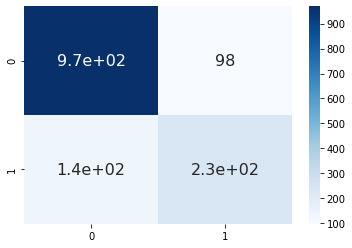

In [14]:
# Predicting the Test set results
y_pred = grid_search.best_estimator_.predict(X_test)
y_pred = (y_pred > 0.5)

# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

import seaborn as sn
sn.heatmap(cm, cmap="Blues", annot=True,annot_kws={"size": 16})

## Get final ANN accuracy over test set

In [15]:
print((cm[0,0] + cm[1,1]) / (cm[0,0] + cm[0,1] + cm[1,0] + cm[1,1]))

0.8346073662265462


In [16]:
sars = pd.read_csv('795813_1365687_bundle_archive/input_sars.csv')

sars.head()

,parent_protein_id,protein_seq,start_position,end_position,peptide_seq,chou_fasman,emini,kolaskar_tongaonkar,parker,isoelectric_point,aromaticity,hydrophobicity,stability,target
0,AAU93319,MFIFLLFLTLTSGSDLDRCTTFDDVQAPNYTQHTSSMRGVYYPDEI...,1,17,MFIFLLFLTLTSGSDLD,0.887,0.040,1.056,-2.159,5.569763,0.116335,-0.061116,33.205116,0
1,AAU93319,MFIFLLFLTLTSGSDLDRCTTFDDVQAPNYTQHTSSMRGVYYPDEI...,1,15,MFIFLLFLTLTSGSD,0.869,0.047,1.056,-2.500,5.569763,0.116335,-0.061116,33.205116,0
2,AAU93319,MFIFLLFLTLTSGSDLDRCTTFDDVQAPNYTQHTSSMRGVYYPDEI...,2,10,FIFLLFLTL,0.621,0.042,1.148,-7.467,5.569763,0.116335,-0.061116,33.205116,0
3,AAU93319,MFIFLLFLTLTSGSDLDRCTTFDDVQAPNYTQHTSSMRGVYYPDEI...,6,20,LFLTLTSGSDLDRCT,1.021,0.230,1.049,0.927,5.569763,0.116335,-0.061116,33.205116,0
4,AAU93319,MFIFLLFLTLTSGSDLDRCTTFDDVQAPNYTQHTSSMRGVYYPDEI...,9,25,TLTSGSDLDRCTTFDDV,1.089,0.627,1.015,3.165,5.569763,0.116335,-0.061116,33.205116,0


In [17]:
X_sars = sars.drop(columns=['parent_protein_id', 'protein_seq', 'peptide_seq', 'target'])
X_sars.head()

,start_position,end_position,chou_fasman,emini,kolaskar_tongaonkar,parker,isoelectric_point,aromaticity,hydrophobicity,stability
0,1,17,0.887,0.040,1.056,-2.159,5.569763,0.116335,-0.061116,33.205116
1,1,15,0.869,0.047,1.056,-2.500,5.569763,0.116335,-0.061116,33.205116
2,2,10,0.621,0.042,1.148,-7.467,5.569763,0.116335,-0.061116,33.205116
3,6,20,1.021,0.230,1.049,0.927,5.569763,0.116335,-0.061116,33.205116
4,9,25,1.089,0.627,1.015,3.165,5.569763,0.116335,-0.061116,33.205116


In [18]:
y_sars = sars['target']
y_sars.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [19]:
X_sars = sc.transform(X_sars)

X_sars

array([[-0.83870898, -0.8229228 , -0.86325008, ...,  1.57599021,
         0.87424551, -0.6293564 ],
       [-0.83870898, -0.82857697, -1.00751794, ...,  1.57599021,
         0.87424551, -0.6293564 ],
       [-0.83588195, -0.8427124 , -2.99520839, ...,  1.57599021,
         0.87424551, -0.6293564 ],
       ...,
       [ 2.65266282,  2.67701074,  0.21074396, ...,  1.57599021,
         0.87424551, -0.6293564 ],
       [ 2.65266282,  2.6628753 ,  0.45119039, ...,  1.57599021,
         0.87424551, -0.6293564 ],
       [ 2.66679793,  2.67701074,  0.26684812, ...,  1.57599021,
         0.87424551, -0.6293564 ]])

In [20]:
# Predicting the Test set results

y_sars_pred = grid_search.best_estimator_.model.predict(X_sars)
y_sars_pred = (y_sars_pred > 0.5)

# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_sars, y_sars_pred)

cm

array([[ 81, 299],
       [ 26, 114]], dtype=int64)

In [21]:
from sklearn.metrics import accuracy_score

print('VALIDATION ACCURACY', accuracy_score(y_sars, y_sars_pred))

VALIDATION ACCURACY 0.375
